In [1]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!apt-get install unrar
!unrar x "/content/drive/MyDrive/dataset_AhmadV2.rar" "/content/"

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/dataset_AhmadV2.rar

Creating    /content/dataset_AhmadV2                                  OK
Creating    /content/dataset_AhmadV2/images                           OK
Extracting  /content/dataset_AhmadV2/images/Original_RGATE_T001_DS_0 (2).TIFF       0%  OK 
Extracting  /content/dataset_AhmadV2/images/Original_RGATE_T001_DS_0.TIFF       0%  OK 
Extracting  /content/dataset_AhmadV2/images/Original_RGATE_T001_DS_1 (2).TIFF       0%  OK 
Extracting  /content/dataset_AhmadV2/images/Original_RGATE_T001_DS_1.TIFF       0%  OK 
Extracting  /content/dataset_AhmadV2/images/Original_RGATE_T001_DS_10 (2).TIFF       0%  OK 
Extracting

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm

In [8]:
IMAGE_PATH = '/content/dataset_AhmadV2/images/'
MASK_PATH = '/content/dataset_AhmadV2/masks/'

In [9]:
n_classes = 2

def create_df(path):
    name = []
    for dirname, _, filenames in os.walk(path):
        for filename in sorted(filenames):  # Sort the filenames
            index_name = (filename.split('.')[0])
            index = index_name
            name.append(index)

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df(IMAGE_PATH)
df_mask = create_df(MASK_PATH)

print('Total Images: ', len(df))
print('Total Images: ', len(df_mask))

Total Images:  609
Total Images:  609


In [10]:
df.head()

,id
0,Original_RGATE_T001_DS_0 (2)
1,Original_RGATE_T001_DS_0
2,Original_RGATE_T001_DS_1 (2)
3,Original_RGATE_T001_DS_1
4,Original_RGATE_T001_DS_10 (2)


In [11]:
df_mask.head()

,id
0,ground_RGATE_T001_DS_0 (2)
1,ground_RGATE_T001_DS_0
2,ground_RGATE_T001_DS_1 (2)
3,ground_RGATE_T001_DS_1
4,ground_RGATE_T001_DS_10 (2)


In [12]:
print(df['id'][0])
print(df_mask['id'][0])

Original_RGATE_T001_DS_0 (2)
ground_RGATE_T001_DS_0 (2)


In [13]:
#split data
X_train, X_test = train_test_split(df['id'].values, test_size=0.1, random_state=19)
#X_train, X_val = train_test_split(X_trainval, test_size=0.15, random_state=19)

# Split data for masks
X_train_mask, X_test_mask = train_test_split(df_mask['id'].values, test_size=0.1, random_state=19)
#X_train_mask, X_val_mask = train_test_split(X_trainval_mask, test_size=0.15, random_state=19)

print('Train Size   : ', len(X_train))
print('Test Size    : ', len(X_test))


print('Train Size for Masks    : ', len(X_train_mask))
print('Test Size for Masks     : ', len(X_test_mask))

Train Size   :  548
Test Size    :  61
Train Size for Masks    :  548
Test Size for Masks     :  61


Image Size (64, 64)
Mask Size (64, 64)


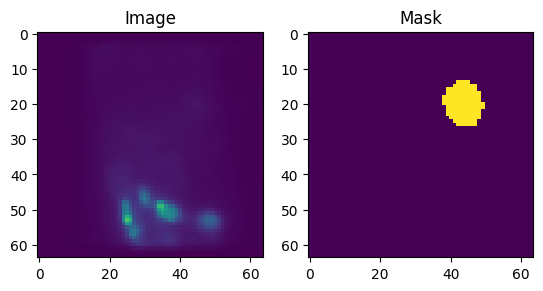

Image Size (64, 64)
Mask Size (64, 64)


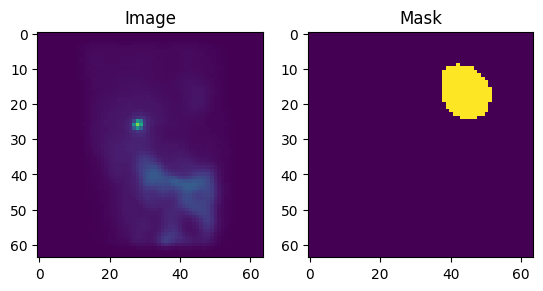

Image Size (64, 64)
Mask Size (64, 64)


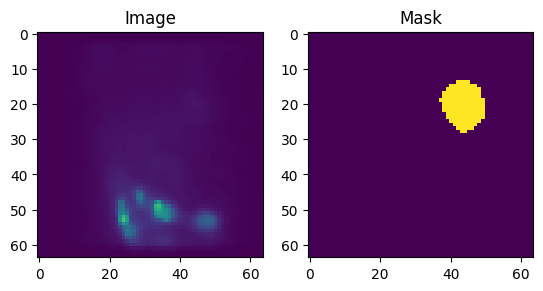

Image Size (64, 64)
Mask Size (64, 64)


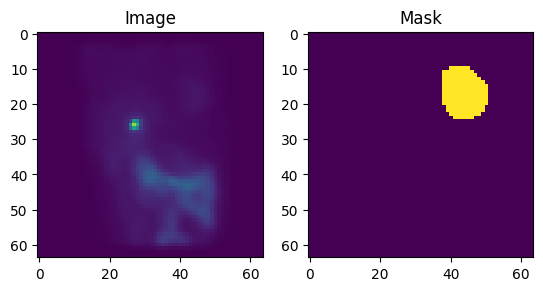

Image Size (64, 64)
Mask Size (64, 64)


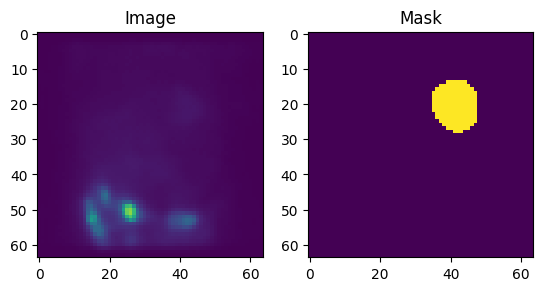

In [14]:
for ind in range(5):
  img = Image.open(IMAGE_PATH + df['id'][ind] + '.TIFF')
  mask = Image.open(MASK_PATH + df_mask['id'][ind] + '.TIFF')
  print('Image Size', np.asarray(img).shape)
  print('Mask Size', np.asarray(mask).shape)

  img = plt.get_cmap('viridis')(img)
  mask= plt.get_cmap('viridis')(mask)
  fig, ax = plt.subplots(1, 2)
  # Display image
  ax[0].imshow(img)
  ax[0].set_title('Image')
  # Display mask
  ax[1].imshow(mask)
  ax[1].set_title('Mask')
  plt.show()

In [15]:
class SpectDataset(Dataset):

    def __init__(self, img_path, mask_path, X, Xmask, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.Xmask=Xmask
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.TIFF')
        #img[45:64, :] = 0
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.Xmask[idx] + '.TIFF', cv2.IMREAD_GRAYSCALE)
        mask = mask / 255
        if img is None or mask is None:
          print(f"Image or mask at index {idx} could not be read.")
          return None
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()

        if self.patches:
            img, mask = self.tiles(img, mask)

        return img, mask

    def tiles(self, img, mask):
          img_patches = img.unfold(1, 32, 32).unfold(2, 32, 32)
          img_patches  = img_patches.contiguous().view(3,-1, 32, 32)
          img_patches = img_patches.permute(1,0,2,3)

          mask_patches = mask.unfold(0, 32, 32).unfold(1, 32, 32)
          mask_patches = mask_patches.contiguous().view(-1, 32, 32)

          return img_patches, mask_patches

In [18]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_train = A.Compose([A.Resize(64, 64, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
                     A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
                     A.GaussNoise()])

t_val = A.Compose([A.Resize(64, 64, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
                   A.GridDistortion(p=0.2)])

#datasets
train_set = SpectDataset(IMAGE_PATH, MASK_PATH, X_train,X_train_mask, mean, std, t_train, patch=False)
print(len(train_set))
val_set = SpectDataset(IMAGE_PATH, MASK_PATH,  X_test,X_test_mask, mean, std, t_val, patch=False)
print(len(val_set))

#dataloader
batch_size= 128
num_workers = 2

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=num_workers)
print(len(train_loader))
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=num_workers)
print(len(val_loader))

548
61
5
1


In [19]:
def double_conv(in_c, out_c):
    conv = nn.Sequential(
        nn.Conv2d(in_c, out_c, kernel_size=3,padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
    )
    return conv

def crop_img(tensor, target_tensor):
    target_size = target_tensor.size()[2]
    tensor_size = tensor.size()[2]
    delta= tensor_size - target_size
    delta = delta//2
    return tensor[:, :, delta:tensor_size - delta, delta:tensor_size - delta]

class UNet(nn.Module):
    def __init__(self, num_channels, num_classes,retain_dim=True):
        super(UNet, self).__init__()

        self.max_pool_2x2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_conv_1 = double_conv(num_channels, out_c=64)
        self.down_conv_2 = double_conv(in_c=64, out_c=128)
        self.down_conv_3 = double_conv(in_c=128, out_c=256)

        self.up_trans_1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2,stride=2)
        self.up_conv_1 = double_conv(256, 128)
        self.up_trans_2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2,stride=2)
        self.up_conv_2 = double_conv(128, 64)

        self.out = nn.Conv2d(
            in_channels=64,
            out_channels = num_classes, # Number of objects to segment
            kernel_size=1,
        )
        self.retain_dim = retain_dim

    def forward(self, image,out_size=(64, 64)):
        # encoder part
        x1 = self.down_conv_1(image)
        x2 = self.max_pool_2x2(x1)
        x3 = self.down_conv_2(x2)
        x4 = self.max_pool_2x2(x3)
        x5 = self.down_conv_3(x4)

        # decoder part
        x = self.up_trans_1(x5)
        y = crop_img(x3, x)
        x = self.up_conv_1(torch.cat([x, y], 1))

        x = self.up_trans_2(x)
        y = crop_img(x1, x)
        x = self.up_conv_2(torch.cat([x, y], 1))

        x = self.out(x)
        if self.retain_dim:
            x = F.interpolate(x, out_size)
        x = F.softmax(x, dim=1)
        return x


In [43]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [44]:
model = UNet(num_classes=2,num_channels=3).to(device)
model

UNet(
  (max_pool_2x2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down_conv_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_3): Sequential(
    (0): Conv2d(128, 256, kernel_s

In [22]:
!pip install torchviz graphviz
import torch
from torchviz import make_dot

  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nv

In [ ]:
# Create a random tensor that matches the input size of your model
# Assuming your model takes input of shape (batch_size, num_channels, height, width)
input_tensor = torch.rand(1, 3, 64, 64)

# Forward pass through the model
output_tensor = model(input_tensor)

# Create a graph of the model
graph = make_dot(output_tensor, params=dict(model.named_parameters()))

# Render the graph using matplotlib
graph.format = 'png'
graph.render('model_architecture')

In [24]:
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=7):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [25]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [46]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
import torch.nn.functional as F
def segmentation_metrics(logits, targets, activation='0-1', eps=1e-7, reduction='mean'):
    ''' This method compute pixel_acc, iou, dice, precision, recall at the same time.
        If the task is mulit-class classification, i.e. logits.shape == [batch, classes, H, W],
        this method outputs the are averaged along the classes.
    '''
    # convert targets to one hot encoding
    if len(targets.shape) == len(logits.shape) - 1:
        if logits.shape[1] == 1:  # binary classification
            y_true = targets[:, None].to(logits.dtype)
        else:  # mulit-class classification
            y_true = F.one_hot(targets, num_classes=logits.shape[1])
            y_true = y_true.to(logits.dtype).to(logits.device)
            y_true = y_true[:, None].transpose(1, -1)[..., 0]
    else:
        y_true = targets.to(logits.dtype).to(logits.device)
    # logits to probability
    if activation == 'softmax':
        y_pred = torch.softmax(logits, dim=1)
    elif activation == 'sigmoid':
        y_pred = torch.sigmoid(logits)
    elif activation == '0-1':
        if logits.shape[1] == 1:  # binary classification
            y_pred = (logits > 0).to(logits.dtype).to(logits.device)
        else:  # mulit-class classification
            y_pred = torch.argmax(logits, axis=1)
            y_pred = F.one_hot(y_pred, num_classes=logits.shape[1])
            y_pred = y_pred.to(logits.dtype).to(logits.device)
            y_pred = y_pred[:, None].transpose(1, -1)[..., 0]

    axis = list(range(2, len(logits.shape)))  # height and width
    # compute true postive, false positive and false negative
    tp = torch.sum(y_true * y_pred, dim=axis)
    fp = torch.sum(y_pred, dim=axis) - tp
    fn = torch.sum(y_true, dim=axis) - tp

    if logits.shape[1] == 1:  # binary classification
        tn = torch.sum((1 - y_true) * (1 - y_pred), dim=axis)
        pixel_acc = (torch.sum(tp, dim=1) + torch.sum(tn, dim=1) + eps) / (torch.sum(tp, dim=1) + torch.sum(fp, dim=1) + torch.sum(fn, dim=1) + torch.sum(tn, dim=1) + eps)
    else:
        pixel_acc = (torch.sum(tp, dim=1) + eps) / (torch.sum(tp, dim=1) + torch.sum(fp, dim=1) + eps)
        tn = torch.sum((1 - y_true) * (1 - y_pred), dim=axis)
    iou = (tp + eps) / (fp + fn + tp + eps)
    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)
    if reduction == 'mean':
        pixel_acc, iou, dice, precision, recall, tp , fn, fp, tn = pixel_acc.mean(), iou.mean(), dice.mean(), precision.mean(), recall.mean(), tp.mean(dim=0), fn.mean(dim=0), fp.mean(dim=0), tn.mean(dim=0)
    return iou, dice, precision, recall,pixel_acc, tp, fp, fn, tn

def compute_confusion_matrix_elements1(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        TP = 0; TN = 0; FP = 0; FN = 0
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                continue
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_class = true_class.float().sum().item()
                sum_true_label = true_label.float().sum().item()

                TP += intersect
                FP += sum_true_class - intersect
                FN += sum_true_label - intersect
        TN = pred_mask.numel() - TP - FP - FN
        return TP, TN, FP, FN
def precision_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        TP = []; TN = []; FP = []; FN = []; precision_per_class=[]
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            TP.append(torch.logical_and(true_class, true_label).sum().item())
            TN.append(torch.logical_and(~true_class, ~true_label).sum().item())
            FP.append(torch.logical_and(true_class, ~true_label).sum().item())
            FN.append(torch.logical_and(~true_class, true_label).sum().item())
            precision_per_class.append(np.nanmean(TP)/(np.nanmean(TP)+np.nanmean(FP)))
        return np.nanmean(precision_per_class)

def precision_score1(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        precision_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                precision_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_class = true_class.float().sum().item()

                precision = (intersect + smooth) / (sum_true_class + smooth)  # Precision formula
                precision_per_class.append(precision)
        return np.nanmean(precision_per_class)

def recall_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        recall_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                recall_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_label = true_label.float().sum().item()

                recall = (intersect + smooth) / (sum_true_label + smooth)  # Recall formula
                recall_per_class.append(recall)
        return np.nanmean(recall_per_class)


def dice_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        dice_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                dice_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()
                summing = (true_class.float() + true_label.float()).sum().item()
                dice = (2. * intersect + smooth) / (summing + smooth)  # Corrected the formula
                dice_per_class.append(dice)
        return np.nanmean(dice_per_class)


import pandas as pd


def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler, patch=False):
    torch.cuda.empty_cache()
    train_losses = []
    test_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0
    train_precision = []; val_precision = []
    train_recall = []; val_recall = []
    train_dice = []; val_dice = []  # Add Dice score
    train_TP=[]; val_TP=[];
    train_TN=[]; val_TN=[];
    train_FP=[]; val_FP=[];
    train_FN=[]; val_FN=[];
    model.to(device)
    fit_time = time.time()
    results = pd.DataFrame(columns=['Epoch', 'iou_score', 'accuracy', 'precision', 'recall', 'dice', 'val_iou_score', 'val_accuracy', 'vprecision', 'vrecall', 'vdice', 'TP', 'TN', 'FP', 'FN', 'TP2', 'TN2', 'FP2', 'FN2','val_TP', 'val_TN', 'val_FP', 'val_FN', 'val_TP2', 'val_TN2', 'val_FP2', 'val_FN2'])
    for e in range(epochs):
        # Initialize a DataFrame to store the results
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0
        jaccard = 0
        dice = 0
        precision = 0
        recall = 0
        TP=0; TN=0; FP=0; FN=0; TP2=0; TN2=0; FP2=0; FN2=0;
        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            if data is None:
              continue
            #training phase
            image_tiles, mask_tiles = data
            if patch:
                bs, n_tiles, c, h, w = image_tiles.size()

                image_tiles = image_tiles.view(-1,c, h, w)
                mask_tiles = mask_tiles.view(-1, h, w)

            image = image_tiles.to(device); mask = mask_tiles.to(device);
            #forward
            output = model(image)
            loss = criterion(output, mask)
            #evaluation metrics
            #iou_score += mIoU(output, mask)
            #accuracy += pixel_accuracy(output, mask)
            #precision += precision_score(output, mask)  # No need to convert to numpy
            #recall += recall_score(output, mask)
            #dice += dice_score(output, mask)  # No need to convert to numpy
            # Inside your training loop
            A,B,C,D,E,F,G,H,I = segmentation_metrics(output,mask)
            iou_score += A
            accuracy += E
            precision += C
            recall += D
            dice += B
            #A,B,C,D = compute_confusion_matrix_elements(output, mask)
            TP += F[0]
            TN += I[0]
            FP += G[0]
            FN += H[0]
            TP2 += F[1]
            TN2 += I[1]
            FP2 += G[1]
            FN2 += H[1]

            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            #step the learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

            running_loss += loss.item()

        else:
            model.eval()
            test_loss = 0
            test_accuracy = 0
            val_iou_score = 0
            vjaccard = 0
            vdice = 0
            vprecision = 0
            vrecall = 0
            v_TP=0; v_TN=0; v_FP=0; v_FN=0; v_TP2=0; v_TN2=0; v_FP2=0; v_FN2=0;
            #validation loop
            with torch.no_grad():
                for i, data in enumerate(tqdm(val_loader)):
                    #reshape to 9 patches from single image, delete batch size
                    image_tiles, mask_tiles = data

                    if patch:
                        bs, n_tiles, c, h, w = image_tiles.size()

                        image_tiles = image_tiles.view(-1,c, h, w)
                        mask_tiles = mask_tiles.view(-1, h, w)

                    image = image_tiles.to(device); mask = mask_tiles.to(device);
                    output = model(image)
                    #evaluation metrics
                    #val_iou_score +=  mIoU(output, mask)
                    #test_accuracy += pixel_accuracy(output, mask)
                    #vprecision += precision_score(output, mask)
                    #vrecall += recall_score(output, mask)
                    #vdice += dice_score(output, mask)  # No need to convert to numpy
                    A,B,C,D,E,F,G,H,I = segmentation_metrics(output,mask)
                    val_iou_score +=  A
                    test_accuracy += E
                    vprecision += C
                    vrecall += D
                    vdice += B

                    #A,B,C,D = compute_confusion_matrix_elements(output, mask)
                    v_TP += F[0]
                    v_TN += I[0]
                    v_FP += G[0]
                    v_FN += H[0]
                    v_TP2 += F[1]
                    v_TN2 += I[1]
                    v_FP2 += G[1]
                    v_FN2 += H[1]
                    #loss
                    loss = criterion(output, mask)
                    test_loss += loss.item()

            #calculatio mean for each batch
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))


            if min_loss > (test_loss/len(val_loader)):
                print('Loss Decreasing.. {:.3f} >> {:.3f} '.format(min_loss, (test_loss/len(val_loader))))
                min_loss = (test_loss/len(val_loader))
                decrease += 1
                if decrease % 5 == 0:
                    print('saving model...')
                    torch.save(model, 'Unet-Mobilenet_v2_mIoU-{:.3f}.pt'.format(val_iou_score/len(val_loader)))


            if (test_loss/len(val_loader)) > min_loss:
                not_improve += 1
                min_loss = (test_loss/len(val_loader))
                print(f'Loss Not Decrease for {not_improve} time')
                if not_improve == 250:
                    print('Loss not decrease for 200 times, Stop Training')
                    break

            #iou
            val_iou.append(val_iou_score/len(val_loader))
            train_iou.append(iou_score/len(train_loader))
            train_acc.append(accuracy/len(train_loader))
            val_acc.append(test_accuracy/ len(val_loader))
            train_precision.append(precision/len(train_loader))  # Add Jaccard score
            train_recall.append(recall/len(train_loader))
            train_dice.append(dice/len(train_loader))  # Add Dice score
            val_precision.append(vprecision/len(val_loader))  # Add Jaccard score
            val_recall.append(vrecall/len(val_loader))
            val_dice.append(vdice/len(val_loader))  # Add Dice score

            val_TP.append(v_TP/len(val_loader))
            val_TN.append(v_TN/len(val_loader))
            val_FP.append(v_FP/len(val_loader))
            val_FN.append(v_FN/len(val_loader))
            train_TP.append(TP/len(train_loader))
            train_TN.append(TN/len(train_loader))
            train_FP.append(FP/len(train_loader))
            train_FN.append(FN/len(train_loader))

            print("Epoch:{}/{}..".format(e+1, epochs),
                  "Train Loss: {:.3f}..".format(running_loss/len(train_loader)),
                  "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                  "Train mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                  "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                  "Train Dice:{:.3f}..".format(dice/len(train_loader)),
                  "Val Dice: {:.3f}..".format(vdice/len(val_loader)),
                  "Train Precision:{:.3f}..".format(precision/len(train_loader)),
                  "Val Precision: {:.3f}..".format(vprecision/len(val_loader)),
                  "Train Recall:{:.3f}..".format(recall/len(train_loader)),
                  "Val Recall: {:.3f}..".format(vrecall/len(val_loader)),

                  "Train TP:{:.3f}..".format(TP/len(train_loader)),
                  "Train TP2:{:.3f}..".format(TP2/len(train_loader)),
                  "Train TN:{:.3f}..".format(TN/len(train_loader)),
                  "Train TN2:{:.3f}..".format(TN2/len(train_loader)),
                  "Train FP:{:.3f}..".format(FP/len(train_loader)),
                  "Train FP2:{:.3f}..".format(FP2/len(train_loader)),
                  "Train FN:{:.3f}..".format(FN/len(train_loader)),
                  "Train FN2:{:.3f}..".format(FN2/len(train_loader)),


                  "Val TP: {:.3f}..".format(v_TP/len(val_loader)),
                  "Val TN: {:.3f}..".format(v_TN/len(val_loader)),
                  "Val FP: {:.3f}..".format(v_FP/len(val_loader)),
                  "Val FN: {:.3f}..".format(v_FN/len(val_loader)),


                  "Train Accuracy:{:.3f}..".format(accuracy/len(train_loader)),
                  "Val Accuracy:{:.3f}..".format(test_accuracy/len(val_loader)),
                  "Time: {:.2f}m".format((time.time()-since)/60))
            results = results._append({'Epoch': epoch,
                                    'iou_score': (iou_score.item())/len(train_loader),
                                    'accuracy': (accuracy.item())/len(train_loader),
                                    'precision': (precision.item())/len(train_loader),
                                    'recall': (recall.item())/len(train_loader),
                                    'dice': (dice.item())/len(train_loader),
                                    'val_iou_score': (val_iou_score.item())/len(val_loader),
                                    'val_accuracy': (test_accuracy.item())/len(val_loader),
                                    'vprecision': (vprecision.item())/len(val_loader),
                                    'vrecall': (vrecall.item())/len(val_loader),
                                    'vdice': (vdice.item())/len(val_loader),
                                    'TP': (TP.item())/len(train_loader),
                                    'TN': (TN.item())/len(train_loader),
                                    'FP': (FP.item())/len(train_loader),
                                    'FN': (FN.item())/len(train_loader),
                                    'TP2':(TP2.item())/len(train_loader),
                                    'TN2':(TN2.item())/len(train_loader),
                                    'FP2':(FP2.item())/len(train_loader),
                                    'FN2':(FN2.item())/len(train_loader),
                                    'val_TP': (v_TP.item())/len(val_loader),
                                    'val_TN': (v_TN.item())/len(val_loader),
                                    'val_FP': (v_FP.item())/len(val_loader),
                                    'val_FN': (v_FN.item())/len(val_loader),
                                    'val_TP2':(v_TP2.item())/len(val_loader),
                                    'val_TN2':(v_TN2.item())/len(val_loader),
                                    'val_FP2':(v_FP2.item())/len(val_loader),
                                    'val_FN2':(v_FN2.item())/len(val_loader)
                                }, ignore_index=True)

    # Save the results to an Excel file
    results.to_excel('training_results.xlsx', index=False)
    history = {'train_loss' : train_losses, 'val_loss': test_losses,
               'train_miou' :train_iou, 'val_miou':val_iou,
               'train_Precision' :train_precision, 'val_Precision':val_precision,
               'train_recall' :train_recall, 'val_recall':val_recall,
               'train_dice' :train_dice, 'val_dice':val_dice,
               'train_acc' :train_acc, 'val_acc':val_acc,
               'lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history

In [47]:
# channels first format, get height, width axis
def identify_axis(shape):
    return list(range(2, len(shape)))

# convert to one hot encoding
def convert_prob(y_pred, y_true, activation):
    # convert to [batch, classes, ...]
    if len(y_true.shape) == len(y_pred.shape) - 1:
        if y_pred.shape[1] == 1: # binary classification
            y_true = y_true[:, None].to(y_pred.dtype)
        else:                    # mulit-class classification
            y_true = F.one_hot(y_true, num_classes=y_pred.shape[1])
            y_true = y_true.to(y_pred.dtype).to(y_pred.device)
            y_true = y_true[:, None].transpose(1, -1)[..., 0]
    if activation == 'softmax':
        y_pred = torch.softmax(y_pred, dim=1)
    elif activation == 'sigmoid':
        y_pred = torch.sigmoid(y_pred)
    return y_pred, y_true

def apply_reduction(tensor, reduction):
    if reduction == 'mean':
        tensor = torch.mean(tensor)
    elif reduction == 'sum':
        tensor = torch.sum(tensor)
    elif reduction == 'none':
        pass
    else:
        raise ValueError(f'Invalid reduction: {reduction}.')
    return tensor
def dice_coefficient(logits, targets, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    """The Dice similarity coefficient, also known as the Sørensen–Dice index or simply Dice coefficient, is a statistical tool which measures the similarity between two sets of data.
    Parameters
    ----------
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    y_pred, y_true = convert_prob(logits, targets, activation)
    axis = identify_axis(y_true.shape)

    intersection = (y_pred * y_true).sum(dim=axis)
    dice_class = (2.*intersection + smooth) / (y_pred.sum(dim=axis) + y_true.sum(dim=axis) + smooth)

    if reduction == 'none':
        return dice_class
    else: # Average class scores
        return apply_reduction(dice_class, reduction)
class DiceLoss(nn.Module):
    """Dice loss originates from Sørensen–Dice coefficient, which is a statistic developed in 1940s to gauge the similarity between two samples.

    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.5
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    def __init__(self, smooth = 0.000001, activation='sigmoid', reduction='mean'):
        super().__init__()
        assert activation in ['sigmoid', 'softmax']
        assert reduction in ['none', 'mean', 'sum']
        self.smooth = smooth
        self.activation = activation
        self.reduction = reduction

    def forward(self, logits, targets):
        return dice_loss(logits, targets, smooth=self.smooth,
                         activation=self.activation, reduction=self.reduction)

def dice_loss(logits, targets, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    dice_class = dice_coefficient(logits, targets, smooth=smooth,
                                  activation=activation, reduction='none')
    dice_class = 1 - dice_class
    return apply_reduction(dice_class, reduction)

################################
#       Tversky index       #
################################
def tversky_index(logits, targets, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    """Generalization of the Sørensen–Dice coefficient and the Jaccard index.
    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.7
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    y_pred, y_true = convert_prob(logits, targets, activation)
    axis = identify_axis(y_true.shape)
    # Calculate true positives (tp), false negatives (fn) and false positives (fp)
    tp = torch.sum(y_true * y_pred, dim=axis)
    fn = torch.sum(y_true * (1-y_pred), dim=axis)
    fp = torch.sum((1-y_true) * y_pred, dim=axis)
    tversky_class = (tp + smooth) / (tp + delta*fn + (1-delta)*fp + smooth)

    if reduction == 'none':
        return tversky_class
    else: # Average class scores
        return apply_reduction(tversky_class, reduction)
class TverskyLoss(nn.Module):
    """Tversky loss function for image segmentation using 3D fully convolutional deep networks
	Link: https://arxiv.org/abs/1706.05721
    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.7
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    def __init__(self, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
        super().__init__()
        assert activation in ['sigmoid', 'softmax']
        assert reduction in ['none', 'mean', 'sum']
        self.delta = delta
        self.smooth = smooth
        self.activation = activation
        self.reduction = reduction

    def forward(self, logits, targets):
        return tversky_loss(logits, targets, delta=self.delta, smooth=self.smooth,
                            activation=self.activation, reduction=self.reduction)

def tversky_loss(logits, targets, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    tversky_class = tversky_index(logits, targets, delta=delta, smooth=smooth,
                                  activation=activation, reduction='none')
    tversky_class = 1 - tversky_class
    return apply_reduction(tversky_class, reduction)

# CrossEntropyLoss loss function

In [48]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 0.696 
Epoch:1/150.. Train Loss: 0.742.. Val Loss: 0.696.. Train mIoU:0.196.. Val mIoU: 0.061.. Train Dice:0.294.. Val Dice: 0.115.. Train Precision:0.493.. Val Precision: 0.523.. Train Recall:0.463.. Val Recall: 0.534.. Train TP:1407.813.. Train TP2:104.723.. Train TN:104.723.. Train TN2:1407.813.. Train FP:80.366.. Train FP2:2503.098.. Train FN:2503.098.. Train FN2:80.366.. Val TP: 286.770.. Val TN: 188.525.. Val FP: 1.262.. Val FN: 3619.442.. Train Accuracy:0.369.. Val Accuracy:0.116.. Time: 0.03m


<ipython-input-46-0c94c4132b9a>:373: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = results._append({'Epoch': epoch,


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.696 >> 0.690 
Epoch:2/150.. Train Loss: 0.736.. Val Loss: 0.690.. Train mIoU:0.218.. Val mIoU: 0.413.. Train Dice:0.319.. Val Dice: 0.453.. Train Precision:0.496.. Val Precision: 0.474.. Train Recall:0.480.. Val Recall: 0.433.. Train TP:1580.730.. Train TP2:102.597.. Train TN:102.597.. Train TN2:1580.730.. Train FP:83.179.. Train FP2:2329.495.. Train FN:2329.495.. Train FN2:83.179.. Val TP: 3386.180.. Val TN: 0.180.. Val FP: 186.705.. Val FN: 522.934.. Train Accuracy:0.411.. Val Accuracy:0.827.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.690 >> 0.687 
Epoch:3/150.. Train Loss: 0.731.. Val Loss: 0.687.. Train mIoU:0.240.. Val mIoU: 0.402.. Train Dice:0.341.. Val Dice: 0.446.. Train Precision:0.498.. Val Precision: 0.473.. Train Recall:0.488.. Val Recall: 0.422.. Train TP:1752.139.. Train TP2:99.085.. Train TN:99.085.. Train TN2:1752.139.. Train FP:89.518.. Train FP2:2155.258.. Train FN:2155.258.. Train FN2:89.518.. Val TP: 3290.164.. Val TN: 0.311.. Val FP: 186.738.. Val FN: 618.787.. Train Accuracy:0.452.. Val Accuracy:0.803.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.687 >> 0.686 
saving model...
Epoch:4/150.. Train Loss: 0.724.. Val Loss: 0.686.. Train mIoU:0.265.. Val mIoU: 0.394.. Train Dice:0.363.. Val Dice: 0.447.. Train Precision:0.499.. Val Precision: 0.479.. Train Recall:0.494.. Val Recall: 0.435.. Train TP:1961.040.. Train TP2:89.104.. Train TN:89.104.. Train TN2:1961.040.. Train FP:96.463.. Train FP2:1949.394.. Train FN:1949.394.. Train FN2:96.463.. Val TP: 3176.065.. Val TN: 10.180.. Val FP: 179.229.. Val FN: 730.525.. Train Accuracy:0.501.. Val Accuracy:0.778.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:5/150.. Train Loss: 0.717.. Val Loss: 0.686.. Train mIoU:0.285.. Val mIoU: 0.390.. Train Dice:0.379.. Val Dice: 0.450.. Train Precision:0.498.. Val Precision: 0.486.. Train Recall:0.494.. Val Recall: 0.456.. Train TP:2134.395.. Train TP2:82.463.. Train TN:82.463.. Train TN2:2134.395.. Train FP:105.137.. Train FP2:1774.005.. Train FN:1774.005.. Train FN2:105.137.. Val TP: 3105.475.. Val TN: 20.885.. Val FP: 164.738.. Val FN: 804.902.. Train Accuracy:0.541.. Val Accuracy:0.763.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:6/150.. Train Loss: 0.711.. Val Loss: 0.687.. Train mIoU:0.304.. Val mIoU: 0.386.. Train Dice:0.396.. Val Dice: 0.450.. Train Precision:0.500.. Val Precision: 0.488.. Train Recall:0.503.. Val Recall: 0.467.. Train TP:2281.338.. Train TP2:78.462.. Train TN:78.462.. Train TN2:2281.338.. Train FP:107.357.. Train FP2:1628.843.. Train FN:1628.843.. Train FN2:107.357.. Val TP: 3050.492.. Val TN: 26.689.. Val FP: 159.885.. Val FN: 858.934.. Train Accuracy:0.576.. Val Accuracy:0.751.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.687 >> 0.679 
Epoch:7/150.. Train Loss: 0.703.. Val Loss: 0.679.. Train mIoU:0.322.. Val mIoU: 0.391.. Train Dice:0.410.. Val Dice: 0.455.. Train Precision:0.500.. Val Precision: 0.490.. Train Recall:0.508.. Val Recall: 0.475.. Train TP:2436.119.. Train TP2:72.353.. Train TN:72.353.. Train TN2:2436.119.. Train FP:113.609.. Train FP2:1473.919.. Train FN:1473.919.. Train FN2:113.609.. Val TP: 3078.180.. Val TN: 29.148.. Val FP: 161.115.. Val FN: 827.557.. Train Accuracy:0.612.. Val Accuracy:0.759.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.679 >> 0.669 
Epoch:8/150.. Train Loss: 0.693.. Val Loss: 0.669.. Train mIoU:0.344.. Val mIoU: 0.397.. Train Dice:0.426.. Val Dice: 0.461.. Train Precision:0.501.. Val Precision: 0.493.. Train Recall:0.513.. Val Recall: 0.487.. Train TP:2618.412.. Train TP2:64.449.. Train TN:64.449.. Train TN2:2618.412.. Train FP:119.464.. Train FP2:1293.676.. Train FN:1293.676.. Train FN2:119.464.. Val TP: 3111.213.. Val TN: 31.705.. Val FP: 157.131.. Val FN: 795.951.. Train Accuracy:0.655.. Val Accuracy:0.767.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.669 >> 0.660 
Epoch:9/150.. Train Loss: 0.685.. Val Loss: 0.660.. Train mIoU:0.364.. Val mIoU: 0.407.. Train Dice:0.441.. Val Dice: 0.468.. Train Precision:0.502.. Val Precision: 0.494.. Train Recall:0.523.. Val Recall: 0.497.. Train TP:2773.493.. Train TP2:62.379.. Train TN:62.379.. Train TN2:2773.493.. Train FP:123.467.. Train FP2:1136.661.. Train FN:1136.661.. Train FN2:123.467.. Val TP: 3179.000.. Val TN: 31.262.. Val FP: 161.377.. Val FN: 724.361.. Train Accuracy:0.692.. Val Accuracy:0.784.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.660 >> 0.651 
Epoch:10/150.. Train Loss: 0.674.. Val Loss: 0.651.. Train mIoU:0.387.. Val mIoU: 0.417.. Train Dice:0.458.. Val Dice: 0.476.. Train Precision:0.503.. Val Precision: 0.497.. Train Recall:0.526.. Val Recall: 0.504.. Train TP:2958.853.. Train TP2:54.233.. Train TN:54.233.. Train TN2:2958.853.. Train FP:131.389.. Train FP2:951.526.. Train FN:951.526.. Train FN2:131.389.. Val TP: 3254.279.. Val TN: 30.590.. Val FP: 156.377.. Val FN: 654.754.. Train Accuracy:0.736.. Val Accuracy:0.802.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.651 >> 0.641 
saving model...
Epoch:11/150.. Train Loss: 0.663.. Val Loss: 0.641.. Train mIoU:0.399.. Val mIoU: 0.422.. Train Dice:0.466.. Val Dice: 0.477.. Train Precision:0.502.. Val Precision: 0.495.. Train Recall:0.522.. Val Recall: 0.499.. Train TP:3068.480.. Train TP2:48.210.. Train TN:48.210.. Train TN2:3068.480.. Train FP:137.167.. Train FP2:842.143.. Train FN:842.143.. Train FN2:137.167.. Val TP: 3302.770.. Val TN: 26.738.. Val FP: 160.984.. Val FN: 605.508.. Train Accuracy:0.761.. Val Accuracy:0.813.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.641 >> 0.632 
Epoch:12/150.. Train Loss: 0.650.. Val Loss: 0.632.. Train mIoU:0.418.. Val mIoU: 0.429.. Train Dice:0.477.. Val Dice: 0.481.. Train Precision:0.501.. Val Precision: 0.496.. Train Recall:0.521.. Val Recall: 0.502.. Train TP:3242.585.. Train TP2:38.660.. Train TN:38.660.. Train TN2:3242.585.. Train FP:147.007.. Train FP2:667.748.. Train FN:667.748.. Train FN2:147.007.. Val TP: 3364.934.. Val TN: 24.262.. Val FP: 161.770.. Val FN: 545.033.. Train Accuracy:0.801.. Val Accuracy:0.827.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.632 >> 0.622 
Epoch:13/150.. Train Loss: 0.636.. Val Loss: 0.622.. Train mIoU:0.429.. Val mIoU: 0.435.. Train Dice:0.480.. Val Dice: 0.485.. Train Precision:0.497.. Val Precision: 0.495.. Train Recall:0.508.. Val Recall: 0.500.. Train TP:3367.348.. Train TP2:28.411.. Train TN:28.411.. Train TN2:3367.348.. Train FP:160.036.. Train FP2:540.205.. Train FN:540.205.. Train FN2:160.036.. Val TP: 3427.475.. Val TN: 21.246.. Val FP: 168.525.. Val FN: 478.754.. Train Accuracy:0.829.. Val Accuracy:0.842.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.622 >> 0.609 
Epoch:14/150.. Train Loss: 0.623.. Val Loss: 0.609.. Train mIoU:0.432.. Val mIoU: 0.436.. Train Dice:0.475.. Val Dice: 0.481.. Train Precision:0.491.. Val Precision: 0.491.. Train Recall:0.491.. Val Recall: 0.489.. Train TP:3441.035.. Train TP2:18.694.. Train TN:18.694.. Train TN2:3441.035.. Train FP:166.857.. Train FP2:469.413.. Train FN:469.413.. Train FN2:166.857.. Val TP: 3468.770.. Val TN: 15.066.. Val FP: 172.377.. Val FN: 439.787.. Train Accuracy:0.845.. Val Accuracy:0.851.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.609 >> 0.596 
Epoch:15/150.. Train Loss: 0.609.. Val Loss: 0.596.. Train mIoU:0.435.. Val mIoU: 0.435.. Train Dice:0.473.. Val Dice: 0.473.. Train Precision:0.487.. Val Precision: 0.484.. Train Recall:0.480.. Val Recall: 0.472.. Train TP:3500.429.. Train TP2:12.735.. Train TN:12.735.. Train TN2:3500.429.. Train FP:174.745.. Train FP2:408.091.. Train FN:408.091.. Train FN2:174.745.. Val TP: 3509.934.. Val TN: 7.852.. Val FP: 177.967.. Val FN: 400.246.. Train Accuracy:0.858.. Val Accuracy:0.859.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.596 >> 0.582 
saving model...
Epoch:16/150.. Train Loss: 0.594.. Val Loss: 0.582.. Train mIoU:0.439.. Val mIoU: 0.439.. Train Dice:0.473.. Val Dice: 0.471.. Train Precision:0.486.. Val Precision: 0.480.. Train Recall:0.482.. Val Recall: 0.467.. Train TP:3546.494.. Train TP2:10.882.. Train TN:10.882.. Train TN2:3546.494.. Train FP:174.166.. Train FP2:364.458.. Train FN:364.458.. Train FN2:174.166.. Val TP: 3564.246.. Val TN: 3.820.. Val FP: 183.918.. Val FN: 344.016.. Train Accuracy:0.869.. Val Accuracy:0.871.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.582 >> 0.565 
Epoch:17/150.. Train Loss: 0.583.. Val Loss: 0.565.. Train mIoU:0.444.. Val mIoU: 0.446.. Train Dice:0.475.. Val Dice: 0.476.. Train Precision:0.488.. Val Precision: 0.481.. Train Recall:0.487.. Val Recall: 0.473.. Train TP:3598.001.. Train TP2:9.435.. Train TN:9.435.. Train TN2:3598.001.. Train FP:178.447.. Train FP2:310.117.. Train FN:310.117.. Train FN2:178.447.. Val TP: 3627.262.. Val TN: 3.180.. Val FP: 183.393.. Val FN: 282.164.. Train Accuracy:0.881.. Val Accuracy:0.886.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.565 >> 0.553 
Epoch:18/150.. Train Loss: 0.566.. Val Loss: 0.553.. Train mIoU:0.452.. Val mIoU: 0.452.. Train Dice:0.477.. Val Dice: 0.477.. Train Precision:0.494.. Val Precision: 0.479.. Train Recall:0.481.. Val Recall: 0.476.. Train TP:3677.818.. Train TP2:4.612.. Train TN:4.612.. Train TN2:3677.818.. Train FP:180.484.. Train FP2:233.086.. Train FN:233.086.. Train FN2:180.484.. Val TP: 3683.180.. Val TN: 1.836.. Val FP: 187.016.. Val FN: 223.967.. Train Accuracy:0.899.. Val Accuracy:0.900.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.553 >> 0.538 
Epoch:19/150.. Train Loss: 0.556.. Val Loss: 0.538.. Train mIoU:0.458.. Val mIoU: 0.463.. Train Dice:0.480.. Val Dice: 0.483.. Train Precision:0.499.. Val Precision: 0.481.. Train Recall:0.486.. Val Recall: 0.486.. Train TP:3731.264.. Train TP2:3.676.. Train TN:3.676.. Train TN2:3731.264.. Train FP:183.913.. Train FP2:177.147.. Train FN:177.147.. Train FN2:183.913.. Val TP: 3772.820.. Val TN: 1.361.. Val FP: 185.229.. Val FN: 136.590.. Train Accuracy:0.912.. Val Accuracy:0.921.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.538 >> 0.532 
Epoch:20/150.. Train Loss: 0.541.. Val Loss: 0.532.. Train mIoU:0.462.. Val mIoU: 0.467.. Train Dice:0.482.. Val Dice: 0.486.. Train Precision:0.508.. Val Precision: 0.482.. Train Recall:0.491.. Val Recall: 0.491.. Train TP:3761.814.. Train TP2:3.688.. Train TN:3.688.. Train TN2:3761.814.. Train FP:182.104.. Train FP2:148.395.. Train FN:148.395.. Train FN2:182.104.. Val TP: 3803.393.. Val TN: 1.525.. Val FP: 186.311.. Val FN: 104.770.. Train Accuracy:0.919.. Val Accuracy:0.929.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.532 >> 0.516 
saving model...
Epoch:21/150.. Train Loss: 0.535.. Val Loss: 0.516.. Train mIoU:0.462.. Val mIoU: 0.468.. Train Dice:0.481.. Val Dice: 0.486.. Train Precision:0.503.. Val Precision: 0.482.. Train Recall:0.488.. Val Recall: 0.492.. Train TP:3775.553.. Train TP2:1.706.. Train TN:1.706.. Train TN2:3775.553.. Train FP:184.598.. Train FP2:134.143.. Train FN:134.143.. Train FN2:184.598.. Val TP: 3824.180.. Val TN: 0.885.. Val FP: 188.721.. Val FN: 82.213.. Train Accuracy:0.922.. Val Accuracy:0.934.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.516 >> 0.506 
Epoch:22/150.. Train Loss: 0.526.. Val Loss: 0.506.. Train mIoU:0.462.. Val mIoU: 0.473.. Train Dice:0.481.. Val Dice: 0.491.. Train Precision:0.521.. Val Precision: 0.489.. Train Recall:0.487.. Val Recall: 0.496.. Train TP:3775.745.. Train TP2:1.752.. Train TN:1.752.. Train TN2:3775.745.. Train FP:184.655.. Train FP2:133.848.. Train FN:133.848.. Train FN2:184.655.. Val TP: 3843.197.. Val TN: 1.754.. Val FP: 184.590.. Val FN: 66.459.. Train Accuracy:0.922.. Val Accuracy:0.939.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.506 >> 0.503 
Epoch:23/150.. Train Loss: 0.517.. Val Loss: 0.503.. Train mIoU:0.465.. Val mIoU: 0.474.. Train Dice:0.482.. Val Dice: 0.492.. Train Precision:0.523.. Val Precision: 0.491.. Train Recall:0.490.. Val Recall: 0.497.. Train TP:3802.941.. Train TP2:1.284.. Train TN:1.284.. Train TN2:3802.941.. Train FP:183.376.. Train FP2:108.399.. Train FN:108.399.. Train FN2:183.376.. Val TP: 3847.098.. Val TN: 1.918.. Val FP: 185.393.. Val FN: 61.590.. Train Accuracy:0.929.. Val Accuracy:0.940.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.503 >> 0.495 
Epoch:24/150.. Train Loss: 0.509.. Val Loss: 0.495.. Train mIoU:0.467.. Val mIoU: 0.471.. Train Dice:0.483.. Val Dice: 0.486.. Train Precision:0.549.. Val Precision: 0.479.. Train Recall:0.490.. Val Recall: 0.493.. Train TP:3825.965.. Train TP2:0.383.. Train TN:0.383.. Train TN2:3825.965.. Train FP:184.597.. Train FP2:85.055.. Train FN:85.055.. Train FN2:184.597.. Val TP: 3852.688.. Val TN: 0.246.. Val FP: 182.869.. Val FN: 60.197.. Train Accuracy:0.934.. Val Accuracy:0.941.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 3 time
Epoch:25/150.. Train Loss: 0.503.. Val Loss: 0.498.. Train mIoU:0.470.. Val mIoU: 0.474.. Train Dice:0.485.. Val Dice: 0.487.. Train Precision:0.592.. Val Precision: 0.478.. Train Recall:0.493.. Val Recall: 0.497.. Train TP:3849.866.. Train TP2:0.384.. Train TN:0.384.. Train TN2:3849.866.. Train FP:184.056.. Train FP2:61.694.. Train FN:61.694.. Train FN2:184.056.. Val TP: 3882.098.. Val TN: 0.066.. Val FP: 191.902.. Val FN: 21.934.. Train Accuracy:0.940.. Val Accuracy:0.948.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.498 >> 0.483 
Epoch:26/150.. Train Loss: 0.498.. Val Loss: 0.483.. Train mIoU:0.472.. Val mIoU: 0.478.. Train Dice:0.486.. Val Dice: 0.489.. Train Precision:0.868.. Val Precision: 0.920.. Train Recall:0.496.. Val Recall: 0.500.. Train TP:3865.782.. Train TP2:0.543.. Train TN:0.543.. Train TN2:3865.782.. Train FP:188.363.. Train FP2:41.312.. Train FN:41.312.. Train FN2:188.363.. Val TP: 3911.016.. Val TN: 0.082.. Val FP: 184.656.. Val FN: 0.246.. Train Accuracy:0.944.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.483 >> 0.478 
saving model...
Epoch:27/150.. Train Loss: 0.495.. Val Loss: 0.478.. Train mIoU:0.473.. Val mIoU: 0.478.. Train Dice:0.486.. Val Dice: 0.490.. Train Precision:0.905.. Val Precision: 0.912.. Train Recall:0.496.. Val Recall: 0.501.. Train TP:3871.556.. Train TP2:0.244.. Train TN:0.244.. Train TN2:3871.556.. Train FP:185.854.. Train FP2:38.347.. Train FN:38.347.. Train FN2:185.854.. Val TP: 3908.279.. Val TN: 0.328.. Val FP: 187.131.. Val FN: 0.262.. Train Accuracy:0.945.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 4 time
Epoch:28/150.. Train Loss: 0.491.. Val Loss: 0.486.. Train mIoU:0.474.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.489.. Train Precision:0.890.. Val Precision: 0.944.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3871.891.. Train TP2:1.154.. Train TN:1.154.. Train TN2:3871.891.. Train FP:185.430.. Train FP2:37.526.. Train FN:37.526.. Train FN2:185.430.. Val TP: 3908.246.. Val TN: 0.115.. Val FP: 187.541.. Val FN: 0.098.. Train Accuracy:0.946.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.486 >> 0.476 
Epoch:29/150.. Train Loss: 0.490.. Val Loss: 0.476.. Train mIoU:0.473.. Val mIoU: 0.478.. Train Dice:0.486.. Val Dice: 0.490.. Train Precision:0.902.. Val Precision: 0.944.. Train Recall:0.497.. Val Recall: 0.501.. Train TP:3869.071.. Train TP2:0.835.. Train TN:0.835.. Train TN2:3869.071.. Train FP:187.696.. Train FP2:38.398.. Train FN:38.398.. Train FN2:187.696.. Val TP: 3907.672.. Val TN: 0.230.. Val FP: 188.016.. Val FN: 0.082.. Train Accuracy:0.945.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.476 >> 0.474 
Epoch:30/150.. Train Loss: 0.487.. Val Loss: 0.474.. Train mIoU:0.477.. Val mIoU: 0.478.. Train Dice:0.494.. Val Dice: 0.490.. Train Precision:0.875.. Val Precision: 0.936.. Train Recall:0.502.. Val Recall: 0.501.. Train TP:3865.358.. Train TP2:3.181.. Train TN:3.181.. Train TN2:3865.358.. Train FP:182.166.. Train FP2:45.295.. Train FN:45.295.. Train FN2:182.166.. Val TP: 3906.065.. Val TN: 0.393.. Val FP: 189.361.. Val FN: 0.180.. Train Accuracy:0.944.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.474 >> 0.472 
Epoch:31/150.. Train Loss: 0.484.. Val Loss: 0.472.. Train mIoU:0.473.. Val mIoU: 0.479.. Train Dice:0.486.. Val Dice: 0.493.. Train Precision:0.891.. Val Precision: 0.903.. Train Recall:0.496.. Val Recall: 0.503.. Train TP:3872.702.. Train TP2:0.100.. Train TN:0.100.. Train TN2:3872.702.. Train FP:189.807.. Train FP2:33.391.. Train FN:33.391.. Train FN2:189.807.. Val TP: 3904.115.. Val TN: 0.934.. Val FP: 190.361.. Val FN: 0.590.. Train Accuracy:0.946.. Val Accuracy:0.953.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.472 >> 0.467 
Epoch:32/150.. Train Loss: 0.479.. Val Loss: 0.467.. Train mIoU:0.475.. Val mIoU: 0.488.. Train Dice:0.489.. Val Dice: 0.508.. Train Precision:0.893.. Val Precision: 0.877.. Train Recall:0.498.. Val Recall: 0.511.. Train TP:3882.508.. Train TP2:0.453.. Train TN:0.453.. Train TN2:3882.508.. Train FP:185.711.. Train FP2:27.328.. Train FN:27.328.. Train FN2:185.711.. Val TP: 3904.049.. Val TN: 3.852.. Val FP: 185.639.. Val FN: 2.459.. Train Accuracy:0.948.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7ae1894bfac0>
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1462, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.467 >> 0.463 
saving model...
Epoch:33/150.. Train Loss: 0.478.. Val Loss: 0.463.. Train mIoU:0.485.. Val mIoU: 0.487.. Train Dice:0.505.. Val Dice: 0.506.. Train Precision:0.839.. Val Precision: 0.894.. Train Recall:0.508.. Val Recall: 0.510.. Train TP:3879.225.. Train TP2:4.532.. Train TN:4.532.. Train TN2:3879.225.. Train FP:183.673.. Train FP2:28.571.. Train FN:28.571.. Train FN2:183.673.. Val TP: 3903.770.. Val TN: 3.508.. Val FP: 186.590.. Val FN: 2.131.. Train Accuracy:0.948.. Val Accuracy:0.954.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.463 >> 0.462 
Epoch:34/150.. Train Loss: 0.479.. Val Loss: 0.462.. Train mIoU:0.471.. Val mIoU: 0.481.. Train Dice:0.485.. Val Dice: 0.496.. Train Precision:0.892.. Val Precision: 0.903.. Train Recall:0.495.. Val Recall: 0.504.. Train TP:3855.731.. Train TP2:0.894.. Train TN:0.894.. Train TN2:3855.731.. Train FP:185.008.. Train FP2:54.367.. Train FN:54.367.. Train FN2:185.008.. Val TP: 3906.934.. Val TN: 1.443.. Val FP: 186.918.. Val FN: 0.705.. Train Accuracy:0.942.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 5 time
Epoch:35/150.. Train Loss: 0.476.. Val Loss: 0.463.. Train mIoU:0.478.. Val mIoU: 0.497.. Train Dice:0.495.. Val Dice: 0.522.. Train Precision:0.850.. Val Precision: 0.884.. Train Recall:0.501.. Val Recall: 0.520.. Train TP:3865.633.. Train TP2:2.481.. Train TN:2.481.. Train TN2:3865.633.. Train FP:183.931.. Train FP2:43.955.. Train FN:43.955.. Train FN2:183.931.. Val TP: 3902.246.. Val TN: 7.213.. Val FP: 182.000.. Val FN: 4.541.. Train Accuracy:0.944.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.463 >> 0.458 
Epoch:36/150.. Train Loss: 0.470.. Val Loss: 0.458.. Train mIoU:0.498.. Val mIoU: 0.521.. Train Dice:0.523.. Val Dice: 0.555.. Train Precision:0.852.. Val Precision: 0.871.. Train Recall:0.520.. Val Recall: 0.543.. Train TP:3881.148.. Train TP2:8.138.. Train TN:8.138.. Train TN2:3881.148.. Train FP:176.891.. Train FP2:29.823.. Train FN:29.823.. Train FN2:176.891.. Val TP: 3899.049.. Val TN: 15.164.. Val FP: 170.443.. Val FN: 11.344.. Train Accuracy:0.950.. Val Accuracy:0.956.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.458 >> 0.456 
Epoch:37/150.. Train Loss: 0.470.. Val Loss: 0.456.. Train mIoU:0.513.. Val mIoU: 0.556.. Train Dice:0.545.. Val Dice: 0.600.. Train Precision:0.838.. Val Precision: 0.828.. Train Recall:0.537.. Val Recall: 0.580.. Train TP:3876.239.. Train TP2:14.195.. Train TN:14.195.. Train TN2:3876.239.. Train FP:173.080.. Train FP2:32.486.. Train FN:32.486.. Train FN2:173.080.. Val TP: 3892.360.. Val TN: 26.623.. Val FP: 160.361.. Val FN: 16.656.. Train Accuracy:0.950.. Val Accuracy:0.957.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.456 >> 0.456 
Epoch:38/150.. Train Loss: 0.472.. Val Loss: 0.456.. Train mIoU:0.492.. Val mIoU: 0.568.. Train Dice:0.520.. Val Dice: 0.615.. Train Precision:0.818.. Val Precision: 0.789.. Train Recall:0.518.. Val Recall: 0.595.. Train TP:3838.733.. Train TP2:9.486.. Train TN:9.486.. Train TN2:3838.733.. Train FP:177.991.. Train FP2:69.790.. Train FN:69.790.. Train FN2:177.991.. Val TP: 3883.901.. Val TN: 32.443.. Val FP: 151.738.. Val FN: 27.918.. Train Accuracy:0.940.. Val Accuracy:0.956.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.456 >> 0.456 
saving model...
Epoch:39/150.. Train Loss: 0.470.. Val Loss: 0.456.. Train mIoU:0.527.. Val mIoU: 0.580.. Train Dice:0.568.. Val Dice: 0.629.. Train Precision:0.833.. Val Precision: 0.793.. Train Recall:0.559.. Val Recall: 0.610.. Train TP:3837.909.. Train TP2:24.897.. Train TN:24.897.. Train TN2:3837.909.. Train FP:160.594.. Train FP2:72.600.. Train FN:72.600.. Train FN2:160.594.. Val TP: 3882.656.. Val TN: 37.639.. Val FP: 149.098.. Val FN: 26.607.. Train Accuracy:0.943.. Val Accuracy:0.957.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.456 >> 0.453 
Epoch:40/150.. Train Loss: 0.465.. Val Loss: 0.453.. Train mIoU:0.550.. Val mIoU: 0.622.. Train Dice:0.593.. Val Dice: 0.687.. Train Precision:0.812.. Val Precision: 0.819.. Train Recall:0.584.. Val Recall: 0.663.. Train TP:3849.704.. Train TP2:32.176.. Train TN:32.176.. Train TN2:3849.704.. Train FP:153.978.. Train FP2:60.143.. Train FN:60.143.. Train FN2:153.978.. Val TP: 3871.000.. Val TN: 57.836.. Val FP: 128.984.. Val FN: 38.180.. Train Accuracy:0.948.. Val Accuracy:0.959.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.453 >> 0.445 
Epoch:41/150.. Train Loss: 0.460.. Val Loss: 0.445.. Train mIoU:0.563.. Val mIoU: 0.639.. Train Dice:0.609.. Val Dice: 0.710.. Train Precision:0.840.. Val Precision: 0.856.. Train Recall:0.598.. Val Recall: 0.670.. Train TP:3859.925.. Train TP2:37.072.. Train TN:37.072.. Train TN2:3859.925.. Train FP:148.900.. Train FP2:50.102.. Train FN:50.102.. Train FN2:148.900.. Val TP: 3882.065.. Val TN: 62.852.. Val FP: 126.459.. Val FN: 24.623.. Train Accuracy:0.951.. Val Accuracy:0.963.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 6 time
Epoch:42/150.. Train Loss: 0.455.. Val Loss: 0.454.. Train mIoU:0.587.. Val mIoU: 0.723.. Train Dice:0.638.. Val Dice: 0.806.. Train Precision:0.852.. Val Precision: 0.819.. Train Recall:0.624.. Val Recall: 0.820.. Train TP:3867.081.. Train TP2:46.888.. Train TN:46.888.. Train TN2:3867.081.. Train FP:139.583.. Train FP2:42.449.. Train FN:42.449.. Train FN2:139.583.. Val TP: 3823.065.. Val TN: 122.721.. Val FP: 68.918.. Val FN: 81.295.. Train Accuracy:0.956.. Val Accuracy:0.963.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.454 >> 0.446 
Epoch:43/150.. Train Loss: 0.457.. Val Loss: 0.446.. Train mIoU:0.558.. Val mIoU: 0.662.. Train Dice:0.602.. Val Dice: 0.731.. Train Precision:0.830.. Val Precision: 0.841.. Train Recall:0.598.. Val Recall: 0.706.. Train TP:3858.091.. Train TP2:38.072.. Train TN:38.072.. Train TN2:3858.091.. Train FP:148.718.. Train FP2:51.120.. Train FN:51.120.. Train FN2:148.718.. Val TP: 3866.836.. Val TN: 75.377.. Val FP: 115.328.. Val FN: 38.459.. Train Accuracy:0.951.. Val Accuracy:0.962.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.446 >> 0.438 
Epoch:44/150.. Train Loss: 0.451.. Val Loss: 0.438.. Train mIoU:0.599.. Val mIoU: 0.696.. Train Dice:0.650.. Val Dice: 0.775.. Train Precision:0.836.. Val Precision: 0.888.. Train Recall:0.642.. Val Recall: 0.732.. Train TP:3861.533.. Train TP2:53.026.. Train TN:53.026.. Train TN2:3861.533.. Train FP:131.366.. Train FP2:50.075.. Train FN:50.075.. Train FN2:131.366.. Val TP: 3876.279.. Val TN: 87.475.. Val FP: 103.426.. Val FN: 28.820.. Train Accuracy:0.956.. Val Accuracy:0.968.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.438 >> 0.435 
saving model...
Epoch:45/150.. Train Loss: 0.448.. Val Loss: 0.435.. Train mIoU:0.633.. Val mIoU: 0.691.. Train Dice:0.697.. Val Dice: 0.764.. Train Precision:0.823.. Val Precision: 0.885.. Train Recall:0.684.. Val Recall: 0.721.. Train TP:3852.593.. Train TP2:69.420.. Train TN:69.420.. Train TN2:3852.593.. Train FP:117.869.. Train FP2:56.118.. Train FN:56.118.. Train FN2:117.869.. Val TP: 3885.508.. Val TN: 80.918.. Val FP: 105.869.. Val FN: 23.705.. Train Accuracy:0.958.. Val Accuracy:0.968.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.435 >> 0.434 
Epoch:46/150.. Train Loss: 0.448.. Val Loss: 0.434.. Train mIoU:0.623.. Val mIoU: 0.728.. Train Dice:0.684.. Val Dice: 0.805.. Train Precision:0.836.. Val Precision: 0.918.. Train Recall:0.680.. Val Recall: 0.763.. Train TP:3847.993.. Train TP2:68.116.. Train TN:68.116.. Train TN2:3847.993.. Train FP:118.435.. Train FP2:61.455.. Train FN:61.455.. Train FN2:118.435.. Val TP: 3890.852.. Val TN: 94.754.. Val FP: 89.803.. Val FN: 20.590.. Train Accuracy:0.956.. Val Accuracy:0.973.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 7 time
Epoch:47/150.. Train Loss: 0.448.. Val Loss: 0.480.. Train mIoU:0.592.. Val mIoU: 0.709.. Train Dice:0.642.. Val Dice: 0.798.. Train Precision:0.869.. Val Precision: 0.761.. Train Recall:0.640.. Val Recall: 0.883.. Train TP:3859.588.. Train TP2:52.787.. Train TN:52.787.. Train TN2:3859.588.. Train FP:133.587.. Train FP2:50.038.. Train FN:50.038.. Train FN2:133.587.. Val TP: 3746.360.. Val TN: 149.033.. Val FP: 39.656.. Val FN: 160.951.. Train Accuracy:0.955.. Val Accuracy:0.951.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.438 
Epoch:48/150.. Train Loss: 0.446.. Val Loss: 0.438.. Train mIoU:0.591.. Val mIoU: 0.724.. Train Dice:0.639.. Val Dice: 0.801.. Train Precision:0.869.. Val Precision: 0.879.. Train Recall:0.630.. Val Recall: 0.769.. Train TP:3867.172.. Train TP2:49.005.. Train TN:49.005.. Train TN2:3867.172.. Train FP:137.993.. Train FP2:41.831.. Train FN:41.831.. Train FN2:137.993.. Val TP: 3870.606.. Val TN: 98.869.. Val FP: 88.000.. Val FN: 38.525.. Train Accuracy:0.956.. Val Accuracy:0.969.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.438 >> 0.431 
Epoch:49/150.. Train Loss: 0.443.. Val Loss: 0.431.. Train mIoU:0.617.. Val mIoU: 0.750.. Train Dice:0.670.. Val Dice: 0.825.. Train Precision:0.864.. Val Precision: 0.870.. Train Recall:0.662.. Val Recall: 0.804.. Train TP:3866.586.. Train TP2:58.547.. Train TN:58.547.. Train TN2:3866.586.. Train FP:125.693.. Train FP2:45.175.. Train FN:45.175.. Train FN2:125.693.. Val TP: 3862.492.. Val TN: 113.885.. Val FP: 75.770.. Val FN: 43.852.. Train Accuracy:0.958.. Val Accuracy:0.971.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.431 >> 0.422 
Epoch:50/150.. Train Loss: 0.439.. Val Loss: 0.422.. Train mIoU:0.628.. Val mIoU: 0.751.. Train Dice:0.683.. Val Dice: 0.823.. Train Precision:0.853.. Val Precision: 0.895.. Train Recall:0.674.. Val Recall: 0.794.. Train TP:3862.699.. Train TP2:66.101.. Train TN:66.101.. Train TN2:3862.699.. Train FP:120.477.. Train FP2:46.723.. Train FN:46.723.. Train FN2:120.477.. Val TP: 3878.295.. Val TN: 107.918.. Val FP: 78.443.. Val FN: 31.344.. Train Accuracy:0.959.. Val Accuracy:0.973.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 8 time
Epoch:51/150.. Train Loss: 0.438.. Val Loss: 0.427.. Train mIoU:0.636.. Val mIoU: 0.763.. Train Dice:0.695.. Val Dice: 0.835.. Train Precision:0.848.. Val Precision: 0.915.. Train Recall:0.687.. Val Recall: 0.801.. Train TP:3858.611.. Train TP2:70.964.. Train TN:70.964.. Train TN2:3858.611.. Train FP:115.414.. Train FP2:51.011.. Train FN:51.011.. Train FN2:115.414.. Val TP: 3883.197.. Val TN: 112.000.. Val FP: 75.607.. Val FN: 25.197.. Train Accuracy:0.959.. Val Accuracy:0.975.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.427 >> 0.426 
saving model...
Epoch:52/150.. Train Loss: 0.434.. Val Loss: 0.426.. Train mIoU:0.681.. Val mIoU: 0.794.. Train Dice:0.750.. Val Dice: 0.865.. Train Precision:0.840.. Val Precision: 0.882.. Train Recall:0.737.. Val Recall: 0.868.. Train TP:3854.718.. Train TP2:89.191.. Train TN:89.191.. Train TN2:3854.718.. Train FP:95.731.. Train FP2:56.360.. Train FN:56.360.. Train FN2:95.731.. Val TP: 3860.082.. Val TN: 137.246.. Val FP: 49.492.. Val FN: 49.180.. Train Accuracy:0.963.. Val Accuracy:0.976.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 9 time
Epoch:53/150.. Train Loss: 0.432.. Val Loss: 0.431.. Train mIoU:0.685.. Val mIoU: 0.789.. Train Dice:0.755.. Val Dice: 0.858.. Train Precision:0.832.. Val Precision: 0.938.. Train Recall:0.748.. Val Recall: 0.824.. Train TP:3848.950.. Train TP2:92.926.. Train TN:92.926.. Train TN2:3848.950.. Train FP:92.440.. Train FP2:61.684.. Train FN:61.684.. Train FN2:92.440.. Val TP: 3881.573.. Val TN: 124.393.. Val FP: 69.197.. Val FN: 20.836.. Train Accuracy:0.962.. Val Accuracy:0.978.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.431 >> 0.413 
Epoch:54/150.. Train Loss: 0.432.. Val Loss: 0.413.. Train mIoU:0.677.. Val mIoU: 0.774.. Train Dice:0.747.. Val Dice: 0.843.. Train Precision:0.842.. Val Precision: 0.914.. Train Recall:0.751.. Val Recall: 0.813.. Train TP:3839.483.. Train TP2:95.911.. Train TN:95.911.. Train TN2:3839.483.. Train FP:90.120.. Train FP2:70.487.. Train FN:70.487.. Train FN2:90.120.. Val TP: 3885.328.. Val TN: 114.951.. Val FP: 71.279.. Val FN: 24.443.. Train Accuracy:0.961.. Val Accuracy:0.977.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 10 time
Epoch:55/150.. Train Loss: 0.430.. Val Loss: 0.418.. Train mIoU:0.696.. Val mIoU: 0.687.. Train Dice:0.768.. Val Dice: 0.755.. Train Precision:0.848.. Val Precision: 0.921.. Train Recall:0.757.. Val Recall: 0.707.. Train TP:3851.857.. Train TP2:97.067.. Train TN:97.067.. Train TN2:3851.857.. Train FP:87.928.. Train FP2:59.148.. Train FN:59.148.. Train FN2:87.928.. Val TP: 3898.983.. Val TN: 78.311.. Val FP: 107.754.. Val FN: 10.951.. Train Accuracy:0.964.. Val Accuracy:0.971.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 11 time
Epoch:56/150.. Train Loss: 0.428.. Val Loss: 0.419.. Train mIoU:0.696.. Val mIoU: 0.808.. Train Dice:0.766.. Val Dice: 0.874.. Train Precision:0.840.. Val Precision: 0.926.. Train Recall:0.761.. Val Recall: 0.846.. Train TP:3849.350.. Train TP2:98.580.. Train TN:98.580.. Train TN2:3849.350.. Train FP:87.764.. Train FP2:60.305.. Train FN:60.305.. Train FN2:87.764.. Val TP: 3888.410.. Val TN: 127.951.. Val FP: 57.852.. Val FN: 21.787.. Train Accuracy:0.964.. Val Accuracy:0.981.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 12 time
Epoch:57/150.. Train Loss: 0.425.. Val Loss: 0.425.. Train mIoU:0.718.. Val mIoU: 0.808.. Train Dice:0.793.. Val Dice: 0.879.. Train Precision:0.850.. Val Precision: 0.860.. Train Recall:0.794.. Val Recall: 0.917.. Train TP:3842.211.. Train TP2:111.169.. Train TN:111.169.. Train TN2:3842.211.. Train FP:75.540.. Train FP2:67.080.. Train FN:67.080.. Train FN2:75.540.. Val TP: 3835.688.. Val TN: 161.180.. Val FP: 31.098.. Val FN: 68.033.. Train Accuracy:0.965.. Val Accuracy:0.976.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.425 >> 0.424 
Epoch:58/150.. Train Loss: 0.424.. Val Loss: 0.424.. Train mIoU:0.711.. Val mIoU: 0.791.. Train Dice:0.780.. Val Dice: 0.865.. Train Precision:0.846.. Val Precision: 0.835.. Train Recall:0.775.. Val Recall: 0.926.. Train TP:3852.672.. Train TP2:104.310.. Train TN:104.310.. Train TN2:3852.672.. Train FP:81.645.. Train FP2:57.373.. Train FN:57.373.. Train FN2:81.645.. Val TP: 3817.803.. Val TN: 162.328.. Val FP: 24.951.. Val FN: 90.918.. Train Accuracy:0.966.. Val Accuracy:0.972.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.424 >> 0.408 
Epoch:59/150.. Train Loss: 0.422.. Val Loss: 0.408.. Train mIoU:0.721.. Val mIoU: 0.827.. Train Dice:0.792.. Val Dice: 0.892.. Train Precision:0.861.. Val Precision: 0.883.. Train Recall:0.790.. Val Recall: 0.919.. Train TP:3853.881.. Train TP2:109.779.. Train TN:109.779.. Train TN2:3853.881.. Train FP:77.009.. Train FP2:55.330.. Train FN:55.330.. Train FN2:77.009.. Val TP: 3854.328.. Val TN: 157.984.. Val FP: 30.033.. Val FN: 53.656.. Train Accuracy:0.968.. Val Accuracy:0.980.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 13 time
Epoch:60/150.. Train Loss: 0.420.. Val Loss: 0.415.. Train mIoU:0.738.. Val mIoU: 0.824.. Train Dice:0.811.. Val Dice: 0.890.. Train Precision:0.860.. Val Precision: 0.910.. Train Recall:0.806.. Val Recall: 0.887.. Train TP:3850.971.. Train TP2:115.255.. Train TN:115.255.. Train TN2:3850.971.. Train FP:70.929.. Train FP2:58.845.. Train FN:58.845.. Train FN2:70.929.. Val TP: 3870.328.. Val TN: 148.033.. Val FP: 42.410.. Val FN: 35.230.. Train Accuracy:0.968.. Val Accuracy:0.981.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 14 time
Epoch:61/150.. Train Loss: 0.418.. Val Loss: 0.417.. Train mIoU:0.742.. Val mIoU: 0.831.. Train Dice:0.815.. Val Dice: 0.896.. Train Precision:0.857.. Val Precision: 0.897.. Train Recall:0.818.. Val Recall: 0.913.. Train TP:3847.245.. Train TP2:119.098.. Train TN:119.098.. Train TN2:3847.245.. Train FP:66.252.. Train FP2:63.406.. Train FN:63.406.. Train FN2:66.252.. Val TP: 3865.787.. Val TN: 153.852.. Val FP: 32.443.. Val FN: 43.918.. Train Accuracy:0.968.. Val Accuracy:0.981.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.417 >> 0.407 
Epoch:62/150.. Train Loss: 0.417.. Val Loss: 0.407.. Train mIoU:0.738.. Val mIoU: 0.842.. Train Dice:0.810.. Val Dice: 0.903.. Train Precision:0.856.. Val Precision: 0.919.. Train Recall:0.811.. Val Recall: 0.903.. Train TP:3847.637.. Train TP2:118.374.. Train TN:118.374.. Train TN2:3847.637.. Train FP:70.104.. Train FP2:59.885.. Train FN:59.885.. Train FN2:70.104.. Val TP: 3875.967.. Val TN: 151.967.. Val FP: 36.803.. Val FN: 31.262.. Train Accuracy:0.968.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.407 >> 0.406 
saving model...
Epoch:63/150.. Train Loss: 0.414.. Val Loss: 0.406.. Train mIoU:0.758.. Val mIoU: 0.843.. Train Dice:0.828.. Val Dice: 0.903.. Train Precision:0.868.. Val Precision: 0.920.. Train Recall:0.827.. Val Recall: 0.904.. Train TP:3852.412.. Train TP2:124.314.. Train TN:124.314.. Train TN2:3852.412.. Train FP:63.711.. Train FP2:55.563.. Train FN:55.563.. Train FN2:63.711.. Val TP: 3880.065.. Val TN: 147.721.. Val FP: 36.049.. Val FN: 32.164.. Train Accuracy:0.971.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.406 >> 0.405 
Epoch:64/150.. Train Loss: 0.413.. Val Loss: 0.405.. Train mIoU:0.757.. Val mIoU: 0.841.. Train Dice:0.826.. Val Dice: 0.903.. Train Precision:0.875.. Val Precision: 0.901.. Train Recall:0.826.. Val Recall: 0.921.. Train TP:3859.545.. Train TP2:121.082.. Train TN:121.082.. Train TN2:3859.545.. Train FP:63.084.. Train FP2:52.289.. Train FN:52.289.. Train FN2:63.084.. Val TP: 3867.147.. Val TN: 157.246.. Val FP: 29.066.. Val FN: 42.541.. Train Accuracy:0.972.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.405 >> 0.403 
Epoch:65/150.. Train Loss: 0.415.. Val Loss: 0.403.. Train mIoU:0.746.. Val mIoU: 0.838.. Train Dice:0.813.. Val Dice: 0.899.. Train Precision:0.861.. Val Precision: 0.926.. Train Recall:0.814.. Val Recall: 0.892.. Train TP:3856.002.. Train TP2:119.057.. Train TN:119.057.. Train TN2:3856.002.. Train FP:66.616.. Train FP2:54.326.. Train FN:54.326.. Train FN2:66.616.. Val TP: 3882.442.. Val TN: 145.836.. Val FP: 41.393.. Val FN: 26.328.. Train Accuracy:0.970.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 15 time
Epoch:66/150.. Train Loss: 0.411.. Val Loss: 0.403.. Train mIoU:0.767.. Val mIoU: 0.776.. Train Dice:0.836.. Val Dice: 0.846.. Train Precision:0.867.. Val Precision: 0.964.. Train Recall:0.844.. Val Recall: 0.796.. Train TP:3850.539.. Train TP2:129.403.. Train TN:129.403.. Train TN2:3850.539.. Train FP:56.767.. Train FP2:59.290.. Train FN:59.290.. Train FN2:56.767.. Val TP: 3898.311.. Val TN: 112.279.. Val FP: 77.951.. Val FN: 7.459.. Train Accuracy:0.972.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 16 time
Epoch:67/150.. Train Loss: 0.413.. Val Loss: 0.404.. Train mIoU:0.765.. Val mIoU: 0.841.. Train Dice:0.835.. Val Dice: 0.901.. Train Precision:0.870.. Val Precision: 0.924.. Train Recall:0.845.. Val Recall: 0.893.. Train TP:3851.608.. Train TP2:129.234.. Train TN:129.234.. Train TN2:3851.608.. Train FP:55.896.. Train FP2:59.262.. Train FN:59.262.. Train FN2:55.896.. Val TP: 3880.065.. Val TN: 149.852.. Val FP: 39.508.. Val FN: 26.574.. Train Accuracy:0.972.. Val Accuracy:0.984.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 17 time
Epoch:68/150.. Train Loss: 0.417.. Val Loss: 0.879.. Train mIoU:0.728.. Val mIoU: 0.214.. Train Dice:0.799.. Val Dice: 0.322.. Train Precision:0.843.. Val Precision: 0.532.. Train Recall:0.802.. Val Recall: 0.657.. Train TP:3828.520.. Train TP2:114.801.. Train TN:114.801.. Train TN2:3828.520.. Train FP:71.157.. Train FP2:81.522.. Train FN:81.522.. Train FN2:71.157.. Val TP: 1410.738.. Val TN: 176.787.. Val FP: 9.443.. Val FN: 2499.033.. Train Accuracy:0.963.. Val Accuracy:0.388.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.879 >> 0.753 
Epoch:69/150.. Train Loss: 0.415.. Val Loss: 0.753.. Train mIoU:0.739.. Val mIoU: 0.288.. Train Dice:0.811.. Val Dice: 0.396.. Train Precision:0.843.. Val Precision: 0.528.. Train Recall:0.820.. Val Recall: 0.629.. Train TP:3826.103.. Train TP2:122.972.. Train TN:122.972.. Train TN2:3826.103.. Train FP:64.641.. Train FP2:82.284.. Train FN:82.284.. Train FN2:64.641.. Val TP: 1992.770.. Val TN: 143.279.. Val FP: 44.852.. Val FN: 1915.098.. Train Accuracy:0.964.. Val Accuracy:0.521.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.753 >> 0.397 
Epoch:70/150.. Train Loss: 0.410.. Val Loss: 0.397.. Train mIoU:0.761.. Val mIoU: 0.727.. Train Dice:0.830.. Val Dice: 0.795.. Train Precision:0.862.. Val Precision: 0.964.. Train Recall:0.836.. Val Recall: 0.750.. Train TP:3846.590.. Train TP2:126.462.. Train TN:126.462.. Train TN2:3846.590.. Train FP:58.168.. Train FP2:64.780.. Train FN:64.780.. Train FN2:58.168.. Val TP: 3901.819.. Val TN: 93.262.. Val FP: 94.902.. Val FN: 6.016.. Train Accuracy:0.970.. Val Accuracy:0.975.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 18 time
Epoch:71/150.. Train Loss: 0.408.. Val Loss: 0.400.. Train mIoU:0.768.. Val mIoU: 0.812.. Train Dice:0.836.. Val Dice: 0.877.. Train Precision:0.871.. Val Precision: 0.956.. Train Recall:0.841.. Val Recall: 0.846.. Train TP:3852.925.. Train TP2:128.756.. Train TN:128.756.. Train TN2:3852.925.. Train FP:57.466.. Train FP2:56.853.. Train FN:56.853.. Train FN2:57.466.. Val TP: 3891.901.. Val TN: 132.508.. Val FP: 56.541.. Val FN: 15.049.. Train Accuracy:0.972.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.400 >> 0.396 
saving model...
Epoch:72/150.. Train Loss: 0.408.. Val Loss: 0.396.. Train mIoU:0.760.. Val mIoU: 0.851.. Train Dice:0.829.. Val Dice: 0.910.. Train Precision:0.864.. Val Precision: 0.931.. Train Recall:0.831.. Val Recall: 0.904.. Train TP:3846.403.. Train TP2:126.390.. Train TN:126.390.. Train TN2:3846.403.. Train FP:61.690.. Train FP2:61.518.. Train FN:61.518.. Train FN2:61.690.. Val TP: 3886.197.. Val TN: 148.410.. Val FP: 36.328.. Val FN: 25.066.. Train Accuracy:0.970.. Val Accuracy:0.985.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 19 time
Epoch:73/150.. Train Loss: 0.405.. Val Loss: 0.397.. Train mIoU:0.780.. Val mIoU: 0.795.. Train Dice:0.849.. Val Dice: 0.862.. Train Precision:0.876.. Val Precision: 0.972.. Train Recall:0.855.. Val Recall: 0.814.. Train TP:3850.649.. Train TP2:135.642.. Train TN:135.642.. Train TN2:3850.649.. Train FP:52.890.. Train FP2:56.819.. Train FN:56.819.. Train FN2:52.890.. Val TP: 3908.623.. Val TN: 115.623.. Val FP: 66.262.. Val FN: 5.492.. Train Accuracy:0.973.. Val Accuracy:0.982.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.397 >> 0.396 
Epoch:74/150.. Train Loss: 0.403.. Val Loss: 0.396.. Train mIoU:0.789.. Val mIoU: 0.863.. Train Dice:0.855.. Val Dice: 0.918.. Train Precision:0.886.. Val Precision: 0.948.. Train Recall:0.861.. Val Recall: 0.902.. Train TP:3858.902.. Train TP2:137.445.. Train TN:137.445.. Train TN2:3858.902.. Train FP:49.856.. Train FP2:49.796.. Train FN:49.796.. Train FN2:49.856.. Val TP: 3890.541.. Val TN: 150.885.. Val FP: 37.492.. Val FN: 17.082.. Train Accuracy:0.976.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.396 >> 0.390 
Epoch:75/150.. Train Loss: 0.402.. Val Loss: 0.390.. Train mIoU:0.787.. Val mIoU: 0.849.. Train Dice:0.852.. Val Dice: 0.908.. Train Precision:0.885.. Val Precision: 0.951.. Train Recall:0.857.. Val Recall: 0.884.. Train TP:3859.264.. Train TP2:133.517.. Train TN:133.517.. Train TN2:3859.264.. Train FP:51.213.. Train FP2:52.006.. Train FN:52.006.. Train FN2:51.213.. Val TP: 3895.246.. Val TN: 142.328.. Val FP: 44.197.. Val FN: 14.230.. Train Accuracy:0.975.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 20 time
Epoch:76/150.. Train Loss: 0.400.. Val Loss: 0.392.. Train mIoU:0.793.. Val mIoU: 0.858.. Train Dice:0.856.. Val Dice: 0.916.. Train Precision:0.888.. Val Precision: 0.949.. Train Recall:0.864.. Val Recall: 0.897.. Train TP:3860.450.. Train TP2:136.411.. Train TN:136.411.. Train TN2:3860.450.. Train FP:50.497.. Train FP2:48.642.. Train FN:48.642.. Train FN2:50.497.. Val TP: 3890.426.. Val TN: 150.115.. Val FP: 39.066.. Val FN: 16.393.. Train Accuracy:0.976.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 21 time
Epoch:77/150.. Train Loss: 0.400.. Val Loss: 0.394.. Train mIoU:0.796.. Val mIoU: 0.867.. Train Dice:0.860.. Val Dice: 0.922.. Train Precision:0.886.. Val Precision: 0.947.. Train Recall:0.872.. Val Recall: 0.909.. Train TP:3859.504.. Train TP2:139.869.. Train TN:139.869.. Train TN2:3859.504.. Train FP:46.060.. Train FP2:50.567.. Train FN:50.567.. Train FN2:46.060.. Val TP: 3893.442.. Val TN: 150.689.. Val FP: 34.689.. Val FN: 17.180.. Train Accuracy:0.976.. Val Accuracy:0.987.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.394 >> 0.393 
Epoch:78/150.. Train Loss: 0.398.. Val Loss: 0.393.. Train mIoU:0.795.. Val mIoU: 0.864.. Train Dice:0.859.. Val Dice: 0.919.. Train Precision:0.891.. Val Precision: 0.921.. Train Recall:0.866.. Val Recall: 0.931.. Train TP:3860.825.. Train TP2:138.011.. Train TN:138.011.. Train TN2:3860.825.. Train FP:48.576.. Train FP2:48.588.. Train FN:48.588.. Train FN2:48.576.. Val TP: 3874.082.. Val TN: 162.180.. Val FP: 27.230.. Val FN: 32.508.. Train Accuracy:0.976.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.393 >> 0.389 
Epoch:79/150.. Train Loss: 0.399.. Val Loss: 0.389.. Train mIoU:0.798.. Val mIoU: 0.875.. Train Dice:0.863.. Val Dice: 0.927.. Train Precision:0.883.. Val Precision: 0.913.. Train Recall:0.875.. Val Recall: 0.953.. Train TP:3857.786.. Train TP2:141.952.. Train TN:141.952.. Train TN2:3857.786.. Train FP:44.709.. Train FP2:51.552.. Train FN:51.552.. Train FN2:44.709.. Val TP: 3867.705.. Val TN: 171.902.. Val FP: 17.590.. Val FN: 38.803.. Train Accuracy:0.976.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 22 time
Epoch:80/150.. Train Loss: 0.397.. Val Loss: 0.393.. Train mIoU:0.793.. Val mIoU: 0.863.. Train Dice:0.856.. Val Dice: 0.919.. Train Precision:0.895.. Val Precision: 0.896.. Train Recall:0.859.. Val Recall: 0.957.. Train TP:3867.145.. Train TP2:134.837.. Train TN:134.837.. Train TN2:3867.145.. Train FP:50.659.. Train FP2:43.360.. Train FN:43.360.. Train FN2:50.659.. Val TP: 3858.573.. Val TN: 172.164.. Val FP: 14.787.. Val FN: 50.475.. Train Accuracy:0.977.. Val Accuracy:0.984.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.393 >> 0.391 
saving model...
Epoch:81/150.. Train Loss: 0.397.. Val Loss: 0.391.. Train mIoU:0.791.. Val mIoU: 0.864.. Train Dice:0.854.. Val Dice: 0.918.. Train Precision:0.895.. Val Precision: 0.924.. Train Recall:0.855.. Val Recall: 0.931.. Train TP:3866.911.. Train TP2:132.914.. Train TN:132.914.. Train TN2:3866.911.. Train FP:53.498.. Train FP2:42.677.. Train FN:42.677.. Train FN2:53.498.. Val TP: 3877.016.. Val TN: 163.033.. Val FP: 25.918.. Val FN: 30.033.. Train Accuracy:0.977.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.391 >> 0.387 
Epoch:82/150.. Train Loss: 0.395.. Val Loss: 0.387.. Train mIoU:0.804.. Val mIoU: 0.850.. Train Dice:0.867.. Val Dice: 0.905.. Train Precision:0.884.. Val Precision: 0.968.. Train Recall:0.881.. Val Recall: 0.875.. Train TP:3859.616.. Train TP2:143.426.. Train TN:143.426.. Train TN2:3859.616.. Train FP:42.423.. Train FP2:50.535.. Train FN:50.535.. Train FN2:42.423.. Val TP: 3897.918.. Val TN: 142.869.. Val FP: 46.295.. Val FN: 8.918.. Train Accuracy:0.977.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 23 time
Epoch:83/150.. Train Loss: 0.396.. Val Loss: 0.390.. Train mIoU:0.793.. Val mIoU: 0.874.. Train Dice:0.857.. Val Dice: 0.927.. Train Precision:0.892.. Val Precision: 0.912.. Train Recall:0.869.. Val Recall: 0.954.. Train TP:3860.623.. Train TP2:139.440.. Train TN:139.440.. Train TN2:3860.623.. Train FP:47.130.. Train FP2:48.807.. Train FN:48.807.. Train FN2:47.130.. Val TP: 3871.606.. Val TN: 170.131.. Val FP: 17.098.. Val FN: 37.164.. Train Accuracy:0.977.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.390 >> 0.385 
Epoch:84/150.. Train Loss: 0.393.. Val Loss: 0.385.. Train mIoU:0.808.. Val mIoU: 0.877.. Train Dice:0.869.. Val Dice: 0.928.. Train Precision:0.899.. Val Precision: 0.933.. Train Recall:0.871.. Val Recall: 0.937.. Train TP:3867.549.. Train TP2:139.808.. Train TN:139.808.. Train TN2:3867.549.. Train FP:46.960.. Train FP2:41.684.. Train FN:41.684.. Train FN2:46.960.. Val TP: 3882.721.. Val TN: 163.361.. Val FP: 22.295.. Val FN: 27.623.. Train Accuracy:0.978.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 24 time
Epoch:85/150.. Train Loss: 0.392.. Val Loss: 0.386.. Train mIoU:0.817.. Val mIoU: 0.873.. Train Dice:0.878.. Val Dice: 0.922.. Train Precision:0.897.. Val Precision: 0.958.. Train Recall:0.890.. Val Recall: 0.908.. Train TP:3867.511.. Train TP2:145.668.. Train TN:145.668.. Train TN2:3867.511.. Train FP:40.052.. Train FP2:42.769.. Train FN:42.769.. Train FN2:40.052.. Val TP: 3894.492.. Val TN: 152.934.. Val FP: 35.230.. Val FN: 13.344.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 25 time
Epoch:86/150.. Train Loss: 0.392.. Val Loss: 0.388.. Train mIoU:0.807.. Val mIoU: 0.862.. Train Dice:0.867.. Val Dice: 0.917.. Train Precision:0.902.. Val Precision: 0.905.. Train Recall:0.870.. Val Recall: 0.948.. Train TP:3871.055.. Train TP2:140.195.. Train TN:140.195.. Train TN2:3871.055.. Train FP:46.686.. Train FP2:38.065.. Train FN:38.065.. Train FN2:46.686.. Val TP: 3865.852.. Val TN: 168.180.. Val FP: 20.918.. Val FN: 41.049.. Train Accuracy:0.979.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.388 >> 0.384 
Epoch:87/150.. Train Loss: 0.391.. Val Loss: 0.384.. Train mIoU:0.821.. Val mIoU: 0.881.. Train Dice:0.882.. Val Dice: 0.932.. Train Precision:0.896.. Val Precision: 0.928.. Train Recall:0.895.. Val Recall: 0.946.. Train TP:3865.179.. Train TP2:148.160.. Train TN:148.160.. Train TN2:3865.179.. Train FP:38.131.. Train FP2:44.530.. Train FN:44.530.. Train FN2:38.131.. Val TP: 3873.672.. Val TN: 171.197.. Val FP: 21.918.. Val FN: 29.213.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 26 time
Epoch:88/150.. Train Loss: 0.390.. Val Loss: 0.385.. Train mIoU:0.817.. Val mIoU: 0.877.. Train Dice:0.875.. Val Dice: 0.929.. Train Precision:0.903.. Val Precision: 0.934.. Train Recall:0.884.. Val Recall: 0.932.. Train TP:3871.468.. Train TP2:144.889.. Train TN:144.889.. Train TN2:3871.468.. Train FP:40.812.. Train FP2:38.831.. Train FN:38.831.. Train FN2:40.812.. Val TP: 3885.918.. Val TN: 160.164.. Val FP: 25.295.. Val FN: 24.623.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 27 time
Epoch:89/150.. Train Loss: 0.390.. Val Loss: 0.386.. Train mIoU:0.811.. Val mIoU: 0.837.. Train Dice:0.871.. Val Dice: 0.893.. Train Precision:0.904.. Val Precision: 0.958.. Train Recall:0.879.. Val Recall: 0.866.. Train TP:3868.469.. Train TP2:143.345.. Train TN:143.345.. Train TN2:3868.469.. Train FP:44.400.. Train FP2:39.787.. Train FN:39.787.. Train FN2:44.400.. Val TP: 3893.836.. Val TN: 138.590.. Val FP: 52.672.. Val FN: 10.902.. Train Accuracy:0.979.. Val Accuracy:0.984.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.386 >> 0.380 
Epoch:90/150.. Train Loss: 0.390.. Val Loss: 0.380.. Train mIoU:0.815.. Val mIoU: 0.884.. Train Dice:0.876.. Val Dice: 0.934.. Train Precision:0.900.. Val Precision: 0.942.. Train Recall:0.885.. Val Recall: 0.934.. Train TP:3866.377.. Train TP2:145.145.. Train TN:145.145.. Train TN2:3866.377.. Train FP:42.575.. Train FP2:41.904.. Train FN:41.904.. Train FN2:42.575.. Val TP: 3889.115.. Val TN: 161.803.. Val FP: 24.754.. Val FN: 20.328.. Train Accuracy:0.979.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 28 time
Epoch:91/150.. Train Loss: 0.388.. Val Loss: 0.384.. Train mIoU:0.827.. Val mIoU: 0.869.. Train Dice:0.885.. Val Dice: 0.924.. Train Precision:0.911.. Val Precision: 0.915.. Train Recall:0.890.. Val Recall: 0.945.. Train TP:3872.474.. Train TP2:146.724.. Train TN:146.724.. Train TN2:3872.474.. Train FP:40.392.. Train FP2:36.410.. Train FN:36.410.. Train FN2:40.392.. Val TP: 3869.901.. Val TN: 169.115.. Val FP: 20.738.. Val FN: 36.246.. Train Accuracy:0.981.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.384 >> 0.384 
saving model...
Epoch:92/150.. Train Loss: 0.387.. Val Loss: 0.384.. Train mIoU:0.825.. Val mIoU: 0.873.. Train Dice:0.884.. Val Dice: 0.927.. Train Precision:0.911.. Val Precision: 0.914.. Train Recall:0.891.. Val Recall: 0.952.. Train TP:3869.958.. Train TP2:148.293.. Train TN:148.293.. Train TN2:3869.958.. Train FP:39.889.. Train FP2:37.860.. Train FN:37.860.. Train FN2:39.889.. Val TP: 3870.262.. Val TN: 170.443.. Val FP: 18.066.. Val FN: 37.230.. Train Accuracy:0.981.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.384 >> 0.380 
Epoch:93/150.. Train Loss: 0.387.. Val Loss: 0.380.. Train mIoU:0.823.. Val mIoU: 0.866.. Train Dice:0.881.. Val Dice: 0.919.. Train Precision:0.906.. Val Precision: 0.964.. Train Recall:0.889.. Val Recall: 0.889.. Train TP:3869.186.. Train TP2:147.705.. Train TN:147.705.. Train TN2:3869.186.. Train FP:41.076.. Train FP2:38.034.. Train FN:38.034.. Train FN2:41.076.. Val TP: 3903.115.. Val TN: 143.967.. Val FP: 40.639.. Val FN: 8.279.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 29 time
Epoch:94/150.. Train Loss: 0.387.. Val Loss: 0.382.. Train mIoU:0.824.. Val mIoU: 0.876.. Train Dice:0.883.. Val Dice: 0.928.. Train Precision:0.900.. Val Precision: 0.912.. Train Recall:0.897.. Val Recall: 0.956.. Train TP:3866.730.. Train TP2:148.918.. Train TN:148.918.. Train TN2:3866.730.. Train FP:37.861.. Train FP2:42.492.. Train FN:42.492.. Train FN2:37.861.. Val TP: 3871.508.. Val TN: 170.525.. Val FP: 15.475.. Val FN: 38.492.. Train Accuracy:0.980.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.382 >> 0.382 
Epoch:95/150.. Train Loss: 0.386.. Val Loss: 0.382.. Train mIoU:0.825.. Val mIoU: 0.878.. Train Dice:0.883.. Val Dice: 0.929.. Train Precision:0.909.. Val Precision: 0.913.. Train Recall:0.889.. Val Recall: 0.954.. Train TP:3871.858.. Train TP2:146.593.. Train TN:146.593.. Train TN2:3871.858.. Train FP:40.352.. Train FP2:37.197.. Train FN:37.197.. Train FN2:40.352.. Val TP: 3874.115.. Val TN: 169.197.. Val FP: 15.967.. Val FN: 36.721.. Train Accuracy:0.981.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.382 >> 0.381 
Epoch:96/150.. Train Loss: 0.385.. Val Loss: 0.381.. Train mIoU:0.831.. Val mIoU: 0.876.. Train Dice:0.887.. Val Dice: 0.924.. Train Precision:0.916.. Val Precision: 0.933.. Train Recall:0.893.. Val Recall: 0.937.. Train TP:3872.726.. Train TP2:149.255.. Train TN:149.255.. Train TN2:3872.726.. Train FP:39.695.. Train FP2:34.324.. Train FN:34.324.. Train FN2:39.695.. Val TP: 3879.705.. Val TN: 165.623.. Val FP: 23.393.. Val FN: 27.279.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.381 >> 0.380 
Epoch:97/150.. Train Loss: 0.384.. Val Loss: 0.380.. Train mIoU:0.834.. Val mIoU: 0.876.. Train Dice:0.891.. Val Dice: 0.926.. Train Precision:0.911.. Val Precision: 0.929.. Train Recall:0.900.. Val Recall: 0.939.. Train TP:3871.576.. Train TP2:150.611.. Train TN:150.611.. Train TN2:3871.576.. Train FP:37.158.. Train FP2:36.655.. Train FN:36.655.. Train FN2:37.158.. Val TP: 3878.344.. Val TN: 167.328.. Val FP: 22.623.. Val FN: 27.705.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 30 time
Epoch:98/150.. Train Loss: 0.384.. Val Loss: 0.382.. Train mIoU:0.839.. Val mIoU: 0.873.. Train Dice:0.895.. Val Dice: 0.925.. Train Precision:0.918.. Val Precision: 0.902.. Train Recall:0.900.. Val Recall: 0.964.. Train TP:3874.008.. Train TP2:151.451.. Train TN:151.451.. Train TN2:3874.008.. Train FP:37.106.. Train FP2:33.436.. Train FN:33.436.. Train FN2:37.106.. Val TP: 3857.770.. Val TN: 179.344.. Val FP: 13.115.. Val FN: 45.770.. Train Accuracy:0.983.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.382 >> 0.379 
saving model...
Epoch:99/150.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.835.. Val mIoU: 0.883.. Train Dice:0.891.. Val Dice: 0.933.. Train Precision:0.901.. Val Precision: 0.927.. Train Recall:0.908.. Val Recall: 0.949.. Train TP:3868.600.. Train TP2:153.945.. Train TN:153.945.. Train TN2:3868.600.. Train FP:31.944.. Train FP2:41.512.. Train FN:41.512.. Train FN2:31.944.. Val TP: 3876.967.. Val TN: 168.803.. Val FP: 21.295.. Val FN: 28.934.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.379 >> 0.378 
Epoch:100/150.. Train Loss: 0.385.. Val Loss: 0.378.. Train mIoU:0.826.. Val mIoU: 0.880.. Train Dice:0.884.. Val Dice: 0.931.. Train Precision:0.911.. Val Precision: 0.928.. Train Recall:0.896.. Val Recall: 0.945.. Train TP:3870.753.. Train TP2:147.362.. Train TN:147.362.. Train TN2:3870.753.. Train FP:39.260.. Train FP2:38.625.. Train FN:38.625.. Train FN2:39.260.. Val TP: 3877.213.. Val TN: 168.246.. Val FP: 22.164.. Val FN: 28.377.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 31 time
Epoch:101/150.. Train Loss: 0.384.. Val Loss: 0.380.. Train mIoU:0.825.. Val mIoU: 0.871.. Train Dice:0.883.. Val Dice: 0.924.. Train Precision:0.899.. Val Precision: 0.905.. Train Recall:0.896.. Val Recall: 0.952.. Train TP:3869.340.. Train TP2:149.007.. Train TN:149.007.. Train TN2:3869.340.. Train FP:36.230.. Train FP2:41.423.. Train FN:41.423.. Train FN2:36.230.. Val TP: 3872.803.. Val TN: 168.279.. Val FP: 16.148.. Val FN: 38.770.. Train Accuracy:0.981.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.380 >> 0.377 
Epoch:102/150.. Train Loss: 0.383.. Val Loss: 0.377.. Train mIoU:0.831.. Val mIoU: 0.881.. Train Dice:0.888.. Val Dice: 0.931.. Train Precision:0.915.. Val Precision: 0.962.. Train Recall:0.893.. Val Recall: 0.911.. Train TP:3876.982.. Train TP2:146.859.. Train TN:146.859.. Train TN2:3876.982.. Train FP:38.161.. Train FP2:33.999.. Train FN:33.999.. Train FN2:38.161.. Val TP: 3895.147.. Val TN: 154.689.. Val FP: 34.049.. Val FN: 12.115.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 32 time
Epoch:103/150.. Train Loss: 0.383.. Val Loss: 0.377.. Train mIoU:0.829.. Val mIoU: 0.882.. Train Dice:0.886.. Val Dice: 0.931.. Train Precision:0.909.. Val Precision: 0.945.. Train Recall:0.899.. Val Recall: 0.930.. Train TP:3871.633.. Train TP2:149.519.. Train TN:149.519.. Train TN2:3871.633.. Train FP:37.456.. Train FP2:37.392.. Train FN:37.392.. Train FN2:37.456.. Val TP: 3886.656.. Val TN: 161.508.. Val FP: 27.951.. Val FN: 19.885.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 33 time
Epoch:104/150.. Train Loss: 0.382.. Val Loss: 0.378.. Train mIoU:0.837.. Val mIoU: 0.882.. Train Dice:0.892.. Val Dice: 0.930.. Train Precision:0.918.. Val Precision: 0.944.. Train Recall:0.895.. Val Recall: 0.933.. Train TP:3876.100.. Train TP2:149.368.. Train TN:149.368.. Train TN2:3876.100.. Train FP:38.194.. Train FP2:32.338.. Train FN:32.338.. Train FN2:38.194.. Val TP: 3881.901.. Val TN: 165.115.. Val FP: 28.459.. Val FN: 20.525.. Train Accuracy:0.983.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.378 >> 0.377 
Epoch:105/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.837.. Val mIoU: 0.890.. Train Dice:0.892.. Val Dice: 0.935.. Train Precision:0.915.. Val Precision: 0.952.. Train Recall:0.900.. Val Recall: 0.932.. Train TP:3875.009.. Train TP2:151.366.. Train TN:151.366.. Train TN2:3875.009.. Train FP:36.190.. Train FP2:33.435.. Train FN:33.435.. Train FN2:36.190.. Val TP: 3889.885.. Val TN: 162.328.. Val FP: 26.705.. Val FN: 17.082.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 34 time
Epoch:106/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.839.. Val mIoU: 0.885.. Train Dice:0.895.. Val Dice: 0.932.. Train Precision:0.915.. Val Precision: 0.928.. Train Recall:0.901.. Val Recall: 0.951.. Train TP:3873.169.. Train TP2:151.600.. Train TN:151.600.. Train TN2:3873.169.. Train FP:35.982.. Train FP2:35.249.. Train FN:35.249.. Train FN2:35.982.. Val TP: 3879.738.. Val TN: 169.836.. Val FP: 16.541.. Val FN: 29.885.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.377 >> 0.376 
Epoch:107/150.. Train Loss: 0.381.. Val Loss: 0.376.. Train mIoU:0.838.. Val mIoU: 0.878.. Train Dice:0.892.. Val Dice: 0.926.. Train Precision:0.914.. Val Precision: 0.944.. Train Recall:0.902.. Val Recall: 0.928.. Train TP:3875.106.. Train TP2:151.326.. Train TN:151.326.. Train TN2:3875.106.. Train FP:34.942.. Train FP2:34.626.. Train FN:34.626.. Train FN2:34.942.. Val TP: 3889.065.. Val TN: 160.377.. Val FP: 25.098.. Val FN: 21.459.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.376 >> 0.375 
saving model...
Epoch:108/150.. Train Loss: 0.380.. Val Loss: 0.375.. Train mIoU:0.847.. Val mIoU: 0.891.. Train Dice:0.903.. Val Dice: 0.938.. Train Precision:0.926.. Val Precision: 0.927.. Train Recall:0.905.. Val Recall: 0.957.. Train TP:3879.213.. Train TP2:152.171.. Train TN:152.171.. Train TN2:3879.213.. Train FP:34.952.. Train FP2:29.664.. Train FN:29.664.. Train FN2:34.952.. Val TP: 3876.508.. Val TN: 172.689.. Val FP: 16.262.. Val FN: 30.541.. Train Accuracy:0.984.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 35 time
Epoch:109/150.. Train Loss: 0.381.. Val Loss: 0.376.. Train mIoU:0.832.. Val mIoU: 0.891.. Train Dice:0.889.. Val Dice: 0.938.. Train Precision:0.909.. Val Precision: 0.926.. Train Recall:0.900.. Val Recall: 0.958.. Train TP:3872.400.. Train TP2:150.034.. Train TN:150.034.. Train TN2:3872.400.. Train FP:35.801.. Train FP2:37.765.. Train FN:37.765.. Train FN2:35.801.. Val TP: 3873.869.. Val TN: 175.016.. Val FP: 15.459.. Val FN: 31.656.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.376 >> 0.375 
Epoch:110/150.. Train Loss: 0.380.. Val Loss: 0.375.. Train mIoU:0.837.. Val mIoU: 0.890.. Train Dice:0.891.. Val Dice: 0.936.. Train Precision:0.921.. Val Precision: 0.938.. Train Recall:0.897.. Val Recall: 0.946.. Train TP:3879.397.. Train TP2:148.297.. Train TN:148.297.. Train TN2:3879.397.. Train FP:37.235.. Train FP2:31.071.. Train FN:31.071.. Train FN2:37.235.. Val TP: 3885.934.. Val TN: 165.984.. Val FP: 20.148.. Val FN: 23.934.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 36 time
Epoch:111/150.. Train Loss: 0.379.. Val Loss: 0.377.. Train mIoU:0.851.. Val mIoU: 0.886.. Train Dice:0.906.. Val Dice: 0.934.. Train Precision:0.914.. Val Precision: 0.929.. Train Recall:0.919.. Val Recall: 0.949.. Train TP:3873.367.. Train TP2:158.330.. Train TN:158.330.. Train TN2:3873.367.. Train FP:29.192.. Train FP2:35.110.. Train FN:35.110.. Train FN2:29.192.. Val TP: 3873.721.. Val TN: 172.820.. Val FP: 20.148.. Val FN: 29.311.. Train Accuracy:0.984.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.377 >> 0.375 
Epoch:112/150.. Train Loss: 0.381.. Val Loss: 0.375.. Train mIoU:0.833.. Val mIoU: 0.895.. Train Dice:0.891.. Val Dice: 0.941.. Train Precision:0.910.. Val Precision: 0.930.. Train Recall:0.898.. Val Recall: 0.959.. Train TP:3872.637.. Train TP2:150.087.. Train TN:150.087.. Train TN2:3872.637.. Train FP:38.118.. Train FP2:35.159.. Train FN:35.159.. Train FN2:38.118.. Val TP: 3878.557.. Val TN: 173.410.. Val FP: 14.918.. Val FN: 29.115.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.375 >> 0.375 
Epoch:113/150.. Train Loss: 0.379.. Val Loss: 0.375.. Train mIoU:0.844.. Val mIoU: 0.883.. Train Dice:0.899.. Val Dice: 0.933.. Train Precision:0.917.. Val Precision: 0.921.. Train Recall:0.905.. Val Recall: 0.956.. Train TP:3877.596.. Train TP2:151.445.. Train TN:151.445.. Train TN2:3877.596.. Train FP:35.289.. Train FP2:31.669.. Train FN:31.669.. Train FN2:35.289.. Val TP: 3875.147.. Val TN: 170.656.. Val FP: 17.393.. Val FN: 32.803.. Train Accuracy:0.984.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.375 >> 0.374 
Epoch:114/150.. Train Loss: 0.378.. Val Loss: 0.374.. Train mIoU:0.848.. Val mIoU: 0.882.. Train Dice:0.902.. Val Dice: 0.931.. Train Precision:0.923.. Val Precision: 0.932.. Train Recall:0.908.. Val Recall: 0.942.. Train TP:3879.594.. Train TP2:152.621.. Train TN:152.621.. Train TN2:3879.594.. Train FP:33.765.. Train FP2:30.019.. Train FN:30.019.. Train FN2:33.765.. Val TP: 3880.787.. Val TN: 166.689.. Val FP: 21.361.. Val FN: 27.164.. Train Accuracy:0.984.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.374 
saving model...
Epoch:115/150.. Train Loss: 0.379.. Val Loss: 0.374.. Train mIoU:0.838.. Val mIoU: 0.891.. Train Dice:0.893.. Val Dice: 0.935.. Train Precision:0.926.. Val Precision: 0.941.. Train Recall:0.896.. Val Recall: 0.944.. Train TP:3879.747.. Train TP2:150.002.. Train TN:150.002.. Train TN2:3879.747.. Train FP:37.416.. Train FP2:28.835.. Train FN:28.835.. Train FN2:37.416.. Val TP: 3887.672.. Val TN: 166.279.. Val FP: 19.148.. Val FN: 22.902.. Train Accuracy:0.984.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.374 
Epoch:116/150.. Train Loss: 0.379.. Val Loss: 0.374.. Train mIoU:0.840.. Val mIoU: 0.896.. Train Dice:0.896.. Val Dice: 0.939.. Train Precision:0.916.. Val Precision: 0.949.. Train Recall:0.907.. Val Recall: 0.941.. Train TP:3875.253.. Train TP2:153.247.. Train TN:153.247.. Train TN2:3875.253.. Train FP:33.179.. Train FP2:34.321.. Train FN:34.321.. Train FN2:33.179.. Val TP: 3887.688.. Val TN: 167.721.. Val FP: 21.918.. Val FN: 18.672.. Train Accuracy:0.984.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 37 time
Epoch:117/150.. Train Loss: 0.378.. Val Loss: 0.375.. Train mIoU:0.854.. Val mIoU: 0.892.. Train Dice:0.908.. Val Dice: 0.939.. Train Precision:0.915.. Val Precision: 0.927.. Train Recall:0.921.. Val Recall: 0.959.. Train TP:3872.624.. Train TP2:158.059.. Train TN:158.059.. Train TN2:3872.624.. Train FP:28.936.. Train FP2:36.382.. Train FN:36.382.. Train FN2:28.936.. Val TP: 3875.803.. Val TN: 174.377.. Val FP: 16.082.. Val FN: 29.738.. Train Accuracy:0.984.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.375 >> 0.374 
Epoch:118/150.. Train Loss: 0.377.. Val Loss: 0.374.. Train mIoU:0.846.. Val mIoU: 0.894.. Train Dice:0.899.. Val Dice: 0.940.. Train Precision:0.929.. Val Precision: 0.929.. Train Recall:0.903.. Val Recall: 0.960.. Train TP:3882.486.. Train TP2:150.460.. Train TN:150.460.. Train TN2:3882.486.. Train FP:35.088.. Train FP2:27.965.. Train FN:27.965.. Train FN2:35.088.. Val TP: 3879.934.. Val TN: 172.410.. Val FP: 15.000.. Val FN: 28.656.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.374 
Epoch:119/150.. Train Loss: 0.377.. Val Loss: 0.374.. Train mIoU:0.850.. Val mIoU: 0.890.. Train Dice:0.902.. Val Dice: 0.937.. Train Precision:0.930.. Val Precision: 0.939.. Train Recall:0.906.. Val Recall: 0.946.. Train TP:3881.950.. Train TP2:152.611.. Train TN:152.611.. Train TN2:3881.950.. Train FP:34.219.. Train FP2:27.220.. Train FN:27.220.. Train FN2:34.219.. Val TP: 3889.147.. Val TN: 163.852.. Val FP: 19.852.. Val FN: 23.148.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.374 
Epoch:120/150.. Train Loss: 0.378.. Val Loss: 0.374.. Train mIoU:0.845.. Val mIoU: 0.890.. Train Dice:0.899.. Val Dice: 0.938.. Train Precision:0.917.. Val Precision: 0.939.. Train Recall:0.910.. Val Recall: 0.946.. Train TP:3876.965.. Train TP2:153.695.. Train TN:153.695.. Train TN2:3876.965.. Train FP:32.890.. Train FP2:32.451.. Train FN:32.451.. Train FN2:32.890.. Val TP: 3880.836.. Val TN: 169.869.. Val FP: 21.262.. Val FN: 24.033.. Train Accuracy:0.984.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.372 
saving model...
Epoch:121/150.. Train Loss: 0.378.. Val Loss: 0.372.. Train mIoU:0.844.. Val mIoU: 0.898.. Train Dice:0.898.. Val Dice: 0.940.. Train Precision:0.913.. Val Precision: 0.954.. Train Recall:0.911.. Val Recall: 0.938.. Train TP:3873.582.. Train TP2:154.696.. Train TN:154.696.. Train TN2:3873.582.. Train FP:31.987.. Train FP2:35.735.. Train FN:35.735.. Train FN2:31.987.. Val TP: 3890.229.. Val TN: 165.607.. Val FP: 23.836.. Val FN: 16.328.. Train Accuracy:0.983.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 38 time
Epoch:122/150.. Train Loss: 0.377.. Val Loss: 0.374.. Train mIoU:0.854.. Val mIoU: 0.888.. Train Dice:0.908.. Val Dice: 0.936.. Train Precision:0.925.. Val Precision: 0.919.. Train Recall:0.914.. Val Recall: 0.962.. Train TP:3877.272.. Train TP2:156.690.. Train TN:156.690.. Train TN2:3877.272.. Train FP:31.777.. Train FP2:30.261.. Train FN:30.261.. Train FN2:31.777.. Val TP: 3871.049.. Val TN: 176.934.. Val FP: 13.705.. Val FN: 34.311.. Train Accuracy:0.985.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.374 
Epoch:123/150.. Train Loss: 0.377.. Val Loss: 0.374.. Train mIoU:0.850.. Val mIoU: 0.886.. Train Dice:0.902.. Val Dice: 0.930.. Train Precision:0.925.. Val Precision: 0.929.. Train Recall:0.904.. Val Recall: 0.952.. Train TP:3882.984.. Train TP2:151.753.. Train TN:151.753.. Train TN2:3882.984.. Train FP:34.173.. Train FP2:27.090.. Train FN:27.090.. Train FN2:34.173.. Val TP: 3880.557.. Val TN: 169.738.. Val FP: 16.082.. Val FN: 29.623.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.373 
Epoch:124/150.. Train Loss: 0.377.. Val Loss: 0.373.. Train mIoU:0.850.. Val mIoU: 0.888.. Train Dice:0.901.. Val Dice: 0.933.. Train Precision:0.928.. Val Precision: 0.942.. Train Recall:0.908.. Val Recall: 0.939.. Train TP:3881.779.. Train TP2:152.765.. Train TN:152.765.. Train TN2:3881.779.. Train FP:33.181.. Train FP2:28.275.. Train FN:28.275.. Train FN2:33.181.. Val TP: 3888.115.. Val TN: 164.393.. Val FP: 21.344.. Val FN: 22.148.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.373 >> 0.371 
Epoch:125/150.. Train Loss: 0.377.. Val Loss: 0.371.. Train mIoU:0.850.. Val mIoU: 0.896.. Train Dice:0.904.. Val Dice: 0.938.. Train Precision:0.920.. Val Precision: 0.946.. Train Recall:0.912.. Val Recall: 0.944.. Train TP:3876.500.. Train TP2:155.536.. Train TN:155.536.. Train TN2:3876.500.. Train FP:31.388.. Train FP2:32.576.. Train FN:32.576.. Train FN2:31.388.. Val TP: 3887.197.. Val TN: 168.279.. Val FP: 20.115.. Val FN: 20.410.. Train Accuracy:0.984.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 39 time
Epoch:126/150.. Train Loss: 0.375.. Val Loss: 0.372.. Train mIoU:0.859.. Val mIoU: 0.900.. Train Dice:0.911.. Val Dice: 0.944.. Train Precision:0.927.. Val Precision: 0.932.. Train Recall:0.917.. Val Recall: 0.963.. Train TP:3881.521.. Train TP2:156.186.. Train TN:156.186.. Train TN2:3881.521.. Train FP:30.419.. Train FP2:27.874.. Train FN:27.874.. Train FN2:30.419.. Val TP: 3879.836.. Val TN: 174.459.. Val FP: 14.295.. Val FN: 27.410.. Train Accuracy:0.986.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 40 time
Epoch:127/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.856.. Val mIoU: 0.891.. Train Dice:0.909.. Val Dice: 0.938.. Train Precision:0.924.. Val Precision: 0.925.. Train Recall:0.917.. Val Recall: 0.960.. Train TP:3878.913.. Train TP2:155.539.. Train TN:155.539.. Train TN2:3878.913.. Train FP:30.466.. Train FP2:31.082.. Train FN:31.082.. Train FN2:30.466.. Val TP: 3884.819.. Val TN: 167.295.. Val FP: 13.820.. Val FN: 30.066.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.371 
Epoch:128/150.. Train Loss: 0.377.. Val Loss: 0.371.. Train mIoU:0.852.. Val mIoU: 0.902.. Train Dice:0.905.. Val Dice: 0.945.. Train Precision:0.920.. Val Precision: 0.946.. Train Recall:0.916.. Val Recall: 0.952.. Train TP:3878.340.. Train TP2:155.106.. Train TN:155.106.. Train TN2:3878.340.. Train FP:30.987.. Train FP2:31.568.. Train FN:31.568.. Train FN2:30.987.. Val TP: 3885.213.. Val TN: 170.197.. Val FP: 19.967.. Val FN: 20.623.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 41 time
Epoch:129/150.. Train Loss: 0.377.. Val Loss: 0.371.. Train mIoU:0.851.. Val mIoU: 0.889.. Train Dice:0.904.. Val Dice: 0.935.. Train Precision:0.928.. Val Precision: 0.952.. Train Recall:0.908.. Val Recall: 0.931.. Train TP:3879.645.. Train TP2:154.948.. Train TN:154.948.. Train TN2:3879.645.. Train FP:33.654.. Train FP2:27.752.. Train FN:27.752.. Train FN2:33.654.. Val TP: 3888.442.. Val TN: 163.721.. Val FP: 26.443.. Val FN: 17.393.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 42 time
Epoch:130/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.853.. Val mIoU: 0.897.. Train Dice:0.905.. Val Dice: 0.942.. Train Precision:0.925.. Val Precision: 0.939.. Train Recall:0.912.. Val Recall: 0.950.. Train TP:3879.485.. Train TP2:155.273.. Train TN:155.273.. Train TN2:3879.485.. Train FP:32.287.. Train FP2:28.955.. Train FN:28.955.. Train FN2:32.287.. Val TP: 3884.967.. Val TN: 169.377.. Val FP: 18.590.. Val FN: 23.066.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 43 time
Epoch:131/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.854.. Val mIoU: 0.891.. Train Dice:0.906.. Val Dice: 0.938.. Train Precision:0.922.. Val Precision: 0.931.. Train Recall:0.915.. Val Recall: 0.954.. Train TP:3880.310.. Train TP2:155.319.. Train TN:155.319.. Train TN2:3880.310.. Train FP:30.654.. Train FP2:29.717.. Train FN:29.717.. Train FN2:30.654.. Val TP: 3882.246.. Val TN: 168.721.. Val FP: 17.787.. Val FN: 27.246.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.372 
saving model...
Epoch:132/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.854.. Val mIoU: 0.898.. Train Dice:0.906.. Val Dice: 0.942.. Train Precision:0.924.. Val Precision: 0.935.. Train Recall:0.916.. Val Recall: 0.959.. Train TP:3879.257.. Train TP2:155.867.. Train TN:155.867.. Train TN2:3879.257.. Train FP:29.842.. Train FP2:31.034.. Train FN:31.034.. Train FN2:29.842.. Val TP: 3880.459.. Val TN: 172.557.. Val FP: 17.344.. Val FN: 25.639.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 44 time
Epoch:133/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.853.. Val mIoU: 0.893.. Train Dice:0.904.. Val Dice: 0.938.. Train Precision:0.922.. Val Precision: 0.925.. Train Recall:0.914.. Val Recall: 0.962.. Train TP:3878.656.. Train TP2:155.111.. Train TN:155.111.. Train TN2:3878.656.. Train FP:31.554.. Train FP2:30.679.. Train FN:30.679.. Train FN2:31.554.. Val TP: 3879.934.. Val TN: 171.721.. Val FP: 13.066.. Val FN: 31.279.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.372 
Epoch:134/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.851.. Val mIoU: 0.891.. Train Dice:0.904.. Val Dice: 0.937.. Train Precision:0.922.. Val Precision: 0.931.. Train Recall:0.914.. Val Recall: 0.955.. Train TP:3878.485.. Train TP2:154.396.. Train TN:154.396.. Train TN2:3878.485.. Train FP:31.420.. Train FP2:31.700.. Train FN:31.700.. Train FN2:31.420.. Val TP: 3878.819.. Val TN: 170.311.. Val FP: 19.311.. Val FN: 27.557.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.371 
Epoch:135/150.. Train Loss: 0.375.. Val Loss: 0.371.. Train mIoU:0.859.. Val mIoU: 0.903.. Train Dice:0.911.. Val Dice: 0.946.. Train Precision:0.923.. Val Precision: 0.942.. Train Recall:0.918.. Val Recall: 0.956.. Train TP:3880.382.. Train TP2:156.851.. Train TN:156.851.. Train TN2:3880.382.. Train FP:30.055.. Train FP2:28.712.. Train FN:28.712.. Train FN2:30.055.. Val TP: 3886.098.. Val TN: 171.098.. Val FP: 16.426.. Val FN: 22.377.. Train Accuracy:0.986.. Val Accuracy:0.991.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 45 time
Epoch:136/150.. Train Loss: 0.375.. Val Loss: 0.371.. Train mIoU:0.860.. Val mIoU: 0.890.. Train Dice:0.912.. Val Dice: 0.931.. Train Precision:0.929.. Val Precision: 0.945.. Train Recall:0.915.. Val Recall: 0.940.. Train TP:3880.935.. Train TP2:156.856.. Train TN:156.856.. Train TN2:3880.935.. Train FP:31.857.. Train FP2:26.352.. Train FN:26.352.. Train FN2:31.857.. Val TP: 3886.328.. Val TN: 165.820.. Val FP: 22.951.. Val FN: 20.902.. Train Accuracy:0.986.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 46 time
Epoch:137/150.. Train Loss: 0.375.. Val Loss: 0.372.. Train mIoU:0.856.. Val mIoU: 0.885.. Train Dice:0.907.. Val Dice: 0.930.. Train Precision:0.930.. Val Precision: 0.939.. Train Recall:0.911.. Val Recall: 0.940.. Train TP:3881.962.. Train TP2:154.396.. Train TN:154.396.. Train TN2:3881.962.. Train FP:32.551.. Train FP2:27.092.. Train FN:27.092.. Train FN2:32.551.. Val TP: 3882.688.. Val TN: 165.590.. Val FP: 24.197.. Val FN: 23.525.. Train Accuracy:0.985.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 47 time
Epoch:138/150.. Train Loss: 0.375.. Val Loss: 0.373.. Train mIoU:0.858.. Val mIoU: 0.886.. Train Dice:0.909.. Val Dice: 0.931.. Train Precision:0.929.. Val Precision: 0.935.. Train Recall:0.915.. Val Recall: 0.940.. Train TP:3882.804.. Train TP2:155.097.. Train TN:155.097.. Train TN2:3882.804.. Train FP:31.322.. Train FP2:26.777.. Train FN:26.777.. Train FN2:31.322.. Val TP: 3880.787.. Val TN: 168.213.. Val FP: 22.852.. Val FN: 24.148.. Train Accuracy:0.986.. Val Accuracy:0.989.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 48 time
Epoch:139/150.. Train Loss: 0.375.. Val Loss: 0.375.. Train mIoU:0.857.. Val mIoU: 0.883.. Train Dice:0.908.. Val Dice: 0.932.. Train Precision:0.931.. Val Precision: 0.925.. Train Recall:0.912.. Val Recall: 0.949.. Train TP:3883.453.. Train TP2:154.667.. Train TN:154.667.. Train TN2:3883.453.. Train FP:32.289.. Train FP2:25.592.. Train FN:25.592.. Train FN2:32.289.. Val TP: 3872.344.. Val TN: 171.951.. Val FP: 19.902.. Val FN: 31.803.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.375 >> 0.372 
Epoch:140/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.850.. Val mIoU: 0.892.. Train Dice:0.903.. Val Dice: 0.937.. Train Precision:0.923.. Val Precision: 0.931.. Train Recall:0.909.. Val Recall: 0.955.. Train TP:3878.688.. Train TP2:154.590.. Train TN:154.590.. Train TN2:3878.688.. Train FP:32.724.. Train FP2:29.997.. Train FN:29.997.. Train FN2:32.724.. Val TP: 3879.410.. Val TN: 171.377.. Val FP: 16.131.. Val FN: 29.082.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 49 time
Epoch:141/150.. Train Loss: 0.375.. Val Loss: 0.372.. Train mIoU:0.863.. Val mIoU: 0.893.. Train Dice:0.914.. Val Dice: 0.938.. Train Precision:0.932.. Val Precision: 0.937.. Train Recall:0.919.. Val Recall: 0.950.. Train TP:3881.509.. Train TP2:157.921.. Train TN:157.921.. Train TN2:3881.509.. Train FP:30.638.. Train FP2:25.932.. Train FN:25.932.. Train FN2:30.638.. Val TP: 3880.328.. Val TN: 171.229.. Val FP: 19.180.. Val FN: 25.262.. Train Accuracy:0.986.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.371 
Epoch:142/150.. Train Loss: 0.375.. Val Loss: 0.371.. Train mIoU:0.856.. Val mIoU: 0.904.. Train Dice:0.908.. Val Dice: 0.946.. Train Precision:0.924.. Val Precision: 0.938.. Train Recall:0.916.. Val Recall: 0.961.. Train TP:3880.572.. Train TP2:155.126.. Train TN:155.126.. Train TN2:3880.572.. Train FP:30.526.. Train FP2:29.776.. Train FN:29.776.. Train FN2:30.526.. Val TP: 3885.180.. Val TN: 172.033.. Val FP: 14.443.. Val FN: 24.344.. Train Accuracy:0.985.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.371 >> 0.370 
saving model...
Epoch:143/150.. Train Loss: 0.375.. Val Loss: 0.370.. Train mIoU:0.861.. Val mIoU: 0.910.. Train Dice:0.913.. Val Dice: 0.950.. Train Precision:0.925.. Val Precision: 0.939.. Train Recall:0.920.. Val Recall: 0.966.. Train TP:3881.840.. Train TP2:156.645.. Train TN:156.645.. Train TN2:3881.840.. Train FP:29.024.. Train FP2:28.490.. Train FN:28.490.. Train FN2:29.024.. Val TP: 3886.098.. Val TN: 173.541.. Val FP: 12.262.. Val FN: 24.098.. Train Accuracy:0.986.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 50 time
Epoch:144/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.851.. Val mIoU: 0.882.. Train Dice:0.904.. Val Dice: 0.928.. Train Precision:0.918.. Val Precision: 0.931.. Train Recall:0.915.. Val Recall: 0.944.. Train TP:3878.989.. Train TP2:154.254.. Train TN:154.254.. Train TN2:3878.989.. Train FP:31.133.. Train FP2:31.624.. Train FN:31.624.. Train FN2:31.133.. Val TP: 3879.082.. Val TN: 167.229.. Val FP: 21.082.. Val FN: 28.607.. Train Accuracy:0.985.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.372 
Epoch:145/150.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.855.. Val mIoU: 0.900.. Train Dice:0.906.. Val Dice: 0.942.. Train Precision:0.925.. Val Precision: 0.939.. Train Recall:0.917.. Val Recall: 0.956.. Train TP:3883.044.. Train TP2:153.969.. Train TN:153.969.. Train TN2:3883.044.. Train FP:29.200.. Train FP2:29.787.. Train FN:29.787.. Train FN2:29.200.. Val TP: 3885.311.. Val TN: 171.607.. Val FP: 15.180.. Val FN: 23.902.. Train Accuracy:0.986.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 51 time
Epoch:146/150.. Train Loss: 0.375.. Val Loss: 0.372.. Train mIoU:0.857.. Val mIoU: 0.885.. Train Dice:0.910.. Val Dice: 0.932.. Train Precision:0.927.. Val Precision: 0.932.. Train Recall:0.916.. Val Recall: 0.945.. Train TP:3882.577.. Train TP2:154.713.. Train TN:154.713.. Train TN2:3882.577.. Train FP:30.545.. Train FP2:28.165.. Train FN:28.165.. Train FN2:30.545.. Val TP: 3879.705.. Val TN: 168.672.. Val FP: 20.590.. Val FN: 27.033.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.371 
Epoch:147/150.. Train Loss: 0.375.. Val Loss: 0.371.. Train mIoU:0.855.. Val mIoU: 0.899.. Train Dice:0.907.. Val Dice: 0.944.. Train Precision:0.931.. Val Precision: 0.939.. Train Recall:0.911.. Val Recall: 0.955.. Train TP:3879.561.. Train TP2:156.043.. Train TN:156.043.. Train TN2:3879.561.. Train FP:32.963.. Train FP2:27.433.. Train FN:27.433.. Train FN2:32.963.. Val TP: 3884.049.. Val TN: 171.574.. Val FP: 16.180.. Val FN: 24.197.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.371 >> 0.370 
Epoch:148/150.. Train Loss: 0.376.. Val Loss: 0.370.. Train mIoU:0.852.. Val mIoU: 0.904.. Train Dice:0.905.. Val Dice: 0.947.. Train Precision:0.925.. Val Precision: 0.941.. Train Recall:0.912.. Val Recall: 0.959.. Train TP:3878.749.. Train TP2:155.160.. Train TN:155.160.. Train TN2:3878.749.. Train FP:32.932.. Train FP2:29.158.. Train FN:29.158.. Train FN2:32.932.. Val TP: 3884.721.. Val TN: 172.705.. Val FP: 14.934.. Val FN: 23.639.. Train Accuracy:0.985.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 52 time
Epoch:149/150.. Train Loss: 0.375.. Val Loss: 0.371.. Train mIoU:0.854.. Val mIoU: 0.893.. Train Dice:0.907.. Val Dice: 0.938.. Train Precision:0.923.. Val Precision: 0.939.. Train Recall:0.915.. Val Recall: 0.949.. Train TP:3879.995.. Train TP2:155.522.. Train TN:155.522.. Train TN2:3879.995.. Train FP:31.273.. Train FP2:29.210.. Train FN:29.210.. Train FN2:31.273.. Val TP: 3882.492.. Val TN: 170.852.. Val FP: 18.656.. Val FN: 24.000.. Train Accuracy:0.985.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.371 >> 0.371 
Epoch:150/150.. Train Loss: 0.376.. Val Loss: 0.371.. Train mIoU:0.853.. Val mIoU: 0.890.. Train Dice:0.905.. Val Dice: 0.936.. Train Precision:0.927.. Val Precision: 0.936.. Train Recall:0.911.. Val Recall: 0.949.. Train TP:3880.730.. Train TP2:154.044.. Train TN:154.044.. Train TN2:3880.730.. Train FP:33.124.. Train FP2:28.103.. Train FN:28.103.. Train FN2:33.124.. Val TP: 3883.393.. Val TN: 168.557.. Val FP: 19.246.. Val FN: 24.803.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m
Total time: 5.59 m


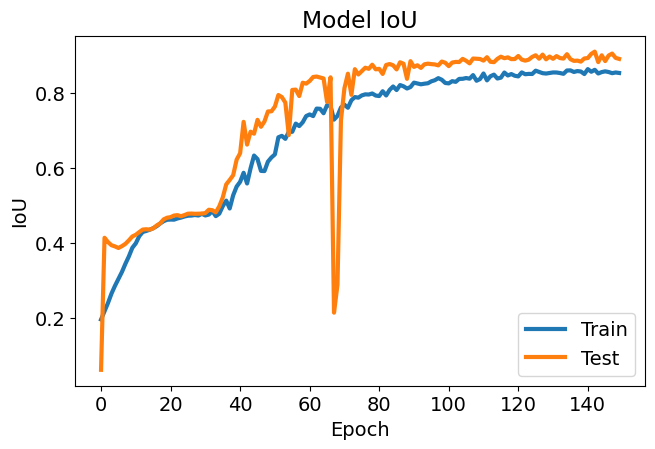

In [49]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history['train_miou']]
val_miou = [x.cpu().numpy() for x in history['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


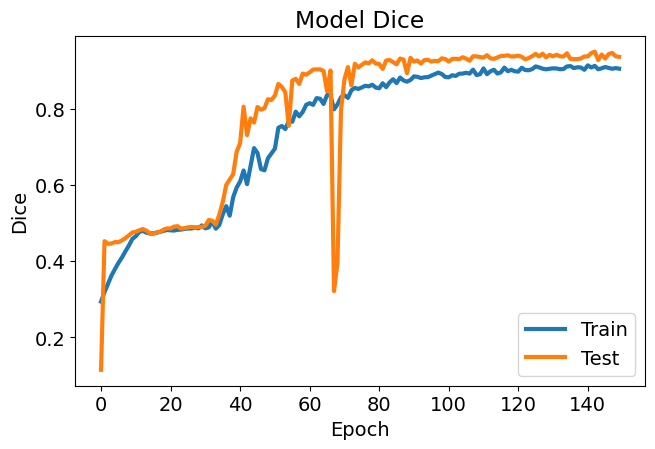

In [51]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history['train_dice']]
val_miou = [x.cpu().numpy() for x in history['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


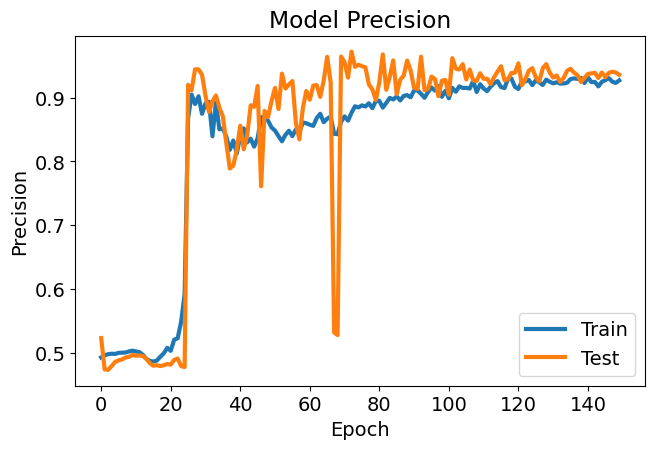

In [52]:
trainX = [x.cpu().numpy() for x in history['train_Precision']]
valX = [x.cpu().numpy() for x in history['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

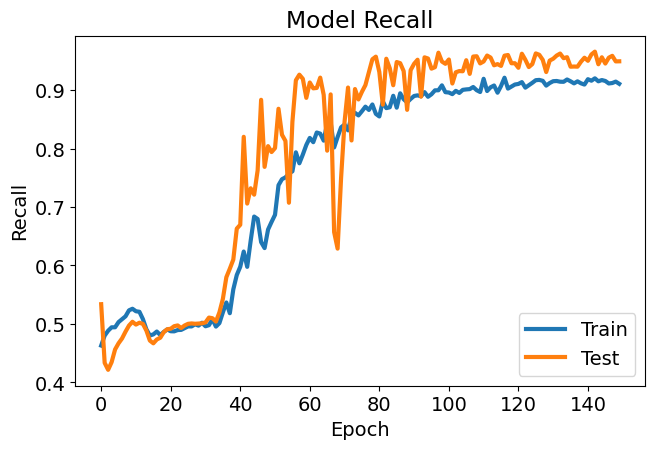

In [53]:
trainX = [x.cpu().numpy() for x in history['train_recall']]
valX = [x.cpu().numpy() for x in history['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

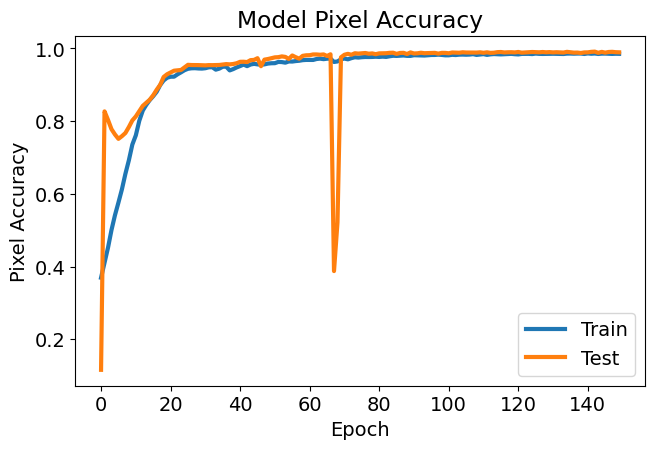

In [54]:
trainX = [x.cpu().numpy() for x in history['train_acc']]
valX = [x.cpu().numpy() for x in history['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

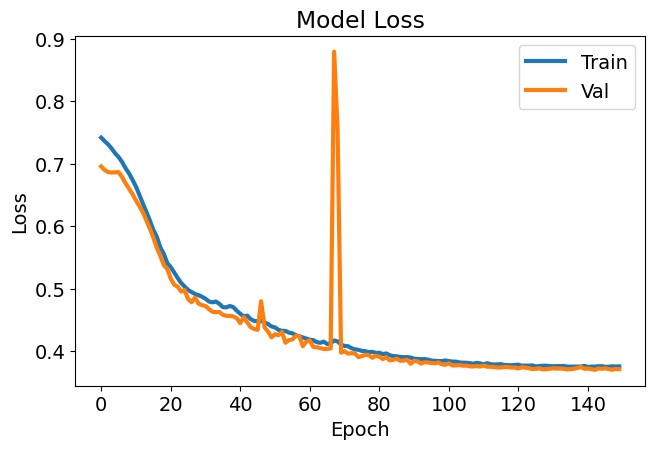

In [92]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_loss'])
plt.plot(history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [57]:
class TestDataset(Dataset):

    def __init__(self, img_path, mask_path, X, Xmask, transform=None):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.Xmask = Xmask
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path +self.X[idx] + '.TIFF')
        #img[45:64, :] = 0
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.Xmask[idx] + '.TIFF', cv2.IMREAD_GRAYSCALE)
        mask=mask/255
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        mask = torch.from_numpy(mask).long()

        return img, mask


t_test = A.Resize(64, 64, interpolation=cv2.INTER_NEAREST)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test,X_test_mask, transform=t_test)

In [58]:
def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        score = mIoU(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

In [59]:
def predict_image_mask_pixel(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        acc = pixel_accuracy(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, acc

In [60]:
def miou_score(model, test_set):
    score_iou = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_miou(model, img, mask)
        score_iou.append(score)
    return score_iou

In [61]:
def pixel_acc(model, test_set):
    accuracy = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, acc = predict_image_mask_pixel(model, img, mask)
        accuracy.append(acc)
    return accuracy

In [62]:
def predict_image_mask_dice(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        score = dice_score(output, mask)  # Compute Dice score
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

def dice_score_model(model, test_set):
    score_dice = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_dice(model, img, mask)  # Use the new function
        score_dice.append(score)
    return score_dice

In [63]:
mob_miou = miou_score(model, test_set)
dice_miou = dice_score_model(model, test_set)
mob_acc = pixel_acc(model, test_set)

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

In [64]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.9092101965019311
0.9496334303610446
0.9909507876536885


100%|██████████| 61/61 [00:00<00:00, 174.67it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


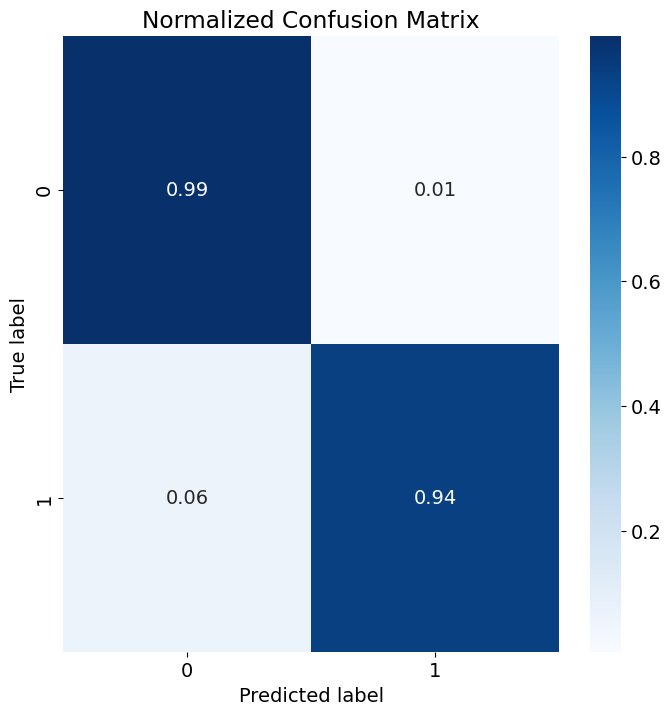

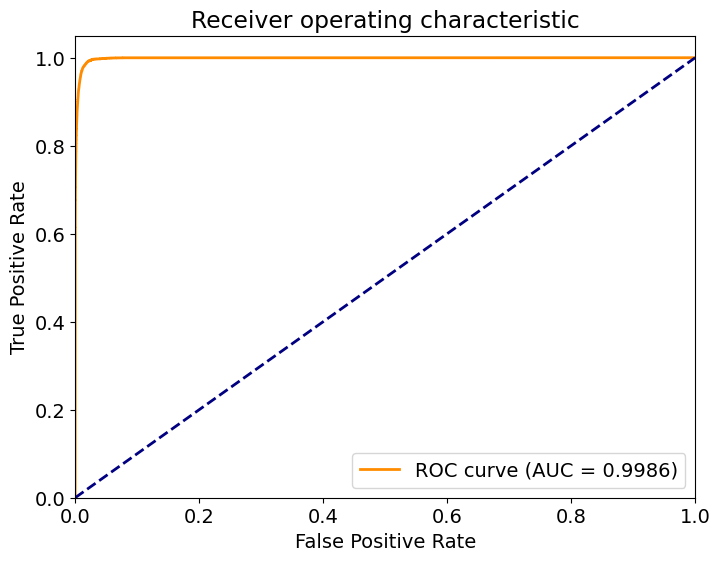

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)

# Example usage:
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model, test_set)


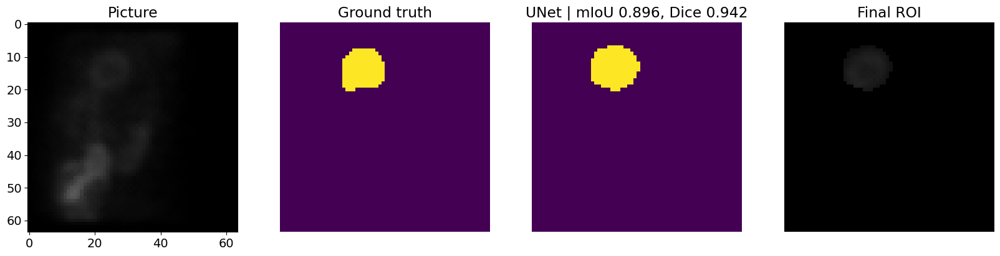

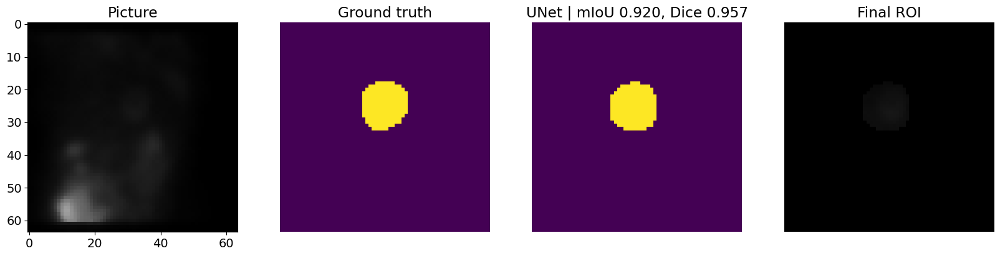

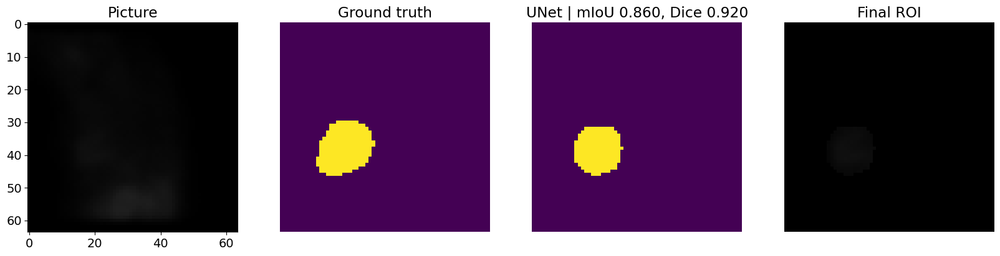

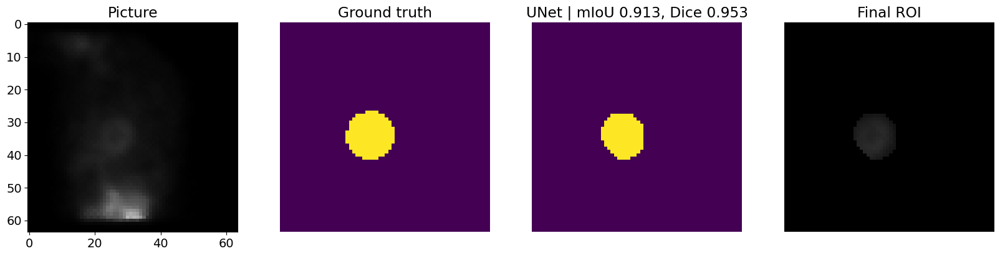

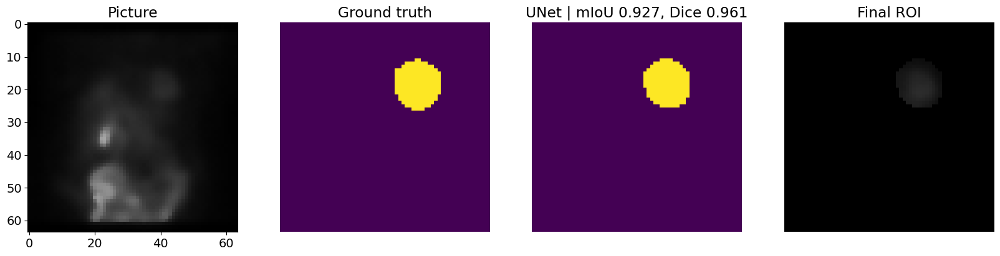

...

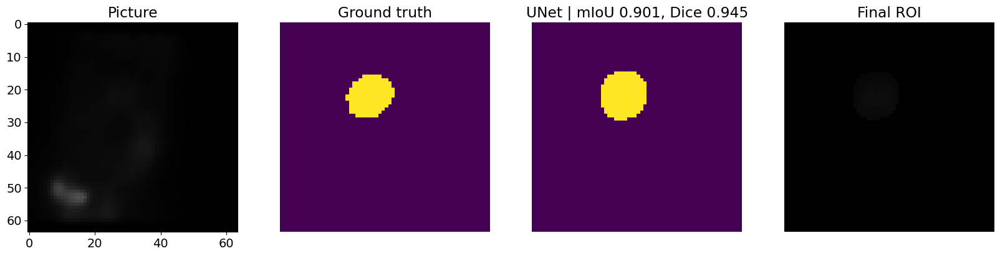

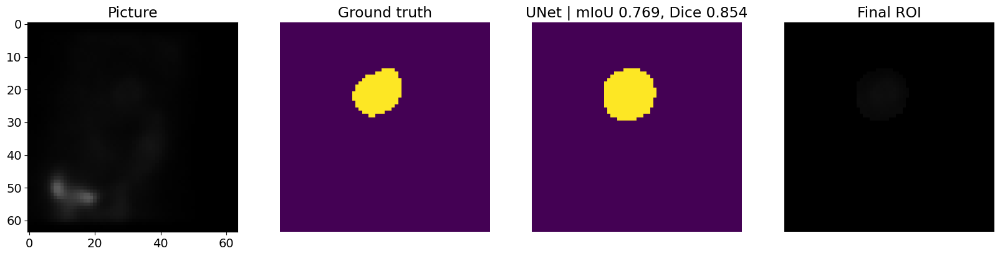

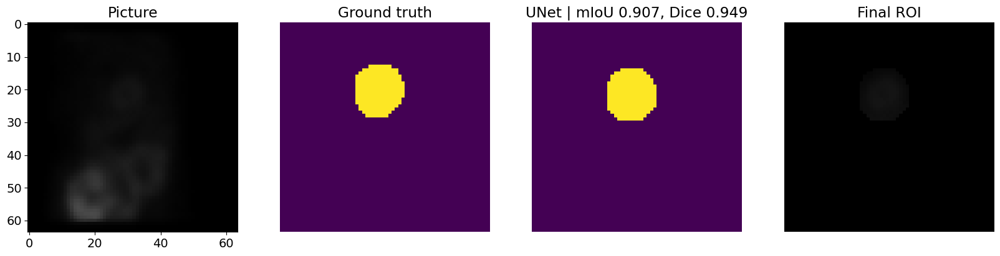

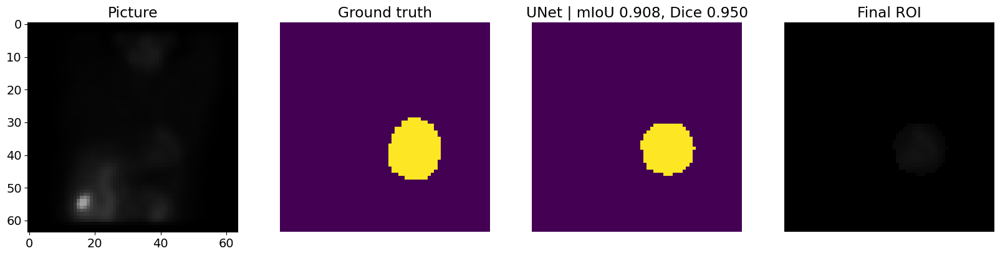

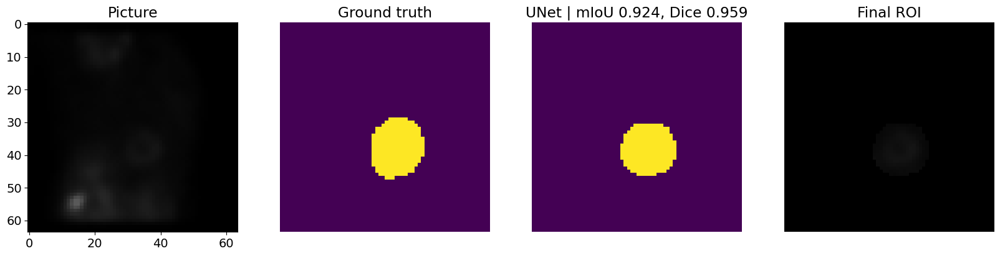

In [66]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
import torch

# Function to filter out small regions and keep only the largest connected component
def filter_largest_component(mask):
    # Convert the mask to a binary image
    binary_mask = (mask > 0).astype(np.uint8)

    # Find connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    # Keep the largest component (excluding the background)
    largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])

    # Create a mask with only the largest component
    largest_component_mask = (labels == largest_label).astype(np.uint8)
    return largest_component_mask

# Function to plot results
def plot_results(image, mask, filtered_pred_mask, score, Dscore):
    # Convert the PIL Image to a PyTorch Tensor
    image_tensor = transforms.ToTensor()(image)

    # Ensure the mask is on the same device as the image tensor
    filtered_pred_mask_tensor = torch.tensor(filtered_pred_mask, device=image_tensor.device)

    # Apply the mask to the image tensor
    masked_image = image_tensor * filtered_pred_mask_tensor.unsqueeze(0)

    # Now, let's add the masked image to the plot
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

    ax1.imshow(image_tensor.permute(1, 2, 0), cmap='gray')  # Permute the tensor dimensions to match the expected input of imshow
    ax1.set_title('Picture')

    ax2.imshow(mask, cmap='viridis')
    ax2.set_title('Ground truth')
    ax2.set_axis_off()

    ax3.imshow(filtered_pred_mask, cmap='viridis')
    ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
    ax3.set_axis_off()

    ax4.imshow(masked_image.permute(1, 2, 0), cmap='gray')  # Permute the tensor dimensions to match the expected input of imshow
    ax4.set_title('Final ROI')
    ax4.set_axis_off()

    plt.show()

# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
    pred_mask, score = predict_image_mask_miou(model, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# MobileNet

In [67]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

def double_conv(in_c, out_c):
    conv = nn.Sequential(
        nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
    )
    return conv

def crop_img(tensor, target_tensor):
    target_size = target_tensor.size()[2]
    tensor_size = tensor.size()[2]
    delta = tensor_size - target_size
    delta = delta // 2
    return tensor[:, :, delta:tensor_size - delta, delta:tensor_size - delta]

class UNet2(nn.Module):
    def __init__(self, num_classes, retain_dim=True):
        super(UNet2, self).__init__()

        # Load pretrained MobileNetV2 model and extract the features
        self.encoder = models.mobilenet_v2(pretrained=True).features
        self.backbone_out_channels = 1280

        # Define the upsampling layers and double_conv layers
        self.up_trans_1 = nn.ConvTranspose2d(in_channels=self.backbone_out_channels, out_channels=320, kernel_size=2, stride=2)
        self.up_conv_1 = double_conv(320 + 96, 320)

        self.up_trans_2 = nn.ConvTranspose2d(in_channels=320, out_channels=96, kernel_size=2, stride=2)
        self.up_conv_2 = double_conv(96 + 32, 96)

        self.up_trans_3 = nn.ConvTranspose2d(in_channels=96, out_channels=32, kernel_size=2, stride=2)
        self.up_conv_3 = double_conv(32 + 24, 32)

        self.up_trans_4 = nn.ConvTranspose2d(in_channels=32, out_channels=24, kernel_size=2, stride=2)
        self.up_conv_4 = double_conv(24 + 16, 24)  # Adjusted to match the expected input channels

        self.out = nn.Conv2d(in_channels=24, out_channels=num_classes, kernel_size=1)
        self.retain_dim = retain_dim

    def forward(self, image, out_size=(64, 64)):
        # Encoder part
        enc_features = []
        x = image
        for i in range(len(self.encoder)):
            x = self.encoder[i](x)
            if i in {1, 3, 6, 13, 18}:  # Save features at specific layers for concatenation
                enc_features.append(x)

        # Decoder part
        x = self.up_trans_1(enc_features[-1])
        y = crop_img(enc_features[-2], x)
        x = self.up_conv_1(torch.cat([x, y], 1))

        x = self.up_trans_2(x)
        y = crop_img(enc_features[-3], x)
        x = self.up_conv_2(torch.cat([x, y], 1))

        x = self.up_trans_3(x)
        y = crop_img(enc_features[-4], x)
        x = self.up_conv_3(torch.cat([x, y], 1))

        x = self.up_trans_4(x)
        y = crop_img(enc_features[-5], x)
        x = self.up_conv_4(torch.cat([x, y], 1))

        x = self.out(x)
        if self.retain_dim:
            x = F.interpolate(x, out_size)
        x = F.softmax(x, dim=1)
        return x

# Example usage
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model2 = UNet2(num_classes=2).to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 156MB/s]


In [68]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model2.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history2 = fit(epoch, model2, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.40it/s]
<ipython-input-46-0c94c4132b9a>:373: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = results._append({'Epoch': epoch,


Loss Decreasing.. inf >> 0.697 
Epoch:1/150.. Train Loss: 0.727.. Val Loss: 0.697.. Train mIoU:0.238.. Val mIoU: 0.217.. Train Dice:0.337.. Val Dice: 0.311.. Train Precision:0.505.. Val Precision: 0.473.. Train Recall:0.521.. Val Recall: 0.345.. Train TP:1717.712.. Train TP2:113.049.. Train TN:113.049.. Train TN2:1717.712.. Train FP:73.898.. Train FP2:2191.341.. Train FN:2191.341.. Train FN2:73.898.. Val TP: 1666.213.. Val TN: 50.525.. Val FP: 139.098.. Val FN: 2240.164.. Train Accuracy:0.447.. Val Accuracy:0.419.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


Loss Decreasing.. 0.697 >> 0.678 
Epoch:2/150.. Train Loss: 0.726.. Val Loss: 0.678.. Train mIoU:0.238.. Val mIoU: 0.420.. Train Dice:0.338.. Val Dice: 0.459.. Train Precision:0.505.. Val Precision: 0.477.. Train Recall:0.526.. Val Recall: 0.446.. Train TP:1713.354.. Train TP2:113.304.. Train TN:113.304.. Train TN2:1713.354.. Train FP:71.515.. Train FP2:2197.828.. Train FN:2197.828.. Train FN2:71.515.. Val TP: 3425.901.. Val TN: 2.623.. Val FP: 186.885.. Val FN: 480.590.. Train Accuracy:0.446.. Val Accuracy:0.837.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


Loss Decreasing.. 0.678 >> 0.665 
Epoch:3/150.. Train Loss: 0.726.. Val Loss: 0.665.. Train mIoU:0.242.. Val mIoU: 0.423.. Train Dice:0.341.. Val Dice: 0.461.. Train Precision:0.505.. Val Precision: 0.477.. Train Recall:0.524.. Val Recall: 0.449.. Train TP:1741.587.. Train TP2:112.173.. Train TN:112.173.. Train TN2:1741.587.. Train FP:73.302.. Train FP2:2168.938.. Train FN:2168.938.. Train FN2:73.302.. Val TP: 3442.705.. Val TN: 3.180.. Val FP: 186.148.. Val FN: 463.967.. Train Accuracy:0.453.. Val Accuracy:0.841.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Loss Decreasing.. 0.665 >> 0.659 
saving model...
Epoch:4/150.. Train Loss: 0.725.. Val Loss: 0.659.. Train mIoU:0.243.. Val mIoU: 0.414.. Train Dice:0.342.. Val Dice: 0.458.. Train Precision:0.506.. Val Precision: 0.479.. Train Recall:0.530.. Val Recall: 0.446.. Train TP:1744.547.. Train TP2:114.684.. Train TN:114.684.. Train TN2:1744.547.. Train FP:71.241.. Train FP2:2165.528.. Train FN:2165.528.. Train FN2:71.241.. Val TP: 3351.492.. Val TN: 6.082.. Val FP: 184.836.. Val FN: 553.590.. Train Accuracy:0.454.. Val Accuracy:0.820.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Loss Decreasing.. 0.659 >> 0.658 
Epoch:5/150.. Train Loss: 0.724.. Val Loss: 0.658.. Train mIoU:0.246.. Val mIoU: 0.401.. Train Dice:0.345.. Val Dice: 0.455.. Train Precision:0.507.. Val Precision: 0.484.. Train Recall:0.535.. Val Recall: 0.454.. Train TP:1767.523.. Train TP2:114.811.. Train TN:114.811.. Train TN2:1767.523.. Train FP:70.431.. Train FP2:2143.235.. Train FN:2143.235.. Train FN2:70.431.. Val TP: 3203.328.. Val TN: 15.541.. Val FP: 173.656.. Val FN: 703.475.. Train Accuracy:0.460.. Val Accuracy:0.786.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Loss Not Decrease for 1 time
Epoch:6/150.. Train Loss: 0.724.. Val Loss: 0.663.. Train mIoU:0.248.. Val mIoU: 0.385.. Train Dice:0.346.. Val Dice: 0.452.. Train Precision:0.507.. Val Precision: 0.491.. Train Recall:0.533.. Val Recall: 0.468.. Train TP:1785.175.. Train TP2:113.446.. Train TN:113.446.. Train TN2:1785.175.. Train FP:72.674.. Train FP2:2124.705.. Train FN:2124.705.. Train FN2:72.674.. Val TP: 3020.901.. Val TN: 29.705.. Val FP: 160.410.. Val FN: 884.984.. Train Accuracy:0.464.. Val Accuracy:0.745.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


Loss Not Decrease for 2 time
Epoch:7/150.. Train Loss: 0.724.. Val Loss: 0.668.. Train mIoU:0.249.. Val mIoU: 0.368.. Train Dice:0.347.. Val Dice: 0.447.. Train Precision:0.507.. Val Precision: 0.498.. Train Recall:0.534.. Val Recall: 0.496.. Train TP:1795.912.. Train TP2:113.139.. Train TN:113.139.. Train TN2:1795.912.. Train FP:72.117.. Train FP2:2114.832.. Train FN:2114.832.. Train FN2:72.117.. Val TP: 2830.065.. Val TN: 48.082.. Val FP: 137.541.. Val FN: 1080.311.. Train Accuracy:0.466.. Val Accuracy:0.703.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.81it/s]


Loss Not Decrease for 3 time
Epoch:8/150.. Train Loss: 0.723.. Val Loss: 0.672.. Train mIoU:0.252.. Val mIoU: 0.358.. Train Dice:0.351.. Val Dice: 0.444.. Train Precision:0.509.. Val Precision: 0.504.. Train Recall:0.545.. Val Recall: 0.519.. Train TP:1809.140.. Train TP2:116.646.. Train TN:116.646.. Train TN2:1809.140.. Train FP:69.722.. Train FP2:2100.492.. Train FN:2100.492.. Train FN2:69.722.. Val TP: 2702.820.. Val TN: 63.623.. Val FP: 122.689.. Val FN: 1206.869.. Train Accuracy:0.470.. Val Accuracy:0.675.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Not Decrease for 4 time
Epoch:9/150.. Train Loss: 0.722.. Val Loss: 0.676.. Train mIoU:0.256.. Val mIoU: 0.351.. Train Dice:0.355.. Val Dice: 0.442.. Train Precision:0.510.. Val Precision: 0.509.. Train Recall:0.549.. Val Recall: 0.546.. Train TP:1836.056.. Train TP2:116.587.. Train TN:116.587.. Train TN2:1836.056.. Train FP:68.461.. Train FP2:2074.896.. Train FN:2074.896.. Train FN2:68.461.. Val TP: 2607.082.. Val TN: 77.820.. Val FP: 107.541.. Val FN: 1303.557.. Train Accuracy:0.477.. Val Accuracy:0.655.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


Loss Not Decrease for 5 time
Epoch:10/150.. Train Loss: 0.721.. Val Loss: 0.678.. Train mIoU:0.260.. Val mIoU: 0.346.. Train Dice:0.360.. Val Dice: 0.441.. Train Precision:0.511.. Val Precision: 0.512.. Train Recall:0.556.. Val Recall: 0.559.. Train TP:1856.605.. Train TP2:120.750.. Train TN:120.750.. Train TN2:1856.605.. Train FP:68.784.. Train FP2:2049.862.. Train FN:2049.862.. Train FN2:68.784.. Val TP: 2545.738.. Val TN: 87.311.. Val FP: 101.738.. Val FN: 1361.213.. Train Accuracy:0.483.. Val Accuracy:0.643.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.08it/s]


Loss Decreasing.. 0.678 >> 0.677 
Epoch:11/150.. Train Loss: 0.719.. Val Loss: 0.677.. Train mIoU:0.264.. Val mIoU: 0.352.. Train Dice:0.364.. Val Dice: 0.449.. Train Precision:0.513.. Val Precision: 0.518.. Train Recall:0.563.. Val Recall: 0.586.. Train TP:1884.834.. Train TP2:121.894.. Train TN:121.894.. Train TN2:1884.834.. Train FP:66.810.. Train FP2:2022.463.. Train FN:2022.463.. Train FN2:66.810.. Val TP: 2552.869.. Val TN: 98.689.. Val FP: 91.787.. Val FN: 1352.656.. Train Accuracy:0.490.. Val Accuracy:0.647.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.88it/s]


Loss Decreasing.. 0.677 >> 0.677 
Epoch:12/150.. Train Loss: 0.718.. Val Loss: 0.677.. Train mIoU:0.268.. Val mIoU: 0.353.. Train Dice:0.368.. Val Dice: 0.451.. Train Precision:0.515.. Val Precision: 0.520.. Train Recall:0.575.. Val Recall: 0.604.. Train TP:1907.200.. Train TP2:123.001.. Train TN:123.001.. Train TN2:1907.200.. Train FP:62.745.. Train FP2:2003.054.. Train FN:2003.054.. Train FN2:62.745.. Val TP: 2551.328.. Val TN: 102.738.. Val FP: 84.475.. Val FN: 1357.459.. Train Accuracy:0.496.. Val Accuracy:0.648.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


Loss Decreasing.. 0.677 >> 0.675 
Epoch:13/150.. Train Loss: 0.716.. Val Loss: 0.675.. Train mIoU:0.276.. Val mIoU: 0.361.. Train Dice:0.375.. Val Dice: 0.462.. Train Precision:0.518.. Val Precision: 0.528.. Train Recall:0.590.. Val Recall: 0.647.. Train TP:1948.306.. Train TP2:126.508.. Train TN:126.508.. Train TN2:1948.306.. Train FP:59.857.. Train FP2:1961.329.. Train FN:1961.329.. Train FN2:59.857.. Val TP: 2568.705.. Val TN: 115.967.. Val FP: 67.754.. Val FN: 1343.574.. Train Accuracy:0.507.. Val Accuracy:0.655.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Loss Decreasing.. 0.675 >> 0.671 
saving model...
Epoch:14/150.. Train Loss: 0.714.. Val Loss: 0.671.. Train mIoU:0.280.. Val mIoU: 0.370.. Train Dice:0.381.. Val Dice: 0.471.. Train Precision:0.521.. Val Precision: 0.531.. Train Recall:0.606.. Val Recall: 0.660.. Train TP:1964.779.. Train TP2:131.956.. Train TN:131.956.. Train TN2:1964.779.. Train FP:53.702.. Train FP2:1945.562.. Train FN:1945.562.. Train FN2:53.702.. Val TP: 2618.754.. Val TN: 119.721.. Val FP: 66.098.. Val FN: 1291.426.. Train Accuracy:0.512.. Val Accuracy:0.669.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Loss Decreasing.. 0.671 >> 0.671 
Epoch:15/150.. Train Loss: 0.712.. Val Loss: 0.671.. Train mIoU:0.289.. Val mIoU: 0.378.. Train Dice:0.391.. Val Dice: 0.482.. Train Precision:0.524.. Val Precision: 0.539.. Train Recall:0.618.. Val Recall: 0.696.. Train TP:2025.635.. Train TP2:133.601.. Train TN:133.601.. Train TN2:2025.635.. Train FP:52.885.. Train FP2:1883.879.. Train FN:1883.879.. Train FN2:52.885.. Val TP: 2619.721.. Val TN: 135.574.. Val FP: 53.656.. Val FN: 1287.049.. Train Accuracy:0.527.. Val Accuracy:0.673.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


Loss Decreasing.. 0.671 >> 0.670 
Epoch:16/150.. Train Loss: 0.709.. Val Loss: 0.670.. Train mIoU:0.296.. Val mIoU: 0.382.. Train Dice:0.398.. Val Dice: 0.491.. Train Precision:0.527.. Val Precision: 0.548.. Train Recall:0.632.. Val Recall: 0.742.. Train TP:2061.426.. Train TP2:137.553.. Train TN:137.553.. Train TN2:2061.426.. Train FP:49.614.. Train FP2:1847.407.. Train FN:1847.407.. Train FN2:49.614.. Val TP: 2599.492.. Val TN: 153.934.. Val FP: 34.738.. Val FN: 1307.836.. Train Accuracy:0.537.. Val Accuracy:0.672.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


Loss Not Decrease for 6 time
Epoch:17/150.. Train Loss: 0.706.. Val Loss: 0.670.. Train mIoU:0.309.. Val mIoU: 0.382.. Train Dice:0.412.. Val Dice: 0.493.. Train Precision:0.534.. Val Precision: 0.552.. Train Recall:0.655.. Val Recall: 0.768.. Train TP:2126.156.. Train TP2:141.684.. Train TN:141.684.. Train TN2:2126.156.. Train FP:43.957.. Train FP2:1784.203.. Train FN:1784.203.. Train FN2:43.957.. Val TP: 2572.311.. Val TN: 164.262.. Val FP: 23.230.. Val FN: 1336.197.. Train Accuracy:0.554.. Val Accuracy:0.668.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.18it/s]


Loss Not Decrease for 7 time
Epoch:18/150.. Train Loss: 0.702.. Val Loss: 0.671.. Train mIoU:0.316.. Val mIoU: 0.382.. Train Dice:0.421.. Val Dice: 0.495.. Train Precision:0.537.. Val Precision: 0.554.. Train Recall:0.677.. Val Recall: 0.784.. Train TP:2160.812.. Train TP2:148.087.. Train TN:148.087.. Train TN2:2160.812.. Train FP:37.020.. Train FP2:1750.081.. Train FN:1750.081.. Train FN2:37.020.. Val TP: 2554.902.. Val TN: 170.623.. Val FP: 16.508.. Val FN: 1353.967.. Train Accuracy:0.564.. Val Accuracy:0.665.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.85it/s]


Loss Not Decrease for 8 time
Epoch:19/150.. Train Loss: 0.699.. Val Loss: 0.672.. Train mIoU:0.326.. Val mIoU: 0.379.. Train Dice:0.432.. Val Dice: 0.493.. Train Precision:0.541.. Val Precision: 0.555.. Train Recall:0.691.. Val Recall: 0.794.. Train TP:2205.789.. Train TP2:153.027.. Train TN:153.027.. Train TN2:2205.789.. Train FP:35.202.. Train FP2:1701.982.. Train FN:1701.982.. Train FN2:35.202.. Val TP: 2528.934.. Val TN: 174.328.. Val FP: 10.934.. Val FN: 1381.803.. Train Accuracy:0.576.. Val Accuracy:0.660.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.21it/s]


Loss Not Decrease for 9 time
Epoch:20/150.. Train Loss: 0.694.. Val Loss: 0.674.. Train mIoU:0.337.. Val mIoU: 0.377.. Train Dice:0.445.. Val Dice: 0.491.. Train Precision:0.545.. Val Precision: 0.556.. Train Recall:0.718.. Val Recall: 0.798.. Train TP:2267.615.. Train TP2:157.849.. Train TN:157.849.. Train TN2:2267.615.. Train FP:26.695.. Train FP2:1643.841.. Train FN:1643.841.. Train FN2:26.695.. Val TP: 2503.311.. Val TN: 178.820.. Val FP: 8.230.. Val FN: 1405.639.. Train Accuracy:0.592.. Val Accuracy:0.655.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


Loss Decreasing.. 0.674 >> 0.672 
Epoch:21/150.. Train Loss: 0.688.. Val Loss: 0.672.. Train mIoU:0.350.. Val mIoU: 0.382.. Train Dice:0.459.. Val Dice: 0.497.. Train Precision:0.550.. Val Precision: 0.558.. Train Recall:0.737.. Val Recall: 0.807.. Train TP:2334.904.. Train TP2:163.603.. Train TN:163.603.. Train TN2:2334.904.. Train FP:22.844.. Train FP2:1574.649.. Train FN:1574.649.. Train FN2:22.844.. Val TP: 2533.295.. Val TN: 180.787.. Val FP: 6.770.. Val FN: 1375.147.. Train Accuracy:0.610.. Val Accuracy:0.663.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.94it/s]


Loss Decreasing.. 0.672 >> 0.661 
Epoch:22/150.. Train Loss: 0.681.. Val Loss: 0.661.. Train mIoU:0.368.. Val mIoU: 0.400.. Train Dice:0.478.. Val Dice: 0.514.. Train Precision:0.556.. Val Precision: 0.563.. Train Recall:0.761.. Val Recall: 0.821.. Train TP:2435.099.. Train TP2:167.849.. Train TN:167.849.. Train TN2:2435.099.. Train FP:18.720.. Train FP2:1474.331.. Train FN:1474.331.. Train FN2:18.720.. Val TP: 2634.262.. Val TN: 181.754.. Val FP: 5.934.. Val FN: 1274.049.. Train Accuracy:0.635.. Val Accuracy:0.688.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


Loss Decreasing.. 0.661 >> 0.644 
saving model...
Epoch:23/150.. Train Loss: 0.671.. Val Loss: 0.644.. Train mIoU:0.392.. Val mIoU: 0.431.. Train Dice:0.502.. Val Dice: 0.542.. Train Precision:0.563.. Val Precision: 0.572.. Train Recall:0.776.. Val Recall: 0.845.. Train TP:2577.733.. Train TP2:165.637.. Train TN:165.637.. Train TN2:2577.733.. Train FP:20.613.. Train FP2:1332.017.. Train FN:1332.017.. Train FN2:20.613.. Val TP: 2805.951.. Val TN: 181.246.. Val FP: 5.787.. Val FN: 1103.016.. Train Accuracy:0.670.. Val Accuracy:0.729.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Loss Decreasing.. 0.644 >> 0.637 
Epoch:24/150.. Train Loss: 0.657.. Val Loss: 0.637.. Train mIoU:0.425.. Val mIoU: 0.453.. Train Dice:0.534.. Val Dice: 0.563.. Train Precision:0.574.. Val Precision: 0.579.. Train Recall:0.812.. Val Recall: 0.854.. Train TP:2752.344.. Train TP2:170.205.. Train TN:170.205.. Train TN2:2752.344.. Train FP:15.617.. Train FP2:1157.834.. Train FN:1157.834.. Train FN2:15.617.. Val TP: 2928.508.. Val TN: 179.164.. Val FP: 8.344.. Val FN: 979.984.. Train Accuracy:0.714.. Val Accuracy:0.759.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Loss Decreasing.. 0.637 >> 0.618 
Epoch:25/150.. Train Loss: 0.643.. Val Loss: 0.618.. Train mIoU:0.465.. Val mIoU: 0.506.. Train Dice:0.573.. Val Dice: 0.614.. Train Precision:0.588.. Val Precision: 0.601.. Train Recall:0.840.. Val Recall: 0.888.. Train TP:2953.915.. Train TP2:171.771.. Train TN:171.771.. Train TN2:2953.915.. Train FP:14.125.. Train FP2:956.189.. Train FN:956.189.. Train FN2:14.125.. Val TP: 3167.442.. Val TN: 183.066.. Val FP: 7.115.. Val FN: 738.377.. Train Accuracy:0.763.. Val Accuracy:0.818.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Loss Decreasing.. 0.618 >> 0.585 
Epoch:26/150.. Train Loss: 0.629.. Val Loss: 0.585.. Train mIoU:0.505.. Val mIoU: 0.596.. Train Dice:0.611.. Val Dice: 0.700.. Train Precision:0.604.. Val Precision: 0.653.. Train Recall:0.864.. Val Recall: 0.910.. Train TP:3144.241.. Train TP2:173.902.. Train TN:173.902.. Train TN2:3144.241.. Train FP:14.360.. Train FP2:763.497.. Train FN:763.497.. Train FN2:14.360.. Val TP: 3501.180.. Val TN: 175.246.. Val FP: 14.557.. Val FN: 405.016.. Train Accuracy:0.810.. Val Accuracy:0.898.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Decreasing.. 0.585 >> 0.571 
Epoch:27/150.. Train Loss: 0.614.. Val Loss: 0.571.. Train mIoU:0.554.. Val mIoU: 0.662.. Train Dice:0.658.. Val Dice: 0.763.. Train Precision:0.631.. Val Precision: 0.704.. Train Recall:0.891.. Val Recall: 0.934.. Train TP:3329.932.. Train TP2:173.328.. Train TN:173.328.. Train TN2:3329.932.. Train FP:12.254.. Train FP2:580.487.. Train FN:580.487.. Train FN2:12.254.. Val TP: 3642.820.. Val TN: 175.738.. Val FP: 12.525.. Val FN: 264.918.. Train Accuracy:0.855.. Val Accuracy:0.932.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


Loss Decreasing.. 0.571 >> 0.562 
saving model...
Epoch:28/150.. Train Loss: 0.602.. Val Loss: 0.562.. Train mIoU:0.586.. Val mIoU: 0.711.. Train Dice:0.688.. Val Dice: 0.804.. Train Precision:0.648.. Val Precision: 0.754.. Train Recall:0.905.. Val Recall: 0.926.. Train TP:3450.988.. Train TP2:171.920.. Train TN:171.920.. Train TN2:3450.988.. Train FP:13.367.. Train FP2:459.725.. Train FN:459.725.. Train FN2:13.367.. Val TP: 3733.573.. Val TN: 169.967.. Val FP: 19.148.. Val FN: 173.311.. Train Accuracy:0.884.. Val Accuracy:0.953.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.16it/s]


Loss Decreasing.. 0.562 >> 0.561 
Epoch:29/150.. Train Loss: 0.592.. Val Loss: 0.561.. Train mIoU:0.621.. Val mIoU: 0.714.. Train Dice:0.721.. Val Dice: 0.808.. Train Precision:0.673.. Val Precision: 0.748.. Train Recall:0.920.. Val Recall: 0.956.. Train TP:3535.131.. Train TP2:173.691.. Train TN:173.691.. Train TN2:3535.131.. Train FP:11.881.. Train FP2:375.298.. Train FN:375.298.. Train FN2:11.881.. Val TP: 3707.213.. Val TN: 180.951.. Val FP: 8.131.. Val FN: 199.705.. Train Accuracy:0.905.. Val Accuracy:0.949.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.19it/s]


Loss Decreasing.. 0.561 >> 0.558 
Epoch:30/150.. Train Loss: 0.584.. Val Loss: 0.558.. Train mIoU:0.653.. Val mIoU: 0.709.. Train Dice:0.750.. Val Dice: 0.805.. Train Precision:0.700.. Val Precision: 0.744.. Train Recall:0.921.. Val Recall: 0.957.. Train TP:3612.792.. Train TP2:171.028.. Train TN:171.028.. Train TN2:3612.792.. Train FP:15.786.. Train FP2:296.395.. Train FN:296.395.. Train FN2:15.786.. Val TP: 3708.787.. Val TN: 179.672.. Val FP: 6.361.. Val FN: 201.180.. Train Accuracy:0.924.. Val Accuracy:0.949.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.27it/s]


Loss Decreasing.. 0.558 >> 0.556 
Epoch:31/150.. Train Loss: 0.576.. Val Loss: 0.556.. Train mIoU:0.671.. Val mIoU: 0.704.. Train Dice:0.768.. Val Dice: 0.801.. Train Precision:0.711.. Val Precision: 0.734.. Train Recall:0.931.. Val Recall: 0.964.. Train TP:3648.749.. Train TP2:173.365.. Train TN:173.365.. Train TN2:3648.749.. Train FP:12.996.. Train FP2:260.890.. Train FN:260.890.. Train FN2:12.996.. Val TP: 3691.410.. Val TN: 186.016.. Val FP: 3.738.. Val FN: 214.836.. Train Accuracy:0.933.. Val Accuracy:0.947.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.04it/s]


Loss Decreasing.. 0.556 >> 0.545 
Epoch:32/150.. Train Loss: 0.569.. Val Loss: 0.545.. Train mIoU:0.699.. Val mIoU: 0.745.. Train Dice:0.791.. Val Dice: 0.834.. Train Precision:0.737.. Val Precision: 0.771.. Train Recall:0.935.. Val Recall: 0.968.. Train TP:3691.227.. Train TP2:172.424.. Train TN:172.424.. Train TN2:3691.227.. Train FP:14.111.. Train FP2:218.238.. Train FN:218.238.. Train FN2:14.111.. Val TP: 3758.901.. Val TN: 178.574.. Val FP: 4.967.. Val FN: 153.557.. Train Accuracy:0.943.. Val Accuracy:0.961.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.73it/s]


Loss Decreasing.. 0.545 >> 0.540 
saving model...
Epoch:33/150.. Train Loss: 0.563.. Val Loss: 0.540.. Train mIoU:0.711.. Val mIoU: 0.754.. Train Dice:0.803.. Val Dice: 0.842.. Train Precision:0.742.. Val Precision: 0.781.. Train Recall:0.949.. Val Recall: 0.967.. Train TP:3705.143.. Train TP2:176.214.. Train TN:176.214.. Train TN2:3705.143.. Train FP:9.847.. Train FP2:204.796.. Train FN:204.796.. Train FN2:9.847.. Val TP: 3760.869.. Val TN: 183.607.. Val FP: 5.492.. Val FN: 146.033.. Train Accuracy:0.948.. Val Accuracy:0.963.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


Loss Decreasing.. 0.540 >> 0.533 
Epoch:34/150.. Train Loss: 0.559.. Val Loss: 0.533.. Train mIoU:0.726.. Val mIoU: 0.769.. Train Dice:0.815.. Val Dice: 0.853.. Train Precision:0.758.. Val Precision: 0.791.. Train Recall:0.946.. Val Recall: 0.973.. Train TP:3727.590.. Train TP2:174.855.. Train TN:174.855.. Train TN2:3727.590.. Train FP:11.436.. Train FP2:182.118.. Train FN:182.118.. Train FN2:11.436.. Val TP: 3772.442.. Val TN: 184.229.. Val FP: 3.361.. Val FN: 135.967.. Train Accuracy:0.953.. Val Accuracy:0.966.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Loss Decreasing.. 0.533 >> 0.527 
Epoch:35/150.. Train Loss: 0.555.. Val Loss: 0.527.. Train mIoU:0.725.. Val mIoU: 0.794.. Train Dice:0.816.. Val Dice: 0.873.. Train Precision:0.756.. Val Precision: 0.815.. Train Recall:0.951.. Val Recall: 0.972.. Train TP:3732.314.. Train TP2:174.705.. Train TN:174.705.. Train TN2:3732.314.. Train FP:10.180.. Train FP2:178.801.. Train FN:178.801.. Train FN2:10.180.. Val TP: 3799.967.. Val TN: 182.426.. Val FP: 5.869.. Val FN: 107.738.. Train Accuracy:0.954.. Val Accuracy:0.972.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


Loss Decreasing.. 0.527 >> 0.525 
Epoch:36/150.. Train Loss: 0.550.. Val Loss: 0.525.. Train mIoU:0.742.. Val mIoU: 0.777.. Train Dice:0.830.. Val Dice: 0.860.. Train Precision:0.769.. Val Precision: 0.799.. Train Recall:0.961.. Val Recall: 0.971.. Train TP:3747.308.. Train TP2:179.648.. Train TN:179.648.. Train TN2:3747.308.. Train FP:7.100.. Train FP2:161.943.. Train FN:161.943.. Train FN2:7.100.. Val TP: 3780.082.. Val TN: 184.508.. Val FP: 5.295.. Val FN: 126.115.. Train Accuracy:0.959.. Val Accuracy:0.968.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


Loss Decreasing.. 0.525 >> 0.517 
Epoch:37/150.. Train Loss: 0.547.. Val Loss: 0.517.. Train mIoU:0.751.. Val mIoU: 0.809.. Train Dice:0.837.. Val Dice: 0.883.. Train Precision:0.777.. Val Precision: 0.829.. Train Recall:0.961.. Val Recall: 0.976.. Train TP:3761.074.. Train TP2:177.850.. Train TN:177.850.. Train TN2:3761.074.. Train FP:7.676.. Train FP2:149.400.. Train FN:149.400.. Train FN2:7.676.. Val TP: 3811.262.. Val TN: 182.885.. Val FP: 4.869.. Val FN: 96.984.. Train Accuracy:0.962.. Val Accuracy:0.975.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Not Decrease for 10 time
Epoch:38/150.. Train Loss: 0.543.. Val Loss: 0.518.. Train mIoU:0.758.. Val mIoU: 0.776.. Train Dice:0.843.. Val Dice: 0.859.. Train Precision:0.781.. Val Precision: 0.798.. Train Recall:0.964.. Val Recall: 0.974.. Train TP:3770.651.. Train TP2:177.848.. Train TN:177.848.. Train TN2:3770.651.. Train FP:6.979.. Train FP2:140.522.. Train FN:140.522.. Train FN2:6.979.. Val TP: 3784.459.. Val TN: 181.590.. Val FP: 3.803.. Val FN: 126.148.. Train Accuracy:0.964.. Val Accuracy:0.968.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Loss Decreasing.. 0.518 >> 0.516 
saving model...
Epoch:39/150.. Train Loss: 0.539.. Val Loss: 0.516.. Train mIoU:0.769.. Val mIoU: 0.779.. Train Dice:0.851.. Val Dice: 0.862.. Train Precision:0.794.. Val Precision: 0.799.. Train Recall:0.963.. Val Recall: 0.976.. Train TP:3783.675.. Train TP2:176.793.. Train TN:176.793.. Train TN2:3783.675.. Train FP:8.141.. Train FP2:127.390.. Train FN:127.390.. Train FN2:8.141.. Val TP: 3780.967.. Val TN: 185.672.. Val FP: 3.820.. Val FN: 125.541.. Train Accuracy:0.967.. Val Accuracy:0.968.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Decreasing.. 0.516 >> 0.510 
Epoch:40/150.. Train Loss: 0.536.. Val Loss: 0.510.. Train mIoU:0.773.. Val mIoU: 0.800.. Train Dice:0.855.. Val Dice: 0.877.. Train Precision:0.797.. Val Precision: 0.820.. Train Recall:0.962.. Val Recall: 0.977.. Train TP:3786.753.. Train TP2:177.616.. Train TN:177.616.. Train TN2:3786.753.. Train FP:8.544.. Train FP2:123.088.. Train FN:123.088.. Train FN2:8.544.. Val TP: 3804.656.. Val TN: 181.754.. Val FP: 3.672.. Val FN: 105.918.. Train Accuracy:0.968.. Val Accuracy:0.973.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.75it/s]


Loss Decreasing.. 0.510 >> 0.510 
Epoch:41/150.. Train Loss: 0.534.. Val Loss: 0.510.. Train mIoU:0.780.. Val mIoU: 0.784.. Train Dice:0.860.. Val Dice: 0.865.. Train Precision:0.804.. Val Precision: 0.804.. Train Recall:0.963.. Val Recall: 0.974.. Train TP:3791.821.. Train TP2:178.476.. Train TN:178.476.. Train TN2:3791.821.. Train FP:8.461.. Train FP2:117.243.. Train FN:117.243.. Train FN2:8.461.. Val TP: 3787.311.. Val TN: 185.049.. Val FP: 4.164.. Val FN: 119.475.. Train Accuracy:0.969.. Val Accuracy:0.970.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


Loss Decreasing.. 0.510 >> 0.507 
Epoch:42/150.. Train Loss: 0.530.. Val Loss: 0.507.. Train mIoU:0.786.. Val mIoU: 0.808.. Train Dice:0.865.. Val Dice: 0.882.. Train Precision:0.809.. Val Precision: 0.824.. Train Recall:0.965.. Val Recall: 0.981.. Train TP:3800.855.. Train TP2:176.885.. Train TN:176.885.. Train TN2:3800.855.. Train FP:7.905.. Train FP2:110.355.. Train FN:110.355.. Train FN2:7.905.. Val TP: 3804.147.. Val TN: 186.951.. Val FP: 2.279.. Val FN: 102.623.. Train Accuracy:0.971.. Val Accuracy:0.974.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Loss Decreasing.. 0.507 >> 0.505 
Epoch:43/150.. Train Loss: 0.526.. Val Loss: 0.505.. Train mIoU:0.795.. Val mIoU: 0.820.. Train Dice:0.871.. Val Dice: 0.891.. Train Precision:0.820.. Val Precision: 0.837.. Train Recall:0.964.. Val Recall: 0.977.. Train TP:3809.929.. Train TP2:177.149.. Train TN:177.149.. Train TN2:3809.929.. Train FP:8.395.. Train FP2:100.527.. Train FN:100.527.. Train FN2:8.395.. Val TP: 3815.344.. Val TN: 185.426.. Val FP: 4.787.. Val FN: 90.443.. Train Accuracy:0.973.. Val Accuracy:0.977.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Loss Decreasing.. 0.505 >> 0.504 
saving model...
Epoch:44/150.. Train Loss: 0.523.. Val Loss: 0.504.. Train mIoU:0.797.. Val mIoU: 0.817.. Train Dice:0.874.. Val Dice: 0.890.. Train Precision:0.818.. Val Precision: 0.835.. Train Recall:0.968.. Val Recall: 0.980.. Train TP:3808.376.. Train TP2:178.123.. Train TN:178.123.. Train TN2:3808.376.. Train FP:7.372.. Train FP2:102.129.. Train FN:102.129.. Train FN2:7.372.. Val TP: 3816.967.. Val TN: 184.164.. Val FP: 3.689.. Val FN: 91.180.. Train Accuracy:0.973.. Val Accuracy:0.977.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Loss Decreasing.. 0.504 >> 0.502 
Epoch:45/150.. Train Loss: 0.521.. Val Loss: 0.502.. Train mIoU:0.809.. Val mIoU: 0.806.. Train Dice:0.882.. Val Dice: 0.882.. Train Precision:0.832.. Val Precision: 0.823.. Train Recall:0.966.. Val Recall: 0.980.. Train TP:3818.877.. Train TP2:178.625.. Train TN:178.625.. Train TN2:3818.877.. Train FP:8.264.. Train FP2:90.234.. Train FN:90.234.. Train FN2:8.264.. Val TP: 3807.147.. Val TN: 184.918.. Val FP: 2.885.. Val FN: 101.049.. Train Accuracy:0.976.. Val Accuracy:0.975.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Loss Decreasing.. 0.502 >> 0.499 
Epoch:46/150.. Train Loss: 0.519.. Val Loss: 0.499.. Train mIoU:0.807.. Val mIoU: 0.818.. Train Dice:0.881.. Val Dice: 0.891.. Train Precision:0.829.. Val Precision: 0.837.. Train Recall:0.968.. Val Recall: 0.977.. Train TP:3816.635.. Train TP2:178.191.. Train TN:178.191.. Train TN2:3816.635.. Train FP:7.826.. Train FP2:93.348.. Train FN:93.348.. Train FN2:7.826.. Val TP: 3816.147.. Val TN: 185.410.. Val FP: 4.902.. Val FN: 89.541.. Train Accuracy:0.975.. Val Accuracy:0.977.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.17it/s]


Loss Decreasing.. 0.499 >> 0.494 
Epoch:47/150.. Train Loss: 0.516.. Val Loss: 0.494.. Train mIoU:0.818.. Val mIoU: 0.830.. Train Dice:0.889.. Val Dice: 0.898.. Train Precision:0.840.. Val Precision: 0.847.. Train Recall:0.969.. Val Recall: 0.977.. Train TP:3826.568.. Train TP2:178.196.. Train TN:178.196.. Train TN2:3826.568.. Train FP:7.751.. Train FP2:83.485.. Train FN:83.485.. Train FN2:7.751.. Val TP: 3827.082.. Val TN: 183.098.. Val FP: 4.721.. Val FN: 81.098.. Train Accuracy:0.978.. Val Accuracy:0.979.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.09it/s]


Loss Decreasing.. 0.494 >> 0.492 
Epoch:48/150.. Train Loss: 0.513.. Val Loss: 0.492.. Train mIoU:0.819.. Val mIoU: 0.836.. Train Dice:0.890.. Val Dice: 0.903.. Train Precision:0.841.. Val Precision: 0.854.. Train Recall:0.968.. Val Recall: 0.977.. Train TP:3825.692.. Train TP2:177.850.. Train TN:177.850.. Train TN2:3825.692.. Train FP:8.551.. Train FP2:83.906.. Train FN:83.906.. Train FN2:8.551.. Val TP: 3832.934.. Val TN: 182.410.. Val FP: 5.426.. Val FN: 75.230.. Train Accuracy:0.977.. Val Accuracy:0.980.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.94it/s]


Loss Not Decrease for 11 time
Epoch:49/150.. Train Loss: 0.511.. Val Loss: 0.493.. Train mIoU:0.825.. Val mIoU: 0.837.. Train Dice:0.894.. Val Dice: 0.903.. Train Precision:0.845.. Val Precision: 0.853.. Train Recall:0.971.. Val Recall: 0.980.. Train TP:3829.594.. Train TP2:178.707.. Train TN:178.707.. Train TN2:3829.594.. Train FP:7.418.. Train FP2:80.281.. Train FN:80.281.. Train FN2:7.418.. Val TP: 3833.295.. Val TN: 182.607.. Val FP: 4.213.. Val FN: 75.885.. Train Accuracy:0.979.. Val Accuracy:0.980.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.12it/s]


Loss Decreasing.. 0.493 >> 0.492 
saving model...
Epoch:50/150.. Train Loss: 0.509.. Val Loss: 0.492.. Train mIoU:0.829.. Val mIoU: 0.819.. Train Dice:0.897.. Val Dice: 0.891.. Train Precision:0.852.. Val Precision: 0.834.. Train Recall:0.968.. Val Recall: 0.982.. Train TP:3835.094.. Train TP2:177.631.. Train TN:177.631.. Train TN2:3835.094.. Train FP:9.479.. Train FP2:73.796.. Train FN:73.796.. Train FN2:9.479.. Val TP: 3818.065.. Val TN: 184.934.. Val FP: 2.656.. Val FN: 90.344.. Train Accuracy:0.980.. Val Accuracy:0.977.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.92it/s]


Loss Decreasing.. 0.492 >> 0.488 
Epoch:51/150.. Train Loss: 0.506.. Val Loss: 0.488.. Train mIoU:0.825.. Val mIoU: 0.859.. Train Dice:0.894.. Val Dice: 0.918.. Train Precision:0.846.. Val Precision: 0.881.. Train Recall:0.971.. Val Recall: 0.972.. Train TP:3829.696.. Train TP2:178.948.. Train TN:178.948.. Train TN2:3829.696.. Train FP:7.510.. Train FP2:79.847.. Train FN:79.847.. Train FN2:7.510.. Val TP: 3848.229.. Val TN: 182.770.. Val FP: 8.098.. Val FN: 56.902.. Train Accuracy:0.979.. Val Accuracy:0.984.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


Loss Not Decrease for 12 time
Epoch:52/150.. Train Loss: 0.504.. Val Loss: 0.488.. Train mIoU:0.840.. Val mIoU: 0.841.. Train Dice:0.905.. Val Dice: 0.905.. Train Precision:0.861.. Val Precision: 0.860.. Train Recall:0.970.. Val Recall: 0.972.. Train TP:3842.230.. Train TP2:177.720.. Train TN:177.720.. Train TN2:3842.230.. Train FP:8.377.. Train FP2:67.673.. Train FN:67.673.. Train FN2:8.377.. Val TP: 3842.705.. Val TN: 178.885.. Val FP: 6.082.. Val FN: 68.328.. Train Accuracy:0.981.. Val Accuracy:0.982.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


Loss Decreasing.. 0.488 >> 0.488 
Epoch:53/150.. Train Loss: 0.502.. Val Loss: 0.488.. Train mIoU:0.836.. Val mIoU: 0.835.. Train Dice:0.902.. Val Dice: 0.902.. Train Precision:0.859.. Val Precision: 0.853.. Train Recall:0.968.. Val Recall: 0.977.. Train TP:3838.096.. Train TP2:178.575.. Train TN:178.575.. Train TN2:3838.096.. Train FP:9.640.. Train FP2:69.689.. Train FN:69.689.. Train FN2:9.640.. Val TP: 3833.918.. Val TN: 181.492.. Val FP: 5.361.. Val FN: 75.230.. Train Accuracy:0.981.. Val Accuracy:0.980.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Decreasing.. 0.488 >> 0.484 
Epoch:54/150.. Train Loss: 0.500.. Val Loss: 0.484.. Train mIoU:0.842.. Val mIoU: 0.851.. Train Dice:0.906.. Val Dice: 0.913.. Train Precision:0.865.. Val Precision: 0.869.. Train Recall:0.970.. Val Recall: 0.976.. Train TP:3847.137.. Train TP2:175.738.. Train TN:175.738.. Train TN2:3847.137.. Train FP:8.265.. Train FP2:64.860.. Train FN:64.860.. Train FN2:8.265.. Val TP: 3850.688.. Val TN: 177.311.. Val FP: 6.295.. Val FN: 61.705.. Train Accuracy:0.982.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Loss Decreasing.. 0.484 >> 0.483 
Epoch:55/150.. Train Loss: 0.498.. Val Loss: 0.483.. Train mIoU:0.843.. Val mIoU: 0.860.. Train Dice:0.906.. Val Dice: 0.919.. Train Precision:0.863.. Val Precision: 0.876.. Train Recall:0.971.. Val Recall: 0.980.. Train TP:3843.903.. Train TP2:177.611.. Train TN:177.611.. Train TN2:3843.903.. Train FP:8.112.. Train FP2:66.374.. Train FN:66.374.. Train FN2:8.112.. Val TP: 3852.475.. Val TN: 179.869.. Val FP: 4.967.. Val FN: 58.689.. Train Accuracy:0.982.. Val Accuracy:0.984.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Loss Not Decrease for 13 time
Epoch:56/150.. Train Loss: 0.495.. Val Loss: 0.484.. Train mIoU:0.848.. Val mIoU: 0.851.. Train Dice:0.910.. Val Dice: 0.913.. Train Precision:0.870.. Val Precision: 0.868.. Train Recall:0.970.. Val Recall: 0.979.. Train TP:3849.868.. Train TP2:176.266.. Train TN:176.266.. Train TN2:3849.868.. Train FP:8.602.. Train FP2:61.263.. Train FN:61.263.. Train FN2:8.602.. Val TP: 3846.262.. Val TN: 180.672.. Val FP: 5.607.. Val FN: 63.459.. Train Accuracy:0.983.. Val Accuracy:0.983.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.80it/s]


Loss Decreasing.. 0.484 >> 0.480 
saving model...
Epoch:57/150.. Train Loss: 0.494.. Val Loss: 0.480.. Train mIoU:0.851.. Val mIoU: 0.857.. Train Dice:0.912.. Val Dice: 0.917.. Train Precision:0.872.. Val Precision: 0.872.. Train Recall:0.970.. Val Recall: 0.979.. Train TP:3848.892.. Train TP2:177.441.. Train TN:177.441.. Train TN2:3848.892.. Train FP:8.622.. Train FP2:61.045.. Train FN:61.045.. Train FN2:8.622.. Val TP: 3850.393.. Val TN: 179.459.. Val FP: 4.885.. Val FN: 61.262.. Train Accuracy:0.983.. Val Accuracy:0.984.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


Loss Decreasing.. 0.480 >> 0.475 
Epoch:58/150.. Train Loss: 0.493.. Val Loss: 0.475.. Train mIoU:0.854.. Val mIoU: 0.860.. Train Dice:0.915.. Val Dice: 0.919.. Train Precision:0.877.. Val Precision: 0.878.. Train Recall:0.970.. Val Recall: 0.976.. Train TP:3850.183.. Train TP2:178.734.. Train TN:178.734.. Train TN2:3850.183.. Train FP:9.160.. Train FP2:57.923.. Train FN:57.923.. Train FN2:9.160.. Val TP: 3853.115.. Val TN: 179.229.. Val FP: 6.426.. Val FN: 57.230.. Train Accuracy:0.984.. Val Accuracy:0.984.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


Loss Decreasing.. 0.475 >> 0.472 
Epoch:59/150.. Train Loss: 0.491.. Val Loss: 0.472.. Train mIoU:0.854.. Val mIoU: 0.865.. Train Dice:0.914.. Val Dice: 0.922.. Train Precision:0.876.. Val Precision: 0.881.. Train Recall:0.970.. Val Recall: 0.980.. Train TP:3852.316.. Train TP2:177.126.. Train TN:177.126.. Train TN2:3852.316.. Train FP:8.747.. Train FP2:57.812.. Train FN:57.812.. Train FN2:8.747.. Val TP: 3851.328.. Val TN: 183.213.. Val FP: 5.066.. Val FN: 56.393.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


Loss Not Decrease for 14 time
Epoch:60/150.. Train Loss: 0.489.. Val Loss: 0.474.. Train mIoU:0.851.. Val mIoU: 0.859.. Train Dice:0.912.. Val Dice: 0.918.. Train Precision:0.873.. Val Precision: 0.881.. Train Recall:0.970.. Val Recall: 0.972.. Train TP:3851.972.. Train TP2:176.026.. Train TN:176.026.. Train TN2:3851.972.. Train FP:8.861.. Train FP2:59.141.. Train FN:59.141.. Train FN2:8.861.. Val TP: 3852.819.. Val TN: 179.311.. Val FP: 8.361.. Val FN: 55.508.. Train Accuracy:0.983.. Val Accuracy:0.984.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.85it/s]


Loss Decreasing.. 0.474 >> 0.473 
Epoch:61/150.. Train Loss: 0.487.. Val Loss: 0.473.. Train mIoU:0.860.. Val mIoU: 0.865.. Train Dice:0.919.. Val Dice: 0.922.. Train Precision:0.884.. Val Precision: 0.884.. Train Recall:0.969.. Val Recall: 0.976.. Train TP:3855.918.. Train TP2:177.616.. Train TN:177.616.. Train TN2:3855.918.. Train FP:9.891.. Train FP2:52.575.. Train FN:52.575.. Train FN2:9.891.. Val TP: 3859.279.. Val TN: 177.229.. Val FP: 6.689.. Val FN: 52.803.. Train Accuracy:0.985.. Val Accuracy:0.985.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


Loss Decreasing.. 0.473 >> 0.471 
Epoch:62/150.. Train Loss: 0.485.. Val Loss: 0.471.. Train mIoU:0.863.. Val mIoU: 0.867.. Train Dice:0.921.. Val Dice: 0.924.. Train Precision:0.884.. Val Precision: 0.890.. Train Recall:0.972.. Val Recall: 0.973.. Train TP:3856.098.. Train TP2:178.246.. Train TN:178.246.. Train TN2:3856.098.. Train FP:8.522.. Train FP2:53.134.. Train FN:53.134.. Train FN2:8.522.. Val TP: 3856.983.. Val TN: 179.885.. Val FP: 9.311.. Val FN: 49.820.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.91it/s]


Loss Decreasing.. 0.471 >> 0.468 
saving model...
Epoch:63/150.. Train Loss: 0.484.. Val Loss: 0.468.. Train mIoU:0.863.. Val mIoU: 0.876.. Train Dice:0.920.. Val Dice: 0.930.. Train Precision:0.886.. Val Precision: 0.895.. Train Recall:0.968.. Val Recall: 0.976.. Train TP:3857.318.. Train TP2:177.486.. Train TN:177.486.. Train TN2:3857.318.. Train FP:9.873.. Train FP2:51.324.. Train FN:51.324.. Train FN2:9.873.. Val TP: 3865.049.. Val TN: 177.328.. Val FP: 7.082.. Val FN: 46.541.. Train Accuracy:0.985.. Val Accuracy:0.987.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Loss Decreasing.. 0.468 >> 0.467 
Epoch:64/150.. Train Loss: 0.484.. Val Loss: 0.467.. Train mIoU:0.859.. Val mIoU: 0.869.. Train Dice:0.917.. Val Dice: 0.925.. Train Precision:0.881.. Val Precision: 0.889.. Train Recall:0.969.. Val Recall: 0.975.. Train TP:3855.892.. Train TP2:176.109.. Train TN:176.109.. Train TN2:3855.892.. Train FP:9.584.. Train FP2:54.415.. Train FN:54.415.. Train FN2:9.584.. Val TP: 3859.787.. Val TN: 178.852.. Val FP: 7.230.. Val FN: 50.131.. Train Accuracy:0.984.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Loss Not Decrease for 15 time
Epoch:65/150.. Train Loss: 0.482.. Val Loss: 0.469.. Train mIoU:0.861.. Val mIoU: 0.867.. Train Dice:0.919.. Val Dice: 0.924.. Train Precision:0.884.. Val Precision: 0.882.. Train Recall:0.968.. Val Recall: 0.982.. Train TP:3860.136.. Train TP2:174.561.. Train TN:174.561.. Train TN2:3860.136.. Train FP:10.000.. Train FP2:51.303.. Train FN:51.303.. Train FN2:10.000.. Val TP: 3856.360.. Val TN: 180.377.. Val FP: 4.230.. Val FN: 55.033.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


Loss Decreasing.. 0.469 >> 0.466 
Epoch:66/150.. Train Loss: 0.480.. Val Loss: 0.466.. Train mIoU:0.863.. Val mIoU: 0.879.. Train Dice:0.920.. Val Dice: 0.931.. Train Precision:0.887.. Val Precision: 0.898.. Train Recall:0.968.. Val Recall: 0.976.. Train TP:3858.661.. Train TP2:176.391.. Train TN:176.391.. Train TN2:3858.661.. Train FP:9.989.. Train FP2:50.959.. Train FN:50.959.. Train FN2:9.989.. Val TP: 3863.705.. Val TN: 180.180.. Val FP: 7.115.. Val FN: 45.000.. Train Accuracy:0.985.. Val Accuracy:0.987.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.94it/s]


Loss Decreasing.. 0.466 >> 0.461 
Epoch:67/150.. Train Loss: 0.480.. Val Loss: 0.461.. Train mIoU:0.869.. Val mIoU: 0.884.. Train Dice:0.924.. Val Dice: 0.935.. Train Precision:0.892.. Val Precision: 0.907.. Train Recall:0.969.. Val Recall: 0.972.. Train TP:3861.377.. Train TP2:176.986.. Train TN:176.986.. Train TN2:3861.377.. Train FP:9.833.. Train FP2:47.804.. Train FN:47.804.. Train FN2:9.833.. Val TP: 3869.705.. Val TN: 177.311.. Val FP: 9.377.. Val FN: 39.607.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.08it/s]


Loss Not Decrease for 16 time
Epoch:68/150.. Train Loss: 0.477.. Val Loss: 0.465.. Train mIoU:0.865.. Val mIoU: 0.867.. Train Dice:0.922.. Val Dice: 0.924.. Train Precision:0.890.. Val Precision: 0.885.. Train Recall:0.967.. Val Recall: 0.976.. Train TP:3859.073.. Train TP2:177.290.. Train TN:177.290.. Train TN2:3859.073.. Train FP:10.592.. Train FP2:49.044.. Train FN:49.044.. Train FN2:10.592.. Val TP: 3856.016.. Val TN: 180.098.. Val FP: 6.607.. Val FN: 53.279.. Train Accuracy:0.985.. Val Accuracy:0.985.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.19it/s]


Loss Decreasing.. 0.465 >> 0.461 
Epoch:69/150.. Train Loss: 0.477.. Val Loss: 0.461.. Train mIoU:0.865.. Val mIoU: 0.876.. Train Dice:0.922.. Val Dice: 0.928.. Train Precision:0.890.. Val Precision: 0.900.. Train Recall:0.966.. Val Recall: 0.966.. Train TP:3861.309.. Train TP2:175.812.. Train TN:175.812.. Train TN2:3861.309.. Train FP:10.587.. Train FP2:48.292.. Train FN:48.292.. Train FN2:10.587.. Val TP: 3866.377.. Val TN: 176.426.. Val FP: 10.869.. Val FN: 42.328.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.98it/s]


Loss Decreasing.. 0.461 >> 0.459 
saving model...
Epoch:70/150.. Train Loss: 0.475.. Val Loss: 0.459.. Train mIoU:0.869.. Val mIoU: 0.878.. Train Dice:0.925.. Val Dice: 0.931.. Train Precision:0.894.. Val Precision: 0.900.. Train Recall:0.966.. Val Recall: 0.973.. Train TP:3864.215.. Train TP2:175.001.. Train TN:175.001.. Train TN2:3864.215.. Train FP:11.104.. Train FP2:45.680.. Train FN:45.680.. Train FN2:11.104.. Val TP: 3861.688.. Val TN: 180.311.. Val FP: 9.262.. Val FN: 44.738.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


Loss Decreasing.. 0.459 >> 0.459 
Epoch:71/150.. Train Loss: 0.473.. Val Loss: 0.459.. Train mIoU:0.871.. Val mIoU: 0.883.. Train Dice:0.926.. Val Dice: 0.934.. Train Precision:0.895.. Val Precision: 0.903.. Train Recall:0.968.. Val Recall: 0.976.. Train TP:3863.836.. Train TP2:176.053.. Train TN:176.053.. Train TN2:3863.836.. Train FP:10.073.. Train FP2:46.038.. Train FN:46.038.. Train FN2:10.073.. Val TP: 3869.524.. Val TN: 177.049.. Val FP: 7.787.. Val FN: 41.639.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


Loss Decreasing.. 0.459 >> 0.458 
Epoch:72/150.. Train Loss: 0.473.. Val Loss: 0.458.. Train mIoU:0.868.. Val mIoU: 0.887.. Train Dice:0.924.. Val Dice: 0.936.. Train Precision:0.894.. Val Precision: 0.907.. Train Recall:0.965.. Val Recall: 0.975.. Train TP:3863.839.. Train TP2:174.456.. Train TN:174.456.. Train TN2:3863.839.. Train FP:11.547.. Train FP2:46.158.. Train FN:46.158.. Train FN2:11.547.. Val TP: 3871.508.. Val TN: 177.180.. Val FP: 7.705.. Val FN: 39.607.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.94it/s]


Loss Not Decrease for 17 time
Epoch:73/150.. Train Loss: 0.471.. Val Loss: 0.459.. Train mIoU:0.873.. Val mIoU: 0.882.. Train Dice:0.927.. Val Dice: 0.933.. Train Precision:0.897.. Val Precision: 0.903.. Train Recall:0.967.. Val Recall: 0.972.. Train TP:3866.691.. Train TP2:174.763.. Train TN:174.763.. Train TN2:3866.691.. Train FP:10.587.. Train FP2:43.959.. Train FN:43.959.. Train FN2:10.587.. Val TP: 3863.688.. Val TN: 181.426.. Val FP: 9.033.. Val FN: 41.852.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


Loss Decreasing.. 0.459 >> 0.458 
Epoch:74/150.. Train Loss: 0.470.. Val Loss: 0.458.. Train mIoU:0.871.. Val mIoU: 0.880.. Train Dice:0.925.. Val Dice: 0.931.. Train Precision:0.896.. Val Precision: 0.904.. Train Recall:0.965.. Val Recall: 0.969.. Train TP:3866.037.. Train TP2:174.663.. Train TN:174.663.. Train TN2:3866.037.. Train FP:11.094.. Train FP2:44.206.. Train FN:44.206.. Train FN2:11.094.. Val TP: 3867.967.. Val TN: 176.607.. Val FP: 10.525.. Val FN: 40.902.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Loss Decreasing.. 0.458 >> 0.456 
Epoch:75/150.. Train Loss: 0.469.. Val Loss: 0.456.. Train mIoU:0.877.. Val mIoU: 0.879.. Train Dice:0.929.. Val Dice: 0.931.. Train Precision:0.903.. Val Precision: 0.899.. Train Recall:0.966.. Val Recall: 0.975.. Train TP:3867.107.. Train TP2:175.840.. Train TN:175.840.. Train TN2:3867.107.. Train FP:11.420.. Train FP2:41.632.. Train FN:41.632.. Train FN2:11.420.. Val TP: 3861.508.. Val TN: 181.115.. Val FP: 8.590.. Val FN: 44.787.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Loss Decreasing.. 0.456 >> 0.453 
saving model...
Epoch:76/150.. Train Loss: 0.468.. Val Loss: 0.453.. Train mIoU:0.874.. Val mIoU: 0.880.. Train Dice:0.927.. Val Dice: 0.932.. Train Precision:0.901.. Val Precision: 0.902.. Train Recall:0.964.. Val Recall: 0.972.. Train TP:3867.430.. Train TP2:175.007.. Train TN:175.007.. Train TN2:3867.430.. Train FP:11.520.. Train FP2:42.043.. Train FN:42.043.. Train FN2:11.520.. Val TP: 3864.688.. Val TN: 179.639.. Val FP: 9.672.. Val FN: 42.000.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Not Decrease for 18 time
Epoch:77/150.. Train Loss: 0.467.. Val Loss: 0.454.. Train mIoU:0.880.. Val mIoU: 0.890.. Train Dice:0.932.. Val Dice: 0.939.. Train Precision:0.904.. Val Precision: 0.911.. Train Recall:0.969.. Val Recall: 0.974.. Train TP:3867.569.. Train TP2:177.228.. Train TN:177.228.. Train TN2:3867.569.. Train FP:10.102.. Train FP2:41.101.. Train FN:41.101.. Train FN2:10.102.. Val TP: 3872.180.. Val TN: 178.016.. Val FP: 8.016.. Val FN: 37.787.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Loss Not Decrease for 19 time
Epoch:78/150.. Train Loss: 0.466.. Val Loss: 0.454.. Train mIoU:0.877.. Val mIoU: 0.883.. Train Dice:0.930.. Val Dice: 0.934.. Train Precision:0.903.. Val Precision: 0.911.. Train Recall:0.966.. Val Recall: 0.965.. Train TP:3868.407.. Train TP2:174.965.. Train TN:174.965.. Train TN2:3868.407.. Train FP:11.690.. Train FP2:40.938.. Train FN:40.938.. Train FN2:11.690.. Val TP: 3873.901.. Val TN: 173.820.. Val FP: 11.672.. Val FN: 36.607.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


Loss Decreasing.. 0.454 >> 0.452 
Epoch:79/150.. Train Loss: 0.466.. Val Loss: 0.452.. Train mIoU:0.878.. Val mIoU: 0.882.. Train Dice:0.931.. Val Dice: 0.933.. Train Precision:0.902.. Val Precision: 0.902.. Train Recall:0.969.. Val Recall: 0.975.. Train TP:3869.055.. Train TP2:175.392.. Train TN:175.392.. Train TN2:3869.055.. Train FP:10.065.. Train FP2:41.487.. Train FN:41.487.. Train FN2:10.065.. Val TP: 3868.147.. Val TN: 177.918.. Val FP: 7.787.. Val FN: 42.148.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.01it/s]


Loss Decreasing.. 0.452 >> 0.451 
Epoch:80/150.. Train Loss: 0.464.. Val Loss: 0.451.. Train mIoU:0.880.. Val mIoU: 0.885.. Train Dice:0.932.. Val Dice: 0.935.. Train Precision:0.906.. Val Precision: 0.905.. Train Recall:0.965.. Val Recall: 0.974.. Train TP:3868.557.. Train TP2:176.488.. Train TN:176.488.. Train TN2:3868.557.. Train FP:11.964.. Train FP2:38.991.. Train FN:38.991.. Train FN2:11.964.. Val TP: 3870.606.. Val TN: 177.082.. Val FP: 7.885.. Val FN: 40.426.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Loss Decreasing.. 0.451 >> 0.447 
Epoch:81/150.. Train Loss: 0.464.. Val Loss: 0.447.. Train mIoU:0.878.. Val mIoU: 0.894.. Train Dice:0.930.. Val Dice: 0.941.. Train Precision:0.904.. Val Precision: 0.913.. Train Recall:0.966.. Val Recall: 0.977.. Train TP:3867.323.. Train TP2:176.310.. Train TN:176.310.. Train TN2:3867.323.. Train FP:11.646.. Train FP2:40.722.. Train FN:40.722.. Train FN2:11.646.. Val TP: 3875.213.. Val TN: 177.311.. Val FP: 7.344.. Val FN: 36.131.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.10it/s]


Loss Not Decrease for 20 time
Epoch:82/150.. Train Loss: 0.463.. Val Loss: 0.447.. Train mIoU:0.876.. Val mIoU: 0.888.. Train Dice:0.929.. Val Dice: 0.937.. Train Precision:0.902.. Val Precision: 0.912.. Train Recall:0.965.. Val Recall: 0.971.. Train TP:3869.563.. Train TP2:173.844.. Train TN:173.844.. Train TN2:3869.563.. Train FP:11.399.. Train FP2:41.193.. Train FN:41.193.. Train FN2:11.399.. Val TP: 3871.344.. Val TN: 177.984.. Val FP: 9.902.. Val FN: 36.770.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.78it/s]


Loss Not Decrease for 21 time
Epoch:83/150.. Train Loss: 0.462.. Val Loss: 0.449.. Train mIoU:0.875.. Val mIoU: 0.883.. Train Dice:0.928.. Val Dice: 0.934.. Train Precision:0.901.. Val Precision: 0.908.. Train Recall:0.965.. Val Recall: 0.969.. Train TP:3868.495.. Train TP2:174.358.. Train TN:174.358.. Train TN2:3868.495.. Train FP:11.935.. Train FP2:41.212.. Train FN:41.212.. Train FN2:11.935.. Val TP: 3871.229.. Val TN: 176.213.. Val FP: 10.344.. Val FN: 38.213.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Loss Not Decrease for 22 time
Epoch:84/150.. Train Loss: 0.462.. Val Loss: 0.450.. Train mIoU:0.881.. Val mIoU: 0.890.. Train Dice:0.932.. Val Dice: 0.938.. Train Precision:0.906.. Val Precision: 0.911.. Train Recall:0.967.. Val Recall: 0.973.. Train TP:3871.256.. Train TP2:174.501.. Train TN:174.501.. Train TN2:3871.256.. Train FP:11.073.. Train FP2:39.170.. Train FN:39.170.. Train FN2:11.073.. Val TP: 3867.639.. Val TN: 181.443.. Val FP: 9.016.. Val FN: 37.902.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


Loss Decreasing.. 0.450 >> 0.449 
Epoch:85/150.. Train Loss: 0.460.. Val Loss: 0.449.. Train mIoU:0.879.. Val mIoU: 0.891.. Train Dice:0.931.. Val Dice: 0.937.. Train Precision:0.906.. Val Precision: 0.914.. Train Recall:0.964.. Val Recall: 0.965.. Train TP:3868.822.. Train TP2:175.457.. Train TN:175.457.. Train TN2:3868.822.. Train FP:12.718.. Train FP2:39.004.. Train FN:39.004.. Train FN2:12.718.. Val TP: 3874.557.. Val TN: 176.787.. Val FP: 11.082.. Val FN: 33.574.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


Loss Decreasing.. 0.449 >> 0.448 
saving model...
Epoch:86/150.. Train Loss: 0.459.. Val Loss: 0.448.. Train mIoU:0.881.. Val mIoU: 0.894.. Train Dice:0.932.. Val Dice: 0.941.. Train Precision:0.906.. Val Precision: 0.917.. Train Recall:0.967.. Val Recall: 0.971.. Train TP:3872.062.. Train TP2:174.265.. Train TN:174.265.. Train TN2:3872.062.. Train FP:10.820.. Train FP2:38.853.. Train FN:38.853.. Train FN2:10.820.. Val TP: 3880.131.. Val TN: 173.066.. Val FP: 9.508.. Val FN: 33.295.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.08it/s]


Loss Decreasing.. 0.448 >> 0.446 
Epoch:87/150.. Train Loss: 0.459.. Val Loss: 0.446.. Train mIoU:0.885.. Val mIoU: 0.894.. Train Dice:0.934.. Val Dice: 0.941.. Train Precision:0.910.. Val Precision: 0.918.. Train Recall:0.967.. Val Recall: 0.969.. Train TP:3872.691.. Train TP2:175.280.. Train TN:175.280.. Train TN2:3872.691.. Train FP:10.948.. Train FP2:37.081.. Train FN:37.081.. Train FN2:10.948.. Val TP: 3878.000.. Val TN: 174.656.. Val FP: 10.393.. Val FN: 32.951.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


Loss Decreasing.. 0.446 >> 0.446 
Epoch:88/150.. Train Loss: 0.458.. Val Loss: 0.446.. Train mIoU:0.885.. Val mIoU: 0.892.. Train Dice:0.935.. Val Dice: 0.939.. Train Precision:0.910.. Val Precision: 0.913.. Train Recall:0.967.. Val Recall: 0.974.. Train TP:3872.244.. Train TP2:175.369.. Train TN:175.369.. Train TN2:3872.244.. Train FP:11.401.. Train FP2:36.986.. Train FN:36.986.. Train FN2:11.401.. Val TP: 3872.426.. Val TN: 178.934.. Val FP: 8.492.. Val FN: 36.148.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


Loss Not Decrease for 23 time
Epoch:89/150.. Train Loss: 0.457.. Val Loss: 0.447.. Train mIoU:0.884.. Val mIoU: 0.881.. Train Dice:0.934.. Val Dice: 0.932.. Train Precision:0.911.. Val Precision: 0.903.. Train Recall:0.966.. Val Recall: 0.971.. Train TP:3869.311.. Train TP2:177.748.. Train TN:177.748.. Train TN2:3869.311.. Train FP:11.987.. Train FP2:36.954.. Train FN:36.954.. Train FN2:11.987.. Val TP: 3858.787.. Val TN: 184.541.. Val FP: 9.541.. Val FN: 43.131.. Train Accuracy:0.988.. Val Accuracy:0.987.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


Loss Decreasing.. 0.447 >> 0.445 
Epoch:90/150.. Train Loss: 0.456.. Val Loss: 0.445.. Train mIoU:0.883.. Val mIoU: 0.891.. Train Dice:0.933.. Val Dice: 0.939.. Train Precision:0.907.. Val Precision: 0.915.. Train Recall:0.969.. Val Recall: 0.971.. Train TP:3872.013.. Train TP2:174.934.. Train TN:174.934.. Train TN2:3872.013.. Train FP:10.337.. Train FP2:38.716.. Train FN:38.716.. Train FN2:10.337.. Val TP: 3871.147.. Val TN: 178.754.. Val FP: 9.902.. Val FN: 36.197.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


Loss Decreasing.. 0.445 >> 0.442 
Epoch:91/150.. Train Loss: 0.457.. Val Loss: 0.442.. Train mIoU:0.886.. Val mIoU: 0.893.. Train Dice:0.936.. Val Dice: 0.940.. Train Precision:0.912.. Val Precision: 0.920.. Train Recall:0.966.. Val Recall: 0.967.. Train TP:3874.217.. Train TP2:174.306.. Train TN:174.306.. Train TN2:3874.217.. Train FP:11.365.. Train FP2:36.112.. Train FN:36.112.. Train FN2:11.365.. Val TP: 3874.967.. Val TN: 176.967.. Val FP: 10.934.. Val FN: 33.131.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.79it/s]


Loss Decreasing.. 0.442 >> 0.442 
saving model...
Epoch:92/150.. Train Loss: 0.455.. Val Loss: 0.442.. Train mIoU:0.883.. Val mIoU: 0.894.. Train Dice:0.933.. Val Dice: 0.941.. Train Precision:0.909.. Val Precision: 0.918.. Train Recall:0.965.. Val Recall: 0.971.. Train TP:3872.534.. Train TP2:174.390.. Train TN:174.390.. Train TN2:3872.534.. Train FP:11.718.. Train FP2:37.358.. Train FN:37.358.. Train FN2:11.718.. Val TP: 3874.328.. Val TN: 177.492.. Val FP: 10.393.. Val FN: 33.787.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.17it/s]


Loss Decreasing.. 0.442 >> 0.439 
Epoch:93/150.. Train Loss: 0.455.. Val Loss: 0.439.. Train mIoU:0.885.. Val mIoU: 0.897.. Train Dice:0.934.. Val Dice: 0.942.. Train Precision:0.910.. Val Precision: 0.921.. Train Recall:0.967.. Val Recall: 0.971.. Train TP:3872.785.. Train TP2:174.767.. Train TN:174.767.. Train TN2:3872.785.. Train FP:11.212.. Train FP2:37.236.. Train FN:37.236.. Train FN2:11.212.. Val TP: 3875.311.. Val TN: 178.180.. Val FP: 10.066.. Val FN: 32.443.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


Loss Not Decrease for 24 time
Epoch:94/150.. Train Loss: 0.454.. Val Loss: 0.441.. Train mIoU:0.884.. Val mIoU: 0.896.. Train Dice:0.934.. Val Dice: 0.942.. Train Precision:0.910.. Val Precision: 0.918.. Train Recall:0.967.. Val Recall: 0.973.. Train TP:3874.974.. Train TP2:173.155.. Train TN:173.155.. Train TN2:3874.974.. Train FP:10.890.. Train FP2:36.981.. Train FN:36.981.. Train FN2:10.890.. Val TP: 3877.590.. Val TN: 176.197.. Val FP: 8.836.. Val FN: 33.377.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Loss Decreasing.. 0.441 >> 0.440 
Epoch:95/150.. Train Loss: 0.453.. Val Loss: 0.440.. Train mIoU:0.884.. Val mIoU: 0.882.. Train Dice:0.934.. Val Dice: 0.933.. Train Precision:0.911.. Val Precision: 0.907.. Train Recall:0.965.. Val Recall: 0.969.. Train TP:3876.014.. Train TP2:172.361.. Train TN:172.361.. Train TN2:3876.014.. Train FP:12.035.. Train FP2:35.590.. Train FN:35.590.. Train FN2:12.035.. Val TP: 3875.705.. Val TN: 172.639.. Val FP: 10.197.. Val FN: 37.459.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Not Decrease for 25 time
Epoch:96/150.. Train Loss: 0.453.. Val Loss: 0.441.. Train mIoU:0.882.. Val mIoU: 0.891.. Train Dice:0.933.. Val Dice: 0.939.. Train Precision:0.910.. Val Precision: 0.911.. Train Recall:0.964.. Val Recall: 0.975.. Train TP:3874.006.. Train TP2:173.028.. Train TN:173.028.. Train TN2:3874.006.. Train FP:12.265.. Train FP2:36.702.. Train FN:36.702.. Train FN2:12.265.. Val TP: 3868.360.. Val TN: 181.361.. Val FP: 8.230.. Val FN: 38.049.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.86it/s]


Loss Not Decrease for 26 time
Epoch:97/150.. Train Loss: 0.452.. Val Loss: 0.441.. Train mIoU:0.883.. Val mIoU: 0.894.. Train Dice:0.933.. Val Dice: 0.940.. Train Precision:0.909.. Val Precision: 0.918.. Train Recall:0.966.. Val Recall: 0.969.. Train TP:3872.852.. Train TP2:174.195.. Train TN:174.195.. Train TN2:3872.852.. Train FP:11.734.. Train FP2:37.218.. Train FN:37.218.. Train FN2:11.734.. Val TP: 3879.410.. Val TN: 173.770.. Val FP: 9.836.. Val FN: 32.984.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


Loss Decreasing.. 0.441 >> 0.439 
Epoch:98/150.. Train Loss: 0.451.. Val Loss: 0.439.. Train mIoU:0.887.. Val mIoU: 0.897.. Train Dice:0.936.. Val Dice: 0.943.. Train Precision:0.914.. Val Precision: 0.922.. Train Recall:0.965.. Val Recall: 0.970.. Train TP:3876.578.. Train TP2:173.030.. Train TN:173.030.. Train TN2:3876.578.. Train FP:11.898.. Train FP2:34.494.. Train FN:34.494.. Train FN2:11.898.. Val TP: 3878.623.. Val TN: 175.475.. Val FP: 10.295.. Val FN: 31.607.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.04it/s]


Loss Not Decrease for 27 time
Epoch:99/150.. Train Loss: 0.451.. Val Loss: 0.440.. Train mIoU:0.885.. Val mIoU: 0.897.. Train Dice:0.935.. Val Dice: 0.943.. Train Precision:0.913.. Val Precision: 0.919.. Train Recall:0.963.. Val Recall: 0.973.. Train TP:3876.318.. Train TP2:172.688.. Train TN:172.688.. Train TN2:3876.318.. Train FP:12.529.. Train FP2:34.465.. Train FN:34.465.. Train FN2:12.529.. Val TP: 3875.328.. Val TN: 178.377.. Val FP: 9.066.. Val FN: 33.230.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


Loss Decreasing.. 0.440 >> 0.438 
Epoch:100/150.. Train Loss: 0.452.. Val Loss: 0.438.. Train mIoU:0.882.. Val mIoU: 0.891.. Train Dice:0.933.. Val Dice: 0.938.. Train Precision:0.911.. Val Precision: 0.916.. Train Recall:0.963.. Val Recall: 0.970.. Train TP:3874.037.. Train TP2:173.261.. Train TN:173.261.. Train TN2:3874.037.. Train FP:12.588.. Train FP2:36.115.. Train FN:36.115.. Train FN2:12.588.. Val TP: 3872.492.. Val TN: 178.279.. Val FP: 10.525.. Val FN: 34.705.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


Loss Decreasing.. 0.438 >> 0.437 
saving model...
Epoch:101/150.. Train Loss: 0.451.. Val Loss: 0.437.. Train mIoU:0.886.. Val mIoU: 0.897.. Train Dice:0.936.. Val Dice: 0.942.. Train Precision:0.915.. Val Precision: 0.917.. Train Recall:0.964.. Val Recall: 0.975.. Train TP:3872.677.. Train TP2:175.987.. Train TN:175.987.. Train TN2:3872.677.. Train FP:12.705.. Train FP2:34.630.. Train FN:34.630.. Train FN2:12.705.. Val TP: 3876.098.. Val TN: 177.820.. Val FP: 8.492.. Val FN: 33.590.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.17it/s]


Loss Not Decrease for 28 time
Epoch:102/150.. Train Loss: 0.450.. Val Loss: 0.439.. Train mIoU:0.887.. Val mIoU: 0.894.. Train Dice:0.936.. Val Dice: 0.941.. Train Precision:0.914.. Val Precision: 0.916.. Train Recall:0.966.. Val Recall: 0.974.. Train TP:3875.493.. Train TP2:173.930.. Train TN:173.930.. Train TN2:3875.493.. Train FP:11.730.. Train FP2:34.847.. Train FN:34.847.. Train FN2:11.730.. Val TP: 3874.213.. Val TN: 178.131.. Val FP: 9.197.. Val FN: 34.459.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.15it/s]


Loss Decreasing.. 0.439 >> 0.438 
Epoch:103/150.. Train Loss: 0.449.. Val Loss: 0.438.. Train mIoU:0.887.. Val mIoU: 0.898.. Train Dice:0.936.. Val Dice: 0.943.. Train Precision:0.915.. Val Precision: 0.921.. Train Recall:0.965.. Val Recall: 0.970.. Train TP:3873.676.. Train TP2:175.347.. Train TN:175.347.. Train TN2:3873.676.. Train FP:12.432.. Train FP2:34.545.. Train FN:34.545.. Train FN2:12.432.. Val TP: 3877.885.. Val TN: 176.721.. Val FP: 10.049.. Val FN: 31.344.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Loss Not Decrease for 29 time
Epoch:104/150.. Train Loss: 0.449.. Val Loss: 0.438.. Train mIoU:0.886.. Val mIoU: 0.895.. Train Dice:0.935.. Val Dice: 0.941.. Train Precision:0.913.. Val Precision: 0.923.. Train Recall:0.966.. Val Recall: 0.966.. Train TP:3875.417.. Train TP2:173.591.. Train TN:173.591.. Train TN2:3875.417.. Train FP:11.909.. Train FP2:35.082.. Train FN:35.082.. Train FN2:11.909.. Val TP: 3879.967.. Val TN: 174.000.. Val FP: 11.377.. Val FN: 30.656.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Decreasing.. 0.438 >> 0.435 
Epoch:105/150.. Train Loss: 0.450.. Val Loss: 0.435.. Train mIoU:0.886.. Val mIoU: 0.900.. Train Dice:0.935.. Val Dice: 0.944.. Train Precision:0.916.. Val Precision: 0.924.. Train Recall:0.963.. Val Recall: 0.971.. Train TP:3873.841.. Train TP2:174.618.. Train TN:174.618.. Train TN2:3873.841.. Train FP:13.344.. Train FP2:34.198.. Train FN:34.198.. Train FN2:13.344.. Val TP: 3880.787.. Val TN: 175.525.. Val FP: 9.705.. Val FN: 29.984.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Not Decrease for 30 time
Epoch:106/150.. Train Loss: 0.448.. Val Loss: 0.436.. Train mIoU:0.890.. Val mIoU: 0.890.. Train Dice:0.938.. Val Dice: 0.938.. Train Precision:0.918.. Val Precision: 0.919.. Train Recall:0.965.. Val Recall: 0.965.. Train TP:3874.513.. Train TP2:176.056.. Train TN:176.056.. Train TN2:3874.513.. Train FP:12.166.. Train FP2:33.265.. Train FN:33.265.. Train FN2:12.166.. Val TP: 3875.115.. Val TN: 175.607.. Val FP: 12.098.. Val FN: 33.180.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Loss Decreasing.. 0.436 >> 0.433 
Epoch:107/150.. Train Loss: 0.451.. Val Loss: 0.433.. Train mIoU:0.889.. Val mIoU: 0.893.. Train Dice:0.937.. Val Dice: 0.940.. Train Precision:0.914.. Val Precision: 0.913.. Train Recall:0.967.. Val Recall: 0.975.. Train TP:3873.706.. Train TP2:175.882.. Train TN:175.882.. Train TN2:3873.706.. Train FP:11.060.. Train FP2:35.353.. Train FN:35.353.. Train FN2:11.060.. Val TP: 3869.016.. Val TN: 181.508.. Val FP: 8.820.. Val FN: 36.656.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


Loss Not Decrease for 31 time
Epoch:108/150.. Train Loss: 0.447.. Val Loss: 0.435.. Train mIoU:0.888.. Val mIoU: 0.894.. Train Dice:0.937.. Val Dice: 0.941.. Train Precision:0.913.. Val Precision: 0.914.. Train Recall:0.968.. Val Recall: 0.976.. Train TP:3874.469.. Train TP2:175.264.. Train TN:175.264.. Train TN2:3874.469.. Train FP:10.451.. Train FP2:35.817.. Train FN:35.817.. Train FN2:10.451.. Val TP: 3870.705.. Val TN: 181.000.. Val FP: 8.246.. Val FN: 36.049.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.54it/s]


Loss Decreasing.. 0.435 >> 0.433 
Epoch:109/150.. Train Loss: 0.447.. Val Loss: 0.433.. Train mIoU:0.887.. Val mIoU: 0.900.. Train Dice:0.936.. Val Dice: 0.945.. Train Precision:0.912.. Val Precision: 0.924.. Train Recall:0.968.. Val Recall: 0.972.. Train TP:3874.140.. Train TP2:175.058.. Train TN:175.058.. Train TN2:3874.140.. Train FP:10.872.. Train FP2:35.930.. Train FN:35.930.. Train FN2:10.872.. Val TP: 3878.442.. Val TN: 176.869.. Val FP: 9.426.. Val FN: 31.262.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.96it/s]


Loss Not Decrease for 32 time
Epoch:110/150.. Train Loss: 0.446.. Val Loss: 0.434.. Train mIoU:0.887.. Val mIoU: 0.895.. Train Dice:0.936.. Val Dice: 0.942.. Train Precision:0.912.. Val Precision: 0.927.. Train Recall:0.966.. Val Recall: 0.962.. Train TP:3876.845.. Train TP2:172.712.. Train TN:172.712.. Train TN2:3876.845.. Train FP:11.448.. Train FP2:34.995.. Train FN:34.995.. Train FN2:11.448.. Val TP: 3876.377.. Val TN: 176.459.. Val FP: 14.049.. Val FN: 29.115.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


Loss Not Decrease for 33 time
Epoch:111/150.. Train Loss: 0.446.. Val Loss: 0.435.. Train mIoU:0.891.. Val mIoU: 0.900.. Train Dice:0.938.. Val Dice: 0.944.. Train Precision:0.920.. Val Precision: 0.927.. Train Recall:0.962.. Val Recall: 0.968.. Train TP:3877.644.. Train TP2:173.687.. Train TN:173.687.. Train TN2:3877.644.. Train FP:13.251.. Train FP2:31.418.. Train FN:31.418.. Train FN2:13.251.. Val TP: 3879.672.. Val TN: 175.852.. Val FP: 11.082.. Val FN: 29.393.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.85it/s]


Loss Decreasing.. 0.435 >> 0.431 
saving model...
Epoch:112/150.. Train Loss: 0.448.. Val Loss: 0.431.. Train mIoU:0.884.. Val mIoU: 0.895.. Train Dice:0.934.. Val Dice: 0.941.. Train Precision:0.913.. Val Precision: 0.924.. Train Recall:0.962.. Val Recall: 0.966.. Train TP:3878.531.. Train TP2:170.518.. Train TN:170.518.. Train TN2:3878.531.. Train FP:12.749.. Train FP2:34.203.. Train FN:34.203.. Train FN2:12.749.. Val TP: 3880.164.. Val TN: 173.885.. Val FP: 11.311.. Val FN: 30.639.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.81it/s]


Loss Not Decrease for 34 time
Epoch:113/150.. Train Loss: 0.446.. Val Loss: 0.434.. Train mIoU:0.890.. Val mIoU: 0.887.. Train Dice:0.938.. Val Dice: 0.936.. Train Precision:0.918.. Val Precision: 0.917.. Train Recall:0.965.. Val Recall: 0.964.. Train TP:3874.398.. Train TP2:175.958.. Train TN:175.958.. Train TN2:3874.398.. Train FP:12.434.. Train FP2:33.209.. Train FN:33.209.. Train FN2:12.434.. Val TP: 3873.147.. Val TN: 175.672.. Val FP: 13.672.. Val FN: 33.508.. Train Accuracy:0.989.. Val Accuracy:0.988.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Loss Decreasing.. 0.434 >> 0.434 
Epoch:114/150.. Train Loss: 0.445.. Val Loss: 0.434.. Train mIoU:0.892.. Val mIoU: 0.896.. Train Dice:0.940.. Val Dice: 0.942.. Train Precision:0.918.. Val Precision: 0.921.. Train Recall:0.967.. Val Recall: 0.971.. Train TP:3875.719.. Train TP2:175.930.. Train TN:175.930.. Train TN2:3875.719.. Train FP:11.377.. Train FP2:32.973.. Train FN:32.973.. Train FN2:11.377.. Val TP: 3872.951.. Val TN: 179.262.. Val FP: 11.115.. Val FN: 32.672.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


Loss Decreasing.. 0.434 >> 0.434 
Epoch:115/150.. Train Loss: 0.445.. Val Loss: 0.434.. Train mIoU:0.889.. Val mIoU: 0.897.. Train Dice:0.938.. Val Dice: 0.942.. Train Precision:0.917.. Val Precision: 0.916.. Train Recall:0.965.. Val Recall: 0.976.. Train TP:3875.148.. Train TP2:175.211.. Train TN:175.211.. Train TN2:3875.148.. Train FP:12.211.. Train FP2:33.431.. Train FN:33.431.. Train FN2:12.211.. Val TP: 3874.918.. Val TN: 178.639.. Val FP: 7.705.. Val FN: 34.738.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


Loss Decreasing.. 0.434 >> 0.433 
Epoch:116/150.. Train Loss: 0.446.. Val Loss: 0.433.. Train mIoU:0.891.. Val mIoU: 0.895.. Train Dice:0.939.. Val Dice: 0.941.. Train Precision:0.918.. Val Precision: 0.917.. Train Recall:0.966.. Val Recall: 0.970.. Train TP:3875.677.. Train TP2:175.631.. Train TN:175.631.. Train TN2:3875.677.. Train FP:11.673.. Train FP2:33.019.. Train FN:33.019.. Train FN2:11.673.. Val TP: 3877.000.. Val TN: 177.016.. Val FP: 9.164.. Val FN: 32.820.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.25it/s]


Loss Not Decrease for 35 time
Epoch:117/150.. Train Loss: 0.445.. Val Loss: 0.434.. Train mIoU:0.893.. Val mIoU: 0.900.. Train Dice:0.940.. Val Dice: 0.944.. Train Precision:0.920.. Val Precision: 0.924.. Train Recall:0.965.. Val Recall: 0.971.. Train TP:3875.821.. Train TP2:176.055.. Train TN:176.055.. Train TN2:3875.821.. Train FP:12.256.. Train FP2:31.868.. Train FN:31.868.. Train FN2:12.256.. Val TP: 3879.328.. Val TN: 176.393.. Val FP: 9.852.. Val FN: 30.426.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.04it/s]


Loss Decreasing.. 0.434 >> 0.433 
Epoch:118/150.. Train Loss: 0.444.. Val Loss: 0.433.. Train mIoU:0.893.. Val mIoU: 0.898.. Train Dice:0.939.. Val Dice: 0.943.. Train Precision:0.918.. Val Precision: 0.920.. Train Recall:0.968.. Val Recall: 0.972.. Train TP:3877.100.. Train TP2:175.082.. Train TN:175.082.. Train TN2:3877.100.. Train FP:10.892.. Train FP2:32.926.. Train FN:32.926.. Train FN2:10.892.. Val TP: 3875.082.. Val TN: 178.541.. Val FP: 9.770.. Val FN: 32.607.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.81it/s]


Loss Decreasing.. 0.433 >> 0.433 
saving model...
Epoch:119/150.. Train Loss: 0.444.. Val Loss: 0.433.. Train mIoU:0.891.. Val mIoU: 0.900.. Train Dice:0.938.. Val Dice: 0.944.. Train Precision:0.918.. Val Precision: 0.926.. Train Recall:0.965.. Val Recall: 0.967.. Train TP:3876.516.. Train TP2:174.329.. Train TN:174.329.. Train TN2:3876.516.. Train FP:12.411.. Train FP2:32.744.. Train FN:32.744.. Train FN2:12.411.. Val TP: 3874.721.. Val TN: 180.066.. Val FP: 11.836.. Val FN: 29.377.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Loss Decreasing.. 0.433 >> 0.430 
Epoch:120/150.. Train Loss: 0.444.. Val Loss: 0.430.. Train mIoU:0.892.. Val mIoU: 0.899.. Train Dice:0.940.. Val Dice: 0.944.. Train Precision:0.919.. Val Precision: 0.928.. Train Recall:0.966.. Val Recall: 0.964.. Train TP:3876.161.. Train TP2:175.657.. Train TN:175.657.. Train TN2:3876.161.. Train FP:11.984.. Train FP2:32.197.. Train FN:32.197.. Train FN2:11.984.. Val TP: 3879.459.. Val TN: 175.803.. Val FP: 12.213.. Val FN: 28.525.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.92it/s]


Loss Not Decrease for 36 time
Epoch:121/150.. Train Loss: 0.444.. Val Loss: 0.431.. Train mIoU:0.889.. Val mIoU: 0.899.. Train Dice:0.937.. Val Dice: 0.944.. Train Precision:0.916.. Val Precision: 0.922.. Train Recall:0.965.. Val Recall: 0.973.. Train TP:3879.111.. Train TP2:172.165.. Train TN:172.165.. Train TN2:3879.111.. Train FP:11.665.. Train FP2:33.059.. Train FN:33.059.. Train FN2:11.665.. Val TP: 3876.770.. Val TN: 177.787.. Val FP: 9.393.. Val FN: 32.049.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.86it/s]


Loss Decreasing.. 0.431 >> 0.429 
Epoch:122/150.. Train Loss: 0.444.. Val Loss: 0.429.. Train mIoU:0.891.. Val mIoU: 0.902.. Train Dice:0.939.. Val Dice: 0.946.. Train Precision:0.917.. Val Precision: 0.924.. Train Recall:0.966.. Val Recall: 0.973.. Train TP:3876.107.. Train TP2:174.938.. Train TN:174.938.. Train TN2:3876.107.. Train FP:11.836.. Train FP2:33.119.. Train FN:33.119.. Train FN2:11.836.. Val TP: 3877.573.. Val TN: 178.590.. Val FP: 9.377.. Val FN: 30.459.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Loss Not Decrease for 37 time
Epoch:123/150.. Train Loss: 0.443.. Val Loss: 0.431.. Train mIoU:0.892.. Val mIoU: 0.903.. Train Dice:0.939.. Val Dice: 0.947.. Train Precision:0.919.. Val Precision: 0.926.. Train Recall:0.966.. Val Recall: 0.972.. Train TP:3877.331.. Train TP2:174.615.. Train TN:174.615.. Train TN2:3877.331.. Train FP:12.022.. Train FP2:32.032.. Train FN:32.032.. Train FN2:12.022.. Val TP: 3875.328.. Val TN: 180.541.. Val FP: 10.049.. Val FN: 30.082.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


Loss Not Decrease for 38 time
Epoch:124/150.. Train Loss: 0.443.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.903.. Train Dice:0.940.. Val Dice: 0.947.. Train Precision:0.920.. Val Precision: 0.927.. Train Recall:0.966.. Val Recall: 0.972.. Train TP:3877.583.. Train TP2:174.518.. Train TN:174.518.. Train TN2:3877.583.. Train FP:12.041.. Train FP2:31.858.. Train FN:31.858.. Train FN2:12.041.. Val TP: 3879.803.. Val TN: 177.180.. Val FP: 9.705.. Val FN: 29.311.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Loss Not Decrease for 39 time
Epoch:125/150.. Train Loss: 0.443.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.903.. Train Dice:0.940.. Val Dice: 0.946.. Train Precision:0.918.. Val Precision: 0.925.. Train Recall:0.968.. Val Recall: 0.973.. Train TP:3878.236.. Train TP2:174.148.. Train TN:174.148.. Train TN2:3878.236.. Train FP:11.030.. Train FP2:32.587.. Train FN:32.587.. Train FN2:11.030.. Val TP: 3877.606.. Val TN: 179.213.. Val FP: 9.279.. Val FN: 29.902.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.91it/s]


Loss Not Decrease for 40 time
Epoch:126/150.. Train Loss: 0.443.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.900.. Train Dice:0.940.. Val Dice: 0.945.. Train Precision:0.922.. Val Precision: 0.919.. Train Recall:0.963.. Val Recall: 0.977.. Train TP:3875.674.. Train TP2:175.933.. Train TN:175.933.. Train TN2:3875.674.. Train FP:13.575.. Train FP2:30.818.. Train FN:30.818.. Train FN2:13.575.. Val TP: 3877.032.. Val TN: 178.426.. Val FP: 7.361.. Val FN: 33.180.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.29it/s]


Loss Not Decrease for 41 time
Epoch:127/150.. Train Loss: 0.444.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.901.. Train Dice:0.940.. Val Dice: 0.945.. Train Precision:0.919.. Val Precision: 0.924.. Train Recall:0.967.. Val Recall: 0.971.. Train TP:3876.799.. Train TP2:175.233.. Train TN:175.233.. Train TN2:3876.799.. Train FP:11.715.. Train FP2:32.253.. Train FN:32.253.. Train FN2:11.715.. Val TP: 3877.787.. Val TN: 177.852.. Val FP: 10.016.. Val FN: 30.344.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.87it/s]


Loss Not Decrease for 42 time
Epoch:128/150.. Train Loss: 0.443.. Val Loss: 0.433.. Train mIoU:0.890.. Val mIoU: 0.898.. Train Dice:0.938.. Val Dice: 0.943.. Train Precision:0.915.. Val Precision: 0.919.. Train Recall:0.967.. Val Recall: 0.973.. Train TP:3878.225.. Train TP2:172.676.. Train TN:172.676.. Train TN2:3878.225.. Train FP:10.909.. Train FP2:34.189.. Train FN:34.189.. Train FN2:10.909.. Val TP: 3876.852.. Val TN: 177.393.. Val FP: 8.656.. Val FN: 33.098.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Loss Decreasing.. 0.433 >> 0.431 
Epoch:129/150.. Train Loss: 0.442.. Val Loss: 0.431.. Train mIoU:0.893.. Val mIoU: 0.904.. Train Dice:0.940.. Val Dice: 0.947.. Train Precision:0.922.. Val Precision: 0.926.. Train Recall:0.964.. Val Recall: 0.974.. Train TP:3877.280.. Train TP2:175.131.. Train TN:175.131.. Train TN2:3877.280.. Train FP:12.300.. Train FP2:31.290.. Train FN:31.290.. Train FN2:12.300.. Val TP: 3879.377.. Val TN: 178.033.. Val FP: 8.885.. Val FN: 29.705.. Train Accuracy:0.989.. Val Accuracy:0.991.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.97it/s]


Loss Not Decrease for 43 time
Epoch:130/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.894.. Val mIoU: 0.899.. Train Dice:0.940.. Val Dice: 0.944.. Train Precision:0.920.. Val Precision: 0.929.. Train Recall:0.966.. Val Recall: 0.963.. Train TP:3876.998.. Train TP2:175.404.. Train TN:175.404.. Train TN2:3876.998.. Train FP:11.727.. Train FP2:31.871.. Train FN:31.871.. Train FN2:11.727.. Val TP: 3877.000.. Val TN: 177.361.. Val FP: 13.885.. Val FN: 27.754.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.23it/s]


Loss Decreasing.. 0.432 >> 0.431 
Epoch:131/150.. Train Loss: 0.442.. Val Loss: 0.431.. Train mIoU:0.890.. Val mIoU: 0.904.. Train Dice:0.938.. Val Dice: 0.947.. Train Precision:0.918.. Val Precision: 0.928.. Train Recall:0.966.. Val Recall: 0.971.. Train TP:3876.382.. Train TP2:174.501.. Train TN:174.501.. Train TN2:3876.382.. Train FP:12.315.. Train FP2:32.802.. Train FN:32.802.. Train FN2:12.315.. Val TP: 3878.000.. Val TN: 178.902.. Val FP: 10.066.. Val FN: 29.033.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.97it/s]


Loss Not Decrease for 44 time
Epoch:132/150.. Train Loss: 0.443.. Val Loss: 0.434.. Train mIoU:0.891.. Val mIoU: 0.900.. Train Dice:0.939.. Val Dice: 0.944.. Train Precision:0.919.. Val Precision: 0.925.. Train Recall:0.965.. Val Recall: 0.969.. Train TP:3874.741.. Train TP2:175.879.. Train TN:175.879.. Train TN2:3874.741.. Train FP:12.834.. Train FP2:32.546.. Train FN:32.546.. Train FN2:12.834.. Val TP: 3875.787.. Val TN: 179.279.. Val FP: 11.164.. Val FN: 29.770.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


Loss Not Decrease for 45 time
Epoch:133/150.. Train Loss: 0.442.. Val Loss: 0.435.. Train mIoU:0.894.. Val mIoU: 0.897.. Train Dice:0.941.. Val Dice: 0.943.. Train Precision:0.920.. Val Precision: 0.923.. Train Recall:0.968.. Val Recall: 0.970.. Train TP:3877.809.. Train TP2:175.001.. Train TN:175.001.. Train TN2:3877.809.. Train FP:11.213.. Train FP2:31.976.. Train FN:31.976.. Train FN2:11.213.. Val TP: 3874.705.. Val TN: 178.721.. Val FP: 11.262.. Val FN: 31.311.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Loss Decreasing.. 0.435 >> 0.433 
saving model...
Epoch:134/150.. Train Loss: 0.442.. Val Loss: 0.433.. Train mIoU:0.895.. Val mIoU: 0.902.. Train Dice:0.941.. Val Dice: 0.945.. Train Precision:0.921.. Val Precision: 0.928.. Train Recall:0.967.. Val Recall: 0.968.. Train TP:3878.223.. Train TP2:174.882.. Train TN:174.882.. Train TN2:3878.223.. Train FP:11.446.. Train FP2:31.450.. Train FN:31.450.. Train FN2:11.446.. Val TP: 3878.311.. Val TN: 177.689.. Val FP: 11.262.. Val FN: 28.738.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Loss Not Decrease for 46 time
Epoch:135/150.. Train Loss: 0.442.. Val Loss: 0.435.. Train mIoU:0.894.. Val mIoU: 0.896.. Train Dice:0.941.. Val Dice: 0.942.. Train Precision:0.922.. Val Precision: 0.921.. Train Recall:0.965.. Val Recall: 0.969.. Train TP:3877.588.. Train TP2:175.246.. Train TN:175.246.. Train TN2:3877.588.. Train FP:12.085.. Train FP2:31.081.. Train FN:31.081.. Train FN2:12.085.. Val TP: 3876.229.. Val TN: 176.705.. Val FP: 11.639.. Val FN: 31.426.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.75it/s]


Loss Not Decrease for 47 time
Epoch:136/150.. Train Loss: 0.442.. Val Loss: 0.435.. Train mIoU:0.893.. Val mIoU: 0.902.. Train Dice:0.940.. Val Dice: 0.946.. Train Precision:0.920.. Val Precision: 0.929.. Train Recall:0.965.. Val Recall: 0.968.. Train TP:3878.613.. Train TP2:174.076.. Train TN:174.076.. Train TN2:3878.613.. Train FP:11.821.. Train FP2:31.490.. Train FN:31.490.. Train FN2:11.821.. Val TP: 3879.606.. Val TN: 176.902.. Val FP: 11.213.. Val FN: 28.279.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.72it/s]


Loss Decreasing.. 0.435 >> 0.433 
Epoch:137/150.. Train Loss: 0.443.. Val Loss: 0.433.. Train mIoU:0.893.. Val mIoU: 0.903.. Train Dice:0.940.. Val Dice: 0.946.. Train Precision:0.919.. Val Precision: 0.927.. Train Recall:0.966.. Val Recall: 0.971.. Train TP:3878.526.. Train TP2:173.709.. Train TN:173.709.. Train TN2:3878.526.. Train FP:11.295.. Train FP2:32.471.. Train FN:32.471.. Train FN2:11.295.. Val TP: 3876.852.. Val TN: 179.541.. Val FP: 10.295.. Val FN: 29.311.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.07it/s]


Loss Not Decrease for 48 time
Epoch:138/150.. Train Loss: 0.444.. Val Loss: 0.433.. Train mIoU:0.891.. Val mIoU: 0.895.. Train Dice:0.939.. Val Dice: 0.941.. Train Precision:0.917.. Val Precision: 0.924.. Train Recall:0.966.. Val Recall: 0.964.. Train TP:3876.709.. Train TP2:174.301.. Train TN:174.301.. Train TN2:3876.709.. Train FP:11.735.. Train FP2:33.255.. Train FN:33.255.. Train FN2:11.735.. Val TP: 3876.951.. Val TN: 176.492.. Val FP: 12.492.. Val FN: 30.066.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.21it/s]


Loss Not Decrease for 49 time
Epoch:139/150.. Train Loss: 0.442.. Val Loss: 0.434.. Train mIoU:0.895.. Val mIoU: 0.901.. Train Dice:0.941.. Val Dice: 0.945.. Train Precision:0.922.. Val Precision: 0.924.. Train Recall:0.966.. Val Recall: 0.971.. Train TP:3878.402.. Train TP2:174.933.. Train TN:174.933.. Train TN2:3878.402.. Train FP:11.803.. Train FP2:30.862.. Train FN:30.862.. Train FN2:11.803.. Val TP: 3879.229.. Val TN: 177.098.. Val FP: 9.426.. Val FN: 30.246.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


Loss Decreasing.. 0.434 >> 0.432 
Epoch:140/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.902.. Train Dice:0.940.. Val Dice: 0.946.. Train Precision:0.921.. Val Precision: 0.926.. Train Recall:0.965.. Val Recall: 0.971.. Train TP:3877.516.. Train TP2:174.702.. Train TN:174.702.. Train TN2:3877.516.. Train FP:12.566.. Train FP2:31.216.. Train FN:31.216.. Train FN2:12.566.. Val TP: 3877.869.. Val TN: 178.082.. Val FP: 10.656.. Val FN: 29.393.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.95it/s]


Loss Decreasing.. 0.432 >> 0.430 
Epoch:141/150.. Train Loss: 0.443.. Val Loss: 0.430.. Train mIoU:0.892.. Val mIoU: 0.899.. Train Dice:0.939.. Val Dice: 0.944.. Train Precision:0.917.. Val Precision: 0.926.. Train Recall:0.967.. Val Recall: 0.967.. Train TP:3877.258.. Train TP2:174.160.. Train TN:174.160.. Train TN2:3877.258.. Train FP:11.107.. Train FP2:33.476.. Train FN:33.476.. Train FN2:11.107.. Val TP: 3878.623.. Val TN: 176.410.. Val FP: 12.000.. Val FN: 28.967.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


Loss Not Decrease for 50 time
Epoch:142/150.. Train Loss: 0.442.. Val Loss: 0.430.. Train mIoU:0.894.. Val mIoU: 0.894.. Train Dice:0.941.. Val Dice: 0.940.. Train Precision:0.921.. Val Precision: 0.919.. Train Recall:0.966.. Val Recall: 0.969.. Train TP:3877.599.. Train TP2:174.728.. Train TN:174.728.. Train TN2:3877.599.. Train FP:12.028.. Train FP2:31.645.. Train FN:31.645.. Train FN2:12.028.. Val TP: 3876.295.. Val TN: 176.033.. Val FP: 11.311.. Val FN: 32.361.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Loss Not Decrease for 51 time
Epoch:143/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.894.. Val mIoU: 0.898.. Train Dice:0.941.. Val Dice: 0.943.. Train Precision:0.920.. Val Precision: 0.921.. Train Recall:0.968.. Val Recall: 0.971.. Train TP:3877.903.. Train TP2:174.932.. Train TN:174.932.. Train TN2:3877.903.. Train FP:10.950.. Train FP2:32.214.. Train FN:32.214.. Train FN2:10.950.. Val TP: 3878.754.. Val TN: 175.770.. Val FP: 9.574.. Val FN: 31.902.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Loss Decreasing.. 0.432 >> 0.430 
Epoch:144/150.. Train Loss: 0.443.. Val Loss: 0.430.. Train mIoU:0.894.. Val mIoU: 0.900.. Train Dice:0.940.. Val Dice: 0.944.. Train Precision:0.920.. Val Precision: 0.923.. Train Recall:0.967.. Val Recall: 0.971.. Train TP:3878.133.. Train TP2:174.578.. Train TN:174.578.. Train TN2:3878.133.. Train FP:11.583.. Train FP2:31.705.. Train FN:31.705.. Train FN2:11.583.. Val TP: 3879.639.. Val TN: 175.869.. Val FP: 9.738.. Val FN: 30.754.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Loss Decreasing.. 0.430 >> 0.429 
saving model...
Epoch:145/150.. Train Loss: 0.442.. Val Loss: 0.429.. Train mIoU:0.893.. Val mIoU: 0.903.. Train Dice:0.940.. Val Dice: 0.946.. Train Precision:0.921.. Val Precision: 0.926.. Train Recall:0.965.. Val Recall: 0.972.. Train TP:3877.270.. Train TP2:174.743.. Train TN:174.743.. Train TN2:3877.270.. Train FP:12.367.. Train FP2:31.620.. Train FN:31.620.. Train FN2:12.367.. Val TP: 3877.049.. Val TN: 179.164.. Val FP: 9.574.. Val FN: 30.213.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


Loss Not Decrease for 52 time
Epoch:146/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.898.. Train Dice:0.940.. Val Dice: 0.943.. Train Precision:0.918.. Val Precision: 0.922.. Train Recall:0.968.. Val Recall: 0.971.. Train TP:3879.624.. Train TP2:173.239.. Train TN:173.239.. Train TN2:3879.624.. Train FP:10.469.. Train FP2:32.669.. Train FN:32.669.. Train FN2:10.469.. Val TP: 3876.934.. Val TN: 177.623.. Val FP: 10.344.. Val FN: 31.098.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.81it/s]


Loss Decreasing.. 0.432 >> 0.432 
Epoch:147/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.892.. Val mIoU: 0.902.. Train Dice:0.939.. Val Dice: 0.946.. Train Precision:0.916.. Val Precision: 0.924.. Train Recall:0.969.. Val Recall: 0.974.. Train TP:3879.740.. Train TP2:172.373.. Train TN:172.373.. Train TN2:3879.740.. Train FP:10.427.. Train FP2:33.460.. Train FN:33.460.. Train FN2:10.427.. Val TP: 3878.508.. Val TN: 177.984.. Val FP: 8.705.. Val FN: 30.803.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


Loss Not Decrease for 53 time
Epoch:148/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.892.. Val mIoU: 0.898.. Train Dice:0.939.. Val Dice: 0.942.. Train Precision:0.919.. Val Precision: 0.922.. Train Recall:0.965.. Val Recall: 0.971.. Train TP:3877.933.. Train TP2:173.993.. Train TN:173.993.. Train TN2:3877.933.. Train FP:11.885.. Train FP2:32.190.. Train FN:32.190.. Train FN2:11.885.. Val TP: 3875.836.. Val TN: 178.459.. Val FP: 10.328.. Val FN: 31.377.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.75it/s]


Loss Decreasing.. 0.432 >> 0.431 
Epoch:149/150.. Train Loss: 0.442.. Val Loss: 0.431.. Train mIoU:0.895.. Val mIoU: 0.900.. Train Dice:0.941.. Val Dice: 0.945.. Train Precision:0.923.. Val Precision: 0.923.. Train Recall:0.965.. Val Recall: 0.973.. Train TP:3877.710.. Train TP2:175.338.. Train TN:175.338.. Train TN2:3877.710.. Train FP:12.512.. Train FP2:30.440.. Train FN:30.440.. Train FN2:12.512.. Val TP: 3874.836.. Val TN: 180.279.. Val FP: 9.754.. Val FN: 31.131.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.02m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

Loss Not Decrease for 54 time
Epoch:150/150.. Train Loss: 0.442.. Val Loss: 0.432.. Train mIoU:0.893.. Val mIoU: 0.897.. Train Dice:0.940.. Val Dice: 0.943.. Train Precision:0.920.. Val Precision: 0.920.. Train Recall:0.967.. Val Recall: 0.972.. Train TP:3877.900.. Train TP2:174.238.. Train TN:174.238.. Train TN2:3877.900.. Train FP:11.697.. Train FP2:32.166.. Train FN:32.166.. Train FN2:11.697.. Val TP: 3880.279.. Val TN: 174.525.. Val FP: 9.230.. Val FN: 31.967.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.02m
Total time: 3.71 m


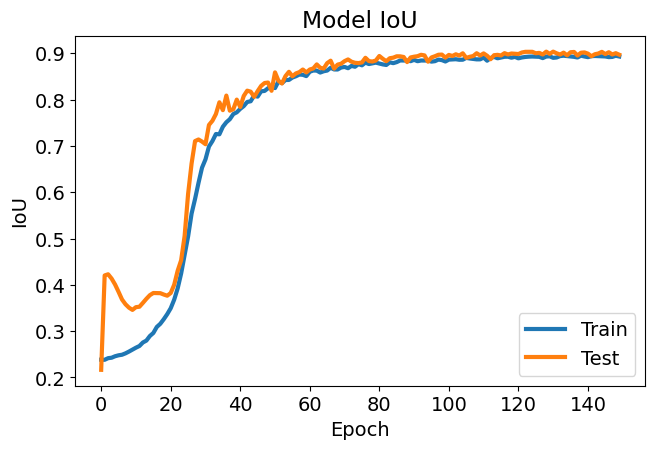

In [70]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history2['train_miou']]
val_miou = [x.cpu().numpy() for x in history2['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


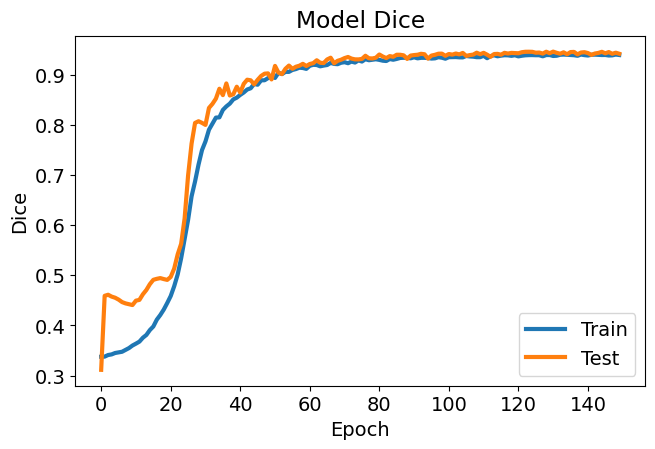

In [71]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history2['train_dice']]
val_miou = [x.cpu().numpy() for x in history2['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


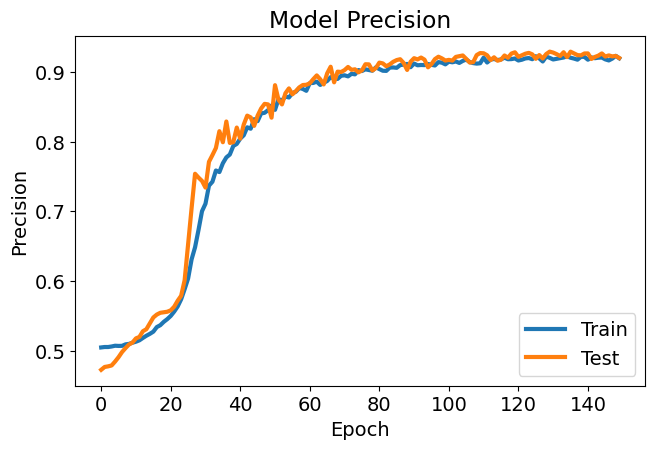

In [72]:
trainX = [x.cpu().numpy() for x in history2['train_Precision']]
valX = [x.cpu().numpy() for x in history2['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

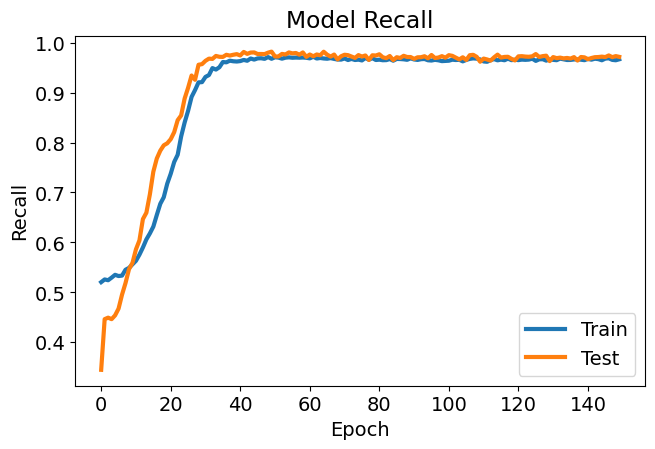

In [73]:
trainX = [x.cpu().numpy() for x in history2['train_recall']]
valX = [x.cpu().numpy() for x in history2['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

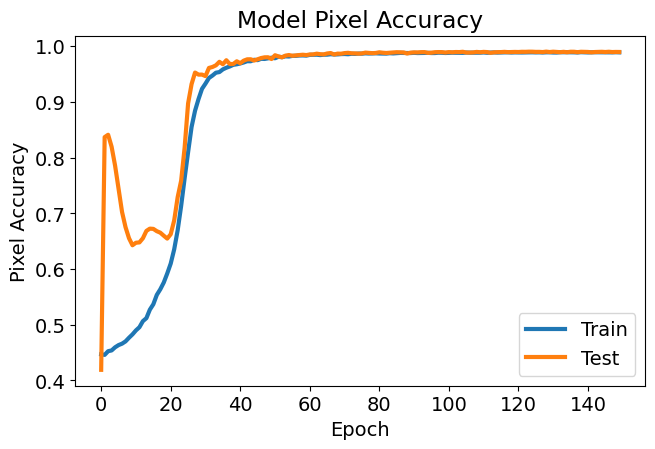

In [74]:
trainX = [x.cpu().numpy() for x in history2['train_acc']]
valX = [x.cpu().numpy() for x in history2['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

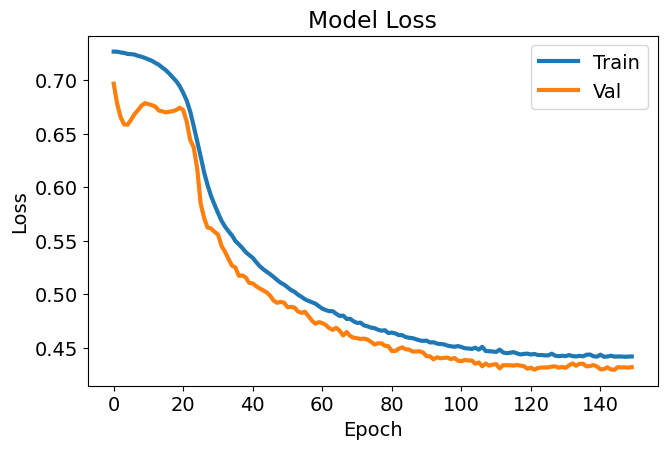

In [91]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history2['train_loss'])
plt.plot(history2['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [76]:
mob_miou = miou_score(model2, test_set)
dice_miou = dice_score_model(model2, test_set)
mob_acc = pixel_acc(model2, test_set)

100%|██████████| 61/61 [00:00<00:00, 79.68it/s]


In [77]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.9056109066176975
0.9478886604014638
0.9906466124487705


100%|██████████| 61/61 [00:00<00:00, 88.56it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


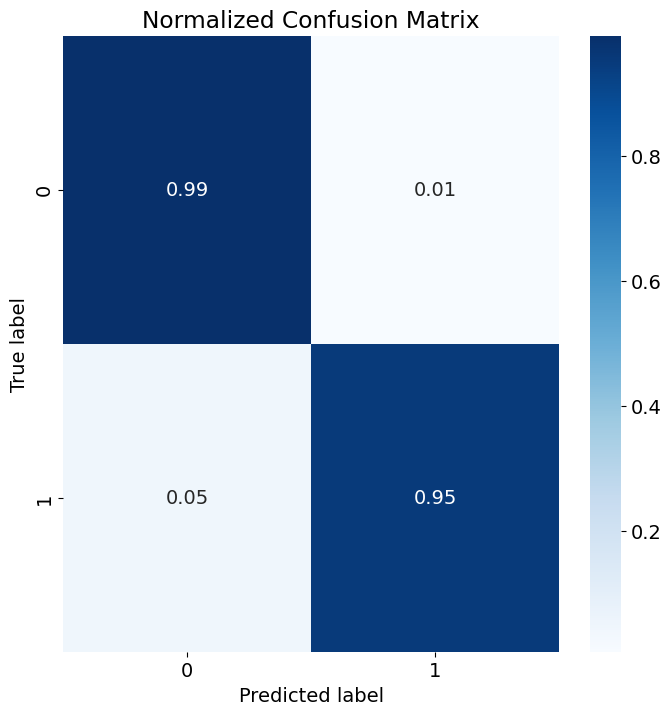

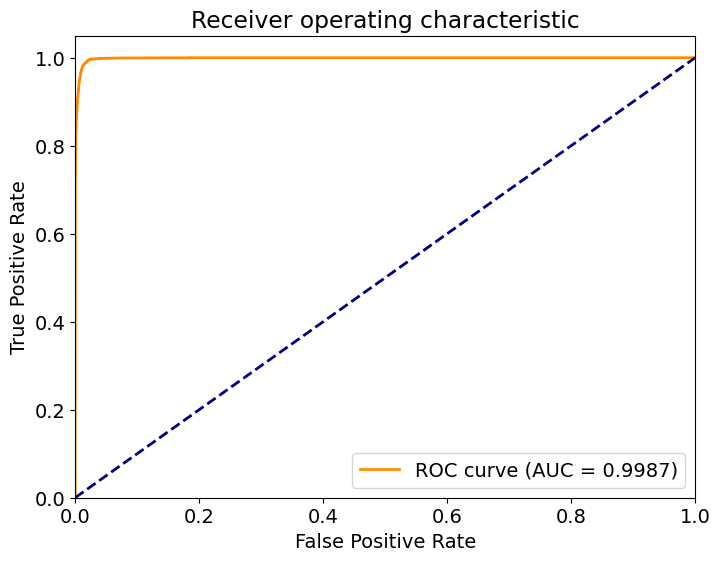

In [78]:
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model2, test_set)


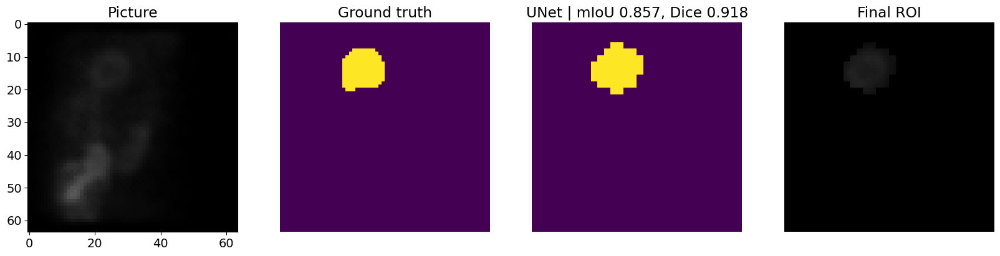

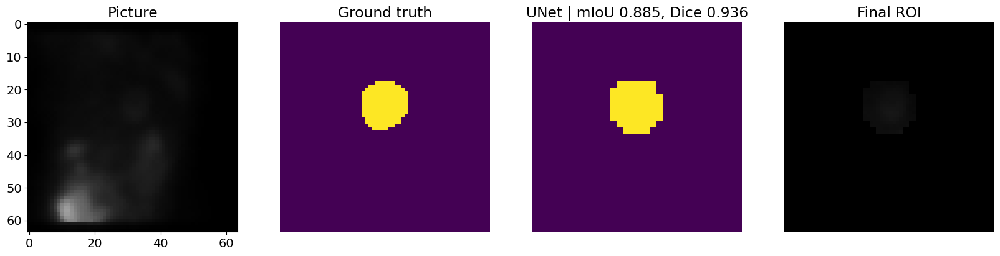

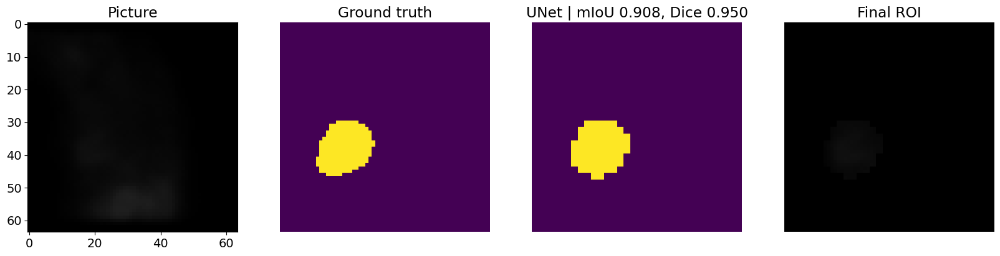

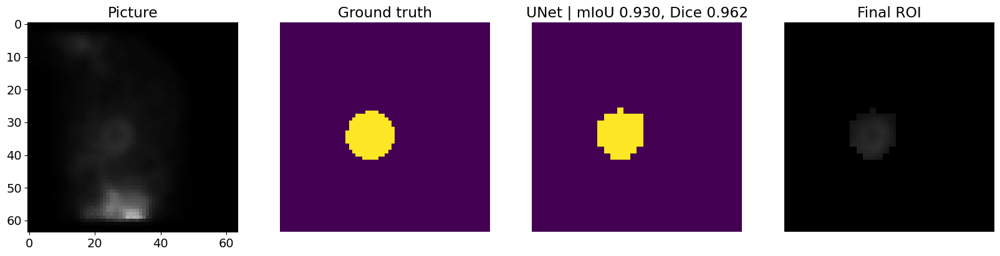

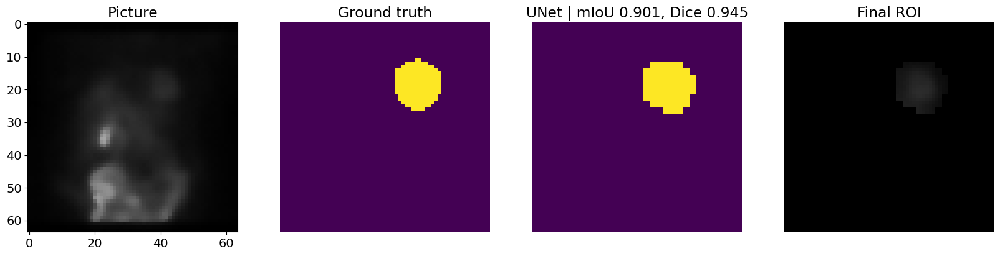

...

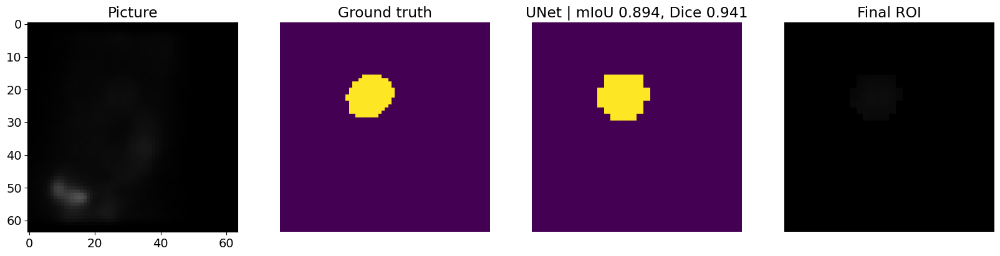

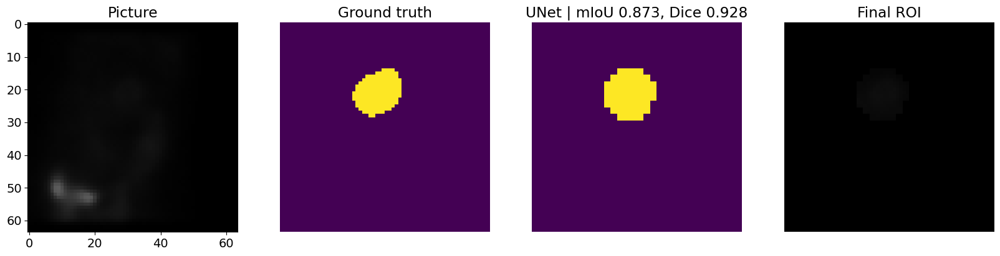

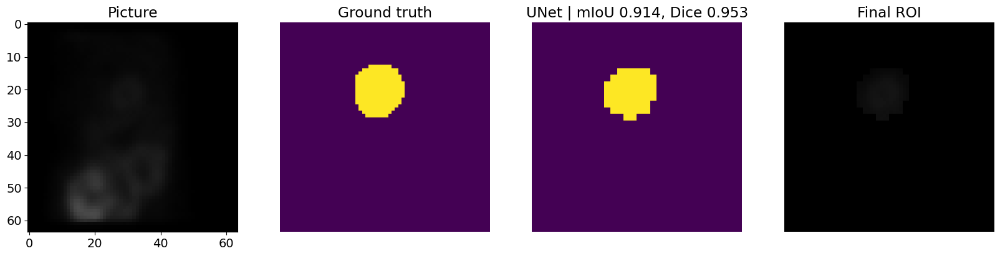

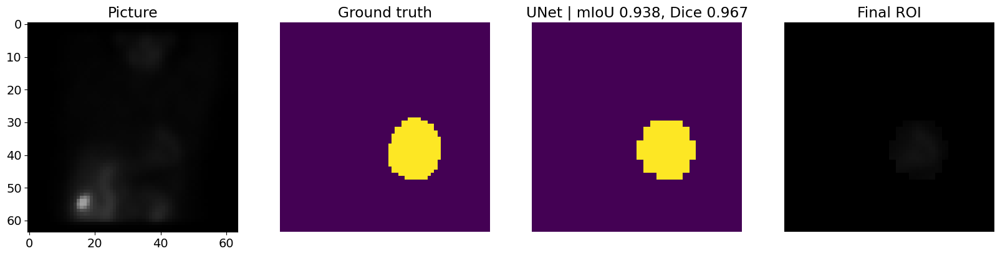

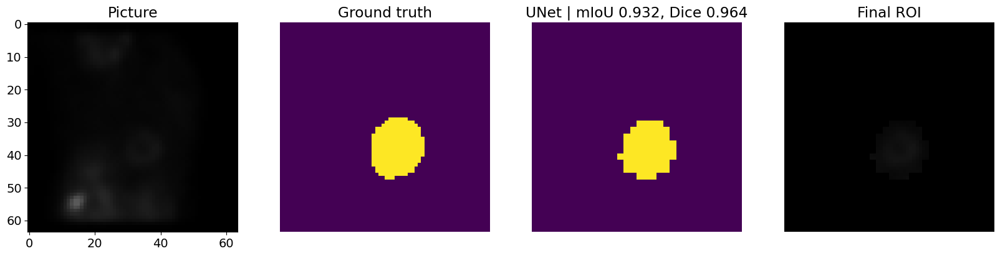

In [79]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model2, image, mask)
    pred_mask, score = predict_image_mask_miou(model2, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# VGG with Attention

In [80]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def double_conv(in_c, out_c):
    conv = nn.Sequential(
        nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
    )
    return conv

def crop_img(tensor, target_tensor):
    target_size = target_tensor.size()[2]
    tensor_size = tensor.size()[2]
    delta = tensor_size - target_size
    delta = delta // 2
    return tensor[:, :, delta:tensor_size - delta, delta:tensor_size - delta]

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class UNet3(nn.Module):
    def __init__(self, num_channels, num_classes, retain_dim=True):
        super(UNet3, self).__init__()

        self.max_pool_2x2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_conv_1 = double_conv(num_channels, out_c=64)
        self.down_conv_2 = double_conv(in_c=64, out_c=128)
        self.down_conv_3 = double_conv(in_c=128, out_c=256)

        self.up_trans_1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2)
        self.up_conv_1 = double_conv(256, 128)
        self.attn1 = AttentionBlock(F_g=128, F_l=128, F_int=64)

        self.up_trans_2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.up_conv_2 = double_conv(128, 64)
        self.attn2 = AttentionBlock(F_g=64, F_l=64, F_int=32)

        self.out = nn.Conv2d(
            in_channels=64,
            out_channels=num_classes,  # Number of objects to segment
            kernel_size=1,
        )
        self.retain_dim = retain_dim

    def forward(self, image, out_size=(64, 64)):
        # encoder part
        x1 = self.down_conv_1(image)
        x2 = self.max_pool_2x2(x1)
        x3 = self.down_conv_2(x2)
        x4 = self.max_pool_2x2(x3)
        x5 = self.down_conv_3(x4)

        # decoder part
        x = self.up_trans_1(x5)
        y = crop_img(x3, x)
        y = self.attn1(g=x, x=y)
        x = self.up_conv_1(torch.cat([x, y], 1))

        x = self.up_trans_2(x)
        y = crop_img(x1, x)
        y = self.attn2(g=x, x=y)
        x = self.up_conv_2(torch.cat([x, y], 1))

        x = self.out(x)
        if self.retain_dim:
            x = F.interpolate(x, out_size)
        x = F.softmax(x, dim=1)
        return x


# Example usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model3 = UNet3(num_classes=2, num_channels=3).to(device)


In [81]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model3.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history3 = fit(epoch, model3, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.61it/s]
<ipython-input-46-0c94c4132b9a>:373: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = results._append({'Epoch': epoch,


Loss Decreasing.. inf >> 0.660 
Epoch:1/150.. Train Loss: 0.710.. Val Loss: 0.660.. Train mIoU:0.272.. Val mIoU: 0.477.. Train Dice:0.369.. Val Dice: 0.488.. Train Precision:0.498.. Val Precision: 0.977.. Train Recall:0.486.. Val Recall: 0.500.. Train TP:2026.614.. Train TP2:84.928.. Train TN:84.928.. Train TN2:2026.614.. Train FP:101.319.. Train FP2:1883.140.. Train FN:1883.140.. Train FN2:101.319.. Val TP: 3906.557.. Val TN: 0.000.. Val FP: 189.443.. Val FN: 0.000.. Train Accuracy:0.516.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Loss Not Decrease for 1 time
Epoch:2/150.. Train Loss: 0.704.. Val Loss: 0.665.. Train mIoU:0.292.. Val mIoU: 0.477.. Train Dice:0.385.. Val Dice: 0.488.. Train Precision:0.499.. Val Precision: 0.977.. Train Recall:0.491.. Val Recall: 0.500.. Train TP:2189.584.. Train TP2:78.511.. Train TN:78.511.. Train TN2:2189.584.. Train FP:108.051.. Train FP2:1719.854.. Train FN:1719.854.. Train FN2:108.051.. Val TP: 3908.197.. Val TN: 0.000.. Val FP: 187.803.. Val FN: 0.000.. Train Accuracy:0.554.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Loss Not Decrease for 2 time
Epoch:3/150.. Train Loss: 0.700.. Val Loss: 0.669.. Train mIoU:0.310.. Val mIoU: 0.477.. Train Dice:0.398.. Val Dice: 0.488.. Train Precision:0.500.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:2346.483.. Train TP2:72.438.. Train TN:72.438.. Train TN2:2346.483.. Train FP:112.871.. Train FP2:1564.208.. Train FN:1564.208.. Train FN2:112.871.. Val TP: 3907.098.. Val TN: 0.000.. Val FP: 188.902.. Val FN: 0.000.. Train Accuracy:0.591.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


Loss Not Decrease for 3 time
Epoch:4/150.. Train Loss: 0.694.. Val Loss: 0.671.. Train mIoU:0.329.. Val mIoU: 0.477.. Train Dice:0.412.. Val Dice: 0.488.. Train Precision:0.499.. Val Precision: 0.797.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:2507.784.. Train TP2:65.308.. Train TN:65.308.. Train TN2:2507.784.. Train FP:121.830.. Train FP2:1401.079.. Train FN:1401.079.. Train FN2:121.830.. Val TP: 3907.803.. Val TN: 0.000.. Val FP: 187.410.. Val FN: 0.787.. Train Accuracy:0.628.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


Loss Decreasing.. 0.671 >> 0.669 
Epoch:5/150.. Train Loss: 0.687.. Val Loss: 0.669.. Train mIoU:0.352.. Val mIoU: 0.474.. Train Dice:0.427.. Val Dice: 0.487.. Train Precision:0.499.. Val Precision: 0.477.. Train Recall:0.502.. Val Recall: 0.497.. Train TP:2706.927.. Train TP2:56.570.. Train TN:56.570.. Train TN2:2706.927.. Train FP:127.687.. Train FP2:1204.816.. Train FN:1204.816.. Train FN2:127.687.. Val TP: 3885.557.. Val TN: 0.000.. Val FP: 187.098.. Val FN: 23.344.. Train Accuracy:0.675.. Val Accuracy:0.949.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


Loss Decreasing.. 0.669 >> 0.665 
Epoch:6/150.. Train Loss: 0.681.. Val Loss: 0.665.. Train mIoU:0.372.. Val mIoU: 0.465.. Train Dice:0.437.. Val Dice: 0.482.. Train Precision:0.499.. Val Precision: 0.477.. Train Recall:0.505.. Val Recall: 0.487.. Train TP:2879.791.. Train TP2:49.806.. Train TN:49.806.. Train TN2:2879.791.. Train FP:136.102.. Train FP2:1030.301.. Train FN:1030.301.. Train FN2:136.102.. Val TP: 3804.360.. Val TN: 0.115.. Val FP: 189.361.. Val FN: 102.164.. Train Accuracy:0.715.. Val Accuracy:0.929.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Decreasing.. 0.665 >> 0.658 
saving model...
Epoch:7/150.. Train Loss: 0.673.. Val Loss: 0.658.. Train mIoU:0.390.. Val mIoU: 0.462.. Train Dice:0.448.. Val Dice: 0.481.. Train Precision:0.499.. Val Precision: 0.478.. Train Recall:0.509.. Val Recall: 0.484.. Train TP:3043.309.. Train TP2:44.013.. Train TN:44.013.. Train TN2:3043.309.. Train FP:142.265.. Train FP2:866.412.. Train FN:866.412.. Train FN2:142.265.. Val TP: 3777.393.. Val TN: 0.393.. Val FP: 184.852.. Val FN: 133.361.. Train Accuracy:0.754.. Val Accuracy:0.922.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Loss Decreasing.. 0.658 >> 0.647 
Epoch:8/150.. Train Loss: 0.665.. Val Loss: 0.647.. Train mIoU:0.403.. Val mIoU: 0.460.. Train Dice:0.454.. Val Dice: 0.482.. Train Precision:0.498.. Val Precision: 0.480.. Train Recall:0.510.. Val Recall: 0.484.. Train TP:3166.189.. Train TP2:40.200.. Train TN:40.200.. Train TN2:3166.189.. Train FP:146.575.. Train FP2:743.036.. Train FN:743.036.. Train FN2:146.575.. Val TP: 3756.229.. Val TN: 1.246.. Val FP: 185.459.. Val FN: 153.066.. Train Accuracy:0.783.. Val Accuracy:0.917.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Loss Decreasing.. 0.647 >> 0.635 
Epoch:9/150.. Train Loss: 0.656.. Val Loss: 0.635.. Train mIoU:0.415.. Val mIoU: 0.461.. Train Dice:0.457.. Val Dice: 0.483.. Train Precision:0.493.. Val Precision: 0.482.. Train Recall:0.508.. Val Recall: 0.486.. Train TP:3302.669.. Train TP2:30.443.. Train TN:30.443.. Train TN2:3302.669.. Train FP:154.825.. Train FP2:608.063.. Train FN:608.063.. Train FN2:154.825.. Val TP: 3755.738.. Val TN: 1.721.. Val FP: 188.689.. Val FN: 149.852.. Train Accuracy:0.814.. Val Accuracy:0.917.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


Loss Decreasing.. 0.635 >> 0.621 
Epoch:10/150.. Train Loss: 0.646.. Val Loss: 0.621.. Train mIoU:0.422.. Val mIoU: 0.460.. Train Dice:0.459.. Val Dice: 0.481.. Train Precision:0.490.. Val Precision: 0.479.. Train Recall:0.510.. Val Recall: 0.483.. Train TP:3378.474.. Train TP2:29.103.. Train TN:29.103.. Train TN2:3378.474.. Train FP:158.550.. Train FP2:529.873.. Train FN:529.873.. Train FN2:158.550.. Val TP: 3756.901.. Val TN: 0.918.. Val FP: 186.410.. Val FN: 151.770.. Train Accuracy:0.832.. Val Accuracy:0.917.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.60it/s]


Loss Decreasing.. 0.621 >> 0.607 
Epoch:11/150.. Train Loss: 0.631.. Val Loss: 0.607.. Train mIoU:0.433.. Val mIoU: 0.461.. Train Dice:0.467.. Val Dice: 0.480.. Train Precision:0.488.. Val Precision: 0.478.. Train Recall:0.511.. Val Recall: 0.483.. Train TP:3478.271.. Train TP2:24.429.. Train TN:24.429.. Train TN2:3478.271.. Train FP:162.921.. Train FP2:430.379.. Train FN:430.379.. Train FN2:162.921.. Val TP: 3772.032.. Val TN: 0.164.. Val FP: 185.164.. Val FN: 138.639.. Train Accuracy:0.855.. Val Accuracy:0.921.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


Loss Decreasing.. 0.607 >> 0.594 
saving model...
Epoch:12/150.. Train Loss: 0.621.. Val Loss: 0.594.. Train mIoU:0.438.. Val mIoU: 0.462.. Train Dice:0.469.. Val Dice: 0.480.. Train Precision:0.488.. Val Precision: 0.477.. Train Recall:0.508.. Val Recall: 0.484.. Train TP:3527.031.. Train TP2:21.281.. Train TN:21.281.. Train TN2:3527.031.. Train FP:165.070.. Train FP2:382.619.. Train FN:382.619.. Train FN2:165.070.. Val TP: 3783.770.. Val TN: 0.049.. Val FP: 186.885.. Val FN: 125.295.. Train Accuracy:0.866.. Val Accuracy:0.924.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.59it/s]


Loss Decreasing.. 0.594 >> 0.581 
Epoch:13/150.. Train Loss: 0.605.. Val Loss: 0.581.. Train mIoU:0.447.. Val mIoU: 0.463.. Train Dice:0.476.. Val Dice: 0.480.. Train Precision:0.506.. Val Precision: 0.476.. Train Recall:0.510.. Val Recall: 0.485.. Train TP:3596.678.. Train TP2:19.006.. Train TN:19.006.. Train TN2:3596.678.. Train FP:169.738.. Train FP2:310.578.. Train FN:310.578.. Train FN2:169.738.. Val TP: 3789.016.. Val TN: 0.000.. Val FP: 192.082.. Val FN: 114.902.. Train Accuracy:0.883.. Val Accuracy:0.925.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Loss Decreasing.. 0.581 >> 0.568 
Epoch:14/150.. Train Loss: 0.590.. Val Loss: 0.568.. Train mIoU:0.453.. Val mIoU: 0.465.. Train Dice:0.480.. Val Dice: 0.482.. Train Precision:0.614.. Val Precision: 0.476.. Train Recall:0.506.. Val Recall: 0.488.. Train TP:3661.457.. Train TP2:14.592.. Train TN:14.592.. Train TN2:3661.457.. Train FP:171.496.. Train FP2:248.455.. Train FN:248.455.. Train FN2:171.496.. Val TP: 3809.803.. Val TN: 0.000.. Val FP: 189.754.. Val FN: 96.443.. Train Accuracy:0.897.. Val Accuracy:0.930.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Loss Decreasing.. 0.568 >> 0.554 
Epoch:15/150.. Train Loss: 0.575.. Val Loss: 0.554.. Train mIoU:0.457.. Val mIoU: 0.467.. Train Dice:0.480.. Val Dice: 0.483.. Train Precision:0.636.. Val Precision: 0.632.. Train Recall:0.495.. Val Recall: 0.490.. Train TP:3715.562.. Train TP2:7.961.. Train TN:7.961.. Train TN2:3715.562.. Train FP:175.844.. Train FP2:196.632.. Train FN:196.632.. Train FN2:175.844.. Val TP: 3829.442.. Val TN: 0.000.. Val FP: 187.951.. Val FN: 78.607.. Train Accuracy:0.909.. Val Accuracy:0.935.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Loss Decreasing.. 0.554 >> 0.543 
Epoch:16/150.. Train Loss: 0.562.. Val Loss: 0.543.. Train mIoU:0.462.. Val mIoU: 0.470.. Train Dice:0.482.. Val Dice: 0.485.. Train Precision:0.652.. Val Precision: 0.665.. Train Recall:0.496.. Val Recall: 0.493.. Train TP:3756.228.. Train TP2:5.216.. Train TN:5.216.. Train TN2:3756.228.. Train FP:182.144.. Train FP2:152.413.. Train FN:152.413.. Train FN2:182.144.. Val TP: 3852.852.. Val TN: 0.000.. Val FP: 188.475.. Val FN: 54.672.. Train Accuracy:0.918.. Val Accuracy:0.941.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Loss Decreasing.. 0.543 >> 0.530 
saving model...
Epoch:17/150.. Train Loss: 0.548.. Val Loss: 0.530.. Train mIoU:0.465.. Val mIoU: 0.474.. Train Dice:0.484.. Val Dice: 0.487.. Train Precision:0.683.. Val Precision: 0.682.. Train Recall:0.499.. Val Recall: 0.497.. Train TP:3784.094.. Train TP2:5.432.. Train TN:5.432.. Train TN2:3784.094.. Train FP:181.149.. Train FP2:125.326.. Train FN:125.326.. Train FN2:181.149.. Val TP: 3882.016.. Val TN: 0.000.. Val FP: 187.361.. Val FN: 26.623.. Train Accuracy:0.925.. Val Accuracy:0.948.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.53it/s]


Loss Decreasing.. 0.530 >> 0.521 
Epoch:18/150.. Train Loss: 0.538.. Val Loss: 0.521.. Train mIoU:0.467.. Val mIoU: 0.476.. Train Dice:0.484.. Val Dice: 0.488.. Train Precision:0.711.. Val Precision: 0.723.. Train Recall:0.495.. Val Recall: 0.498.. Train TP:3818.485.. Train TP2:2.317.. Train TN:2.317.. Train TN2:3818.485.. Train FP:183.832.. Train FP2:91.366.. Train FN:91.366.. Train FN2:183.832.. Val TP: 3896.557.. Val TN: 0.000.. Val FP: 187.508.. Val FN: 11.934.. Train Accuracy:0.933.. Val Accuracy:0.951.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


Loss Decreasing.. 0.521 >> 0.508 
Epoch:19/150.. Train Loss: 0.530.. Val Loss: 0.508.. Train mIoU:0.469.. Val mIoU: 0.477.. Train Dice:0.485.. Val Dice: 0.488.. Train Precision:0.767.. Val Precision: 0.764.. Train Recall:0.496.. Val Recall: 0.499.. Train TP:3833.161.. Train TP2:2.035.. Train TN:2.035.. Train TN2:3833.161.. Train FP:182.081.. Train FP2:78.722.. Train FN:78.722.. Train FN2:182.081.. Val TP: 3903.524.. Val TN: 0.000.. Val FP: 187.984.. Val FN: 4.492.. Train Accuracy:0.936.. Val Accuracy:0.953.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.66it/s]


Loss Decreasing.. 0.508 >> 0.500 
Epoch:20/150.. Train Loss: 0.522.. Val Loss: 0.500.. Train mIoU:0.472.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.834.. Val Precision: 0.863.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3855.405.. Train TP2:1.641.. Train TN:1.641.. Train TN2:3855.405.. Train FP:184.799.. Train FP2:54.156.. Train FN:54.156.. Train FN2:184.799.. Val TP: 3909.049.. Val TN: 0.000.. Val FP: 186.180.. Val FN: 0.770.. Train Accuracy:0.942.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Loss Decreasing.. 0.500 >> 0.498 
Epoch:21/150.. Train Loss: 0.517.. Val Loss: 0.498.. Train mIoU:0.471.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.869.. Val Precision: 0.945.. Train Recall:0.496.. Val Recall: 0.500.. Train TP:3852.084.. Train TP2:1.267.. Train TN:1.267.. Train TN2:3852.084.. Train FP:186.825.. Train FP2:55.824.. Train FN:55.824.. Train FN2:186.825.. Val TP: 3911.131.. Val TN: 0.000.. Val FP: 184.770.. Val FN: 0.098.. Train Accuracy:0.941.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Loss Decreasing.. 0.498 >> 0.496 
saving model...
Epoch:22/150.. Train Loss: 0.511.. Val Loss: 0.496.. Train mIoU:0.472.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.918.. Val Precision: 0.961.. Train Recall:0.495.. Val Recall: 0.500.. Train TP:3868.838.. Train TP2:0.202.. Train TN:0.202.. Train TN2:3868.838.. Train FP:187.618.. Train FP2:39.343.. Train FN:39.343.. Train FN2:187.618.. Val TP: 3908.147.. Val TN: 0.000.. Val FP: 187.738.. Val FN: 0.115.. Train Accuracy:0.945.. Val Accuracy:0.954.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.72it/s]


Loss Decreasing.. 0.496 >> 0.490 
Epoch:23/150.. Train Loss: 0.507.. Val Loss: 0.490.. Train mIoU:0.473.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.926.. Val Precision: 0.961.. Train Recall:0.496.. Val Recall: 0.500.. Train TP:3872.919.. Train TP2:0.391.. Train TN:0.391.. Train TN2:3872.919.. Train FP:185.427.. Train FP2:37.263.. Train FN:37.263.. Train FN2:185.427.. Val TP: 3908.016.. Val TN: 0.000.. Val FP: 187.902.. Val FN: 0.082.. Train Accuracy:0.946.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.66it/s]


Loss Decreasing.. 0.490 >> 0.487 
Epoch:24/150.. Train Loss: 0.502.. Val Loss: 0.487.. Train mIoU:0.474.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.932.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3879.408.. Train TP2:0.202.. Train TN:0.202.. Train TN2:3879.408.. Train FP:186.990.. Train FP2:29.401.. Train FN:29.401.. Train FN2:186.990.. Val TP: 3907.983.. Val TN: 0.000.. Val FP: 188.016.. Val FN: 0.000.. Train Accuracy:0.947.. Val Accuracy:0.954.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Loss Not Decrease for 4 time
Epoch:25/150.. Train Loss: 0.504.. Val Loss: 0.491.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.490.. Val Dice: 0.488.. Train Precision:0.888.. Val Precision: 0.977.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3869.944.. Train TP2:1.261.. Train TN:1.261.. Train TN2:3869.944.. Train FP:184.615.. Train FP2:40.180.. Train FN:40.180.. Train FN2:184.615.. Val TP: 3903.705.. Val TN: 0.000.. Val FP: 192.295.. Val FN: 0.000.. Train Accuracy:0.945.. Val Accuracy:0.953.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.58it/s]


Loss Not Decrease for 5 time
Epoch:26/150.. Train Loss: 0.508.. Val Loss: 0.499.. Train mIoU:0.467.. Val mIoU: 0.473.. Train Dice:0.484.. Val Dice: 0.486.. Train Precision:0.884.. Val Precision: 0.780.. Train Recall:0.497.. Val Recall: 0.496.. Train TP:3811.693.. Train TP2:3.530.. Train TN:3.530.. Train TN2:3811.693.. Train FP:182.443.. Train FP2:98.335.. Train FN:98.335.. Train FN2:182.443.. Val TP: 3876.770.. Val TN: 0.000.. Val FP: 185.131.. Val FN: 34.098.. Train Accuracy:0.931.. Val Accuracy:0.946.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Loss Decreasing.. 0.499 >> 0.486 
Epoch:27/150.. Train Loss: 0.514.. Val Loss: 0.486.. Train mIoU:0.465.. Val mIoU: 0.476.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.865.. Val Precision: 0.879.. Train Recall:0.514.. Val Recall: 0.499.. Train TP:3763.571.. Train TP2:12.457.. Train TN:12.457.. Train TN2:3763.571.. Train FP:173.501.. Train FP2:146.471.. Train FN:146.471.. Train FN2:173.501.. Val TP: 3900.754.. Val TN: 0.000.. Val FP: 189.229.. Val FN: 6.016.. Train Accuracy:0.922.. Val Accuracy:0.952.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Loss Decreasing.. 0.486 >> 0.472 
Epoch:28/150.. Train Loss: 0.505.. Val Loss: 0.472.. Train mIoU:0.467.. Val mIoU: 0.477.. Train Dice:0.485.. Val Dice: 0.488.. Train Precision:0.861.. Val Precision: 0.977.. Train Recall:0.501.. Val Recall: 0.500.. Train TP:3809.405.. Train TP2:4.984.. Train TN:4.984.. Train TN2:3809.405.. Train FP:181.604.. Train FP2:100.007.. Train FN:100.007.. Train FN2:181.604.. Val TP: 3905.803.. Val TN: 0.000.. Val FP: 190.197.. Val FN: 0.000.. Train Accuracy:0.931.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.44it/s]


Loss Decreasing.. 0.472 >> 0.466 
saving model...
Epoch:29/150.. Train Loss: 0.497.. Val Loss: 0.466.. Train mIoU:0.472.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.882.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3858.059.. Train TP2:1.561.. Train TN:1.561.. Train TN2:3858.059.. Train FP:183.875.. Train FP2:52.505.. Train FN:52.505.. Train FN2:183.875.. Val TP: 3910.377.. Val TN: 0.000.. Val FP: 185.623.. Val FN: 0.000.. Train Accuracy:0.942.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


Loss Decreasing.. 0.466 >> 0.463 
Epoch:30/150.. Train Loss: 0.491.. Val Loss: 0.463.. Train mIoU:0.472.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.904.. Val Precision: 0.977.. Train Recall:0.496.. Val Recall: 0.500.. Train TP:3868.061.. Train TP2:0.334.. Train TN:0.334.. Train TN2:3868.061.. Train FP:187.027.. Train FP2:40.578.. Train FN:40.578.. Train FN2:187.027.. Val TP: 3906.573.. Val TN: 0.000.. Val FP: 189.426.. Val FN: 0.000.. Train Accuracy:0.944.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


Loss Not Decrease for 6 time
Epoch:31/150.. Train Loss: 0.487.. Val Loss: 0.469.. Train mIoU:0.474.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.929.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3883.973.. Train TP2:0.191.. Train TN:0.191.. Train TN2:3883.973.. Train FP:185.965.. Train FP2:25.872.. Train FN:25.872.. Train FN2:185.965.. Val TP: 3905.229.. Val TN: 0.000.. Val FP: 190.770.. Val FN: 0.000.. Train Accuracy:0.948.. Val Accuracy:0.953.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Loss Decreasing.. 0.469 >> 0.463 
Epoch:32/150.. Train Loss: 0.483.. Val Loss: 0.463.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.936.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3889.641.. Train TP2:0.009.. Train TN:0.009.. Train TN2:3889.641.. Train FP:184.447.. Train FP2:21.902.. Train FN:21.902.. Train FN2:184.447.. Val TP: 3911.131.. Val TN: 0.000.. Val FP: 184.869.. Val FN: 0.000.. Train Accuracy:0.950.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


Loss Not Decrease for 7 time
Epoch:33/150.. Train Loss: 0.481.. Val Loss: 0.472.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.936.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3887.668.. Train TP2:0.047.. Train TN:0.047.. Train TN2:3887.668.. Train FP:185.606.. Train FP2:22.679.. Train FN:22.679.. Train FN2:185.606.. Val TP: 3910.492.. Val TN: 0.000.. Val FP: 185.508.. Val FN: 0.000.. Train Accuracy:0.949.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Loss Decreasing.. 0.472 >> 0.465 
Epoch:34/150.. Train Loss: 0.479.. Val Loss: 0.465.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.942.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3894.636.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3894.636.. Train FP:185.378.. Train FP2:15.985.. Train FN:15.985.. Train FN2:185.378.. Val TP: 3910.901.. Val TN: 0.000.. Val FP: 185.098.. Val FN: 0.000.. Train Accuracy:0.951.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Loss Decreasing.. 0.465 >> 0.464 
Epoch:35/150.. Train Loss: 0.477.. Val Loss: 0.464.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.940.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3891.819.. Train TP2:0.220.. Train TN:0.220.. Train TN2:3891.819.. Train FP:185.967.. Train FP2:17.994.. Train FN:17.994.. Train FN2:185.967.. Val TP: 3910.639.. Val TN: 0.000.. Val FP: 185.361.. Val FN: 0.000.. Train Accuracy:0.950.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


Loss Not Decrease for 8 time
Epoch:36/150.. Train Loss: 0.479.. Val Loss: 0.468.. Train mIoU:0.473.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.919.. Val Precision: 0.977.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3863.322.. Train TP2:1.928.. Train TN:1.928.. Train TN2:3863.322.. Train FP:183.137.. Train FP2:47.613.. Train FN:47.613.. Train FN2:183.137.. Val TP: 3905.508.. Val TN: 0.000.. Val FP: 190.492.. Val FN: 0.000.. Train Accuracy:0.944.. Val Accuracy:0.953.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.51it/s]


Loss Decreasing.. 0.468 >> 0.454 
saving model...
Epoch:37/150.. Train Loss: 0.478.. Val Loss: 0.454.. Train mIoU:0.472.. Val mIoU: 0.477.. Train Dice:0.486.. Val Dice: 0.488.. Train Precision:0.910.. Val Precision: 0.977.. Train Recall:0.495.. Val Recall: 0.500.. Train TP:3863.223.. Train TP2:0.533.. Train TN:0.533.. Train TN2:3863.223.. Train FP:184.834.. Train FP2:47.410.. Train FN:47.410.. Train FN2:184.834.. Val TP: 3905.738.. Val TN: 0.000.. Val FP: 190.262.. Val FN: 0.000.. Train Accuracy:0.943.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Loss Not Decrease for 9 time
Epoch:38/150.. Train Loss: 0.473.. Val Loss: 0.459.. Train mIoU:0.474.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.935.. Val Precision: 0.977.. Train Recall:0.497.. Val Recall: 0.500.. Train TP:3885.681.. Train TP2:0.064.. Train TN:0.064.. Train TN2:3885.681.. Train FP:186.471.. Train FP2:23.784.. Train FN:23.784.. Train FN2:186.471.. Val TP: 3909.475.. Val TN: 0.000.. Val FP: 186.525.. Val FN: 0.000.. Train Accuracy:0.949.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.68it/s]


Loss Decreasing.. 0.459 >> 0.456 
Epoch:39/150.. Train Loss: 0.469.. Val Loss: 0.456.. Train mIoU:0.476.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.949.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3897.063.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3897.063.. Train FP:185.870.. Train FP2:13.067.. Train FN:13.067.. Train FN2:185.870.. Val TP: 3907.656.. Val TN: 0.000.. Val FP: 188.344.. Val FN: 0.000.. Train Accuracy:0.951.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Loss Not Decrease for 10 time
Epoch:40/150.. Train Loss: 0.467.. Val Loss: 0.457.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.949.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3894.385.. Train TP2:0.033.. Train TN:0.033.. Train TN2:3894.385.. Train FP:185.998.. Train FP2:15.585.. Train FN:15.585.. Train FN2:185.998.. Val TP: 3905.541.. Val TN: 0.000.. Val FP: 190.459.. Val FN: 0.000.. Train Accuracy:0.951.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


Loss Not Decrease for 11 time
Epoch:41/150.. Train Loss: 0.466.. Val Loss: 0.459.. Train mIoU:0.476.. Val mIoU: 0.477.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.950.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3895.423.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3895.423.. Train FP:187.188.. Train FP2:13.390.. Train FN:13.390.. Train FN2:187.188.. Val TP: 3908.377.. Val TN: 0.000.. Val FP: 187.623.. Val FN: 0.000.. Train Accuracy:0.951.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


Loss Decreasing.. 0.459 >> 0.451 
Epoch:42/150.. Train Loss: 0.463.. Val Loss: 0.451.. Train mIoU:0.476.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.946.. Val Precision: 0.977.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3899.572.. Train TP2:0.058.. Train TN:0.058.. Train TN2:3899.572.. Train FP:184.179.. Train FP2:12.191.. Train FN:12.191.. Train FN2:184.179.. Val TP: 3908.656.. Val TN: 0.000.. Val FP: 187.344.. Val FN: 0.000.. Train Accuracy:0.952.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.60it/s]


Loss Not Decrease for 12 time
Epoch:43/150.. Train Loss: 0.461.. Val Loss: 0.453.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.490.. Val Dice: 0.488.. Train Precision:0.932.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3901.157.. Train TP2:0.435.. Train TN:0.435.. Train TN2:3901.157.. Train FP:183.786.. Train FP2:10.622.. Train FN:10.622.. Train FN2:183.786.. Val TP: 3910.082.. Val TN: 0.000.. Val FP: 185.918.. Val FN: 0.000.. Train Accuracy:0.953.. Val Accuracy:0.955.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Decreasing.. 0.453 >> 0.441 
Epoch:44/150.. Train Loss: 0.460.. Val Loss: 0.441.. Train mIoU:0.476.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.956.. Val Precision: 0.977.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3899.302.. Train TP2:0.002.. Train TN:0.002.. Train TN2:3899.302.. Train FP:185.512.. Train FP2:11.184.. Train FN:11.184.. Train FN2:185.512.. Val TP: 3907.918.. Val TN: 0.000.. Val FP: 188.082.. Val FN: 0.000.. Train Accuracy:0.952.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.53it/s]


Loss Not Decrease for 13 time
Epoch:45/150.. Train Loss: 0.459.. Val Loss: 0.452.. Train mIoU:0.486.. Val mIoU: 0.478.. Train Dice:0.502.. Val Dice: 0.489.. Train Precision:0.932.. Val Precision: 0.977.. Train Recall:0.510.. Val Recall: 0.501.. Train TP:3894.155.. Train TP2:4.345.. Train TN:4.345.. Train TN2:3894.155.. Train FP:182.488.. Train FP2:15.012.. Train FN:15.012.. Train FN2:182.488.. Val TP: 3909.573.. Val TN: 0.213.. Val FP: 186.213.. Val FN: 0.000.. Train Accuracy:0.952.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Loss Not Decrease for 14 time
Epoch:46/150.. Train Loss: 0.458.. Val Loss: 0.452.. Train mIoU:0.475.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.935.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3884.344.. Train TP2:0.197.. Train TN:0.197.. Train TN2:3884.344.. Train FP:189.038.. Train FP2:22.421.. Train FN:22.421.. Train FN2:189.038.. Val TP: 3911.131.. Val TN: 0.000.. Val FP: 184.869.. Val FN: 0.000.. Train Accuracy:0.948.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Loss Decreasing.. 0.452 >> 0.447 
Epoch:47/150.. Train Loss: 0.457.. Val Loss: 0.447.. Train mIoU:0.476.. Val mIoU: 0.478.. Train Dice:0.489.. Val Dice: 0.489.. Train Precision:0.928.. Val Precision: 0.977.. Train Recall:0.498.. Val Recall: 0.500.. Train TP:3886.878.. Train TP2:0.460.. Train TN:0.460.. Train TN2:3886.878.. Train FP:186.464.. Train FP2:22.198.. Train FN:22.198.. Train FN2:186.464.. Val TP: 3908.623.. Val TN: 0.131.. Val FP: 187.246.. Val FN: 0.000.. Train Accuracy:0.949.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Loss Decreasing.. 0.447 >> 0.445 
saving model...
Epoch:48/150.. Train Loss: 0.454.. Val Loss: 0.445.. Train mIoU:0.486.. Val mIoU: 0.505.. Train Dice:0.504.. Val Dice: 0.534.. Train Precision:0.920.. Val Precision: 0.904.. Train Recall:0.509.. Val Recall: 0.527.. Train TP:3896.015.. Train TP2:3.660.. Train TN:3.660.. Train TN2:3896.015.. Train FP:181.932.. Train FP2:14.393.. Train FN:14.393.. Train FN2:181.932.. Val TP: 3907.426.. Val TN: 8.361.. Val FP: 177.754.. Val FN: 2.459.. Train Accuracy:0.952.. Val Accuracy:0.956.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Decreasing.. 0.445 >> 0.441 
Epoch:49/150.. Train Loss: 0.453.. Val Loss: 0.441.. Train mIoU:0.492.. Val mIoU: 0.533.. Train Dice:0.514.. Val Dice: 0.574.. Train Precision:0.904.. Val Precision: 0.874.. Train Recall:0.515.. Val Recall: 0.554.. Train TP:3884.986.. Train TP2:6.393.. Train TN:6.393.. Train TN2:3884.986.. Train FP:180.780.. Train FP2:23.841.. Train FN:23.841.. Train FN2:180.780.. Val TP: 3901.885.. Val TN: 17.918.. Val FP: 170.852.. Val FN: 5.344.. Train Accuracy:0.950.. Val Accuracy:0.957.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


Loss Not Decrease for 15 time
Epoch:50/150.. Train Loss: 0.450.. Val Loss: 0.443.. Train mIoU:0.506.. Val mIoU: 0.528.. Train Dice:0.534.. Val Dice: 0.565.. Train Precision:0.890.. Val Precision: 0.881.. Train Recall:0.529.. Val Recall: 0.550.. Train TP:3888.014.. Train TP2:11.537.. Train TN:11.537.. Train TN2:3888.014.. Train FP:172.996.. Train FP2:23.454.. Train FN:23.454.. Train FN2:172.996.. Val TP: 3899.590.. Val TN: 17.311.. Val FP: 171.623.. Val FN: 7.475.. Train Accuracy:0.952.. Val Accuracy:0.956.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


Loss Decreasing.. 0.443 >> 0.439 
Epoch:51/150.. Train Loss: 0.449.. Val Loss: 0.439.. Train mIoU:0.517.. Val mIoU: 0.549.. Train Dice:0.549.. Val Dice: 0.595.. Train Precision:0.889.. Val Precision: 0.876.. Train Recall:0.542.. Val Recall: 0.570.. Train TP:3884.662.. Train TP2:16.238.. Train TN:16.238.. Train TN2:3884.662.. Train FP:171.332.. Train FP2:23.769.. Train FN:23.769.. Train FN2:171.332.. Val TP: 3903.213.. Val TN: 23.049.. Val FP: 161.410.. Val FN: 8.328.. Train Accuracy:0.952.. Val Accuracy:0.959.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.63it/s]


Loss Decreasing.. 0.439 >> 0.438 
Epoch:52/150.. Train Loss: 0.446.. Val Loss: 0.438.. Train mIoU:0.545.. Val mIoU: 0.636.. Train Dice:0.586.. Val Dice: 0.708.. Train Precision:0.895.. Val Precision: 0.878.. Train Recall:0.570.. Val Recall: 0.664.. Train TP:3887.729.. Train TP2:26.789.. Train TN:26.789.. Train TN2:3887.729.. Train FP:160.271.. Train FP2:21.211.. Train FN:21.211.. Train FN2:160.271.. Val TP: 3884.901.. Val TN: 59.672.. Val FP: 129.426.. Val FN: 22.000.. Train Accuracy:0.956.. Val Accuracy:0.963.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Loss Decreasing.. 0.438 >> 0.433 
Epoch:53/150.. Train Loss: 0.443.. Val Loss: 0.433.. Train mIoU:0.573.. Val mIoU: 0.655.. Train Dice:0.621.. Val Dice: 0.730.. Train Precision:0.892.. Val Precision: 0.873.. Train Recall:0.603.. Val Recall: 0.686.. Train TP:3884.104.. Train TP2:37.626.. Train TN:37.626.. Train TN2:3884.104.. Train FP:146.898.. Train FP2:27.373.. Train FN:27.373.. Train FN2:146.898.. Val TP: 3879.770.. Val TN: 68.820.. Val FP: 121.721.. Val FN: 25.689.. Train Accuracy:0.957.. Val Accuracy:0.964.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Loss Not Decrease for 16 time
Epoch:54/150.. Train Loss: 0.441.. Val Loss: 0.443.. Train mIoU:0.591.. Val mIoU: 0.736.. Train Dice:0.644.. Val Dice: 0.815.. Train Precision:0.884.. Val Precision: 0.853.. Train Recall:0.624.. Val Recall: 0.803.. Train TP:3877.440.. Train TP2:47.541.. Train TN:47.541.. Train TN2:3877.440.. Train FP:140.920.. Train FP2:30.099.. Train FN:30.099.. Train FN2:140.920.. Val TP: 3856.869.. Val TN: 112.131.. Val FP: 74.180.. Val FN: 52.820.. Train Accuracy:0.958.. Val Accuracy:0.969.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Not Decrease for 17 time
Epoch:55/150.. Train Loss: 0.441.. Val Loss: 0.463.. Train mIoU:0.612.. Val mIoU: 0.720.. Train Dice:0.669.. Val Dice: 0.808.. Train Precision:0.864.. Val Precision: 0.769.. Train Recall:0.660.. Val Recall: 0.906.. Train TP:3866.964.. Train TP2:60.762.. Train TN:60.762.. Train TN2:3866.964.. Train FP:127.079.. Train FP2:41.195.. Train FN:41.195.. Train FN2:127.079.. Val TP: 3730.246.. Val TN: 162.869.. Val FP: 30.574.. Val FN: 172.311.. Train Accuracy:0.959.. Val Accuracy:0.950.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Loss Decreasing.. 0.463 >> 0.453 
saving model...
Epoch:56/150.. Train Loss: 0.443.. Val Loss: 0.453.. Train mIoU:0.570.. Val mIoU: 0.742.. Train Dice:0.615.. Val Dice: 0.824.. Train Precision:0.880.. Val Precision: 0.806.. Train Recall:0.602.. Val Recall: 0.877.. Train TP:3865.740.. Train TP2:38.822.. Train TN:38.822.. Train TN2:3865.740.. Train FP:148.449.. Train FP2:42.989.. Train FN:42.989.. Train FN2:148.449.. Val TP: 3789.344.. Val TN: 146.246.. Val FP: 43.557.. Val FN: 116.852.. Train Accuracy:0.953.. Val Accuracy:0.961.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.54it/s]


Loss Decreasing.. 0.453 >> 0.442 
Epoch:57/150.. Train Loss: 0.441.. Val Loss: 0.442.. Train mIoU:0.607.. Val mIoU: 0.759.. Train Dice:0.664.. Val Dice: 0.837.. Train Precision:0.877.. Val Precision: 0.833.. Train Recall:0.643.. Val Recall: 0.860.. Train TP:3861.385.. Train TP2:54.234.. Train TN:54.234.. Train TN2:3861.385.. Train FP:132.976.. Train FP2:47.404.. Train FN:47.404.. Train FN2:132.976.. Val TP: 3826.656.. Val TN: 136.246.. Val FP: 50.738.. Val FN: 82.361.. Train Accuracy:0.956.. Val Accuracy:0.968.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


Loss Decreasing.. 0.442 >> 0.433 
Epoch:58/150.. Train Loss: 0.436.. Val Loss: 0.433.. Train mIoU:0.623.. Val mIoU: 0.757.. Train Dice:0.681.. Val Dice: 0.833.. Train Precision:0.851.. Val Precision: 0.870.. Train Recall:0.668.. Val Recall: 0.825.. Train TP:3863.904.. Train TP2:64.299.. Train TN:64.299.. Train TN2:3863.904.. Train FP:120.969.. Train FP2:46.828.. Train FN:46.828.. Train FN2:120.969.. Val TP: 3855.590.. Val TN: 122.066.. Val FP: 63.738.. Val FN: 54.607.. Train Accuracy:0.959.. Val Accuracy:0.971.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Loss Not Decrease for 18 time
Epoch:59/150.. Train Loss: 0.435.. Val Loss: 0.435.. Train mIoU:0.653.. Val mIoU: 0.732.. Train Dice:0.718.. Val Dice: 0.810.. Train Precision:0.850.. Val Precision: 0.929.. Train Recall:0.708.. Val Recall: 0.759.. Train TP:3855.172.. Train TP2:79.376.. Train TN:79.376.. Train TN2:3855.172.. Train FP:108.003.. Train FP2:53.449.. Train FN:53.449.. Train FN2:108.003.. Val TP: 3890.344.. Val TN: 99.344.. Val FP: 89.951.. Val FN: 16.361.. Train Accuracy:0.961.. Val Accuracy:0.974.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Loss Decreasing.. 0.435 >> 0.424 
Epoch:60/150.. Train Loss: 0.432.. Val Loss: 0.424.. Train mIoU:0.646.. Val mIoU: 0.750.. Train Dice:0.708.. Val Dice: 0.825.. Train Precision:0.871.. Val Precision: 0.905.. Train Recall:0.687.. Val Recall: 0.788.. Train TP:3869.963.. Train TP2:70.609.. Train TN:70.609.. Train TN2:3869.963.. Train FP:116.854.. Train FP2:38.574.. Train FN:38.574.. Train FN2:116.854.. Val TP: 3878.672.. Val TN: 108.459.. Val FP: 81.230.. Val FN: 27.639.. Train Accuracy:0.962.. Val Accuracy:0.973.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


Loss Decreasing.. 0.424 >> 0.418 
Epoch:61/150.. Train Loss: 0.431.. Val Loss: 0.418.. Train mIoU:0.670.. Val mIoU: 0.758.. Train Dice:0.741.. Val Dice: 0.833.. Train Precision:0.845.. Val Precision: 0.928.. Train Recall:0.728.. Val Recall: 0.787.. Train TP:3854.397.. Train TP2:85.543.. Train TN:85.543.. Train TN2:3854.397.. Train FP:100.757.. Train FP2:55.303.. Train FN:55.303.. Train FN2:100.757.. Val TP: 3886.131.. Val TN: 108.918.. Val FP: 81.410.. Val FN: 19.541.. Train Accuracy:0.962.. Val Accuracy:0.975.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Decreasing.. 0.418 >> 0.417 
saving model...
Epoch:62/150.. Train Loss: 0.427.. Val Loss: 0.417.. Train mIoU:0.700.. Val mIoU: 0.740.. Train Dice:0.773.. Val Dice: 0.819.. Train Precision:0.856.. Val Precision: 0.946.. Train Recall:0.758.. Val Recall: 0.762.. Train TP:3858.646.. Train TP2:97.220.. Train TN:97.220.. Train TN2:3858.646.. Train FP:88.822.. Train FP2:51.313.. Train FN:51.313.. Train FN2:88.822.. Val TP: 3896.885.. Val TN: 98.098.. Val FP: 89.377.. Val FN: 11.639.. Train Accuracy:0.966.. Val Accuracy:0.975.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


Loss Not Decrease for 19 time
Epoch:63/150.. Train Loss: 0.427.. Val Loss: 0.418.. Train mIoU:0.693.. Val mIoU: 0.734.. Train Dice:0.765.. Val Dice: 0.810.. Train Precision:0.853.. Val Precision: 0.948.. Train Recall:0.749.. Val Recall: 0.760.. Train TP:3855.243.. Train TP2:94.806.. Train TN:94.806.. Train TN2:3855.243.. Train FP:93.171.. Train FP2:52.780.. Train FN:52.780.. Train FN2:93.171.. Val TP: 3896.279.. Val TN: 98.213.. Val FP: 88.492.. Val FN: 13.016.. Train Accuracy:0.964.. Val Accuracy:0.975.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Decreasing.. 0.418 >> 0.414 
Epoch:64/150.. Train Loss: 0.425.. Val Loss: 0.414.. Train mIoU:0.691.. Val mIoU: 0.804.. Train Dice:0.760.. Val Dice: 0.873.. Train Precision:0.860.. Val Precision: 0.916.. Train Recall:0.748.. Val Recall: 0.852.. Train TP:3859.074.. Train TP2:92.432.. Train TN:92.432.. Train TN2:3859.074.. Train FP:93.385.. Train FP2:51.109.. Train FN:51.109.. Train FN2:93.385.. Val TP: 3875.606.. Val TN: 133.131.. Val FP: 55.508.. Val FN: 31.754.. Train Accuracy:0.965.. Val Accuracy:0.979.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


Loss Not Decrease for 20 time
Epoch:65/150.. Train Loss: 0.424.. Val Loss: 0.420.. Train mIoU:0.707.. Val mIoU: 0.765.. Train Dice:0.781.. Val Dice: 0.838.. Train Precision:0.849.. Val Precision: 0.918.. Train Recall:0.772.. Val Recall: 0.821.. Train TP:3850.787.. Train TP2:103.513.. Train TN:103.513.. Train TN2:3850.787.. Train FP:84.424.. Train FP2:57.276.. Train FN:57.276.. Train FN2:84.424.. Val TP: 3871.164.. Val TN: 125.689.. Val FP: 65.410.. Val FN: 33.738.. Train Accuracy:0.965.. Val Accuracy:0.976.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Loss Decreasing.. 0.420 >> 0.414 
Epoch:66/150.. Train Loss: 0.422.. Val Loss: 0.414.. Train mIoU:0.705.. Val mIoU: 0.795.. Train Dice:0.779.. Val Dice: 0.864.. Train Precision:0.856.. Val Precision: 0.927.. Train Recall:0.768.. Val Recall: 0.831.. Train TP:3855.141.. Train TP2:99.868.. Train TN:99.868.. Train TN2:3855.141.. Train FP:85.228.. Train FP2:55.763.. Train FN:55.763.. Train FN2:85.228.. Val TP: 3880.901.. Val TN: 127.902.. Val FP: 66.246.. Val FN: 20.951.. Train Accuracy:0.966.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Loss Not Decrease for 21 time
Epoch:67/150.. Train Loss: 0.420.. Val Loss: 0.414.. Train mIoU:0.723.. Val mIoU: 0.787.. Train Dice:0.796.. Val Dice: 0.857.. Train Precision:0.857.. Val Precision: 0.931.. Train Recall:0.784.. Val Recall: 0.824.. Train TP:3855.548.. Train TP2:107.908.. Train TN:107.908.. Train TN2:3855.548.. Train FP:79.011.. Train FP2:53.533.. Train FN:53.533.. Train FN2:79.011.. Val TP: 3887.000.. Val TN: 123.229.. Val FP: 64.295.. Val FN: 21.475.. Train Accuracy:0.968.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


Loss Decreasing.. 0.414 >> 0.413 
Epoch:68/150.. Train Loss: 0.420.. Val Loss: 0.413.. Train mIoU:0.716.. Val mIoU: 0.815.. Train Dice:0.788.. Val Dice: 0.883.. Train Precision:0.859.. Val Precision: 0.933.. Train Recall:0.778.. Val Recall: 0.857.. Train TP:3855.352.. Train TP2:104.641.. Train TN:104.641.. Train TN2:3855.352.. Train FP:81.169.. Train FP2:54.838.. Train FN:54.838.. Train FN2:81.169.. Val TP: 3887.459.. Val TN: 133.148.. Val FP: 52.148.. Val FN: 23.246.. Train Accuracy:0.967.. Val Accuracy:0.982.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.54it/s]


Loss Not Decrease for 22 time
Epoch:69/150.. Train Loss: 0.420.. Val Loss: 0.415.. Train mIoU:0.716.. Val mIoU: 0.815.. Train Dice:0.785.. Val Dice: 0.880.. Train Precision:0.848.. Val Precision: 0.917.. Train Recall:0.783.. Val Recall: 0.862.. Train TP:3853.437.. Train TP2:106.556.. Train TN:106.556.. Train TN2:3853.437.. Train FP:78.775.. Train FP2:57.232.. Train FN:57.232.. Train FN2:78.775.. Val TP: 3874.082.. Val TN: 136.787.. Val FP: 54.443.. Val FN: 30.689.. Train Accuracy:0.967.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Loss Decreasing.. 0.415 >> 0.409 
Epoch:70/150.. Train Loss: 0.421.. Val Loss: 0.409.. Train mIoU:0.711.. Val mIoU: 0.790.. Train Dice:0.783.. Val Dice: 0.860.. Train Precision:0.853.. Val Precision: 0.937.. Train Recall:0.768.. Val Recall: 0.823.. Train TP:3845.481.. Train TP2:102.714.. Train TN:102.714.. Train TN2:3845.481.. Train FP:85.894.. Train FP2:61.911.. Train FN:61.911.. Train FN2:85.894.. Val TP: 3887.967.. Val TN: 122.229.. Val FP: 67.410.. Val FN: 18.393.. Train Accuracy:0.964.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.66it/s]


Loss Not Decrease for 23 time
Epoch:71/150.. Train Loss: 0.423.. Val Loss: 0.414.. Train mIoU:0.693.. Val mIoU: 0.800.. Train Dice:0.763.. Val Dice: 0.871.. Train Precision:0.833.. Val Precision: 0.909.. Train Recall:0.755.. Val Recall: 0.856.. Train TP:3832.969.. Train TP2:98.851.. Train TN:98.851.. Train TN2:3832.969.. Train FP:88.841.. Train FP2:75.339.. Train FN:75.339.. Train FN2:88.841.. Val TP: 3877.032.. Val TN: 133.393.. Val FP: 51.902.. Val FN: 33.672.. Train Accuracy:0.960.. Val Accuracy:0.979.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Loss Decreasing.. 0.414 >> 0.410 
saving model...
Epoch:72/150.. Train Loss: 0.419.. Val Loss: 0.410.. Train mIoU:0.715.. Val mIoU: 0.805.. Train Dice:0.784.. Val Dice: 0.872.. Train Precision:0.840.. Val Precision: 0.920.. Train Recall:0.782.. Val Recall: 0.848.. Train TP:3843.877.. Train TP2:105.636.. Train TN:105.636.. Train TN2:3843.877.. Train FP:79.575.. Train FP2:66.912.. Train FN:66.912.. Train FN2:79.575.. Val TP: 3883.688.. Val TN: 129.672.. Val FP: 56.279.. Val FN: 26.361.. Train Accuracy:0.964.. Val Accuracy:0.980.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Loss Decreasing.. 0.410 >> 0.406 
Epoch:73/150.. Train Loss: 0.416.. Val Loss: 0.406.. Train mIoU:0.716.. Val mIoU: 0.808.. Train Dice:0.786.. Val Dice: 0.876.. Train Precision:0.858.. Val Precision: 0.937.. Train Recall:0.776.. Val Recall: 0.843.. Train TP:3857.245.. Train TP2:105.300.. Train TN:105.300.. Train TN2:3857.245.. Train FP:81.606.. Train FP2:51.849.. Train FN:51.849.. Train FN2:81.606.. Val TP: 3889.639.. Val TN: 128.164.. Val FP: 58.836.. Val FN: 19.361.. Train Accuracy:0.967.. Val Accuracy:0.981.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


Loss Decreasing.. 0.406 >> 0.404 
Epoch:74/150.. Train Loss: 0.414.. Val Loss: 0.404.. Train mIoU:0.732.. Val mIoU: 0.786.. Train Dice:0.804.. Val Dice: 0.858.. Train Precision:0.852.. Val Precision: 0.949.. Train Recall:0.799.. Val Recall: 0.816.. Train TP:3851.345.. Train TP2:114.095.. Train TN:114.095.. Train TN2:3851.345.. Train FP:72.901.. Train FP2:57.659.. Train FN:57.659.. Train FN2:72.901.. Val TP: 3895.442.. Val TN: 119.164.. Val FP: 66.557.. Val FN: 14.836.. Train Accuracy:0.968.. Val Accuracy:0.980.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


Loss Not Decrease for 24 time
Epoch:75/150.. Train Loss: 0.415.. Val Loss: 0.412.. Train mIoU:0.708.. Val mIoU: 0.834.. Train Dice:0.778.. Val Dice: 0.898.. Train Precision:0.853.. Val Precision: 0.914.. Train Recall:0.775.. Val Recall: 0.895.. Train TP:3847.832.. Train TP2:104.815.. Train TN:104.815.. Train TN2:3847.832.. Train FP:81.314.. Train FP2:62.039.. Train FN:62.039.. Train FN2:81.314.. Val TP: 3876.819.. Val TN: 147.393.. Val FP: 38.295.. Val FN: 33.492.. Train Accuracy:0.965.. Val Accuracy:0.982.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.51it/s]


Loss Decreasing.. 0.412 >> 0.411 
Epoch:76/150.. Train Loss: 0.413.. Val Loss: 0.411.. Train mIoU:0.720.. Val mIoU: 0.819.. Train Dice:0.789.. Val Dice: 0.886.. Train Precision:0.866.. Val Precision: 0.868.. Train Recall:0.769.. Val Recall: 0.920.. Train TP:3860.778.. Train TP2:101.805.. Train TN:101.805.. Train TN2:3860.778.. Train FP:84.810.. Train FP2:48.607.. Train FN:48.607.. Train FN2:84.810.. Val TP: 3840.098.. Val TN: 161.738.. Val FP: 28.459.. Val FN: 65.705.. Train Accuracy:0.967.. Val Accuracy:0.977.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


Loss Decreasing.. 0.411 >> 0.398 
Epoch:77/150.. Train Loss: 0.411.. Val Loss: 0.398.. Train mIoU:0.733.. Val mIoU: 0.811.. Train Dice:0.807.. Val Dice: 0.878.. Train Precision:0.859.. Val Precision: 0.943.. Train Recall:0.807.. Val Recall: 0.846.. Train TP:3850.092.. Train TP2:115.903.. Train TN:115.903.. Train TN2:3850.092.. Train FP:69.077.. Train FP2:60.928.. Train FN:60.928.. Train FN2:69.077.. Val TP: 3889.229.. Val TN: 132.033.. Val FP: 56.590.. Val FN: 18.148.. Train Accuracy:0.968.. Val Accuracy:0.982.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.36it/s]


Loss Not Decrease for 25 time
Epoch:78/150.. Train Loss: 0.410.. Val Loss: 0.408.. Train mIoU:0.741.. Val mIoU: 0.824.. Train Dice:0.810.. Val Dice: 0.889.. Train Precision:0.866.. Val Precision: 0.924.. Train Recall:0.805.. Val Recall: 0.871.. Train TP:3860.982.. Train TP2:112.957.. Train TN:112.957.. Train TN2:3860.982.. Train FP:70.535.. Train FP2:51.526.. Train FN:51.526.. Train FN2:70.535.. Val TP: 3878.639.. Val TN: 141.361.. Val FP: 48.262.. Val FN: 27.738.. Train Accuracy:0.970.. Val Accuracy:0.981.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Loss Decreasing.. 0.408 >> 0.399 
saving model...
Epoch:79/150.. Train Loss: 0.408.. Val Loss: 0.399.. Train mIoU:0.762.. Val mIoU: 0.830.. Train Dice:0.832.. Val Dice: 0.895.. Train Precision:0.874.. Val Precision: 0.948.. Train Recall:0.828.. Val Recall: 0.863.. Train TP:3855.999.. Train TP2:124.390.. Train TN:124.390.. Train TN2:3855.999.. Train FP:64.576.. Train FP2:51.036.. Train FN:51.036.. Train FN2:64.576.. Val TP: 3889.885.. Val TN: 137.984.. Val FP: 51.656.. Val FN: 16.475.. Train Accuracy:0.972.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Loss Decreasing.. 0.399 >> 0.396 
Epoch:80/150.. Train Loss: 0.406.. Val Loss: 0.396.. Train mIoU:0.758.. Val mIoU: 0.816.. Train Dice:0.829.. Val Dice: 0.884.. Train Precision:0.875.. Val Precision: 0.945.. Train Recall:0.821.. Val Recall: 0.852.. Train TP:3861.150.. Train TP2:121.513.. Train TN:121.513.. Train TN2:3861.150.. Train FP:67.139.. Train FP2:46.197.. Train FN:46.197.. Train FN2:67.139.. Val TP: 3888.311.. Val TN: 134.033.. Val FP: 56.361.. Val FN: 17.295.. Train Accuracy:0.972.. Val Accuracy:0.982.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


Loss Not Decrease for 26 time
Epoch:81/150.. Train Loss: 0.405.. Val Loss: 0.398.. Train mIoU:0.764.. Val mIoU: 0.817.. Train Dice:0.835.. Val Dice: 0.879.. Train Precision:0.874.. Val Precision: 0.961.. Train Recall:0.835.. Val Recall: 0.841.. Train TP:3857.042.. Train TP2:126.560.. Train TN:126.560.. Train TN2:3857.042.. Train FP:59.899.. Train FP2:52.499.. Train FN:52.499.. Train FN2:59.899.. Val TP: 3898.213.. Val TN: 128.082.. Val FP: 59.344.. Val FN: 10.361.. Train Accuracy:0.973.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.51it/s]


Loss Not Decrease for 27 time
Epoch:82/150.. Train Loss: 0.406.. Val Loss: 0.399.. Train mIoU:0.747.. Val mIoU: 0.847.. Train Dice:0.817.. Val Dice: 0.906.. Train Precision:0.875.. Val Precision: 0.905.. Train Recall:0.808.. Val Recall: 0.921.. Train TP:3857.848.. Train TP2:117.299.. Train TN:117.299.. Train TN2:3857.848.. Train FP:70.106.. Train FP2:50.748.. Train FN:50.748.. Train FN2:70.106.. Val TP: 3873.311.. Val TN: 154.934.. Val FP: 29.180.. Val FN: 38.574.. Train Accuracy:0.970.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.63it/s]


Loss Decreasing.. 0.399 >> 0.396 
Epoch:83/150.. Train Loss: 0.404.. Val Loss: 0.396.. Train mIoU:0.764.. Val mIoU: 0.854.. Train Dice:0.832.. Val Dice: 0.913.. Train Precision:0.874.. Val Precision: 0.927.. Train Recall:0.827.. Val Recall: 0.913.. Train TP:3854.157.. Train TP2:124.940.. Train TN:124.940.. Train TN2:3854.157.. Train FP:63.531.. Train FP2:53.372.. Train FN:53.372.. Train FN2:63.531.. Val TP: 3879.557.. Val TN: 154.475.. Val FP: 32.590.. Val FN: 29.377.. Train Accuracy:0.971.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Decreasing.. 0.396 >> 0.393 
Epoch:84/150.. Train Loss: 0.403.. Val Loss: 0.393.. Train mIoU:0.761.. Val mIoU: 0.835.. Train Dice:0.829.. Val Dice: 0.897.. Train Precision:0.878.. Val Precision: 0.959.. Train Recall:0.827.. Val Recall: 0.864.. Train TP:3859.667.. Train TP2:123.097.. Train TN:123.097.. Train TN2:3859.667.. Train FP:63.972.. Train FP2:49.264.. Train FN:49.264.. Train FN2:63.972.. Val TP: 3897.738.. Val TN: 134.443.. Val FP: 51.902.. Val FN: 11.918.. Train Accuracy:0.972.. Val Accuracy:0.984.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Loss Not Decrease for 28 time
Epoch:85/150.. Train Loss: 0.403.. Val Loss: 0.399.. Train mIoU:0.759.. Val mIoU: 0.848.. Train Dice:0.826.. Val Dice: 0.909.. Train Precision:0.884.. Val Precision: 0.907.. Train Recall:0.822.. Val Recall: 0.925.. Train TP:3862.280.. Train TP2:120.682.. Train TN:120.682.. Train TN2:3862.280.. Train FP:65.401.. Train FP2:47.637.. Train FN:47.637.. Train FN2:65.401.. Val TP: 3862.147.. Val TN: 164.672.. Val FP: 28.033.. Val FN: 41.148.. Train Accuracy:0.972.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:02<00:00,  3.32it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Loss Decreasing.. 0.399 >> 0.395 
Epoch:86/150.. Train Loss: 0.401.. Val Loss: 0.395.. Train mIoU:0.767.. Val mIoU: 0.830.. Train Dice:0.836.. Val Dice: 0.892.. Train Precision:0.865.. Val Precision: 0.953.. Train Recall:0.842.. Val Recall: 0.861.. Train TP:3855.119.. Train TP2:128.803.. Train TN:128.803.. Train TN2:3855.119.. Train FP:56.748.. Train FP2:55.330.. Train FN:55.330.. Train FN2:56.748.. Val TP: 3890.032.. Val TN: 138.295.. Val FP: 53.803.. Val FN: 13.869.. Train Accuracy:0.973.. Val Accuracy:0.983.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Loss Decreasing.. 0.395 >> 0.389 
saving model...
Epoch:87/150.. Train Loss: 0.402.. Val Loss: 0.389.. Train mIoU:0.744.. Val mIoU: 0.862.. Train Dice:0.813.. Val Dice: 0.918.. Train Precision:0.888.. Val Precision: 0.934.. Train Recall:0.797.. Val Recall: 0.913.. Train TP:3866.785.. Train TP2:112.797.. Train TN:112.797.. Train TN2:3866.785.. Train FP:75.368.. Train FP2:41.050.. Train FN:41.050.. Train FN2:75.368.. Val TP: 3882.180.. Val TN: 155.311.. Val FP: 32.934.. Val FN: 25.574.. Train Accuracy:0.972.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


Loss Not Decrease for 29 time
Epoch:88/150.. Train Loss: 0.399.. Val Loss: 0.393.. Train mIoU:0.778.. Val mIoU: 0.862.. Train Dice:0.845.. Val Dice: 0.916.. Train Precision:0.886.. Val Precision: 0.912.. Train Recall:0.844.. Val Recall: 0.937.. Train TP:3864.017.. Train TP2:129.303.. Train TN:129.303.. Train TN2:3864.017.. Train FP:55.664.. Train FP2:47.016.. Train FN:47.016.. Train FN2:55.664.. Val TP: 3877.000.. Val TN: 160.246.. Val FP: 22.180.. Val FN: 36.574.. Train Accuracy:0.975.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


Loss Decreasing.. 0.393 >> 0.389 
Epoch:89/150.. Train Loss: 0.399.. Val Loss: 0.389.. Train mIoU:0.775.. Val mIoU: 0.833.. Train Dice:0.843.. Val Dice: 0.894.. Train Precision:0.885.. Val Precision: 0.955.. Train Recall:0.838.. Val Recall: 0.869.. Train TP:3864.601.. Train TP2:126.336.. Train TN:126.336.. Train TN2:3864.601.. Train FP:60.381.. Train FP2:44.683.. Train FN:44.683.. Train FN2:60.381.. Val TP: 3894.229.. Val TN: 139.607.. Val FP: 47.426.. Val FN: 14.738.. Train Accuracy:0.974.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


Loss Not Decrease for 30 time
Epoch:90/150.. Train Loss: 0.398.. Val Loss: 0.391.. Train mIoU:0.775.. Val mIoU: 0.862.. Train Dice:0.843.. Val Dice: 0.917.. Train Precision:0.880.. Val Precision: 0.938.. Train Recall:0.844.. Val Recall: 0.910.. Train TP:3862.335.. Train TP2:128.982.. Train TN:128.982.. Train TN2:3862.335.. Train FP:56.143.. Train FP2:48.540.. Train FN:48.540.. Train FN2:56.143.. Val TP: 3883.049.. Val TN: 154.803.. Val FP: 34.213.. Val FN: 23.934.. Train Accuracy:0.974.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Loss Decreasing.. 0.391 >> 0.387 
Epoch:91/150.. Train Loss: 0.396.. Val Loss: 0.387.. Train mIoU:0.789.. Val mIoU: 0.857.. Train Dice:0.855.. Val Dice: 0.915.. Train Precision:0.894.. Val Precision: 0.950.. Train Recall:0.850.. Val Recall: 0.895.. Train TP:3869.730.. Train TP2:131.188.. Train TN:131.188.. Train TN2:3869.730.. Train FP:53.662.. Train FP2:41.420.. Train FN:41.420.. Train FN2:53.662.. Val TP: 3891.295.. Val TN: 147.803.. Val FP: 40.934.. Val FN: 15.967.. Train Accuracy:0.977.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Loss Not Decrease for 31 time
Epoch:92/150.. Train Loss: 0.396.. Val Loss: 0.389.. Train mIoU:0.782.. Val mIoU: 0.867.. Train Dice:0.846.. Val Dice: 0.922.. Train Precision:0.893.. Val Precision: 0.921.. Train Recall:0.839.. Val Recall: 0.938.. Train TP:3870.352.. Train TP2:128.527.. Train TN:128.527.. Train TN2:3870.352.. Train FP:57.994.. Train FP2:39.126.. Train FN:39.126.. Train FN2:57.994.. Val TP: 3880.164.. Val TN: 159.869.. Val FP: 23.115.. Val FN: 32.852.. Train Accuracy:0.976.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Loss Decreasing.. 0.389 >> 0.388 
Epoch:93/150.. Train Loss: 0.395.. Val Loss: 0.388.. Train mIoU:0.787.. Val mIoU: 0.868.. Train Dice:0.854.. Val Dice: 0.922.. Train Precision:0.888.. Val Precision: 0.933.. Train Recall:0.854.. Val Recall: 0.922.. Train TP:3866.475.. Train TP2:131.917.. Train TN:131.917.. Train TN2:3866.475.. Train FP:52.936.. Train FP2:44.671.. Train FN:44.671.. Train FN2:52.936.. Val TP: 3884.197.. Val TN: 157.377.. Val FP: 30.213.. Val FN: 24.213.. Train Accuracy:0.976.. Val Accuracy:0.987.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


Loss Decreasing.. 0.388 >> 0.387 
Epoch:94/150.. Train Loss: 0.394.. Val Loss: 0.387.. Train mIoU:0.787.. Val mIoU: 0.873.. Train Dice:0.852.. Val Dice: 0.926.. Train Precision:0.895.. Val Precision: 0.945.. Train Recall:0.849.. Val Recall: 0.919.. Train TP:3869.805.. Train TP2:130.083.. Train TN:130.083.. Train TN2:3869.805.. Train FP:54.381.. Train FP2:41.731.. Train FN:41.731.. Train FN2:54.381.. Val TP: 3888.508.. Val TN: 156.180.. Val FP: 31.115.. Val FN: 20.197.. Train Accuracy:0.977.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


Loss Not Decrease for 32 time
Epoch:95/150.. Train Loss: 0.394.. Val Loss: 0.389.. Train mIoU:0.787.. Val mIoU: 0.863.. Train Dice:0.852.. Val Dice: 0.918.. Train Precision:0.893.. Val Precision: 0.948.. Train Recall:0.853.. Val Recall: 0.905.. Train TP:3867.325.. Train TP2:133.636.. Train TN:133.636.. Train TN2:3867.325.. Train FP:53.374.. Train FP2:41.666.. Train FN:41.666.. Train FN2:53.374.. Val TP: 3892.770.. Val TN: 148.836.. Val FP: 36.869.. Val FN: 17.525.. Train Accuracy:0.977.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


Loss Not Decrease for 33 time
Epoch:96/150.. Train Loss: 0.394.. Val Loss: 0.390.. Train mIoU:0.784.. Val mIoU: 0.865.. Train Dice:0.850.. Val Dice: 0.921.. Train Precision:0.901.. Val Precision: 0.909.. Train Recall:0.843.. Val Recall: 0.946.. Train TP:3869.052.. Train TP2:128.733.. Train TN:128.733.. Train TN2:3869.052.. Train FP:56.668.. Train FP2:41.546.. Train FN:41.546.. Train FN2:56.668.. Val TP: 3867.164.. Val TN: 169.000.. Val FP: 19.475.. Val FN: 40.361.. Train Accuracy:0.976.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


Loss Decreasing.. 0.390 >> 0.383 
saving model...
Epoch:97/150.. Train Loss: 0.393.. Val Loss: 0.383.. Train mIoU:0.784.. Val mIoU: 0.866.. Train Dice:0.850.. Val Dice: 0.918.. Train Precision:0.887.. Val Precision: 0.944.. Train Recall:0.850.. Val Recall: 0.912.. Train TP:3867.238.. Train TP2:129.622.. Train TN:129.622.. Train TN2:3867.238.. Train FP:54.512.. Train FP2:44.629.. Train FN:44.629.. Train FN2:54.512.. Val TP: 3891.147.. Val TN: 151.770.. Val FP: 32.623.. Val FN: 20.459.. Train Accuracy:0.976.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Loss Not Decrease for 34 time
Epoch:98/150.. Train Loss: 0.392.. Val Loss: 0.386.. Train mIoU:0.792.. Val mIoU: 0.861.. Train Dice:0.855.. Val Dice: 0.916.. Train Precision:0.897.. Val Precision: 0.938.. Train Recall:0.855.. Val Recall: 0.907.. Train TP:3866.893.. Train TP2:134.000.. Train TN:134.000.. Train TN2:3866.893.. Train FP:54.506.. Train FP2:40.601.. Train FN:40.601.. Train FN2:54.506.. Val TP: 3883.918.. Val TN: 153.000.. Val FP: 35.738.. Val FN: 23.344.. Train Accuracy:0.977.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Loss Not Decrease for 35 time
Epoch:99/150.. Train Loss: 0.391.. Val Loss: 0.387.. Train mIoU:0.800.. Val mIoU: 0.866.. Train Dice:0.864.. Val Dice: 0.920.. Train Precision:0.901.. Val Precision: 0.909.. Train Recall:0.859.. Val Recall: 0.944.. Train TP:3871.645.. Train TP2:134.058.. Train TN:134.058.. Train TN2:3871.645.. Train FP:52.125.. Train FP2:38.172.. Train FN:38.172.. Train FN2:52.125.. Val TP: 3871.426.. Val TN: 164.377.. Val FP: 21.672.. Val FN: 38.525.. Train Accuracy:0.978.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Decreasing.. 0.387 >> 0.386 
Epoch:100/150.. Train Loss: 0.391.. Val Loss: 0.386.. Train mIoU:0.803.. Val mIoU: 0.866.. Train Dice:0.865.. Val Dice: 0.919.. Train Precision:0.893.. Val Precision: 0.953.. Train Recall:0.874.. Val Recall: 0.904.. Train TP:3866.613.. Train TP2:140.306.. Train TN:140.306.. Train TN2:3866.613.. Train FP:44.585.. Train FP2:44.495.. Train FN:44.495.. Train FN2:44.585.. Val TP: 3895.016.. Val TN: 149.787.. Val FP: 35.672.. Val FN: 15.525.. Train Accuracy:0.978.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


Loss Decreasing.. 0.386 >> 0.383 
Epoch:101/150.. Train Loss: 0.392.. Val Loss: 0.383.. Train mIoU:0.782.. Val mIoU: 0.888.. Train Dice:0.848.. Val Dice: 0.936.. Train Precision:0.887.. Val Precision: 0.933.. Train Recall:0.847.. Val Recall: 0.947.. Train TP:3864.096.. Train TP2:131.639.. Train TN:131.639.. Train TN2:3864.096.. Train FP:56.291.. Train FP2:43.973.. Train FN:43.973.. Train FN2:56.291.. Val TP: 3880.803.. Val TN: 168.000.. Val FP: 19.803.. Val FN: 27.393.. Train Accuracy:0.976.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Not Decrease for 36 time
Epoch:102/150.. Train Loss: 0.392.. Val Loss: 0.384.. Train mIoU:0.789.. Val mIoU: 0.876.. Train Dice:0.853.. Val Dice: 0.928.. Train Precision:0.893.. Val Precision: 0.926.. Train Recall:0.847.. Val Recall: 0.942.. Train TP:3865.666.. Train TP2:130.592.. Train TN:130.592.. Train TN2:3865.666.. Train FP:57.495.. Train FP2:42.247.. Train FN:42.247.. Train FN2:57.495.. Val TP: 3879.656.. Val TN: 163.344.. Val FP: 22.279.. Val FN: 30.721.. Train Accuracy:0.976.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.42it/s]


Loss Not Decrease for 37 time
Epoch:103/150.. Train Loss: 0.390.. Val Loss: 0.385.. Train mIoU:0.797.. Val mIoU: 0.867.. Train Dice:0.861.. Val Dice: 0.921.. Train Precision:0.890.. Val Precision: 0.928.. Train Recall:0.863.. Val Recall: 0.930.. Train TP:3866.095.. Train TP2:136.398.. Train TN:136.398.. Train TN2:3866.095.. Train FP:49.941.. Train FP2:43.565.. Train FN:43.565.. Train FN2:49.941.. Val TP: 3876.016.. Val TN: 162.262.. Val FP: 27.869.. Val FN: 29.852.. Train Accuracy:0.977.. Val Accuracy:0.986.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Loss Decreasing.. 0.385 >> 0.384 
Epoch:104/150.. Train Loss: 0.390.. Val Loss: 0.384.. Train mIoU:0.796.. Val mIoU: 0.872.. Train Dice:0.858.. Val Dice: 0.925.. Train Precision:0.906.. Val Precision: 0.911.. Train Recall:0.851.. Val Recall: 0.952.. Train TP:3869.962.. Train TP2:135.410.. Train TN:135.410.. Train TN2:3869.962.. Train FP:53.027.. Train FP2:37.602.. Train FN:37.602.. Train FN2:53.027.. Val TP: 3870.934.. Val TN: 168.508.. Val FP: 17.541.. Val FN: 39.016.. Train Accuracy:0.978.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Loss Decreasing.. 0.384 >> 0.383 
Epoch:105/150.. Train Loss: 0.389.. Val Loss: 0.383.. Train mIoU:0.808.. Val mIoU: 0.879.. Train Dice:0.870.. Val Dice: 0.930.. Train Precision:0.894.. Val Precision: 0.926.. Train Recall:0.879.. Val Recall: 0.943.. Train TP:3864.701.. Train TP2:142.654.. Train TN:142.654.. Train TN2:3864.701.. Train FP:43.489.. Train FP2:45.155.. Train FN:45.155.. Train FN2:43.489.. Val TP: 3878.606.. Val TN: 166.000.. Val FP: 21.918.. Val FN: 29.475.. Train Accuracy:0.978.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


Loss Not Decrease for 38 time
Epoch:106/150.. Train Loss: 0.390.. Val Loss: 0.384.. Train mIoU:0.795.. Val mIoU: 0.878.. Train Dice:0.857.. Val Dice: 0.927.. Train Precision:0.900.. Val Precision: 0.940.. Train Recall:0.854.. Val Recall: 0.930.. Train TP:3869.479.. Train TP2:134.544.. Train TN:134.544.. Train TN2:3869.479.. Train FP:53.831.. Train FP2:38.147.. Train FN:38.147.. Train FN2:53.831.. Val TP: 3887.328.. Val TN: 159.738.. Val FP: 26.426.. Val FN: 22.508.. Train Accuracy:0.978.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


Loss Decreasing.. 0.384 >> 0.381 
saving model...
Epoch:107/150.. Train Loss: 0.389.. Val Loss: 0.381.. Train mIoU:0.796.. Val mIoU: 0.886.. Train Dice:0.855.. Val Dice: 0.935.. Train Precision:0.904.. Val Precision: 0.944.. Train Recall:0.854.. Val Recall: 0.934.. Train TP:3871.898.. Train TP2:133.675.. Train TN:133.675.. Train TN2:3871.898.. Train FP:53.156.. Train FP2:37.271.. Train FN:37.271.. Train FN2:53.156.. Val TP: 3887.344.. Val TN: 162.574.. Val FP: 25.344.. Val FN: 20.738.. Train Accuracy:0.978.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Not Decrease for 39 time
Epoch:108/150.. Train Loss: 0.387.. Val Loss: 0.382.. Train mIoU:0.813.. Val mIoU: 0.880.. Train Dice:0.873.. Val Dice: 0.931.. Train Precision:0.897.. Val Precision: 0.937.. Train Recall:0.879.. Val Recall: 0.935.. Train TP:3869.516.. Train TP2:142.261.. Train TN:142.261.. Train TN2:3869.516.. Train FP:43.758.. Train FP2:40.464.. Train FN:40.464.. Train FN2:43.758.. Val TP: 3878.869.. Val TN: 166.508.. Val FP: 25.967.. Val FN: 24.656.. Train Accuracy:0.979.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


Loss Decreasing.. 0.382 >> 0.381 
Epoch:109/150.. Train Loss: 0.388.. Val Loss: 0.381.. Train mIoU:0.798.. Val mIoU: 0.879.. Train Dice:0.859.. Val Dice: 0.927.. Train Precision:0.906.. Val Precision: 0.939.. Train Recall:0.858.. Val Recall: 0.924.. Train TP:3875.108.. Train TP2:135.036.. Train TN:135.036.. Train TN2:3875.108.. Train FP:51.335.. Train FP2:34.521.. Train FN:34.521.. Train FN2:51.335.. Val TP: 3891.459.. Val TN: 156.213.. Val FP: 28.590.. Val FN: 19.738.. Train Accuracy:0.979.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


Loss Not Decrease for 40 time
Epoch:110/150.. Train Loss: 0.387.. Val Loss: 0.382.. Train mIoU:0.814.. Val mIoU: 0.880.. Train Dice:0.876.. Val Dice: 0.931.. Train Precision:0.899.. Val Precision: 0.940.. Train Recall:0.879.. Val Recall: 0.932.. Train TP:3868.555.. Train TP2:142.638.. Train TN:142.638.. Train TN2:3868.555.. Train FP:44.411.. Train FP2:40.395.. Train FN:40.395.. Train FN2:44.411.. Val TP: 3882.590.. Val TN: 163.754.. Val FP: 27.246.. Val FN: 22.410.. Train Accuracy:0.979.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Loss Decreasing.. 0.382 >> 0.382 
Epoch:111/150.. Train Loss: 0.387.. Val Loss: 0.382.. Train mIoU:0.804.. Val mIoU: 0.865.. Train Dice:0.865.. Val Dice: 0.917.. Train Precision:0.906.. Val Precision: 0.960.. Train Recall:0.859.. Val Recall: 0.898.. Train TP:3876.840.. Train TP2:134.837.. Train TN:134.837.. Train TN2:3876.840.. Train FP:52.099.. Train FP2:32.224.. Train FN:32.224.. Train FN2:52.099.. Val TP: 3891.377.. Val TN: 150.820.. Val FP: 40.869.. Val FN: 12.934.. Train Accuracy:0.979.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Loss Decreasing.. 0.382 >> 0.380 
Epoch:112/150.. Train Loss: 0.387.. Val Loss: 0.380.. Train mIoU:0.809.. Val mIoU: 0.878.. Train Dice:0.871.. Val Dice: 0.928.. Train Precision:0.905.. Val Precision: 0.931.. Train Recall:0.873.. Val Recall: 0.939.. Train TP:3870.619.. Train TP2:140.214.. Train TN:140.214.. Train TN2:3870.619.. Train FP:46.636.. Train FP2:38.531.. Train FN:38.531.. Train FN2:46.636.. Val TP: 3878.541.. Val TN: 166.574.. Val FP: 22.639.. Val FN: 28.246.. Train Accuracy:0.979.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


Loss Not Decrease for 41 time
Epoch:113/150.. Train Loss: 0.385.. Val Loss: 0.380.. Train mIoU:0.818.. Val mIoU: 0.863.. Train Dice:0.879.. Val Dice: 0.919.. Train Precision:0.902.. Val Precision: 0.951.. Train Recall:0.888.. Val Recall: 0.902.. Train TP:3868.185.. Train TP2:146.509.. Train TN:146.509.. Train TN2:3868.185.. Train FP:41.140.. Train FP2:40.166.. Train FN:40.166.. Train FN2:41.140.. Val TP: 3890.262.. Val TN: 150.770.. Val FP: 38.311.. Val FN: 16.656.. Train Accuracy:0.980.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.55it/s]


Loss Decreasing.. 0.380 >> 0.379 
Epoch:114/150.. Train Loss: 0.386.. Val Loss: 0.379.. Train mIoU:0.811.. Val mIoU: 0.889.. Train Dice:0.871.. Val Dice: 0.937.. Train Precision:0.909.. Val Precision: 0.931.. Train Recall:0.870.. Val Recall: 0.952.. Train TP:3875.699.. Train TP2:138.426.. Train TN:138.426.. Train TN2:3875.699.. Train FP:47.544.. Train FP2:34.331.. Train FN:34.331.. Train FN2:47.544.. Val TP: 3880.918.. Val TN: 169.164.. Val FP: 18.574.. Val FN: 27.344.. Train Accuracy:0.980.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


Loss Decreasing.. 0.379 >> 0.377 
saving model...
Epoch:115/150.. Train Loss: 0.385.. Val Loss: 0.377.. Train mIoU:0.816.. Val mIoU: 0.893.. Train Dice:0.877.. Val Dice: 0.940.. Train Precision:0.902.. Val Precision: 0.940.. Train Recall:0.879.. Val Recall: 0.947.. Train TP:3872.142.. Train TP2:141.806.. Train TN:141.806.. Train TN2:3872.142.. Train FP:43.898.. Train FP2:38.154.. Train FN:38.154.. Train FN2:43.898.. Val TP: 3886.508.. Val TN: 166.639.. Val FP: 19.951.. Val FN: 22.902.. Train Accuracy:0.980.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.59it/s]


Loss Not Decrease for 42 time
Epoch:116/150.. Train Loss: 0.386.. Val Loss: 0.379.. Train mIoU:0.810.. Val mIoU: 0.885.. Train Dice:0.870.. Val Dice: 0.933.. Train Precision:0.900.. Val Precision: 0.939.. Train Recall:0.872.. Val Recall: 0.938.. Train TP:3870.721.. Train TP2:139.385.. Train TN:139.385.. Train TN2:3870.721.. Train FP:45.368.. Train FP2:40.527.. Train FN:40.527.. Train FN2:45.368.. Val TP: 3882.836.. Val TN: 164.934.. Val FP: 25.230.. Val FN: 23.000.. Train Accuracy:0.979.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Loss Not Decrease for 43 time
Epoch:117/150.. Train Loss: 0.385.. Val Loss: 0.380.. Train mIoU:0.811.. Val mIoU: 0.880.. Train Dice:0.871.. Val Dice: 0.928.. Train Precision:0.907.. Val Precision: 0.935.. Train Recall:0.871.. Val Recall: 0.929.. Train TP:3875.354.. Train TP2:139.134.. Train TN:139.134.. Train TN2:3875.354.. Train FP:46.626.. Train FP2:34.886.. Train FN:34.886.. Train FN2:46.626.. Val TP: 3884.672.. Val TN: 160.705.. Val FP: 28.984.. Val FN: 21.639.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Loss Decreasing.. 0.380 >> 0.379 
Epoch:118/150.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.820.. Val mIoU: 0.872.. Train Dice:0.879.. Val Dice: 0.923.. Train Precision:0.913.. Val Precision: 0.952.. Train Recall:0.876.. Val Recall: 0.911.. Train TP:3874.399.. Train TP2:141.695.. Train TN:141.695.. Train TN2:3874.399.. Train FP:45.773.. Train FP2:34.133.. Train FN:34.133.. Train FN2:45.773.. Val TP: 3890.770.. Val TN: 154.213.. Val FP: 35.197.. Val FN: 15.820.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


Loss Decreasing.. 0.379 >> 0.379 
Epoch:119/150.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.814.. Val mIoU: 0.886.. Train Dice:0.875.. Val Dice: 0.935.. Train Precision:0.909.. Val Precision: 0.933.. Train Recall:0.875.. Val Recall: 0.947.. Train TP:3874.099.. Train TP2:141.654.. Train TN:141.654.. Train TN2:3874.099.. Train FP:45.459.. Train FP2:34.788.. Train FN:34.788.. Train FN2:45.459.. Val TP: 3880.032.. Val TN: 168.377.. Val FP: 20.918.. Val FN: 26.672.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Loss Decreasing.. 0.379 >> 0.378 
Epoch:120/150.. Train Loss: 0.384.. Val Loss: 0.378.. Train mIoU:0.822.. Val mIoU: 0.890.. Train Dice:0.883.. Val Dice: 0.936.. Train Precision:0.906.. Val Precision: 0.949.. Train Recall:0.887.. Val Recall: 0.932.. Train TP:3874.160.. Train TP2:143.471.. Train TN:143.471.. Train TN2:3874.160.. Train FP:41.810.. Train FP2:36.559.. Train FN:36.559.. Train FN2:41.810.. Val TP: 3892.082.. Val TN: 161.295.. Val FP: 25.082.. Val FN: 17.541.. Train Accuracy:0.981.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.27it/s]


Loss Not Decrease for 44 time
Epoch:121/150.. Train Loss: 0.383.. Val Loss: 0.378.. Train mIoU:0.821.. Val mIoU: 0.896.. Train Dice:0.881.. Val Dice: 0.941.. Train Precision:0.917.. Val Precision: 0.941.. Train Recall:0.875.. Val Recall: 0.947.. Train TP:3878.767.. Train TP2:140.647.. Train TN:140.647.. Train TN2:3878.767.. Train FP:45.902.. Train FP2:30.684.. Train FN:30.684.. Train FN2:45.902.. Val TP: 3885.246.. Val TN: 167.639.. Val FP: 20.656.. Val FN: 22.459.. Train Accuracy:0.981.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.36it/s]


Loss Decreasing.. 0.378 >> 0.377 
Epoch:122/150.. Train Loss: 0.383.. Val Loss: 0.377.. Train mIoU:0.825.. Val mIoU: 0.899.. Train Dice:0.884.. Val Dice: 0.943.. Train Precision:0.921.. Val Precision: 0.953.. Train Recall:0.879.. Val Recall: 0.939.. Train TP:3880.349.. Train TP2:141.570.. Train TN:141.570.. Train TN2:3880.349.. Train FP:44.934.. Train FP2:29.147.. Train FN:29.147.. Train FN2:44.934.. Val TP: 3889.656.. Val TN: 166.148.. Val FP: 23.426.. Val FN: 16.770.. Train Accuracy:0.982.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Loss Not Decrease for 45 time
Epoch:123/150.. Train Loss: 0.386.. Val Loss: 0.377.. Train mIoU:0.816.. Val mIoU: 0.886.. Train Dice:0.876.. Val Dice: 0.932.. Train Precision:0.899.. Val Precision: 0.942.. Train Recall:0.881.. Val Recall: 0.937.. Train TP:3862.400.. Train TP2:145.891.. Train TN:145.891.. Train TN2:3862.400.. Train FP:42.355.. Train FP2:45.354.. Train FN:45.354.. Train FN2:42.355.. Val TP: 3886.951.. Val TN: 163.459.. Val FP: 22.557.. Val FN: 23.033.. Train Accuracy:0.979.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Loss Not Decrease for 46 time
Epoch:124/150.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.822.. Val mIoU: 0.877.. Train Dice:0.882.. Val Dice: 0.929.. Train Precision:0.897.. Val Precision: 0.911.. Train Recall:0.896.. Val Recall: 0.959.. Train TP:3864.170.. Train TP2:149.444.. Train TN:149.444.. Train TN2:3864.170.. Train FP:37.161.. Train FP2:45.225.. Train FN:45.225.. Train FN2:37.161.. Val TP: 3866.360.. Val TN: 175.590.. Val FP: 14.770.. Val FN: 39.279.. Train Accuracy:0.980.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Loss Decreasing.. 0.379 >> 0.379 
saving model...
Epoch:125/150.. Train Loss: 0.383.. Val Loss: 0.379.. Train mIoU:0.823.. Val mIoU: 0.886.. Train Dice:0.883.. Val Dice: 0.935.. Train Precision:0.904.. Val Precision: 0.921.. Train Recall:0.890.. Val Recall: 0.958.. Train TP:3871.833.. Train TP2:145.873.. Train TN:145.873.. Train TN2:3871.833.. Train FP:39.301.. Train FP2:38.993.. Train FN:38.993.. Train FN2:39.301.. Val TP: 3874.934.. Val TN: 172.590.. Val FP: 15.836.. Val FN: 32.639.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.31it/s]


Loss Decreasing.. 0.379 >> 0.378 
Epoch:126/150.. Train Loss: 0.383.. Val Loss: 0.378.. Train mIoU:0.817.. Val mIoU: 0.886.. Train Dice:0.876.. Val Dice: 0.932.. Train Precision:0.916.. Val Precision: 0.946.. Train Recall:0.873.. Val Recall: 0.933.. Train TP:3875.490.. Train TP2:140.011.. Train TN:140.011.. Train TN2:3875.490.. Train FP:46.694.. Train FP2:33.805.. Train FN:33.805.. Train FN2:46.694.. Val TP: 3891.967.. Val TN: 159.557.. Val FP: 25.672.. Val FN: 18.803.. Train Accuracy:0.980.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.42it/s]


Loss Not Decrease for 47 time
Epoch:127/150.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.813.. Val mIoU: 0.885.. Train Dice:0.872.. Val Dice: 0.934.. Train Precision:0.922.. Val Precision: 0.931.. Train Recall:0.862.. Val Recall: 0.946.. Train TP:3880.697.. Train TP2:135.520.. Train TN:135.520.. Train TN2:3880.697.. Train FP:50.258.. Train FP2:29.525.. Train FN:29.525.. Train FN2:50.258.. Val TP: 3880.492.. Val TN: 167.393.. Val FP: 20.820.. Val FN: 27.295.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.60it/s]


Loss Decreasing.. 0.379 >> 0.379 
Epoch:128/150.. Train Loss: 0.383.. Val Loss: 0.379.. Train mIoU:0.816.. Val mIoU: 0.881.. Train Dice:0.876.. Val Dice: 0.932.. Train Precision:0.911.. Val Precision: 0.923.. Train Recall:0.874.. Val Recall: 0.951.. Train TP:3876.243.. Train TP2:139.423.. Train TN:139.423.. Train TN2:3876.243.. Train FP:45.906.. Train FP2:34.428.. Train FN:34.428.. Train FN2:45.906.. Val TP: 3876.852.. Val TN: 168.951.. Val FP: 18.180.. Val FN: 32.016.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Decreasing.. 0.379 >> 0.377 
Epoch:129/150.. Train Loss: 0.384.. Val Loss: 0.377.. Train mIoU:0.813.. Val mIoU: 0.889.. Train Dice:0.874.. Val Dice: 0.936.. Train Precision:0.897.. Val Precision: 0.931.. Train Recall:0.879.. Val Recall: 0.950.. Train TP:3871.390.. Train TP2:141.447.. Train TN:141.447.. Train TN2:3871.390.. Train FP:43.285.. Train FP2:39.878.. Train FN:39.878.. Train FN2:43.285.. Val TP: 3883.065.. Val TN: 167.410.. Val FP: 18.475.. Val FN: 27.049.. Train Accuracy:0.980.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Loss Decreasing.. 0.377 >> 0.377 
Epoch:130/150.. Train Loss: 0.382.. Val Loss: 0.377.. Train mIoU:0.829.. Val mIoU: 0.890.. Train Dice:0.889.. Val Dice: 0.937.. Train Precision:0.903.. Val Precision: 0.938.. Train Recall:0.897.. Val Recall: 0.944.. Train TP:3872.806.. Train TP2:148.095.. Train TN:148.095.. Train TN2:3872.806.. Train FP:37.525.. Train FP2:37.574.. Train FN:37.574.. Train FN2:37.525.. Val TP: 3884.131.. Val TN: 166.689.. Val FP: 21.754.. Val FN: 23.426.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Loss Not Decrease for 48 time
Epoch:131/150.. Train Loss: 0.383.. Val Loss: 0.378.. Train mIoU:0.826.. Val mIoU: 0.879.. Train Dice:0.885.. Val Dice: 0.929.. Train Precision:0.907.. Val Precision: 0.940.. Train Recall:0.889.. Val Recall: 0.931.. Train TP:3871.431.. Train TP2:145.954.. Train TN:145.954.. Train TN2:3871.431.. Train FP:40.714.. Train FP2:37.901.. Train FN:37.901.. Train FN2:40.714.. Val TP: 3880.951.. Val TN: 165.180.. Val FP: 27.033.. Val FN: 22.836.. Train Accuracy:0.981.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.51it/s]


Loss Not Decrease for 49 time
Epoch:132/150.. Train Loss: 0.381.. Val Loss: 0.378.. Train mIoU:0.832.. Val mIoU: 0.889.. Train Dice:0.889.. Val Dice: 0.937.. Train Precision:0.925.. Val Precision: 0.936.. Train Recall:0.884.. Val Recall: 0.945.. Train TP:3883.113.. Train TP2:142.800.. Train TN:142.800.. Train TN2:3883.113.. Train FP:41.892.. Train FP2:28.195.. Train FN:28.195.. Train FN2:41.892.. Val TP: 3884.049.. Val TN: 166.262.. Val FP: 21.393.. Val FN: 24.295.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.65it/s]


Loss Decreasing.. 0.378 >> 0.377 
saving model...
Epoch:133/150.. Train Loss: 0.382.. Val Loss: 0.377.. Train mIoU:0.824.. Val mIoU: 0.892.. Train Dice:0.882.. Val Dice: 0.938.. Train Precision:0.917.. Val Precision: 0.937.. Train Recall:0.882.. Val Recall: 0.949.. Train TP:3878.839.. Train TP2:142.014.. Train TN:142.014.. Train TN2:3878.839.. Train FP:42.896.. Train FP2:32.251.. Train FN:32.251.. Train FN2:42.896.. Val TP: 3885.705.. Val TN: 166.754.. Val FP: 19.426.. Val FN: 24.115.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Loss Not Decrease for 50 time
Epoch:134/150.. Train Loss: 0.381.. Val Loss: 0.378.. Train mIoU:0.835.. Val mIoU: 0.883.. Train Dice:0.892.. Val Dice: 0.927.. Train Precision:0.913.. Val Precision: 0.943.. Train Recall:0.895.. Val Recall: 0.933.. Train TP:3878.078.. Train TP2:145.959.. Train TN:145.959.. Train TN2:3878.078.. Train FP:38.604.. Train FP2:33.360.. Train FN:33.360.. Train FN2:38.604.. Val TP: 3884.098.. Val TN: 163.492.. Val FP: 26.787.. Val FN: 21.623.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


Loss Decreasing.. 0.378 >> 0.376 
Epoch:135/150.. Train Loss: 0.383.. Val Loss: 0.376.. Train mIoU:0.820.. Val mIoU: 0.898.. Train Dice:0.879.. Val Dice: 0.943.. Train Precision:0.905.. Val Precision: 0.935.. Train Recall:0.885.. Val Recall: 0.956.. Train TP:3869.308.. Train TP2:145.423.. Train TN:145.423.. Train TN2:3869.308.. Train FP:41.381.. Train FP2:39.887.. Train FN:39.887.. Train FN2:41.381.. Val TP: 3883.639.. Val TN: 170.344.. Val FP: 16.361.. Val FN: 25.656.. Train Accuracy:0.980.. Val Accuracy:0.990.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Loss Not Decrease for 51 time
Epoch:136/150.. Train Loss: 0.382.. Val Loss: 0.378.. Train mIoU:0.826.. Val mIoU: 0.886.. Train Dice:0.884.. Val Dice: 0.935.. Train Precision:0.907.. Val Precision: 0.932.. Train Recall:0.888.. Val Recall: 0.946.. Train TP:3877.379.. Train TP2:143.373.. Train TN:143.373.. Train TN2:3877.379.. Train FP:40.298.. Train FP2:34.950.. Train FN:34.950.. Train FN2:40.298.. Val TP: 3880.180.. Val TN: 168.852.. Val FP: 21.066.. Val FN: 25.902.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Loss Not Decrease for 52 time
Epoch:137/150.. Train Loss: 0.381.. Val Loss: 0.378.. Train mIoU:0.827.. Val mIoU: 0.879.. Train Dice:0.886.. Val Dice: 0.927.. Train Precision:0.916.. Val Precision: 0.934.. Train Recall:0.885.. Val Recall: 0.938.. Train TP:3878.244.. Train TP2:143.918.. Train TN:143.918.. Train TN2:3878.244.. Train FP:41.741.. Train FP2:32.098.. Train FN:32.098.. Train FN2:41.741.. Val TP: 3877.508.. Val TN: 167.656.. Val FP: 25.311.. Val FN: 25.525.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


Loss Decreasing.. 0.378 >> 0.377 
Epoch:138/150.. Train Loss: 0.382.. Val Loss: 0.377.. Train mIoU:0.828.. Val mIoU: 0.893.. Train Dice:0.886.. Val Dice: 0.939.. Train Precision:0.919.. Val Precision: 0.939.. Train Recall:0.884.. Val Recall: 0.947.. Train TP:3879.654.. Train TP2:143.825.. Train TN:143.825.. Train TN2:3879.654.. Train FP:43.067.. Train FP2:29.454.. Train FN:29.454.. Train FN2:43.067.. Val TP: 3887.606.. Val TN: 165.820.. Val FP: 19.475.. Val FN: 23.098.. Train Accuracy:0.982.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.58it/s]


Loss Not Decrease for 53 time
Epoch:139/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.834.. Val mIoU: 0.889.. Train Dice:0.892.. Val Dice: 0.937.. Train Precision:0.918.. Val Precision: 0.946.. Train Recall:0.891.. Val Recall: 0.937.. Train TP:3879.245.. Train TP2:145.513.. Train TN:145.513.. Train TN2:3879.245.. Train FP:40.231.. Train FP2:31.011.. Train FN:31.011.. Train FN2:40.231.. Val TP: 3887.754.. Val TN: 164.705.. Val FP: 24.033.. Val FN: 19.508.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.03m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


Loss Not Decrease for 54 time
Epoch:140/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.831.. Val mIoU: 0.885.. Train Dice:0.889.. Val Dice: 0.934.. Train Precision:0.918.. Val Precision: 0.946.. Train Recall:0.890.. Val Recall: 0.931.. Train TP:3877.508.. Train TP2:145.986.. Train TN:145.986.. Train TN2:3877.508.. Train FP:40.840.. Train FP2:31.667.. Train FN:31.667.. Train FN2:40.840.. Val TP: 3885.688.. Val TN: 163.689.. Val FP: 27.721.. Val FN: 18.902.. Train Accuracy:0.982.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


Loss Decreasing.. 0.377 >> 0.377 
Epoch:141/150.. Train Loss: 0.382.. Val Loss: 0.377.. Train mIoU:0.829.. Val mIoU: 0.887.. Train Dice:0.886.. Val Dice: 0.935.. Train Precision:0.919.. Val Precision: 0.939.. Train Recall:0.886.. Val Recall: 0.940.. Train TP:3873.748.. Train TP2:146.103.. Train TN:146.103.. Train TN2:3873.748.. Train FP:43.245.. Train FP2:32.904.. Train FN:32.904.. Train FN2:43.245.. Val TP: 3886.787.. Val TN: 163.787.. Val FP: 22.426.. Val FN: 23.000.. Train Accuracy:0.981.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.98it/s]


Loss Not Decrease for 55 time
Epoch:142/150.. Train Loss: 0.382.. Val Loss: 0.378.. Train mIoU:0.830.. Val mIoU: 0.883.. Train Dice:0.889.. Val Dice: 0.933.. Train Precision:0.909.. Val Precision: 0.934.. Train Recall:0.892.. Val Recall: 0.940.. Train TP:3873.872.. Train TP2:147.345.. Train TN:147.345.. Train TN2:3873.872.. Train FP:39.726.. Train FP2:35.058.. Train FN:35.058.. Train FN2:39.726.. Val TP: 3882.754.. Val TN: 164.557.. Val FP: 23.426.. Val FN: 25.262.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Loss Decreasing.. 0.378 >> 0.378 
Epoch:143/150.. Train Loss: 0.382.. Val Loss: 0.378.. Train mIoU:0.824.. Val mIoU: 0.872.. Train Dice:0.882.. Val Dice: 0.922.. Train Precision:0.908.. Val Precision: 0.928.. Train Recall:0.889.. Val Recall: 0.938.. Train TP:3875.347.. Train TP2:144.371.. Train TN:144.371.. Train TN2:3875.347.. Train FP:39.976.. Train FP2:36.306.. Train FN:36.306.. Train FN2:39.976.. Val TP: 3880.049.. Val TN: 164.508.. Val FP: 21.393.. Val FN: 30.049.. Train Accuracy:0.981.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Loss Decreasing.. 0.378 >> 0.376 
saving model...
Epoch:144/150.. Train Loss: 0.381.. Val Loss: 0.376.. Train mIoU:0.832.. Val mIoU: 0.898.. Train Dice:0.890.. Val Dice: 0.942.. Train Precision:0.918.. Val Precision: 0.935.. Train Recall:0.891.. Val Recall: 0.957.. Train TP:3876.092.. Train TP2:147.583.. Train TN:147.583.. Train TN2:3876.092.. Train FP:41.387.. Train FP2:30.938.. Train FN:30.938.. Train FN2:41.387.. Val TP: 3884.852.. Val TN: 169.541.. Val FP: 16.377.. Val FN: 25.230.. Train Accuracy:0.982.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


Loss Not Decrease for 56 time
Epoch:145/150.. Train Loss: 0.382.. Val Loss: 0.376.. Train mIoU:0.822.. Val mIoU: 0.891.. Train Dice:0.882.. Val Dice: 0.938.. Train Precision:0.909.. Val Precision: 0.934.. Train Recall:0.887.. Val Recall: 0.951.. Train TP:3876.114.. Train TP2:143.368.. Train TN:143.368.. Train TN2:3876.114.. Train FP:40.595.. Train FP2:35.923.. Train FN:35.923.. Train FN2:40.595.. Val TP: 3878.459.. Val TN: 171.164.. Val FP: 19.492.. Val FN: 26.885.. Train Accuracy:0.981.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.38it/s]


Loss Decreasing.. 0.376 >> 0.376 
Epoch:146/150.. Train Loss: 0.382.. Val Loss: 0.376.. Train mIoU:0.821.. Val mIoU: 0.891.. Train Dice:0.879.. Val Dice: 0.937.. Train Precision:0.914.. Val Precision: 0.936.. Train Recall:0.879.. Val Recall: 0.948.. Train TP:3873.281.. Train TP2:143.526.. Train TN:143.526.. Train TN2:3873.281.. Train FP:45.870.. Train FP2:33.323.. Train FN:33.323.. Train FN2:45.870.. Val TP: 3888.393.. Val TN: 164.885.. Val FP: 18.967.. Val FN: 23.754.. Train Accuracy:0.981.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


Loss Not Decrease for 57 time
Epoch:147/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.833.. Val mIoU: 0.887.. Train Dice:0.891.. Val Dice: 0.934.. Train Precision:0.919.. Val Precision: 0.930.. Train Recall:0.891.. Val Recall: 0.948.. Train TP:3878.840.. Train TP2:146.601.. Train TN:146.601.. Train TN2:3878.840.. Train FP:40.247.. Train FP2:30.312.. Train FN:30.312.. Train FN2:40.247.. Val TP: 3882.754.. Val TN: 166.295.. Val FP: 18.918.. Val FN: 28.033.. Train Accuracy:0.983.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


Loss Not Decrease for 58 time
Epoch:148/150.. Train Loss: 0.381.. Val Loss: 0.377.. Train mIoU:0.828.. Val mIoU: 0.883.. Train Dice:0.886.. Val Dice: 0.931.. Train Precision:0.915.. Val Precision: 0.929.. Train Recall:0.887.. Val Recall: 0.943.. Train TP:3875.525.. Train TP2:146.333.. Train TN:146.333.. Train TN2:3875.525.. Train FP:41.220.. Train FP2:32.921.. Train FN:32.921.. Train FN2:41.220.. Val TP: 3882.065.. Val TN: 165.459.. Val FP: 21.525.. Val FN: 26.951.. Train Accuracy:0.982.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Loss Decreasing.. 0.377 >> 0.376 
Epoch:149/150.. Train Loss: 0.381.. Val Loss: 0.376.. Train mIoU:0.831.. Val mIoU: 0.900.. Train Dice:0.888.. Val Dice: 0.944.. Train Precision:0.916.. Val Precision: 0.940.. Train Recall:0.891.. Val Recall: 0.954.. Train TP:3876.928.. Train TP2:145.899.. Train TN:145.899.. Train TN2:3876.928.. Train FP:39.762.. Train FP2:33.411.. Train FN:33.411.. Train FN2:39.762.. Val TP: 3884.918.. Val TN: 170.016.. Val FP: 18.098.. Val FN: 22.967.. Train Accuracy:0.982.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Loss Not Decrease for 59 time
Epoch:150/150.. Train Loss: 0.383.. Val Loss: 0.376.. Train mIoU:0.815.. Val mIoU: 0.887.. Train Dice:0.874.. Val Dice: 0.935.. Train Precision:0.905.. Val Precision: 0.926.. Train Recall:0.875.. Val Recall: 0.954.. Train TP:3873.732.. Train TP2:141.573.. Train TN:141.573.. Train TN2:3873.732.. Train FP:45.860.. Train FP2:34.835.. Train FN:34.835.. Train FN2:45.860.. Val TP: 3877.246.. Val TN: 170.525.. Val FP: 17.230.. Val FN: 31.000.. Train Accuracy:0.980.. Val Accuracy:0.988.. Time: 0.04m
Total time: 5.69 m


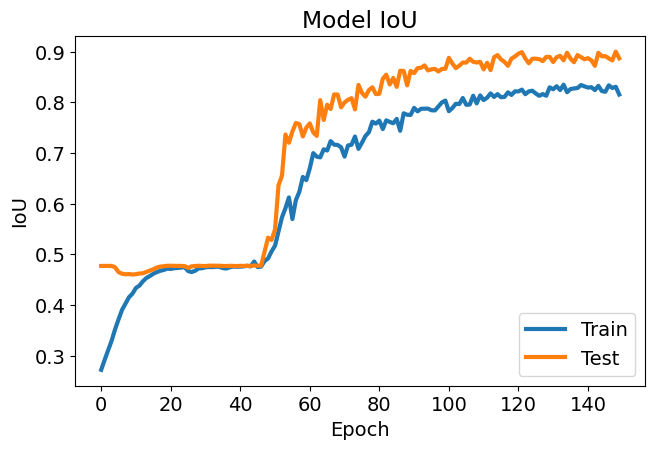

In [90]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history3['train_miou']]
val_miou = [x.cpu().numpy() for x in history3['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


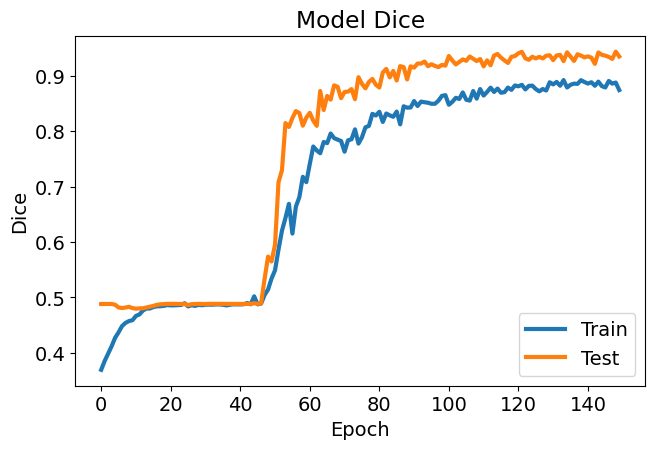

In [89]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history3['train_dice']]
val_miou = [x.cpu().numpy() for x in history3['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


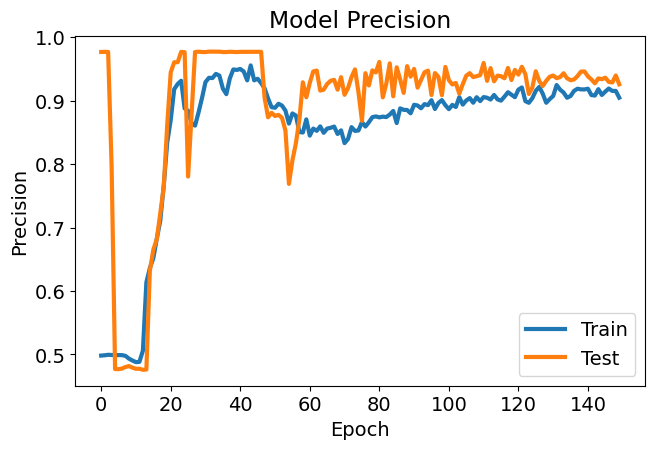

In [88]:
trainX = [x.cpu().numpy() for x in history3['train_Precision']]
valX = [x.cpu().numpy() for x in history3['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

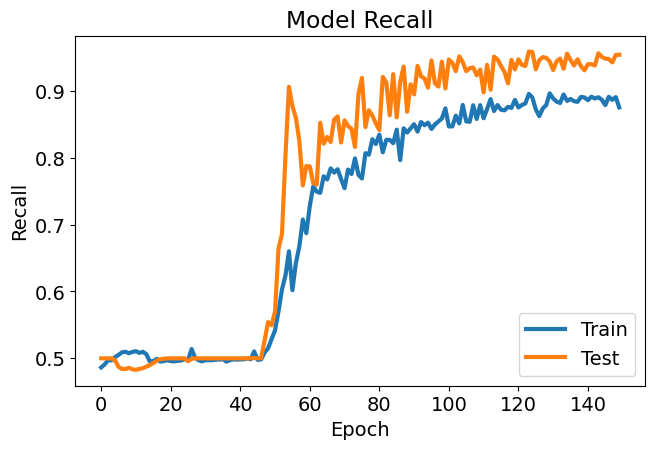

In [87]:
trainX = [x.cpu().numpy() for x in history3['train_recall']]
valX = [x.cpu().numpy() for x in history3['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

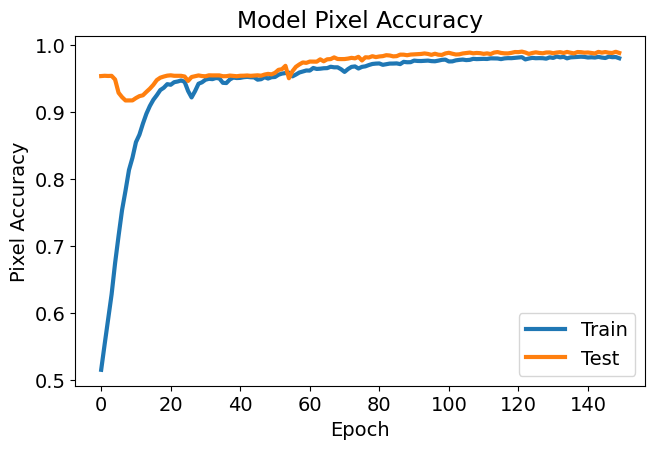

In [86]:
trainX = [x.cpu().numpy() for x in history3['train_acc']]
valX = [x.cpu().numpy() for x in history3['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

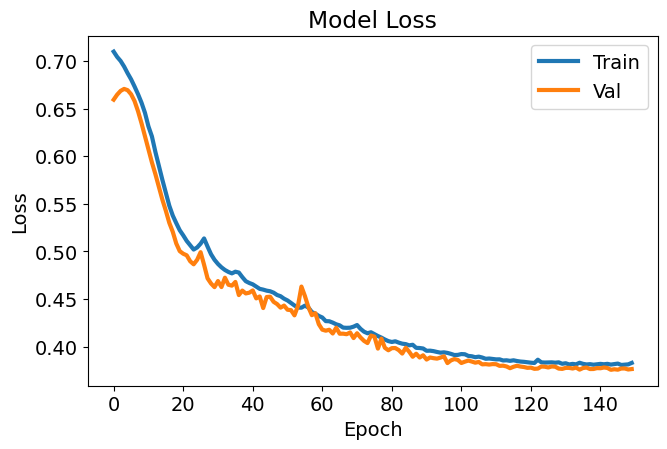

In [84]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history3['train_loss'])
plt.plot(history3['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [93]:
mob_miou = miou_score(model3, test_set)
dice_miou = dice_score_model(model3, test_set)
mob_acc = pixel_acc(model3, test_set)

100%|██████████| 61/61 [00:00<00:00, 195.02it/s]


In [94]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.901211188282026
0.9449908633390391
0.990142321977459


100%|██████████| 61/61 [00:00<00:00, 207.82it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


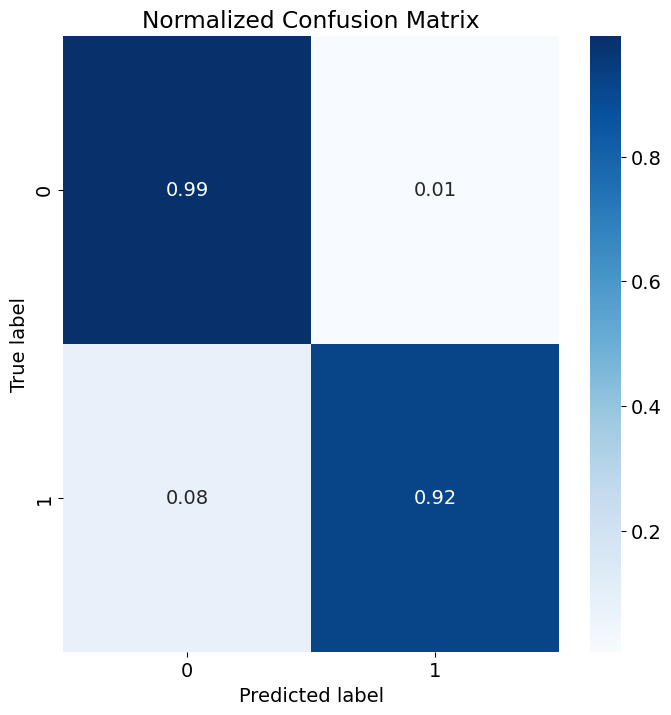

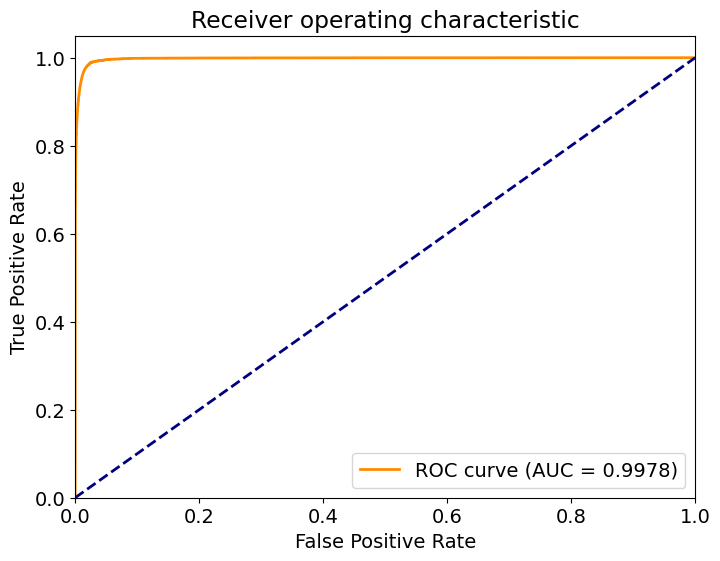

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model3, test_set)

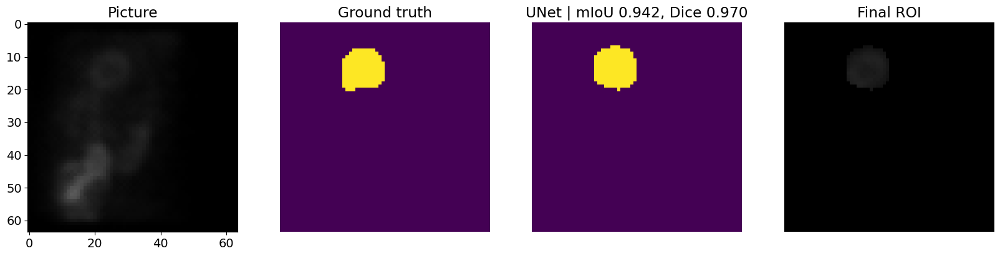

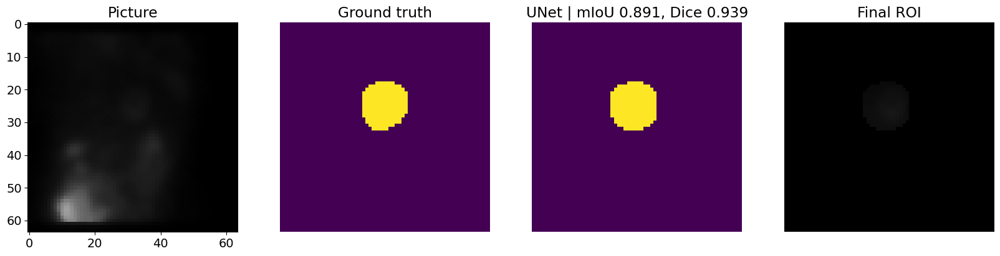

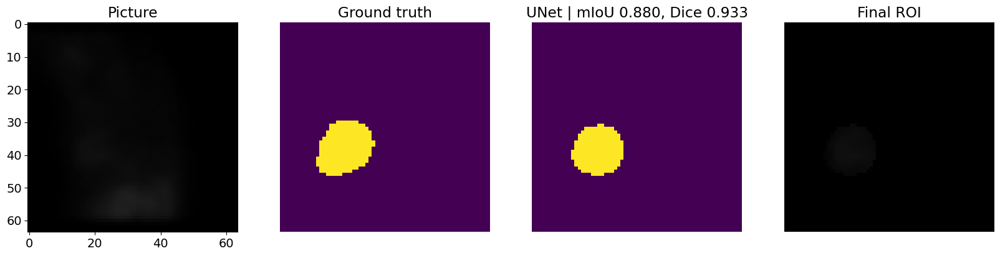

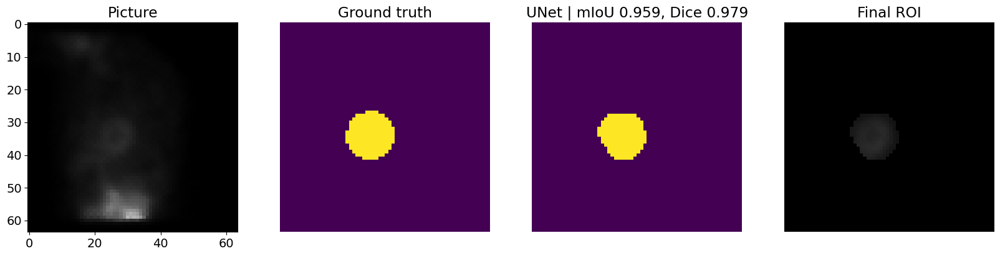

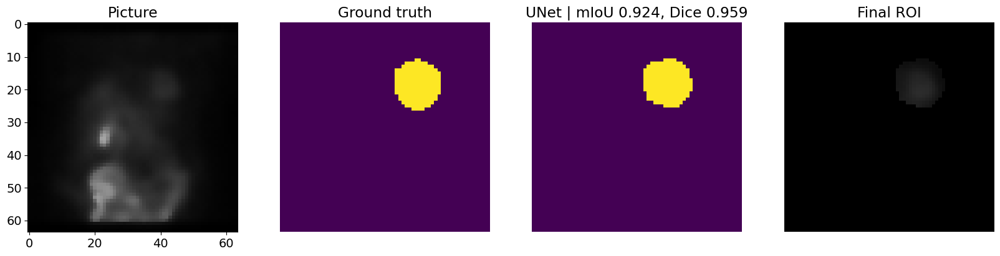

...

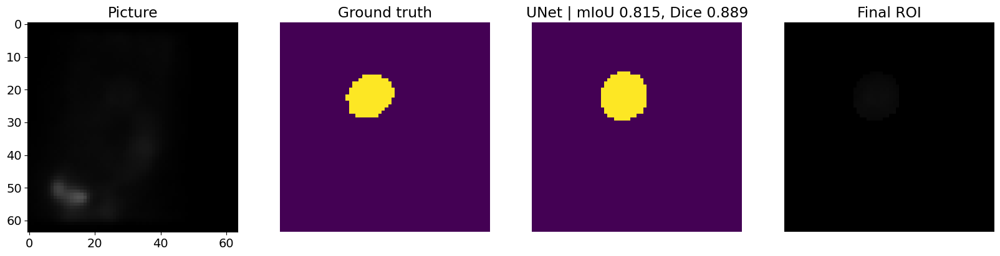

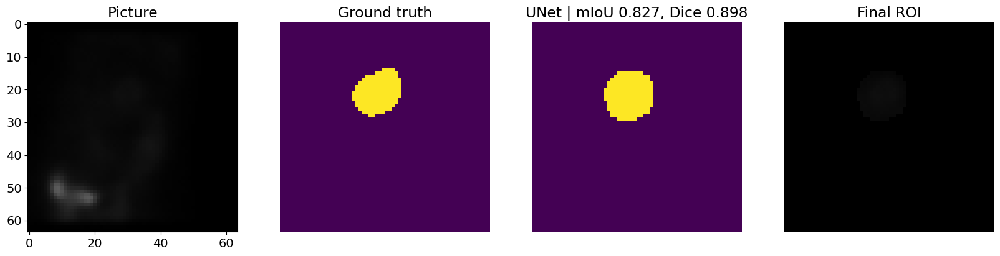

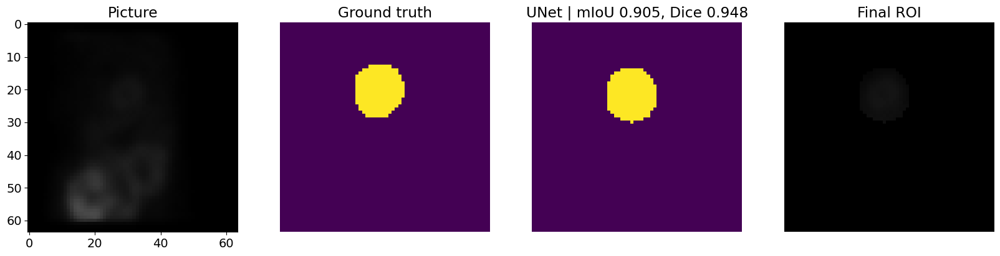

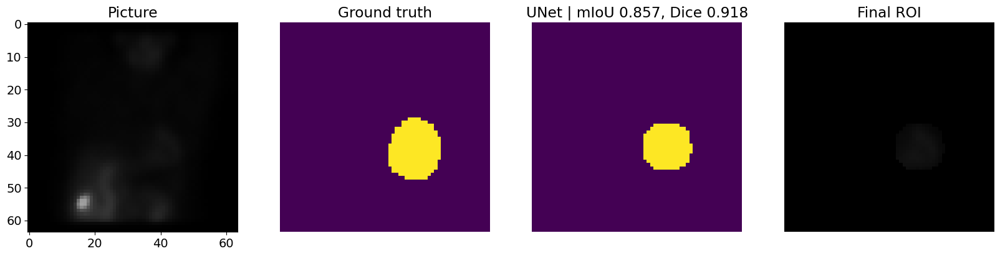

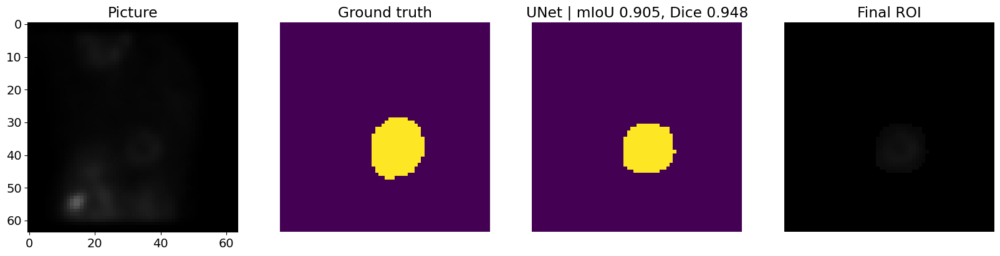

In [96]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model3, image, mask)
    pred_mask, score = predict_image_mask_miou(model3, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# IncpetionV3

In [97]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class UNet4(nn.Module):
    def __init__(self, num_classes):
        super(UNet4, self).__init__()

        self.backbone = models.inception_v3(pretrained=True, aux_logits=True)

        self.encoder1 = nn.Sequential(self.backbone.Conv2d_1a_3x3,
                                      self.backbone.Conv2d_2a_3x3,
                                      self.backbone.Conv2d_2b_3x3)
        self.encoder2 = nn.Sequential(self.backbone.Conv2d_3b_1x1,
                                      self.backbone.Conv2d_4a_3x3)
        self.encoder3 = nn.Sequential(self.backbone.Mixed_5b,
                                      self.backbone.Mixed_5c,
                                      self.backbone.Mixed_5d)
        self.encoder4 = nn.Sequential(self.backbone.Mixed_6a,
                                      self.backbone.Mixed_6b,
                                      self.backbone.Mixed_6c,
                                      self.backbone.Mixed_6d,
                                      self.backbone.Mixed_6e)
        self.encoder5 = nn.Sequential(self.backbone.Mixed_7a,
                                      self.backbone.Mixed_7b,
                                      self.backbone.Mixed_7c)

        self.center = nn.Sequential(
            nn.Conv2d(2048, 1024, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(1024, 1024, kernel_size=2, stride=2)
        )

        self.decoder4 = self._decoder_block(1024 + 768, 768)
        self.decoder3 = self._decoder_block(768 + 288, 288)
        self.decoder2 = self._decoder_block(288 + 192, 192)
        self.decoder1 = self._decoder_block(192 + 64, 64)
        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )

    def forward(self, x):
        # Encoder
        e1 = self.encoder1(x)  # 299x299 -> 149x149
        e2 = self.encoder2(e1)  # 149x149 -> 74x74
        e3 = self.encoder3(e2)  # 74x74 -> 35x35
        e4 = self.encoder4(e3)  # 35x35 -> 17x17
        e5 = self.encoder5(e4)  # 17x17 -> 8x8

        # Center
        center = self.center(e5)  # 8x8 -> 16x16
        center = F.interpolate(center, size=e4.shape[2:], mode='bilinear', align_corners=False)

        # Decoder
        d4 = self.decoder4(torch.cat([center, e4], dim=1))  # 16x16 -> 32x32
        d4 = F.interpolate(d4, size=e3.shape[2:], mode='bilinear', align_corners=False)
        d3 = self.decoder3(torch.cat([d4, e3], dim=1))  # 32x32 -> 64x64
        d3 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear', align_corners=False)
        d2 = self.decoder2(torch.cat([d3, e2], dim=1))  # 64x64 -> 128x128
        d2 = F.interpolate(d2, size=e1.shape[2:], mode='bilinear', align_corners=False)
        d1 = self.decoder1(torch.cat([d2, e1], dim=1))  # 128x128 -> 256x256

        out = self.final_conv(d1)  # 256x256 -> output size

        # Apply padding to match target size
        out = F.interpolate(out, size=x.shape[2:], mode='bilinear', align_corners=False)
        return out

# Example usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model4 = UNet4(num_classes=2).to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:01<00:00, 67.6MB/s] 


In [98]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model4.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history4 = fit(epoch, model4, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.29it/s]
<ipython-input-46-0c94c4132b9a>:373: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = results._append({'Epoch': epoch,


Loss Decreasing.. inf >> 0.699 
Epoch:1/150.. Train Loss: 0.701.. Val Loss: 0.699.. Train mIoU:0.039.. Val mIoU: 0.040.. Train Dice:0.075.. Val Dice: 0.077.. Train Precision:0.516.. Val Precision: 0.517.. Train Recall:0.509.. Val Recall: 0.512.. Train TP:127.211.. Train TP2:182.731.. Train TN:182.731.. Train TN2:127.211.. Train FP:2.629.. Train FP2:3783.429.. Train FN:3783.429.. Train FN2:2.629.. Val TP: 130.508.. Val TN: 184.426.. Val FP: 1.656.. Val FN: 3779.410.. Train Accuracy:0.076.. Val Accuracy:0.077.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.699 >> 0.698 
Epoch:2/150.. Train Loss: 0.700.. Val Loss: 0.698.. Train mIoU:0.046.. Val mIoU: 0.049.. Train Dice:0.088.. Val Dice: 0.093.. Train Precision:0.514.. Val Precision: 0.515.. Train Recall:0.511.. Val Recall: 0.515.. Train TP:180.185.. Train TP2:181.969.. Train TN:181.969.. Train TN2:180.185.. Train FP:4.377.. Train FP2:3729.469.. Train FN:3729.469.. Train FN2:4.377.. Val TP: 197.623.. Val TN: 185.934.. Val FP: 3.787.. Val FN: 3708.656.. Train Accuracy:0.088.. Val Accuracy:0.094.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Decreasing.. 0.698 >> 0.697 
Epoch:3/150.. Train Loss: 0.699.. Val Loss: 0.697.. Train mIoU:0.060.. Val mIoU: 0.068.. Train Dice:0.112.. Val Dice: 0.127.. Train Precision:0.511.. Val Precision: 0.510.. Train Recall:0.513.. Val Recall: 0.519.. Train TP:285.592.. Train TP2:178.134.. Train TN:178.134.. Train TN2:285.592.. Train FP:8.766.. Train FP2:3623.509.. Train FN:3623.509.. Train FN2:8.766.. Val TP: 352.443.. Val TN: 174.689.. Val FP: 9.459.. Val FN: 3559.410.. Train Accuracy:0.113.. Val Accuracy:0.129.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Loss Decreasing.. 0.697 >> 0.696 
saving model...
Epoch:4/150.. Train Loss: 0.697.. Val Loss: 0.696.. Train mIoU:0.083.. Val mIoU: 0.108.. Train Dice:0.149.. Val Dice: 0.189.. Train Precision:0.507.. Val Precision: 0.506.. Train Recall:0.514.. Val Recall: 0.518.. Train TP:466.787.. Train TP2:169.432.. Train TN:169.432.. Train TN2:466.787.. Train FP:17.154.. Train FP2:3442.627.. Train FN:3442.627.. Train FN2:17.154.. Val TP: 658.016.. Val TN: 165.574.. Val FP: 24.984.. Val FN: 3247.426.. Train Accuracy:0.155.. Val Accuracy:0.201.. Time: 0.19m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.696 >> 0.694 
Epoch:5/150.. Train Loss: 0.696.. Val Loss: 0.694.. Train mIoU:0.135.. Val mIoU: 0.188.. Train Dice:0.224.. Val Dice: 0.292.. Train Precision:0.503.. Val Precision: 0.503.. Train Recall:0.509.. Val Recall: 0.516.. Train TP:883.366.. Train TP2:148.166.. Train TN:148.166.. Train TN2:883.366.. Train FP:38.411.. Train FP2:3026.057.. Train FN:3026.057.. Train FN2:38.411.. Val TP: 1301.688.. Val TN: 131.918.. Val FP: 56.328.. Val FN: 2606.065.. Train Accuracy:0.252.. Val Accuracy:0.350.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Decreasing.. 0.694 >> 0.692 
Epoch:6/150.. Train Loss: 0.694.. Val Loss: 0.692.. Train mIoU:0.227.. Val mIoU: 0.299.. Train Dice:0.330.. Val Dice: 0.397.. Train Precision:0.500.. Val Precision: 0.499.. Train Recall:0.498.. Val Recall: 0.496.. Train TP:1636.245.. Train TP2:107.943.. Train TN:107.943.. Train TN2:1636.245.. Train FP:78.347.. Train FP2:2273.465.. Train FN:2273.465.. Train FN2:78.347.. Val TP: 2229.246.. Val TN: 79.230.. Val FP: 108.492.. Val FN: 1679.033.. Train Accuracy:0.426.. Val Accuracy:0.564.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.692 >> 0.690 
Epoch:7/150.. Train Loss: 0.692.. Val Loss: 0.690.. Train mIoU:0.347.. Val mIoU: 0.421.. Train Dice:0.432.. Val Dice: 0.480.. Train Precision:0.498.. Val Precision: 0.498.. Train Recall:0.493.. Val Recall: 0.495.. Train TP:2653.445.. Train TP2:57.121.. Train TN:57.121.. Train TN2:2653.445.. Train FP:127.456.. Train FP2:1257.978.. Train FN:1257.978.. Train FN2:127.456.. Val TP: 3287.754.. Val TN: 27.590.. Val FP: 159.279.. Val FN: 621.377.. Train Accuracy:0.662.. Val Accuracy:0.809.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.690 >> 0.688 
Epoch:8/150.. Train Loss: 0.689.. Val Loss: 0.688.. Train mIoU:0.438.. Val mIoU: 0.472.. Train Dice:0.485.. Val Dice: 0.495.. Train Precision:0.496.. Val Precision: 0.496.. Train Recall:0.494.. Val Recall: 0.498.. Train TP:3457.254.. Train TP2:19.240.. Train TN:19.240.. Train TN2:3457.254.. Train FP:170.667.. Train FP2:448.840.. Train FN:448.840.. Train FN2:170.667.. Val TP: 3812.885.. Val TN: 3.672.. Val FP: 185.066.. Val FN: 94.377.. Train Accuracy:0.849.. Val Accuracy:0.932.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Loss Decreasing.. 0.688 >> 0.685 
saving model...
Epoch:9/150.. Train Loss: 0.686.. Val Loss: 0.685.. Train mIoU:0.469.. Val mIoU: 0.477.. Train Dice:0.492.. Val Dice: 0.490.. Train Precision:0.492.. Val Precision: 0.490.. Train Recall:0.496.. Val Recall: 0.499.. Train TP:3795.221.. Train TP2:3.996.. Train TN:3.996.. Train TN2:3795.221.. Train FP:182.165.. Train FP2:114.617.. Train FN:114.617.. Train FN2:182.165.. Val TP: 3896.164.. Val TN: 0.426.. Val FP: 183.803.. Val FN: 15.607.. Train Accuracy:0.928.. Val Accuracy:0.951.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.46s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Loss Decreasing.. 0.685 >> 0.682 
Epoch:10/150.. Train Loss: 0.683.. Val Loss: 0.682.. Train mIoU:0.476.. Val mIoU: 0.477.. Train Dice:0.489.. Val Dice: 0.488.. Train Precision:0.486.. Val Precision: 0.477.. Train Recall:0.499.. Val Recall: 0.500.. Train TP:3885.344.. Train TP2:0.620.. Train TN:0.620.. Train TN2:3885.344.. Train FP:185.915.. Train FP2:24.120.. Train FN:24.120.. Train FN2:185.915.. Val TP: 3905.377.. Val TN: 0.000.. Val FP: 188.705.. Val FN: 1.918.. Train Accuracy:0.949.. Val Accuracy:0.953.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Decreasing.. 0.682 >> 0.676 
Epoch:11/150.. Train Loss: 0.679.. Val Loss: 0.676.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.489.. Val Dice: 0.488.. Train Precision:0.545.. Val Precision: 0.838.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3907.617.. Train TP2:0.063.. Train TN:0.063.. Train TN2:3907.617.. Train FP:184.928.. Train FP2:3.391.. Train FN:3.391.. Train FN2:184.928.. Val TP: 3908.344.. Val TN: 0.000.. Val FP: 187.295.. Val FN: 0.361.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Loss Decreasing.. 0.676 >> 0.667 
Epoch:12/150.. Train Loss: 0.671.. Val Loss: 0.667.. Train mIoU:0.477.. Val mIoU: 0.478.. Train Dice:0.488.. Val Dice: 0.489.. Train Precision:0.870.. Val Precision: 0.978.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3911.238.. Train TP2:0.005.. Train TN:0.005.. Train TN2:3911.238.. Train FP:184.419.. Train FP2:0.339.. Train FN:0.339.. Train FN2:184.419.. Val TP: 3912.590.. Val TN: 0.000.. Val FP: 183.410.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.667 >> 0.650 
Epoch:13/150.. Train Loss: 0.659.. Val Loss: 0.650.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.975.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.641.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.641.. Train FP:187.355.. Train FP2:0.005.. Train FN:0.005.. Train FN2:187.355.. Val TP: 3908.065.. Val TN: 0.000.. Val FP: 187.934.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.650 >> 0.613 
saving model...
Epoch:14/150.. Train Loss: 0.635.. Val Loss: 0.613.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.691.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.691.. Train FP:185.310.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.310.. Val TP: 3908.377.. Val TN: 0.000.. Val FP: 187.623.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.954.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.613 >> 0.486 
Epoch:15/150.. Train Loss: 0.575.. Val Loss: 0.486.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.587.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.587.. Train FP:185.413.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.413.. Val TP: 3910.000.. Val TN: 0.000.. Val FP: 186.000.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Loss Decreasing.. 0.486 >> 0.400 
Epoch:16/150.. Train Loss: 0.386.. Val Loss: 0.400.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.067.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.067.. Train FP:187.933.. Train FP2:0.000.. Train FN:0.000.. Train FN2:187.933.. Val TP: 3905.819.. Val TN: 0.000.. Val FP: 190.180.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Decreasing.. 0.400 >> 0.265 
Epoch:17/150.. Train Loss: 0.293.. Val Loss: 0.265.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.335.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.335.. Train FP:185.665.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.665.. Val TP: 3911.246.. Val TN: 0.000.. Val FP: 184.754.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.955.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Loss Decreasing.. 0.265 >> 0.224 
Epoch:18/150.. Train Loss: 0.254.. Val Loss: 0.224.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.998.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.998.. Train FP:185.002.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.002.. Val TP: 3906.869.. Val TN: 0.000.. Val FP: 189.131.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 1 time
Epoch:19/150.. Train Loss: 0.222.. Val Loss: 0.225.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.695.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.695.. Train FP:186.305.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.305.. Val TP: 3908.721.. Val TN: 0.000.. Val FP: 187.279.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Loss Decreasing.. 0.225 >> 0.199 
saving model...
Epoch:20/150.. Train Loss: 0.217.. Val Loss: 0.199.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.434.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.434.. Train FP:187.566.. Train FP2:0.000.. Train FN:0.000.. Train FN2:187.566.. Val TP: 3911.344.. Val TN: 0.000.. Val FP: 184.656.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.955.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.45s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Loss Decreasing.. 0.199 >> 0.191 
Epoch:21/150.. Train Loss: 0.201.. Val Loss: 0.191.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.445.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.445.. Train FP:187.555.. Train FP2:0.000.. Train FN:0.000.. Train FN2:187.555.. Val TP: 3906.032.. Val TN: 0.000.. Val FP: 189.967.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.191 >> 0.179 
Epoch:22/150.. Train Loss: 0.196.. Val Loss: 0.179.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3907.881.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3907.881.. Train FP:188.119.. Train FP2:0.000.. Train FN:0.000.. Train FN2:188.119.. Val TP: 3910.147.. Val TN: 0.000.. Val FP: 185.852.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Loss Decreasing.. 0.179 >> 0.173 
Epoch:23/150.. Train Loss: 0.184.. Val Loss: 0.173.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.689.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.689.. Train FP:186.311.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.311.. Val TP: 3904.557.. Val TN: 0.000.. Val FP: 191.443.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.953.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Loss Decreasing.. 0.173 >> 0.154 
Epoch:24/150.. Train Loss: 0.171.. Val Loss: 0.154.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.018.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.018.. Train FP:185.982.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.982.. Val TP: 3906.377.. Val TN: 0.000.. Val FP: 189.623.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.154 >> 0.138 
saving model...
Epoch:25/150.. Train Loss: 0.153.. Val Loss: 0.138.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.727.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.727.. Train FP:186.273.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.273.. Val TP: 3905.213.. Val TN: 0.000.. Val FP: 190.787.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.953.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.138 >> 0.119 
Epoch:26/150.. Train Loss: 0.137.. Val Loss: 0.119.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.745.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.745.. Train FP:187.255.. Train FP2:0.000.. Train FN:0.000.. Train FN2:187.255.. Val TP: 3907.098.. Val TN: 0.000.. Val FP: 188.902.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.119 >> 0.103 
Epoch:27/150.. Train Loss: 0.123.. Val Loss: 0.103.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3907.003.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3907.003.. Train FP:188.997.. Train FP2:0.000.. Train FN:0.000.. Train FN2:188.997.. Val TP: 3909.000.. Val TN: 0.000.. Val FP: 187.000.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Decreasing.. 0.103 >> 0.095 
Epoch:28/150.. Train Loss: 0.110.. Val Loss: 0.095.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.062.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.062.. Train FP:186.938.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.938.. Val TP: 3908.377.. Val TN: 0.000.. Val FP: 187.623.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Loss Decreasing.. 0.095 >> 0.087 
Epoch:29/150.. Train Loss: 0.100.. Val Loss: 0.087.. Train mIoU:0.478.. Val mIoU: 0.478.. Train Dice:0.489.. Val Dice: 0.489.. Train Precision:0.978.. Val Precision: 0.978.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3912.034.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3912.034.. Train FP:183.966.. Train FP2:0.000.. Train FN:0.000.. Train FN2:183.966.. Val TP: 3913.131.. Val TN: 0.000.. Val FP: 182.869.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Decreasing.. 0.087 >> 0.083 
saving model...
Epoch:30/150.. Train Loss: 0.094.. Val Loss: 0.083.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.037.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.037.. Train FP:185.963.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.963.. Val TP: 3904.869.. Val TN: 0.000.. Val FP: 191.131.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.953.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.46s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Loss Decreasing.. 0.083 >> 0.075 
Epoch:31/150.. Train Loss: 0.085.. Val Loss: 0.075.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.552.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.552.. Train FP:186.448.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.448.. Val TP: 3910.623.. Val TN: 0.000.. Val FP: 185.377.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Decreasing.. 0.075 >> 0.069 
Epoch:32/150.. Train Loss: 0.079.. Val Loss: 0.069.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.096.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.096.. Train FP:186.904.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.904.. Val TP: 3907.213.. Val TN: 0.000.. Val FP: 188.787.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Loss Not Decrease for 2 time
Epoch:33/150.. Train Loss: 0.076.. Val Loss: 0.074.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3908.788.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3908.788.. Train FP:187.212.. Train FP2:0.000.. Train FN:0.000.. Train FN2:187.212.. Val TP: 3907.754.. Val TN: 0.000.. Val FP: 188.246.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Loss Decreasing.. 0.074 >> 0.061 
Epoch:34/150.. Train Loss: 0.070.. Val Loss: 0.061.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.733.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.733.. Train FP:185.267.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.267.. Val TP: 3909.770.. Val TN: 0.000.. Val FP: 186.229.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.061 >> 0.060 
Epoch:35/150.. Train Loss: 0.067.. Val Loss: 0.060.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3907.288.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3907.288.. Train FP:188.713.. Train FP2:0.000.. Train FN:0.000.. Train FN2:188.713.. Val TP: 3907.688.. Val TN: 0.000.. Val FP: 188.311.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.954.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Decreasing.. 0.060 >> 0.056 
saving model...
Epoch:36/150.. Train Loss: 0.061.. Val Loss: 0.056.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3910.417.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3910.417.. Train FP:185.584.. Train FP2:0.000.. Train FN:0.000.. Train FN2:185.584.. Val TP: 3909.032.. Val TN: 0.000.. Val FP: 186.967.. Val FN: 0.000.. Train Accuracy:0.955.. Val Accuracy:0.954.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Loss Decreasing.. 0.056 >> 0.053 
Epoch:37/150.. Train Loss: 0.059.. Val Loss: 0.053.. Train mIoU:0.477.. Val mIoU: 0.477.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.977.. Val Precision: 0.977.. Train Recall:0.500.. Val Recall: 0.500.. Train TP:3909.428.. Train TP2:0.000.. Train TN:0.000.. Train TN2:3909.428.. Train FP:186.572.. Train FP2:0.000.. Train FN:0.000.. Train FN2:186.572.. Val TP: 3909.983.. Val TN: 0.000.. Val FP: 186.016.. Val FN: 0.000.. Train Accuracy:0.954.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 3 time
Epoch:38/150.. Train Loss: 0.058.. Val Loss: 0.054.. Train mIoU:0.479.. Val mIoU: 0.551.. Train Dice:0.493.. Val Dice: 0.609.. Train Precision:0.970.. Val Precision: 0.935.. Train Recall:0.502.. Val Recall: 0.572.. Train TP:3908.731.. Train TP2:0.802.. Train TN:0.802.. Train TN2:3908.731.. Train FP:186.399.. Train FP2:0.069.. Train FN:0.069.. Train FN2:186.399.. Val TP: 3905.639.. Val TN: 25.787.. Val FP: 162.311.. Val FN: 2.262.. Train Accuracy:0.954.. Val Accuracy:0.960.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Loss Decreasing.. 0.054 >> 0.048 
Epoch:39/150.. Train Loss: 0.055.. Val Loss: 0.048.. Train mIoU:0.670.. Val mIoU: 0.828.. Train Dice:0.747.. Val Dice: 0.896.. Train Precision:0.955.. Val Precision: 0.939.. Train Recall:0.690.. Val Recall: 0.869.. Train TP:3903.266.. Train TP2:71.926.. Train TN:71.926.. Train TN2:3903.266.. Train FP:115.693.. Train FP2:5.115.. Train FN:5.115.. Train FN2:115.693.. Val TP: 3893.279.. Val TN: 136.492.. Val FP: 48.311.. Val FN: 17.918.. Train Accuracy:0.971.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Decreasing.. 0.048 >> 0.038 
Epoch:40/150.. Train Loss: 0.047.. Val Loss: 0.038.. Train mIoU:0.823.. Val mIoU: 0.851.. Train Dice:0.891.. Val Dice: 0.912.. Train Precision:0.921.. Val Precision: 0.882.. Train Recall:0.879.. Val Recall: 0.957.. Train TP:3880.871.. Train TP2:143.178.. Train TN:143.178.. Train TN2:3880.871.. Train FP:43.831.. Train FP2:28.120.. Train FN:28.120.. Train FN2:43.831.. Val TP: 3854.934.. Val TN: 172.934.. Val FP: 13.213.. Val FN: 54.918.. Train Accuracy:0.982.. Val Accuracy:0.983.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.038 >> 0.032 
Epoch:41/150.. Train Loss: 0.038.. Val Loss: 0.032.. Train mIoU:0.848.. Val mIoU: 0.871.. Train Dice:0.909.. Val Dice: 0.925.. Train Precision:0.909.. Val Precision: 0.908.. Train Recall:0.924.. Val Recall: 0.953.. Train TP:3869.258.. Train TP2:161.572.. Train TN:161.572.. Train TN2:3869.258.. Train FP:26.820.. Train FP2:38.349.. Train FN:38.349.. Train FN2:26.820.. Val TP: 3867.721.. Val TN: 171.918.. Val FP: 15.869.. Val FN: 40.492.. Train Accuracy:0.984.. Val Accuracy:0.986.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Loss Decreasing.. 0.032 >> 0.025 
saving model...
Epoch:42/150.. Train Loss: 0.034.. Val Loss: 0.025.. Train mIoU:0.863.. Val mIoU: 0.892.. Train Dice:0.917.. Val Dice: 0.939.. Train Precision:0.929.. Val Precision: 0.943.. Train Recall:0.922.. Val Recall: 0.940.. Train TP:3880.230.. Train TP2:160.065.. Train TN:160.065.. Train TN2:3880.230.. Train FP:28.473.. Train FP2:27.232.. Train FN:27.232.. Train FN2:28.473.. Val TP: 3884.557.. Val TN: 168.705.. Val FP: 22.197.. Val FN: 20.541.. Train Accuracy:0.986.. Val Accuracy:0.990.. Time: 0.18m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.025 >> 0.024 
Epoch:43/150.. Train Loss: 0.029.. Val Loss: 0.024.. Train mIoU:0.877.. Val mIoU: 0.895.. Train Dice:0.928.. Val Dice: 0.941.. Train Precision:0.937.. Val Precision: 0.957.. Train Recall:0.928.. Val Recall: 0.930.. Train TP:3888.144.. Train TP2:158.743.. Train TN:158.743.. Train TN2:3888.144.. Train FP:25.923.. Train FP2:23.190.. Train FN:23.190.. Train FN2:25.923.. Val TP: 3892.459.. Val TN: 162.869.. Val FP: 26.377.. Val FN: 14.295.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Loss Decreasing.. 0.024 >> 0.022 
Epoch:44/150.. Train Loss: 0.027.. Val Loss: 0.022.. Train mIoU:0.874.. Val mIoU: 0.901.. Train Dice:0.925.. Val Dice: 0.945.. Train Precision:0.946.. Val Precision: 0.944.. Train Recall:0.918.. Val Recall: 0.950.. Train TP:3892.438.. Train TP2:155.688.. Train TN:155.688.. Train TN2:3892.438.. Train FP:29.075.. Train FP2:18.799.. Train FN:18.799.. Train FN2:29.075.. Val TP: 3889.869.. Val TN: 167.656.. Val FP: 18.361.. Val FN: 20.115.. Train Accuracy:0.988.. Val Accuracy:0.991.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Decreasing.. 0.022 >> 0.021 
Epoch:45/150.. Train Loss: 0.025.. Val Loss: 0.021.. Train mIoU:0.886.. Val mIoU: 0.905.. Train Dice:0.934.. Val Dice: 0.947.. Train Precision:0.945.. Val Precision: 0.934.. Train Recall:0.932.. Val Recall: 0.966.. Train TP:3891.714.. Train TP2:160.227.. Train TN:160.227.. Train TN2:3891.714.. Train FP:24.874.. Train FP2:19.185.. Train FN:19.185.. Train FN2:24.874.. Val TP: 3882.410.. Val TN: 175.885.. Val FP: 11.885.. Val FN: 25.820.. Train Accuracy:0.989.. Val Accuracy:0.991.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Not Decrease for 4 time
Epoch:46/150.. Train Loss: 0.025.. Val Loss: 0.023.. Train mIoU:0.889.. Val mIoU: 0.897.. Train Dice:0.935.. Val Dice: 0.943.. Train Precision:0.945.. Val Precision: 0.961.. Train Recall:0.935.. Val Recall: 0.931.. Train TP:3889.297.. Train TP2:163.682.. Train TN:163.682.. Train TN2:3889.297.. Train FP:23.786.. Train FP2:19.235.. Train FN:19.235.. Train FN2:23.786.. Val TP: 3894.885.. Val TN: 161.311.. Val FP: 26.475.. Val FN: 13.328.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.023 >> 0.021 
Epoch:47/150.. Train Loss: 0.023.. Val Loss: 0.021.. Train mIoU:0.895.. Val mIoU: 0.910.. Train Dice:0.940.. Val Dice: 0.950.. Train Precision:0.951.. Val Precision: 0.954.. Train Recall:0.935.. Val Recall: 0.951.. Train TP:3891.662.. Train TP2:164.219.. Train TN:164.219.. Train TN2:3891.662.. Train FP:23.459.. Train FP2:16.660.. Train FN:16.660.. Train FN2:23.459.. Val TP: 3889.803.. Val TN: 170.754.. Val FP: 18.459.. Val FN: 16.984.. Train Accuracy:0.990.. Val Accuracy:0.991.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Not Decrease for 5 time
Epoch:48/150.. Train Loss: 0.023.. Val Loss: 0.022.. Train mIoU:0.898.. Val mIoU: 0.902.. Train Dice:0.942.. Val Dice: 0.946.. Train Precision:0.948.. Val Precision: 0.974.. Train Recall:0.942.. Val Recall: 0.924.. Train TP:3890.657.. Train TP2:165.763.. Train TN:165.763.. Train TN2:3890.657.. Train FP:21.151.. Train FP2:18.430.. Train FN:18.430.. Train FN2:21.151.. Val TP: 3899.557.. Val TN: 159.820.. Val FP: 28.672.. Val FN: 7.951.. Train Accuracy:0.990.. Val Accuracy:0.991.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Loss Decreasing.. 0.022 >> 0.020 
saving model...
Epoch:49/150.. Train Loss: 0.023.. Val Loss: 0.020.. Train mIoU:0.894.. Val mIoU: 0.908.. Train Dice:0.940.. Val Dice: 0.950.. Train Precision:0.954.. Val Precision: 0.948.. Train Recall:0.933.. Val Recall: 0.955.. Train TP:3893.333.. Train TP2:161.822.. Train TN:161.822.. Train TN2:3893.333.. Train FP:24.967.. Train FP2:15.879.. Train FN:15.879.. Train FN2:24.967.. Val TP: 3886.360.. Val TN: 173.180.. Val FP: 17.590.. Val FN: 18.869.. Train Accuracy:0.990.. Val Accuracy:0.991.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Loss Not Decrease for 6 time
Epoch:50/150.. Train Loss: 0.022.. Val Loss: 0.021.. Train mIoU:0.899.. Val mIoU: 0.912.. Train Dice:0.942.. Val Dice: 0.951.. Train Precision:0.946.. Val Precision: 0.955.. Train Recall:0.946.. Val Recall: 0.950.. Train TP:3893.519.. Train TP2:163.754.. Train TN:163.754.. Train TN2:3893.519.. Train FP:19.413.. Train FP2:19.313.. Train FN:19.313.. Train FN2:19.413.. Val TP: 3891.836.. Val TN: 169.623.. Val FP: 18.541.. Val FN: 16.000.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.021 >> 0.019 
Epoch:51/150.. Train Loss: 0.021.. Val Loss: 0.019.. Train mIoU:0.906.. Val mIoU: 0.916.. Train Dice:0.947.. Val Dice: 0.954.. Train Precision:0.956.. Val Precision: 0.955.. Train Recall:0.943.. Val Recall: 0.956.. Train TP:3894.484.. Train TP2:165.488.. Train TN:165.488.. Train TN2:3894.484.. Train FP:21.206.. Train FP2:14.822.. Train FN:14.822.. Train FN2:21.206.. Val TP: 3889.885.. Val TN: 172.934.. Val FP: 17.377.. Val FN: 15.803.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Decreasing.. 0.019 >> 0.019 
Epoch:52/150.. Train Loss: 0.021.. Val Loss: 0.019.. Train mIoU:0.905.. Val mIoU: 0.917.. Train Dice:0.946.. Val Dice: 0.954.. Train Precision:0.955.. Val Precision: 0.950.. Train Recall:0.944.. Val Recall: 0.961.. Train TP:3895.552.. Train TP2:164.788.. Train TN:164.788.. Train TN2:3895.552.. Train FP:20.007.. Train FP2:15.653.. Train FN:15.653.. Train FN2:20.007.. Val TP: 3888.229.. Val TN: 175.115.. Val FP: 14.934.. Val FN: 17.721.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Decreasing.. 0.019 >> 0.017 
Epoch:53/150.. Train Loss: 0.020.. Val Loss: 0.017.. Train mIoU:0.913.. Val mIoU: 0.924.. Train Dice:0.952.. Val Dice: 0.959.. Train Precision:0.955.. Val Precision: 0.955.. Train Recall:0.951.. Val Recall: 0.964.. Train TP:3894.082.. Train TP2:168.261.. Train TN:168.261.. Train TN2:3894.082.. Train FP:18.289.. Train FP2:15.368.. Train FN:15.368.. Train FN2:18.289.. Val TP: 3891.901.. Val TN: 174.656.. Val FP: 12.869.. Val FN: 16.574.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 7 time
Epoch:54/150.. Train Loss: 0.020.. Val Loss: 0.017.. Train mIoU:0.910.. Val mIoU: 0.922.. Train Dice:0.949.. Val Dice: 0.958.. Train Precision:0.954.. Val Precision: 0.965.. Train Recall:0.950.. Val Recall: 0.953.. Train TP:3894.684.. Train TP2:167.298.. Train TN:167.298.. Train TN2:3894.684.. Train FP:17.846.. Train FP2:16.172.. Train FN:16.172.. Train FN2:17.846.. Val TP: 3894.656.. Val TN: 171.672.. Val FP: 17.672.. Val FN: 12.000.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Loss Not Decrease for 8 time
Epoch:55/150.. Train Loss: 0.022.. Val Loss: 0.018.. Train mIoU:0.902.. Val mIoU: 0.916.. Train Dice:0.945.. Val Dice: 0.954.. Train Precision:0.957.. Val Precision: 0.965.. Train Recall:0.940.. Val Recall: 0.948.. Train TP:3893.240.. Train TP2:165.542.. Train TN:165.542.. Train TN2:3893.240.. Train FP:22.296.. Train FP2:14.922.. Train FN:14.922.. Train FN2:22.296.. Val TP: 3895.983.. Val TN: 168.705.. Val FP: 19.410.. Val FN: 11.902.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Not Decrease for 9 time
Epoch:56/150.. Train Loss: 0.022.. Val Loss: 0.020.. Train mIoU:0.902.. Val mIoU: 0.913.. Train Dice:0.944.. Val Dice: 0.952.. Train Precision:0.953.. Val Precision: 0.951.. Train Recall:0.943.. Val Recall: 0.957.. Train TP:3891.542.. Train TP2:166.519.. Train TN:166.519.. Train TN2:3891.542.. Train FP:21.329.. Train FP2:16.610.. Train FN:16.610.. Train FN2:21.329.. Val TP: 3888.131.. Val TN: 173.820.. Val FP: 16.639.. Val FN: 17.410.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Decreasing.. 0.020 >> 0.019 
Epoch:57/150.. Train Loss: 0.021.. Val Loss: 0.019.. Train mIoU:0.903.. Val mIoU: 0.915.. Train Dice:0.945.. Val Dice: 0.953.. Train Precision:0.953.. Val Precision: 0.940.. Train Recall:0.945.. Val Recall: 0.972.. Train TP:3893.426.. Train TP2:165.699.. Train TN:165.699.. Train TN2:3893.426.. Train FP:20.308.. Train FP2:16.568.. Train FN:16.568.. Train FN2:20.308.. Val TP: 3884.590.. Val TN: 177.967.. Val FP: 9.672.. Val FN: 23.770.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Loss Decreasing.. 0.019 >> 0.019 
saving model...
Epoch:58/150.. Train Loss: 0.022.. Val Loss: 0.019.. Train mIoU:0.901.. Val mIoU: 0.918.. Train Dice:0.944.. Val Dice: 0.955.. Train Precision:0.946.. Val Precision: 0.972.. Train Recall:0.949.. Val Recall: 0.943.. Train TP:3893.361.. Train TP2:164.727.. Train TN:164.727.. Train TN2:3893.361.. Train FP:18.097.. Train FP2:19.816.. Train FN:19.816.. Train FN2:18.097.. Val TP: 3897.082.. Val TN: 167.770.. Val FP: 22.197.. Val FN: 8.951.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.18m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.48s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Not Decrease for 10 time
Epoch:59/150.. Train Loss: 0.022.. Val Loss: 0.019.. Train mIoU:0.902.. Val mIoU: 0.913.. Train Dice:0.945.. Val Dice: 0.952.. Train Precision:0.956.. Val Precision: 0.972.. Train Recall:0.940.. Val Recall: 0.936.. Train TP:3891.108.. Train TP2:166.903.. Train TN:166.903.. Train TN2:3891.108.. Train FP:22.166.. Train FP2:15.823.. Train FN:15.823.. Train FN2:22.166.. Val TP: 3899.901.. Val TN: 163.902.. Val FP: 23.836.. Val FN: 8.361.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.019 >> 0.018 
Epoch:60/150.. Train Loss: 0.019.. Val Loss: 0.018.. Train mIoU:0.916.. Val mIoU: 0.916.. Train Dice:0.953.. Val Dice: 0.954.. Train Precision:0.961.. Val Precision: 0.969.. Train Recall:0.950.. Val Recall: 0.942.. Train TP:3894.957.. Train TP2:168.691.. Train TN:168.691.. Train TN2:3894.957.. Train FP:18.818.. Train FP2:13.534.. Train FN:13.534.. Train FN2:18.818.. Val TP: 3902.262.. Val TN: 163.000.. Val FP: 21.180.. Val FN: 9.557.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Not Decrease for 11 time
Epoch:61/150.. Train Loss: 0.020.. Val Loss: 0.018.. Train mIoU:0.913.. Val mIoU: 0.916.. Train Dice:0.951.. Val Dice: 0.954.. Train Precision:0.957.. Val Precision: 0.963.. Train Recall:0.949.. Val Recall: 0.948.. Train TP:3893.791.. Train TP2:168.678.. Train TN:168.678.. Train TN2:3893.791.. Train FP:18.775.. Train FP2:14.756.. Train FN:14.756.. Train FN2:18.775.. Val TP: 3901.606.. Val TN: 163.869.. Val FP: 18.393.. Val FN: 12.131.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Loss Decreasing.. 0.018 >> 0.016 
Epoch:62/150.. Train Loss: 0.019.. Val Loss: 0.016.. Train mIoU:0.914.. Val mIoU: 0.924.. Train Dice:0.952.. Val Dice: 0.959.. Train Precision:0.955.. Val Precision: 0.976.. Train Recall:0.954.. Val Recall: 0.945.. Train TP:3894.990.. Train TP2:168.304.. Train TN:168.304.. Train TN2:3894.990.. Train FP:17.133.. Train FP2:15.573.. Train FN:15.573.. Train FN2:17.133.. Val TP: 3902.721.. Val TN: 165.721.. Val FP: 20.393.. Val FN: 7.164.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Not Decrease for 12 time
Epoch:63/150.. Train Loss: 0.019.. Val Loss: 0.017.. Train mIoU:0.912.. Val mIoU: 0.925.. Train Dice:0.951.. Val Dice: 0.959.. Train Precision:0.959.. Val Precision: 0.966.. Train Recall:0.948.. Val Recall: 0.956.. Train TP:3895.470.. Train TP2:167.553.. Train TN:167.553.. Train TN2:3895.470.. Train FP:18.805.. Train FP2:14.172.. Train FN:14.172.. Train FN2:18.805.. Val TP: 3892.721.. Val TN: 174.246.. Val FP: 17.131.. Val FN: 11.902.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 13 time
Epoch:64/150.. Train Loss: 0.019.. Val Loss: 0.021.. Train mIoU:0.915.. Val mIoU: 0.916.. Train Dice:0.953.. Val Dice: 0.954.. Train Precision:0.958.. Val Precision: 0.968.. Train Recall:0.952.. Val Recall: 0.943.. Train TP:3895.110.. Train TP2:168.786.. Train TN:168.786.. Train TN2:3895.110.. Train FP:17.449.. Train FP2:14.655.. Train FN:14.655.. Train FN2:17.449.. Val TP: 3888.442.. Val TN: 173.705.. Val FP: 23.164.. Val FN: 10.689.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Loss Decreasing.. 0.021 >> 0.017 
Epoch:65/150.. Train Loss: 0.018.. Val Loss: 0.017.. Train mIoU:0.916.. Val mIoU: 0.921.. Train Dice:0.953.. Val Dice: 0.957.. Train Precision:0.958.. Val Precision: 0.952.. Train Recall:0.953.. Val Recall: 0.966.. Train TP:3894.096.. Train TP2:169.982.. Train TN:169.982.. Train TN2:3894.096.. Train FP:17.433.. Train FP2:14.489.. Train FN:14.489.. Train FN2:17.433.. Val TP: 3891.410.. Val TN: 174.426.. Val FP: 12.525.. Val FN: 17.639.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Loss Not Decrease for 14 time
Epoch:66/150.. Train Loss: 0.018.. Val Loss: 0.017.. Train mIoU:0.919.. Val mIoU: 0.924.. Train Dice:0.955.. Val Dice: 0.959.. Train Precision:0.957.. Val Precision: 0.973.. Train Recall:0.957.. Val Recall: 0.948.. Train TP:3895.495.. Train TP2:169.613.. Train TN:169.613.. Train TN2:3895.495.. Train FP:15.829.. Train FP2:15.063.. Train FN:15.063.. Train FN2:15.829.. Val TP: 3894.606.. Val TN: 171.869.. Val FP: 20.770.. Val FN: 8.754.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 15 time
Epoch:67/150.. Train Loss: 0.017.. Val Loss: 0.018.. Train mIoU:0.921.. Val mIoU: 0.923.. Train Dice:0.956.. Val Dice: 0.957.. Train Precision:0.962.. Val Precision: 0.965.. Train Recall:0.954.. Val Recall: 0.954.. Train TP:3895.939.. Train TP2:170.211.. Train TN:170.211.. Train TN2:3895.939.. Train FP:16.715.. Train FP2:13.135.. Train FN:13.135.. Train FN2:16.715.. Val TP: 3894.311.. Val TN: 172.000.. Val FP: 17.967.. Val FN: 11.721.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Loss Not Decrease for 16 time
Epoch:68/150.. Train Loss: 0.018.. Val Loss: 0.019.. Train mIoU:0.919.. Val mIoU: 0.912.. Train Dice:0.955.. Val Dice: 0.951.. Train Precision:0.957.. Val Precision: 0.978.. Train Recall:0.957.. Val Recall: 0.930.. Train TP:3896.331.. Train TP2:169.029.. Train TN:169.029.. Train TN2:3896.331.. Train FP:15.781.. Train FP2:14.859.. Train FN:14.859.. Train FN2:15.781.. Val TP: 3902.229.. Val TN: 161.328.. Val FP: 25.934.. Val FN: 6.508.. Train Accuracy:0.993.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.019 >> 0.018 
Epoch:69/150.. Train Loss: 0.018.. Val Loss: 0.018.. Train mIoU:0.917.. Val mIoU: 0.915.. Train Dice:0.954.. Val Dice: 0.954.. Train Precision:0.959.. Val Precision: 0.974.. Train Recall:0.952.. Val Recall: 0.938.. Train TP:3895.586.. Train TP2:168.904.. Train TN:168.904.. Train TN2:3895.586.. Train FP:17.472.. Train FP2:14.038.. Train FN:14.038.. Train FN2:17.472.. Val TP: 3902.590.. Val TN: 162.525.. Val FP: 22.787.. Val FN: 8.098.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Not Decrease for 17 time
Epoch:70/150.. Train Loss: 0.019.. Val Loss: 0.019.. Train mIoU:0.914.. Val mIoU: 0.914.. Train Dice:0.952.. Val Dice: 0.953.. Train Precision:0.959.. Val Precision: 0.976.. Train Recall:0.949.. Val Recall: 0.935.. Train TP:3894.088.. Train TP2:168.890.. Train TN:168.890.. Train TN2:3894.088.. Train FP:18.669.. Train FP2:14.354.. Train FN:14.354.. Train FN2:18.669.. Val TP: 3898.967.. Val TN: 164.705.. Val FP: 25.082.. Val FN: 7.246.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Loss Decreasing.. 0.019 >> 0.017 
saving model...
Epoch:71/150.. Train Loss: 0.018.. Val Loss: 0.017.. Train mIoU:0.917.. Val mIoU: 0.921.. Train Dice:0.954.. Val Dice: 0.957.. Train Precision:0.958.. Val Precision: 0.978.. Train Recall:0.954.. Val Recall: 0.940.. Train TP:3895.077.. Train TP2:169.601.. Train TN:169.601.. Train TN2:3895.077.. Train FP:16.881.. Train FP2:14.442.. Train FN:14.442.. Train FN2:16.881.. Val TP: 3900.032.. Val TN: 166.410.. Val FP: 22.770.. Val FN: 6.787.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.18m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 18 time
Epoch:72/150.. Train Loss: 0.018.. Val Loss: 0.018.. Train mIoU:0.918.. Val mIoU: 0.917.. Train Dice:0.955.. Val Dice: 0.955.. Train Precision:0.958.. Val Precision: 0.975.. Train Recall:0.955.. Val Recall: 0.939.. Train TP:3894.950.. Train TP2:169.893.. Train TN:169.893.. Train TN2:3894.950.. Train FP:16.548.. Train FP2:14.609.. Train FN:14.609.. Train FN2:16.548.. Val TP: 3900.951.. Val TN: 164.279.. Val FP: 23.410.. Val FN: 7.361.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Not Decrease for 19 time
Epoch:73/150.. Train Loss: 0.018.. Val Loss: 0.019.. Train mIoU:0.916.. Val mIoU: 0.920.. Train Dice:0.954.. Val Dice: 0.956.. Train Precision:0.963.. Val Precision: 0.963.. Train Recall:0.949.. Val Recall: 0.953.. Train TP:3895.717.. Train TP2:168.797.. Train TN:168.797.. Train TN2:3895.717.. Train FP:18.617.. Train FP2:12.870.. Train FN:12.870.. Train FN2:18.617.. Val TP: 3892.967.. Val TN: 172.213.. Val FP: 18.754.. Val FN: 12.066.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Loss Not Decrease for 20 time
Epoch:74/150.. Train Loss: 0.018.. Val Loss: 0.020.. Train mIoU:0.917.. Val mIoU: 0.916.. Train Dice:0.952.. Val Dice: 0.954.. Train Precision:0.960.. Val Precision: 0.958.. Train Recall:0.952.. Val Recall: 0.954.. Train TP:3894.345.. Train TP2:170.140.. Train TN:170.140.. Train TN2:3894.345.. Train FP:17.364.. Train FP2:14.151.. Train FN:14.151.. Train FN2:17.364.. Val TP: 3891.541.. Val TN: 171.639.. Val FP: 18.131.. Val FN: 14.689.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.020 >> 0.017 
Epoch:75/150.. Train Loss: 0.018.. Val Loss: 0.017.. Train mIoU:0.919.. Val mIoU: 0.923.. Train Dice:0.955.. Val Dice: 0.958.. Train Precision:0.960.. Val Precision: 0.966.. Train Recall:0.955.. Val Recall: 0.953.. Train TP:3896.326.. Train TP2:169.132.. Train TN:169.132.. Train TN2:3896.326.. Train FP:16.386.. Train FP2:14.156.. Train FN:14.156.. Train FN2:16.386.. Val TP: 3895.344.. Val TN: 171.115.. Val FP: 18.164.. Val FN: 11.377.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Loss Decreasing.. 0.017 >> 0.016 
Epoch:76/150.. Train Loss: 0.018.. Val Loss: 0.016.. Train mIoU:0.920.. Val mIoU: 0.922.. Train Dice:0.956.. Val Dice: 0.958.. Train Precision:0.958.. Val Precision: 0.976.. Train Recall:0.957.. Val Recall: 0.944.. Train TP:3895.307.. Train TP2:170.302.. Train TN:170.302.. Train TN2:3895.307.. Train FP:15.487.. Train FP2:14.904.. Train FN:14.904.. Train FN2:15.487.. Val TP: 3899.082.. Val TN: 167.738.. Val FP: 21.885.. Val FN: 7.295.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Not Decrease for 21 time
Epoch:77/150.. Train Loss: 0.018.. Val Loss: 0.017.. Train mIoU:0.921.. Val mIoU: 0.918.. Train Dice:0.956.. Val Dice: 0.955.. Train Precision:0.958.. Val Precision: 0.975.. Train Recall:0.958.. Val Recall: 0.939.. Train TP:3894.119.. Train TP2:171.379.. Train TN:171.379.. Train TN2:3894.119.. Train FP:15.351.. Train FP2:15.151.. Train FN:15.151.. Train FN2:15.351.. Val TP: 3905.328.. Val TN: 160.869.. Val FP: 22.443.. Val FN: 7.361.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Decreasing.. 0.017 >> 0.016 
Epoch:78/150.. Train Loss: 0.018.. Val Loss: 0.016.. Train mIoU:0.919.. Val mIoU: 0.924.. Train Dice:0.955.. Val Dice: 0.959.. Train Precision:0.959.. Val Precision: 0.978.. Train Recall:0.955.. Val Recall: 0.943.. Train TP:3894.931.. Train TP2:170.061.. Train TN:170.061.. Train TN2:3894.931.. Train FP:16.420.. Train FP2:14.587.. Train FN:14.587.. Train FN2:16.420.. Val TP: 3901.754.. Val TN: 166.426.. Val FP: 21.246.. Val FN: 6.574.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:79/150.. Train Loss: 0.018.. Val Loss: 0.016.. Train mIoU:0.919.. Val mIoU: 0.927.. Train Dice:0.955.. Val Dice: 0.961.. Train Precision:0.962.. Val Precision: 0.956.. Train Recall:0.953.. Val Recall: 0.967.. Train TP:3894.640.. Train TP2:170.554.. Train TN:170.554.. Train TN2:3894.640.. Train FP:17.296.. Train FP2:13.510.. Train FN:13.510.. Train FN2:17.296.. Val TP: 3891.869.. Val TN: 176.000.. Val FP: 11.951.. Val FN: 16.180.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.016 >> 0.015 
saving model...
Epoch:80/150.. Train Loss: 0.018.. Val Loss: 0.015.. Train mIoU:0.918.. Val mIoU: 0.929.. Train Dice:0.954.. Val Dice: 0.962.. Train Precision:0.960.. Val Precision: 0.966.. Train Recall:0.953.. Val Recall: 0.959.. Train TP:3897.740.. Train TP2:167.251.. Train TN:167.251.. Train TN2:3897.740.. Train FP:17.398.. Train FP2:13.611.. Train FN:13.611.. Train FN2:17.398.. Val TP: 3898.672.. Val TN: 170.770.. Val FP: 14.967.. Val FN: 11.590.. Train Accuracy:0.992.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Loss Decreasing.. 0.015 >> 0.015 
Epoch:81/150.. Train Loss: 0.017.. Val Loss: 0.015.. Train mIoU:0.921.. Val mIoU: 0.929.. Train Dice:0.957.. Val Dice: 0.962.. Train Precision:0.966.. Val Precision: 0.955.. Train Recall:0.950.. Val Recall: 0.970.. Train TP:3899.342.. Train TP2:167.025.. Train TN:167.025.. Train TN2:3899.342.. Train FP:18.254.. Train FP2:11.379.. Train FN:11.379.. Train FN2:18.254.. Val TP: 3892.918.. Val TN: 176.229.. Val FP: 10.361.. Val FN: 16.492.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Not Decrease for 22 time
Epoch:82/150.. Train Loss: 0.018.. Val Loss: 0.016.. Train mIoU:0.920.. Val mIoU: 0.929.. Train Dice:0.956.. Val Dice: 0.961.. Train Precision:0.961.. Val Precision: 0.956.. Train Recall:0.955.. Val Recall: 0.970.. Train TP:3894.062.. Train TP2:171.066.. Train TN:171.066.. Train TN2:3894.062.. Train FP:17.175.. Train FP2:13.696.. Train FN:13.696.. Train FN2:17.175.. Val TP: 3891.459.. Val TN: 177.279.. Val FP: 11.279.. Val FN: 15.984.. Train Accuracy:0.992.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Not Decrease for 23 time
Epoch:83/150.. Train Loss: 0.017.. Val Loss: 0.016.. Train mIoU:0.923.. Val mIoU: 0.926.. Train Dice:0.958.. Val Dice: 0.960.. Train Precision:0.959.. Val Precision: 0.968.. Train Recall:0.961.. Val Recall: 0.955.. Train TP:3893.411.. Train TP2:173.306.. Train TN:173.306.. Train TN2:3893.411.. Train FP:14.493.. Train FP2:14.789.. Train FN:14.789.. Train FN2:14.493.. Val TP: 3897.410.. Val TN: 170.770.. Val FP: 16.852.. Val FN: 10.967.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Loss Not Decrease for 24 time
Epoch:84/150.. Train Loss: 0.017.. Val Loss: 0.017.. Train mIoU:0.925.. Val mIoU: 0.926.. Train Dice:0.959.. Val Dice: 0.960.. Train Precision:0.961.. Val Precision: 0.970.. Train Recall:0.959.. Val Recall: 0.952.. Train TP:3895.652.. Train TP2:171.617.. Train TN:171.617.. Train TN2:3895.652.. Train FP:14.954.. Train FP2:13.777.. Train FN:13.777.. Train FN2:14.954.. Val TP: 3901.738.. Val TN: 166.836.. Val FP: 17.951.. Val FN: 9.475.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.017 >> 0.017 
Epoch:85/150.. Train Loss: 0.016.. Val Loss: 0.017.. Train mIoU:0.926.. Val mIoU: 0.922.. Train Dice:0.960.. Val Dice: 0.958.. Train Precision:0.962.. Val Precision: 0.975.. Train Recall:0.960.. Val Recall: 0.944.. Train TP:3896.375.. Train TP2:171.799.. Train TN:171.799.. Train TN2:3896.375.. Train FP:14.559.. Train FP2:13.268.. Train FN:13.268.. Train FN2:14.559.. Val TP: 3901.639.. Val TN: 166.131.. Val FP: 20.639.. Val FN: 7.590.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.017 >> 0.016 
Epoch:86/150.. Train Loss: 0.017.. Val Loss: 0.016.. Train mIoU:0.924.. Val mIoU: 0.928.. Train Dice:0.958.. Val Dice: 0.961.. Train Precision:0.960.. Val Precision: 0.971.. Train Recall:0.959.. Val Recall: 0.953.. Train TP:3895.589.. Train TP2:171.547.. Train TN:171.547.. Train TN2:3895.589.. Train FP:14.984.. Train FP2:13.879.. Train FN:13.879.. Train FN2:14.984.. Val TP: 3896.016.. Val TN: 172.607.. Val FP: 17.902.. Val FN: 9.475.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.45s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:87/150.. Train Loss: 0.016.. Val Loss: 0.015.. Train mIoU:0.923.. Val mIoU: 0.933.. Train Dice:0.958.. Val Dice: 0.964.. Train Precision:0.962.. Val Precision: 0.965.. Train Recall:0.957.. Val Recall: 0.965.. Train TP:3897.946.. Train TP2:169.232.. Train TN:169.232.. Train TN2:3897.946.. Train FP:15.360.. Train FP2:13.461.. Train FN:13.461.. Train FN2:15.360.. Val TP: 3896.541.. Val TN: 174.098.. Val FP: 12.885.. Val FN: 12.475.. Train Accuracy:0.993.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Not Decrease for 25 time
Epoch:88/150.. Train Loss: 0.017.. Val Loss: 0.016.. Train mIoU:0.925.. Val mIoU: 0.927.. Train Dice:0.958.. Val Dice: 0.960.. Train Precision:0.967.. Val Precision: 0.949.. Train Recall:0.954.. Val Recall: 0.975.. Train TP:3898.114.. Train TP2:169.544.. Train TN:169.544.. Train TN2:3898.114.. Train FP:16.899.. Train FP2:11.443.. Train FN:11.443.. Train FN2:16.899.. Val TP: 3890.180.. Val TN: 177.426.. Val FP: 9.098.. Val FN: 19.295.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Loss Decreasing.. 0.016 >> 0.016 
saving model...
Epoch:89/150.. Train Loss: 0.017.. Val Loss: 0.016.. Train mIoU:0.924.. Val mIoU: 0.925.. Train Dice:0.958.. Val Dice: 0.960.. Train Precision:0.962.. Val Precision: 0.963.. Train Recall:0.959.. Val Recall: 0.959.. Train TP:3896.067.. Train TP2:171.155.. Train TN:171.155.. Train TN2:3896.067.. Train FP:15.230.. Train FP2:13.548.. Train FN:13.548.. Train FN2:15.230.. Val TP: 3896.852.. Val TN: 171.164.. Val FP: 15.148.. Val FN: 12.836.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.18m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.47s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:90/150.. Train Loss: 0.016.. Val Loss: 0.016.. Train mIoU:0.928.. Val mIoU: 0.926.. Train Dice:0.961.. Val Dice: 0.960.. Train Precision:0.961.. Val Precision: 0.970.. Train Recall:0.963.. Val Recall: 0.952.. Train TP:3896.016.. Train TP2:172.658.. Train TN:172.658.. Train TN2:3896.016.. Train FP:13.697.. Train FP2:13.629.. Train FN:13.629.. Train FN2:13.697.. Val TP: 3899.508.. Val TN: 168.574.. Val FP: 18.180.. Val FN: 9.738.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:91/150.. Train Loss: 0.016.. Val Loss: 0.015.. Train mIoU:0.927.. Val mIoU: 0.930.. Train Dice:0.960.. Val Dice: 0.962.. Train Precision:0.963.. Val Precision: 0.964.. Train Recall:0.959.. Val Recall: 0.962.. Train TP:3898.470.. Train TP2:170.236.. Train TN:170.236.. Train TN2:3898.470.. Train FP:14.831.. Train FP2:12.463.. Train FN:12.463.. Train FN2:14.831.. Val TP: 3893.967.. Val TN: 175.656.. Val FP: 14.033.. Val FN: 12.344.. Train Accuracy:0.993.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Decreasing.. 0.015 >> 0.015 
Epoch:92/150.. Train Loss: 0.016.. Val Loss: 0.015.. Train mIoU:0.929.. Val mIoU: 0.930.. Train Dice:0.961.. Val Dice: 0.962.. Train Precision:0.965.. Val Precision: 0.967.. Train Recall:0.960.. Val Recall: 0.960.. Train TP:3898.644.. Train TP2:170.720.. Train TN:170.720.. Train TN2:3898.644.. Train FP:14.872.. Train FP2:11.765.. Train FN:11.765.. Train FN2:14.872.. Val TP: 3900.000.. Val TN: 169.934.. Val FP: 14.574.. Val FN: 11.492.. Train Accuracy:0.993.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Loss Not Decrease for 26 time
Epoch:93/150.. Train Loss: 0.016.. Val Loss: 0.016.. Train mIoU:0.930.. Val mIoU: 0.929.. Train Dice:0.962.. Val Dice: 0.962.. Train Precision:0.964.. Val Precision: 0.963.. Train Recall:0.961.. Val Recall: 0.963.. Train TP:3896.702.. Train TP2:172.629.. Train TN:172.629.. Train TN2:3896.702.. Train FP:14.342.. Train FP2:12.327.. Train FN:12.327.. Train FN2:14.342.. Val TP: 3893.459.. Val TN: 175.066.. Val FP: 13.967.. Val FN: 13.508.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:94/150.. Train Loss: 0.016.. Val Loss: 0.016.. Train mIoU:0.929.. Val mIoU: 0.927.. Train Dice:0.961.. Val Dice: 0.961.. Train Precision:0.965.. Val Precision: 0.967.. Train Recall:0.960.. Val Recall: 0.957.. Train TP:3896.461.. Train TP2:172.666.. Train TN:172.666.. Train TN2:3896.461.. Train FP:14.674.. Train FP2:12.200.. Train FN:12.200.. Train FN2:14.674.. Val TP: 3897.754.. Val TN: 171.197.. Val FP: 15.934.. Val FN: 11.115.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Decreasing.. 0.016 >> 0.016 
saving model...
Epoch:95/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.930.. Val mIoU: 0.927.. Train Dice:0.962.. Val Dice: 0.960.. Train Precision:0.963.. Val Precision: 0.971.. Train Recall:0.963.. Val Recall: 0.953.. Train TP:3895.969.. Train TP2:173.627.. Train TN:173.627.. Train TN2:3895.969.. Train FP:13.213.. Train FP2:13.191.. Train FN:13.191.. Train FN2:13.213.. Val TP: 3900.557.. Val TN: 168.639.. Val FP: 17.492.. Val FN: 9.311.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.47s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Not Decrease for 27 time
Epoch:96/150.. Train Loss: 0.015.. Val Loss: 0.017.. Train mIoU:0.930.. Val mIoU: 0.923.. Train Dice:0.962.. Val Dice: 0.958.. Train Precision:0.969.. Val Precision: 0.953.. Train Recall:0.957.. Val Recall: 0.966.. Train TP:3898.836.. Train TP2:170.810.. Train TN:170.810.. Train TN2:3898.836.. Train FP:15.945.. Train FP2:10.409.. Train FN:10.409.. Train FN2:15.945.. Val TP: 3891.787.. Val TN: 174.967.. Val FP: 12.557.. Val FN: 16.689.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Loss Not Decrease for 28 time
Epoch:97/150.. Train Loss: 0.016.. Val Loss: 0.017.. Train mIoU:0.925.. Val mIoU: 0.921.. Train Dice:0.959.. Val Dice: 0.957.. Train Precision:0.960.. Val Precision: 0.971.. Train Recall:0.961.. Val Recall: 0.946.. Train TP:3897.496.. Train TP2:170.728.. Train TN:170.728.. Train TN2:3897.496.. Train FP:13.637.. Train FP2:14.139.. Train FN:14.139.. Train FN2:13.637.. Val TP: 3899.197.. Val TN: 167.197.. Val FP: 20.557.. Val FN: 9.049.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Decreasing.. 0.017 >> 0.016 
Epoch:98/150.. Train Loss: 0.017.. Val Loss: 0.016.. Train mIoU:0.925.. Val mIoU: 0.930.. Train Dice:0.959.. Val Dice: 0.962.. Train Precision:0.960.. Val Precision: 0.965.. Train Recall:0.960.. Val Recall: 0.961.. Train TP:3896.716.. Train TP2:170.864.. Train TN:170.864.. Train TN2:3896.716.. Train FP:14.308.. Train FP2:14.112.. Train FN:14.112.. Train FN2:14.308.. Val TP: 3896.131.. Val TN: 173.213.. Val FP: 14.541.. Val FN: 12.115.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:99/150.. Train Loss: 0.018.. Val Loss: 0.016.. Train mIoU:0.926.. Val mIoU: 0.929.. Train Dice:0.958.. Val Dice: 0.962.. Train Precision:0.968.. Val Precision: 0.964.. Train Recall:0.954.. Val Recall: 0.962.. Train TP:3899.000.. Train TP2:170.014.. Train TN:170.014.. Train TN2:3899.000.. Train FP:16.470.. Train FP2:10.517.. Train FN:10.517.. Train FN2:16.470.. Val TP: 3895.246.. Val TN: 173.492.. Val FP: 14.492.. Val FN: 12.770.. Train Accuracy:0.993.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Not Decrease for 29 time
Epoch:100/150.. Train Loss: 0.016.. Val Loss: 0.016.. Train mIoU:0.928.. Val mIoU: 0.925.. Train Dice:0.959.. Val Dice: 0.959.. Train Precision:0.963.. Val Precision: 0.974.. Train Recall:0.962.. Val Recall: 0.947.. Train TP:3897.147.. Train TP2:172.695.. Train TN:172.695.. Train TN2:3897.147.. Train FP:13.088.. Train FP2:13.070.. Train FN:13.070.. Train FN2:13.088.. Val TP: 3902.983.. Val TN: 165.410.. Val FP: 19.443.. Val FN: 8.164.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:101/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.929.. Train Dice:0.963.. Val Dice: 0.961.. Train Precision:0.966.. Val Precision: 0.973.. Train Recall:0.963.. Val Recall: 0.953.. Train TP:3898.827.. Train TP2:172.090.. Train TN:172.090.. Train TN2:3898.827.. Train FP:13.538.. Train FP2:11.546.. Train FN:11.546.. Train FN2:13.538.. Val TP: 3899.754.. Val TN: 169.984.. Val FP: 17.557.. Val FN: 8.705.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Loss Not Decrease for 30 time
Epoch:102/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.929.. Val mIoU: 0.928.. Train Dice:0.962.. Val Dice: 0.961.. Train Precision:0.966.. Val Precision: 0.962.. Train Recall:0.959.. Val Recall: 0.962.. Train TP:3899.564.. Train TP2:170.212.. Train TN:170.212.. Train TN2:3899.564.. Train FP:14.736.. Train FP2:11.488.. Train FN:11.488.. Train FN2:14.736.. Val TP: 3897.213.. Val TN: 171.574.. Val FP: 13.557.. Val FN: 13.656.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:103/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.929.. Val mIoU: 0.932.. Train Dice:0.962.. Val Dice: 0.963.. Train Precision:0.964.. Val Precision: 0.967.. Train Recall:0.962.. Val Recall: 0.962.. Train TP:3898.001.. Train TP2:171.701.. Train TN:171.701.. Train TN2:3898.001.. Train FP:14.030.. Train FP2:12.267.. Train FN:12.267.. Train FN2:14.030.. Val TP: 3896.787.. Val TN: 173.361.. Val FP: 14.230.. Val FN: 11.623.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Loss Decreasing.. 0.015 >> 0.015 
saving model...
Epoch:104/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.930.. Train Dice:0.964.. Val Dice: 0.962.. Train Precision:0.964.. Val Precision: 0.968.. Train Recall:0.965.. Val Recall: 0.959.. Train TP:3896.770.. Train TP2:173.855.. Train TN:173.855.. Train TN2:3896.770.. Train FP:12.866.. Train FP2:12.509.. Train FN:12.509.. Train FN2:12.866.. Val TP: 3897.000.. Val TN: 172.803.. Val FP: 15.164.. Val FN: 11.033.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Loss Decreasing.. 0.015 >> 0.014 
Epoch:105/150.. Train Loss: 0.015.. Val Loss: 0.014.. Train mIoU:0.930.. Val mIoU: 0.934.. Train Dice:0.962.. Val Dice: 0.964.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.960.. Val Recall: 0.964.. Train TP:3896.848.. Train TP2:172.788.. Train TN:172.788.. Train TN2:3896.848.. Train FP:15.029.. Train FP2:11.335.. Train FN:11.335.. Train FN2:15.029.. Val TP: 3898.311.. Val TN: 173.361.. Val FP: 12.426.. Val FN: 11.902.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:08<00:00,  1.46s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Not Decrease for 31 time
Epoch:106/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.929.. Val mIoU: 0.931.. Train Dice:0.962.. Val Dice: 0.963.. Train Precision:0.969.. Val Precision: 0.963.. Train Recall:0.957.. Val Recall: 0.965.. Train TP:3899.602.. Train TP2:170.303.. Train TN:170.303.. Train TN2:3899.602.. Train FP:15.386.. Train FP2:10.708.. Train FN:10.708.. Train FN2:15.386.. Val TP: 3893.869.. Val TN: 175.639.. Val FP: 12.787.. Val FN: 13.705.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Loss Not Decrease for 32 time
Epoch:107/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.928.. Train Dice:0.964.. Val Dice: 0.961.. Train Precision:0.961.. Val Precision: 0.968.. Train Recall:0.969.. Val Recall: 0.956.. Train TP:3894.457.. Train TP2:176.151.. Train TN:176.151.. Train TN2:3894.457.. Train FP:11.522.. Train FP2:13.871.. Train FN:13.871.. Train FN2:11.522.. Val TP: 3896.705.. Val TN: 172.344.. Val FP: 16.230.. Val FN: 10.721.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Decreasing.. 0.015 >> 0.015 
Epoch:108/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.930.. Val mIoU: 0.930.. Train Dice:0.962.. Val Dice: 0.962.. Train Precision:0.966.. Val Precision: 0.967.. Train Recall:0.961.. Val Recall: 0.959.. Train TP:3898.071.. Train TP2:171.542.. Train TN:171.542.. Train TN2:3898.071.. Train FP:14.466.. Train FP2:11.921.. Train FN:11.921.. Train FN2:14.466.. Val TP: 3896.393.. Val TN: 173.295.. Val FP: 15.000.. Val FN: 11.311.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Not Decrease for 33 time
Epoch:109/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.931.. Val mIoU: 0.928.. Train Dice:0.962.. Val Dice: 0.961.. Train Precision:0.967.. Val Precision: 0.966.. Train Recall:0.960.. Val Recall: 0.959.. Train TP:3900.270.. Train TP2:170.136.. Train TN:170.136.. Train TN2:3900.270.. Train FP:14.488.. Train FP2:11.105.. Train FN:11.105.. Train FN2:14.488.. Val TP: 3899.311.. Val TN: 170.164.. Val FP: 14.984.. Val FN: 11.541.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Loss Decreasing.. 0.015 >> 0.015 
Epoch:110/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.931.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.966.. Val Precision: 0.964.. Train Recall:0.963.. Val Recall: 0.964.. Train TP:3897.840.. Train TP2:172.740.. Train TN:172.740.. Train TN2:3897.840.. Train FP:13.708.. Train FP2:11.711.. Train FN:11.711.. Train FN2:13.708.. Val TP: 3894.147.. Val TN: 175.590.. Val FP: 13.328.. Val FN: 12.934.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Not Decrease for 34 time
Epoch:111/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.933.. Val mIoU: 0.928.. Train Dice:0.964.. Val Dice: 0.961.. Train Precision:0.966.. Val Precision: 0.969.. Train Recall:0.963.. Val Recall: 0.956.. Train TP:3896.537.. Train TP2:174.163.. Train TN:174.163.. Train TN2:3896.537.. Train FP:13.466.. Train FP2:11.834.. Train FN:11.834.. Train FN2:13.466.. Val TP: 3896.770.. Val TN: 172.049.. Val FP: 16.689.. Val FN: 10.492.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:112/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.931.. Val mIoU: 0.931.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.966.. Val Precision: 0.966.. Train Recall:0.961.. Val Recall: 0.962.. Train TP:3898.234.. Train TP2:172.196.. Train TN:172.196.. Train TN2:3898.234.. Train FP:14.106.. Train FP2:11.464.. Train FN:11.464.. Train FN2:14.106.. Val TP: 3894.819.. Val TN: 174.934.. Val FP: 14.115.. Val FN: 12.131.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.015 >> 0.014 
saving model...
Epoch:113/150.. Train Loss: 0.015.. Val Loss: 0.014.. Train mIoU:0.933.. Val mIoU: 0.932.. Train Dice:0.964.. Val Dice: 0.964.. Train Precision:0.966.. Val Precision: 0.971.. Train Recall:0.964.. Val Recall: 0.959.. Train TP:3898.388.. Train TP2:172.577.. Train TN:172.577.. Train TN2:3898.388.. Train FP:13.232.. Train FP2:11.802.. Train FN:11.802.. Train FN2:13.232.. Val TP: 3900.213.. Val TN: 170.951.. Val FP: 14.639.. Val FN: 10.197.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Not Decrease for 35 time
Epoch:114/150.. Train Loss: 0.016.. Val Loss: 0.016.. Train mIoU:0.933.. Val mIoU: 0.932.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.961.. Val Recall: 0.962.. Train TP:3894.376.. Train TP2:175.655.. Train TN:175.655.. Train TN2:3894.376.. Train FP:14.472.. Train FP2:11.497.. Train FN:11.497.. Train FN2:14.472.. Val TP: 3895.213.. Val TN: 174.574.. Val FP: 14.557.. Val FN: 11.656.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:115/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.932.. Val mIoU: 0.927.. Train Dice:0.963.. Val Dice: 0.961.. Train Precision:0.965.. Val Precision: 0.963.. Train Recall:0.963.. Val Recall: 0.960.. Train TP:3897.208.. Train TP2:172.992.. Train TN:172.992.. Train TN2:3897.208.. Train FP:13.665.. Train FP2:12.136.. Train FN:12.136.. Train FN2:13.665.. Val TP: 3897.934.. Val TN: 171.033.. Val FP: 14.639.. Val FN: 12.393.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Decreasing.. 0.016 >> 0.014 
Epoch:116/150.. Train Loss: 0.015.. Val Loss: 0.014.. Train mIoU:0.933.. Val mIoU: 0.933.. Train Dice:0.964.. Val Dice: 0.964.. Train Precision:0.965.. Val Precision: 0.971.. Train Recall:0.964.. Val Recall: 0.960.. Train TP:3899.199.. Train TP2:171.830.. Train TN:171.830.. Train TN2:3899.199.. Train FP:13.040.. Train FP2:11.930.. Train FN:11.930.. Train FN2:13.040.. Val TP: 3898.705.. Val TN: 172.229.. Val FP: 14.902.. Val FN: 10.164.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Not Decrease for 36 time
Epoch:117/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.932.. Val mIoU: 0.929.. Train Dice:0.963.. Val Dice: 0.962.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.961.. Val Recall: 0.959.. Train TP:3899.570.. Train TP2:171.304.. Train TN:171.304.. Train TN2:3899.570.. Train FP:14.116.. Train FP2:11.010.. Train FN:11.010.. Train FN2:14.116.. Val TP: 3891.688.. Val TN: 176.803.. Val FP: 15.869.. Val FN: 11.639.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:118/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.932.. Val mIoU: 0.931.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.966.. Val Precision: 0.961.. Train Recall:0.963.. Val Recall: 0.967.. Train TP:3898.790.. Train TP2:171.831.. Train TN:171.831.. Train TN2:3898.790.. Train FP:13.660.. Train FP2:11.719.. Train FN:11.719.. Train FN2:13.660.. Val TP: 3898.836.. Val TN: 171.377.. Val FP: 12.016.. Val FN: 13.770.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Not Decrease for 37 time
Epoch:119/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.936.. Val mIoU: 0.932.. Train Dice:0.965.. Val Dice: 0.964.. Train Precision:0.965.. Val Precision: 0.967.. Train Recall:0.968.. Val Recall: 0.962.. Train TP:3895.475.. Train TP2:176.032.. Train TN:176.032.. Train TN2:3895.475.. Train FP:12.147.. Train FP2:12.346.. Train FN:12.346.. Train FN2:12.147.. Val TP: 3896.360.. Val TN: 174.000.. Val FP: 13.869.. Val FN: 11.770.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Loss Not Decrease for 38 time
Epoch:120/150.. Train Loss: 0.014.. Val Loss: 0.018.. Train mIoU:0.934.. Val mIoU: 0.924.. Train Dice:0.964.. Val Dice: 0.958.. Train Precision:0.970.. Val Precision: 0.968.. Train Recall:0.961.. Val Recall: 0.953.. Train TP:3899.541.. Train TP2:171.804.. Train TN:171.804.. Train TN2:3899.541.. Train FP:14.346.. Train FP2:10.309.. Train FN:10.309.. Train FN2:14.346.. Val TP: 3893.721.. Val TN: 173.000.. Val FP: 18.459.. Val FN: 10.820.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Decreasing.. 0.018 >> 0.015 
Epoch:121/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.935.. Val mIoU: 0.931.. Train Dice:0.965.. Val Dice: 0.963.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.965.. Val Recall: 0.961.. Train TP:3898.132.. Train TP2:173.660.. Train TN:173.660.. Train TN2:3898.132.. Train FP:12.632.. Train FP2:11.576.. Train FN:11.576.. Train FN2:12.632.. Val TP: 3899.770.. Val TN: 170.639.. Val FP: 14.098.. Val FN: 11.492.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Loss Not Decrease for 39 time
Epoch:122/150.. Train Loss: 0.014.. Val Loss: 0.017.. Train mIoU:0.935.. Val mIoU: 0.925.. Train Dice:0.965.. Val Dice: 0.959.. Train Precision:0.967.. Val Precision: 0.968.. Train Recall:0.964.. Val Recall: 0.953.. Train TP:3896.958.. Train TP2:174.520.. Train TN:174.520.. Train TN2:3896.958.. Train FP:12.935.. Train FP2:11.588.. Train FN:11.588.. Train FN2:12.935.. Val TP: 3895.344.. Val TN: 172.295.. Val FP: 17.508.. Val FN: 10.852.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Loss Not Decrease for 40 time
Epoch:123/150.. Train Loss: 0.015.. Val Loss: 0.017.. Train mIoU:0.932.. Val mIoU: 0.927.. Train Dice:0.963.. Val Dice: 0.960.. Train Precision:0.968.. Val Precision: 0.964.. Train Recall:0.960.. Val Recall: 0.959.. Train TP:3899.243.. Train TP2:171.325.. Train TN:171.325.. Train TN2:3899.243.. Train FP:14.581.. Train FP2:10.852.. Train FN:10.852.. Train FN2:14.581.. Val TP: 3890.410.. Val TN: 177.033.. Val FP: 15.656.. Val FN: 12.902.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.017 >> 0.014 
saving model...
Epoch:124/150.. Train Loss: 0.014.. Val Loss: 0.014.. Train mIoU:0.935.. Val mIoU: 0.934.. Train Dice:0.965.. Val Dice: 0.964.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.965.. Val Recall: 0.964.. Train TP:3898.264.. Train TP2:173.630.. Train TN:173.630.. Train TN2:3898.264.. Train FP:12.595.. Train FP2:11.511.. Train FN:11.511.. Train FN2:12.595.. Val TP: 3895.639.. Val TN: 175.393.. Val FP: 13.311.. Val FN: 11.656.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Loss Not Decrease for 41 time
Epoch:125/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.932.. Val mIoU: 0.930.. Train Dice:0.963.. Val Dice: 0.962.. Train Precision:0.967.. Val Precision: 0.964.. Train Recall:0.962.. Val Recall: 0.963.. Train TP:3897.833.. Train TP2:172.663.. Train TN:172.663.. Train TN2:3897.833.. Train FP:14.059.. Train FP2:11.446.. Train FN:11.446.. Train FN2:14.059.. Val TP: 3893.032.. Val TN: 175.705.. Val FP: 14.377.. Val FN: 12.885.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:126/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.932.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.964.. Val Precision: 0.970.. Train Recall:0.965.. Val Recall: 0.959.. Train TP:3896.472.. Train TP2:174.211.. Train TN:174.211.. Train TN2:3896.472.. Train FP:12.738.. Train FP2:12.579.. Train FN:12.579.. Train FN2:12.738.. Val TP: 3895.934.. Val TN: 174.377.. Val FP: 15.246.. Val FN: 10.443.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Loss Not Decrease for 42 time
Epoch:127/150.. Train Loss: 0.014.. Val Loss: 0.016.. Train mIoU:0.936.. Val mIoU: 0.931.. Train Dice:0.965.. Val Dice: 0.963.. Train Precision:0.968.. Val Precision: 0.970.. Train Recall:0.965.. Val Recall: 0.957.. Train TP:3898.163.. Train TP2:173.988.. Train TN:173.988.. Train TN2:3898.163.. Train FP:12.782.. Train FP2:11.068.. Train FN:11.068.. Train FN2:12.782.. Val TP: 3896.311.. Val TN: 173.459.. Val FP: 16.311.. Val FN: 9.918.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Loss Not Decrease for 43 time
Epoch:128/150.. Train Loss: 0.014.. Val Loss: 0.017.. Train mIoU:0.936.. Val mIoU: 0.923.. Train Dice:0.966.. Val Dice: 0.958.. Train Precision:0.970.. Val Precision: 0.962.. Train Recall:0.963.. Val Recall: 0.956.. Train TP:3899.491.. Train TP2:172.802.. Train TN:172.802.. Train TN2:3899.491.. Train FP:13.549.. Train FP2:10.158.. Train FN:10.158.. Train FN2:13.549.. Val TP: 3895.541.. Val TN: 171.426.. Val FP: 16.033.. Val FN: 13.000.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Decreasing.. 0.017 >> 0.014 
Epoch:129/150.. Train Loss: 0.014.. Val Loss: 0.014.. Train mIoU:0.937.. Val mIoU: 0.933.. Train Dice:0.966.. Val Dice: 0.964.. Train Precision:0.968.. Val Precision: 0.967.. Train Recall:0.965.. Val Recall: 0.963.. Train TP:3899.434.. Train TP2:172.932.. Train TN:172.932.. Train TN2:3899.434.. Train FP:12.765.. Train FP2:10.869.. Train FN:10.869.. Train FN2:12.765.. Val TP: 3899.623.. Val TN: 171.885.. Val FP: 13.475.. Val FN: 11.016.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Loss Not Decrease for 44 time
Epoch:130/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.937.. Val mIoU: 0.931.. Train Dice:0.966.. Val Dice: 0.963.. Train Precision:0.966.. Val Precision: 0.966.. Train Recall:0.967.. Val Recall: 0.962.. Train TP:3895.707.. Train TP2:176.078.. Train TN:176.078.. Train TN2:3895.707.. Train FP:12.169.. Train FP2:12.046.. Train FN:12.046.. Train FN2:12.169.. Val TP: 3900.213.. Val TN: 170.557.. Val FP: 13.574.. Val FN: 11.656.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Loss Decreasing.. 0.015 >> 0.015 
Epoch:131/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.936.. Val mIoU: 0.933.. Train Dice:0.965.. Val Dice: 0.964.. Train Precision:0.967.. Val Precision: 0.970.. Train Recall:0.965.. Val Recall: 0.961.. Train TP:3898.150.. Train TP2:173.693.. Train TN:173.693.. Train TN2:3898.150.. Train FP:12.929.. Train FP2:11.228.. Train FN:11.228.. Train FN2:12.929.. Val TP: 3896.197.. Val TN: 174.590.. Val FP: 14.820.. Val FN: 10.393.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Loss Not Decrease for 45 time
Epoch:132/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.931.. Train Dice:0.963.. Val Dice: 0.963.. Train Precision:0.967.. Val Precision: 0.967.. Train Recall:0.962.. Val Recall: 0.961.. Train TP:3899.219.. Train TP2:171.772.. Train TN:171.772.. Train TN2:3899.219.. Train FP:13.602.. Train FP2:11.406.. Train FN:11.406.. Train FN2:13.602.. Val TP: 3897.967.. Val TN: 172.262.. Val FP: 14.066.. Val FN: 11.705.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Loss Decreasing.. 0.015 >> 0.014 
Epoch:133/150.. Train Loss: 0.015.. Val Loss: 0.014.. Train mIoU:0.933.. Val mIoU: 0.933.. Train Dice:0.964.. Val Dice: 0.964.. Train Precision:0.969.. Val Precision: 0.967.. Train Recall:0.960.. Val Recall: 0.964.. Train TP:3897.636.. Train TP2:173.010.. Train TN:173.010.. Train TN2:3897.636.. Train FP:14.900.. Train FP2:10.453.. Train FN:10.453.. Train FN2:14.900.. Val TP: 3899.573.. Val TN: 171.590.. Val FP: 13.344.. Val FN: 11.492.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Not Decrease for 46 time
Epoch:134/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.936.. Val mIoU: 0.931.. Train Dice:0.965.. Val Dice: 0.963.. Train Precision:0.969.. Val Precision: 0.963.. Train Recall:0.964.. Val Recall: 0.964.. Train TP:3898.009.. Train TP2:174.048.. Train TN:174.048.. Train TN2:3898.009.. Train FP:13.255.. Train FP2:10.689.. Train FN:10.689.. Train FN2:13.255.. Val TP: 3898.656.. Val TN: 171.721.. Val FP: 12.508.. Val FN: 13.115.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Loss Not Decrease for 47 time
Epoch:135/150.. Train Loss: 0.014.. Val Loss: 0.016.. Train mIoU:0.936.. Val mIoU: 0.929.. Train Dice:0.965.. Val Dice: 0.962.. Train Precision:0.963.. Val Precision: 0.963.. Train Recall:0.970.. Val Recall: 0.963.. Train TP:3898.459.. Train TP2:173.707.. Train TN:173.707.. Train TN2:3898.459.. Train FP:10.860.. Train FP2:12.973.. Train FN:12.973.. Train FN2:10.860.. Val TP: 3897.246.. Val TN: 171.852.. Val FP: 13.787.. Val FN: 13.115.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.016 >> 0.015 
saving model...
Epoch:136/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.933.. Val mIoU: 0.932.. Train Dice:0.964.. Val Dice: 0.964.. Train Precision:0.966.. Val Precision: 0.965.. Train Recall:0.964.. Val Recall: 0.964.. Train TP:3896.376.. Train TP2:174.469.. Train TN:174.469.. Train TN2:3896.376.. Train FP:13.189.. Train FP2:11.966.. Train FN:11.966.. Train FN2:13.189.. Val TP: 3899.688.. Val TN: 171.246.. Val FP: 12.869.. Val FN: 12.197.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Loss Not Decrease for 48 time
Epoch:137/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.936.. Val mIoU: 0.931.. Train Dice:0.966.. Val Dice: 0.963.. Train Precision:0.970.. Val Precision: 0.970.. Train Recall:0.963.. Val Recall: 0.959.. Train TP:3899.092.. Train TP2:172.997.. Train TN:172.997.. Train TN2:3899.092.. Train FP:13.550.. Train FP2:10.361.. Train FN:10.361.. Train FN2:13.550.. Val TP: 3897.311.. Val TN: 172.885.. Val FP: 15.410.. Val FN: 10.393.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Loss Decreasing.. 0.015 >> 0.014 
Epoch:138/150.. Train Loss: 0.015.. Val Loss: 0.014.. Train mIoU:0.934.. Val mIoU: 0.934.. Train Dice:0.964.. Val Dice: 0.965.. Train Precision:0.968.. Val Precision: 0.968.. Train Recall:0.962.. Val Recall: 0.963.. Train TP:3898.650.. Train TP2:172.422.. Train TN:172.422.. Train TN2:3898.650.. Train FP:13.977.. Train FP2:10.951.. Train FN:10.951.. Train FN2:13.977.. Val TP: 3896.115.. Val TN: 175.049.. Val FP: 13.361.. Val FN: 11.475.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Not Decrease for 49 time
Epoch:139/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.935.. Val mIoU: 0.930.. Train Dice:0.965.. Val Dice: 0.962.. Train Precision:0.968.. Val Precision: 0.966.. Train Recall:0.963.. Val Recall: 0.961.. Train TP:3899.553.. Train TP2:172.095.. Train TN:172.095.. Train TN2:3899.553.. Train FP:13.410.. Train FP2:10.942.. Train FN:10.942.. Train FN2:13.410.. Val TP: 3894.983.. Val TN: 174.607.. Val FP: 14.951.. Val FN: 11.459.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Loss Not Decrease for 50 time
Epoch:140/150.. Train Loss: 0.014.. Val Loss: 0.016.. Train mIoU:0.935.. Val mIoU: 0.930.. Train Dice:0.965.. Val Dice: 0.962.. Train Precision:0.966.. Val Precision: 0.966.. Train Recall:0.966.. Val Recall: 0.960.. Train TP:3899.878.. Train TP2:172.236.. Train TN:172.236.. Train TN2:3899.878.. Train FP:12.186.. Train FP2:11.700.. Train FN:11.700.. Train FN2:12.186.. Val TP: 3896.803.. Val TN: 173.000.. Val FP: 14.607.. Val FN: 11.590.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Loss Not Decrease for 51 time
Epoch:141/150.. Train Loss: 0.014.. Val Loss: 0.016.. Train mIoU:0.936.. Val mIoU: 0.930.. Train Dice:0.965.. Val Dice: 0.963.. Train Precision:0.966.. Val Precision: 0.970.. Train Recall:0.966.. Val Recall: 0.957.. Train TP:3896.861.. Train TP2:174.789.. Train TN:174.789.. Train TN2:3896.861.. Train FP:12.451.. Train FP2:11.899.. Train FN:11.899.. Train FN2:12.451.. Val TP: 3892.131.. Val TN: 176.885.. Val FP: 16.344.. Val FN: 10.639.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Decreasing.. 0.016 >> 0.016 
Epoch:142/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.935.. Val mIoU: 0.930.. Train Dice:0.965.. Val Dice: 0.962.. Train Precision:0.966.. Val Precision: 0.969.. Train Recall:0.965.. Val Recall: 0.958.. Train TP:3896.166.. Train TP2:175.249.. Train TN:175.249.. Train TN2:3896.166.. Train FP:12.792.. Train FP2:11.793.. Train FN:11.793.. Train FN2:12.792.. Val TP: 3896.836.. Val TN: 172.607.. Val FP: 15.934.. Val FN: 10.623.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Loss Decreasing.. 0.016 >> 0.015 
Epoch:143/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.937.. Val mIoU: 0.928.. Train Dice:0.966.. Val Dice: 0.961.. Train Precision:0.968.. Val Precision: 0.966.. Train Recall:0.965.. Val Recall: 0.959.. Train TP:3898.221.. Train TP2:174.075.. Train TN:174.075.. Train TN2:3898.221.. Train FP:12.528.. Train FP2:11.176.. Train FN:11.176.. Train FN2:12.528.. Val TP: 3898.492.. Val TN: 171.082.. Val FP: 14.803.. Val FN: 11.623.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Not Decrease for 52 time
Epoch:144/150.. Train Loss: 0.015.. Val Loss: 0.016.. Train mIoU:0.933.. Val mIoU: 0.930.. Train Dice:0.964.. Val Dice: 0.962.. Train Precision:0.966.. Val Precision: 0.972.. Train Recall:0.963.. Val Recall: 0.955.. Train TP:3898.050.. Train TP2:172.730.. Train TN:172.730.. Train TN2:3898.050.. Train FP:13.593.. Train FP2:11.627.. Train FN:11.627.. Train FN2:13.593.. Val TP: 3894.377.. Val TN: 174.820.. Val FP: 17.361.. Val FN: 9.443.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Loss Decreasing.. 0.016 >> 0.014 
Epoch:145/150.. Train Loss: 0.014.. Val Loss: 0.014.. Train mIoU:0.935.. Val mIoU: 0.930.. Train Dice:0.964.. Val Dice: 0.962.. Train Precision:0.970.. Val Precision: 0.968.. Train Recall:0.961.. Val Recall: 0.959.. Train TP:3899.266.. Train TP2:172.411.. Train TN:172.411.. Train TN2:3899.266.. Train FP:14.068.. Train FP2:10.254.. Train FN:10.254.. Train FN2:14.068.. Val TP: 3901.213.. Val TN: 169.115.. Val FP: 14.557.. Val FN: 11.115.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Loss Not Decrease for 53 time
Epoch:146/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.934.. Val mIoU: 0.932.. Train Dice:0.964.. Val Dice: 0.963.. Train Precision:0.968.. Val Precision: 0.970.. Train Recall:0.962.. Val Recall: 0.958.. Train TP:3899.543.. Train TP2:171.845.. Train TN:171.845.. Train TN2:3899.543.. Train FP:13.742.. Train FP2:10.870.. Train FN:10.870.. Train FN2:13.742.. Val TP: 3898.295.. Val TN: 172.082.. Val FP: 15.770.. Val FN: 9.852.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Decreasing.. 0.015 >> 0.015 
saving model...
Epoch:147/150.. Train Loss: 0.014.. Val Loss: 0.015.. Train mIoU:0.935.. Val mIoU: 0.933.. Train Dice:0.965.. Val Dice: 0.964.. Train Precision:0.967.. Val Precision: 0.973.. Train Recall:0.964.. Val Recall: 0.957.. Train TP:3898.418.. Train TP2:173.212.. Train TN:173.212.. Train TN2:3898.418.. Train FP:13.145.. Train FP2:11.225.. Train FN:11.225.. Train FN2:13.145.. Val TP: 3898.508.. Val TN: 172.410.. Val FP: 15.934.. Val FN: 9.148.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.17m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Loss Decreasing.. 0.015 >> 0.014 
Epoch:148/150.. Train Loss: 0.014.. Val Loss: 0.014.. Train mIoU:0.934.. Val mIoU: 0.935.. Train Dice:0.964.. Val Dice: 0.965.. Train Precision:0.968.. Val Precision: 0.973.. Train Recall:0.962.. Val Recall: 0.959.. Train TP:3898.709.. Train TP2:172.592.. Train TN:172.592.. Train TN2:3898.709.. Train FP:13.903.. Train FP2:10.796.. Train FN:10.796.. Train FN2:13.903.. Val TP: 3899.344.. Val TN: 172.557.. Val FP: 14.951.. Val FN: 9.148.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Loss Not Decrease for 54 time
Epoch:149/150.. Train Loss: 0.014.. Val Loss: 0.017.. Train mIoU:0.936.. Val mIoU: 0.928.. Train Dice:0.965.. Val Dice: 0.961.. Train Precision:0.969.. Val Precision: 0.970.. Train Recall:0.964.. Val Recall: 0.956.. Train TP:3897.781.. Train TP2:174.122.. Train TN:174.122.. Train TN2:3897.781.. Train FP:13.432.. Train FP2:10.665.. Train FN:10.665.. Train FN2:13.432.. Val TP: 3899.770.. Val TN: 169.541.. Val FP: 16.393.. Val FN: 10.295.. Train Accuracy:0.994.. Val Accuracy:0.993.. Time: 0.15m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

Loss Decreasing.. 0.017 >> 0.015 
Epoch:150/150.. Train Loss: 0.015.. Val Loss: 0.015.. Train mIoU:0.934.. Val mIoU: 0.931.. Train Dice:0.964.. Val Dice: 0.963.. Train Precision:0.969.. Val Precision: 0.968.. Train Recall:0.961.. Val Recall: 0.960.. Train TP:3897.655.. Train TP2:173.349.. Train TN:173.349.. Train TN2:3897.655.. Train FP:14.289.. Train FP2:10.706.. Train FN:10.706.. Train FN2:14.289.. Val TP: 3900.032.. Val TN: 170.426.. Val FP: 14.689.. Val FN: 10.852.. Train Accuracy:0.994.. Val Accuracy:0.994.. Time: 0.16m
Total time: 23.80 m


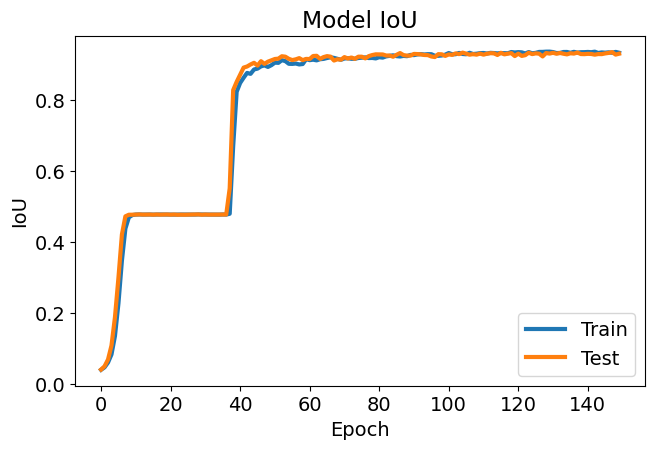

In [99]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history4['train_miou']]
val_miou = [x.cpu().numpy() for x in history4['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


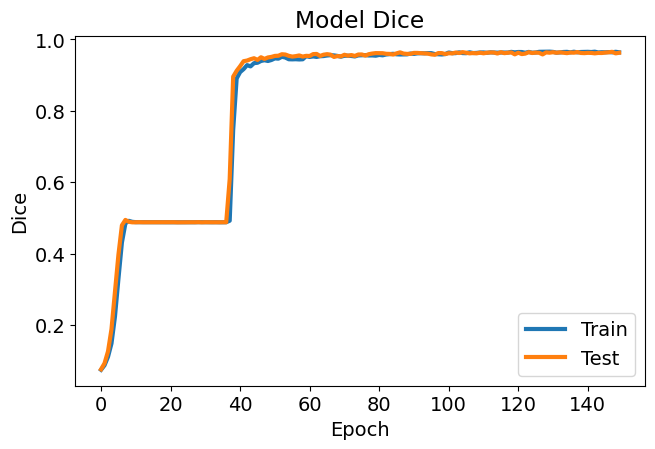

In [100]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history4['train_dice']]
val_miou = [x.cpu().numpy() for x in history4['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


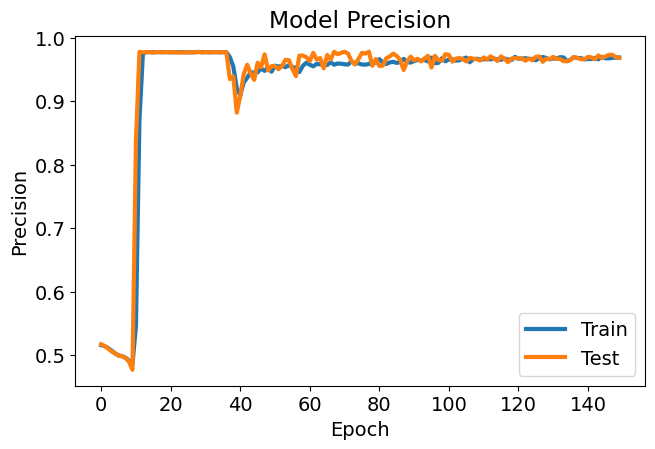

In [101]:
trainX = [x.cpu().numpy() for x in history4['train_Precision']]
valX = [x.cpu().numpy() for x in history4['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

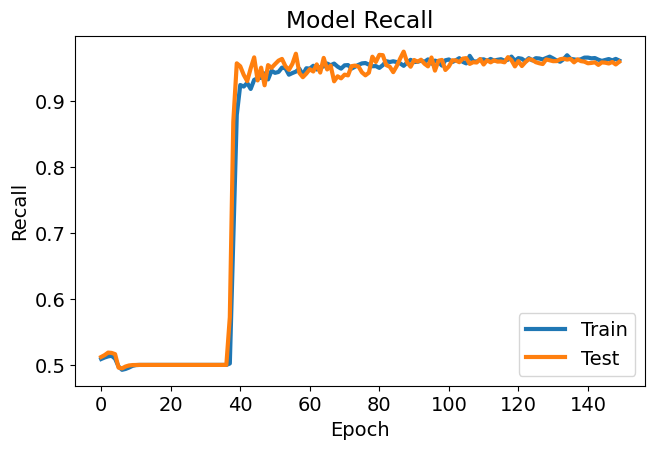

In [102]:
trainX = [x.cpu().numpy() for x in history4['train_recall']]
valX = [x.cpu().numpy() for x in history4['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

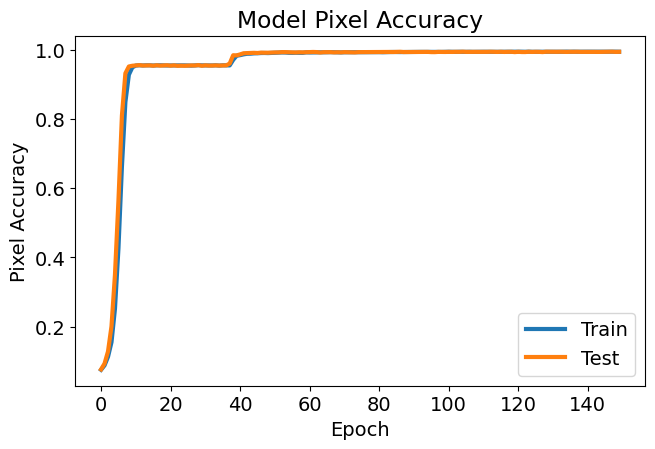

In [103]:
trainX = [x.cpu().numpy() for x in history4['train_acc']]
valX = [x.cpu().numpy() for x in history4['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

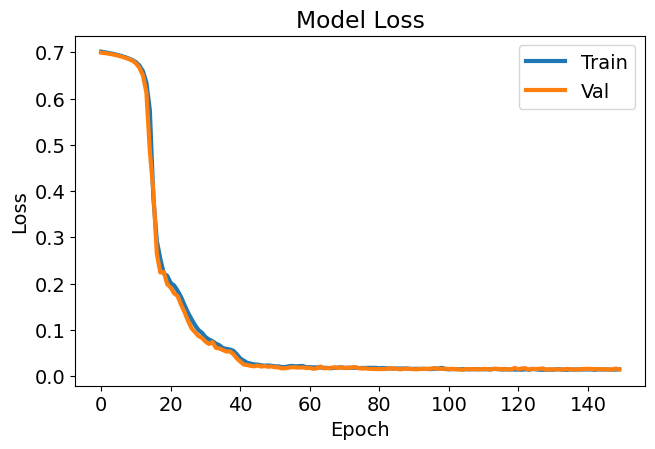

In [104]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_loss'])
plt.plot(history4['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [105]:
mob_miou = miou_score(model4, test_set)
dice_miou = dice_score_model(model4, test_set)
mob_acc = pixel_acc(model4, test_set)

100%|██████████| 61/61 [00:02<00:00, 22.16it/s]


In [106]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.935838744556914
0.9656687788165926
0.9941806480532787


100%|██████████| 61/61 [00:02<00:00, 30.38it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


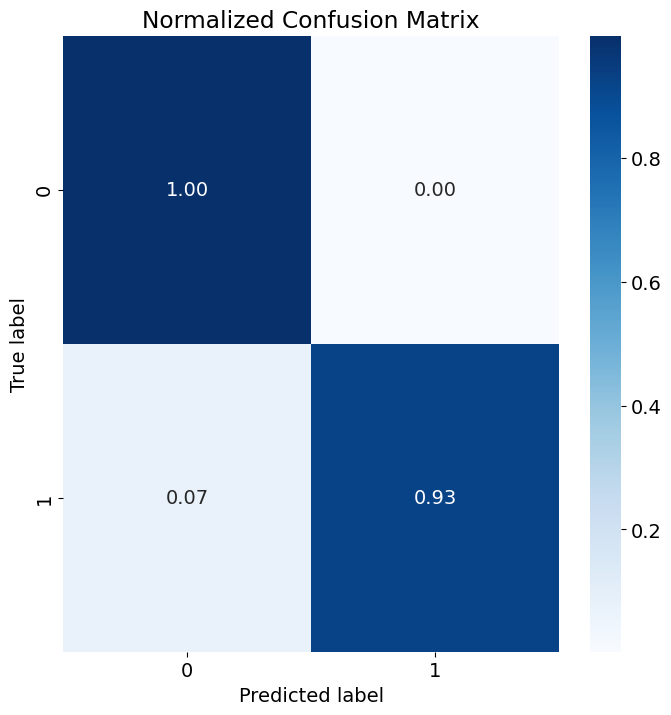

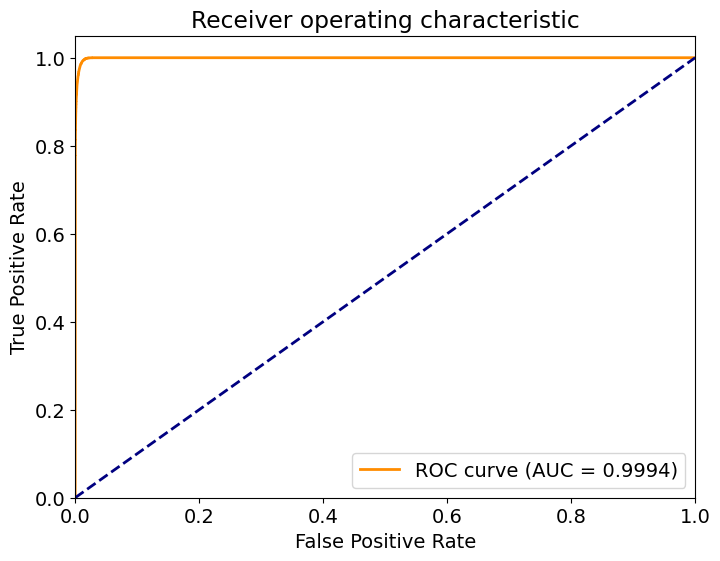

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model4, test_set)

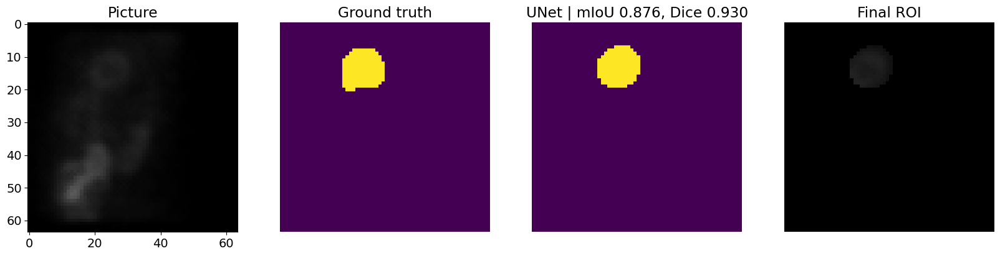

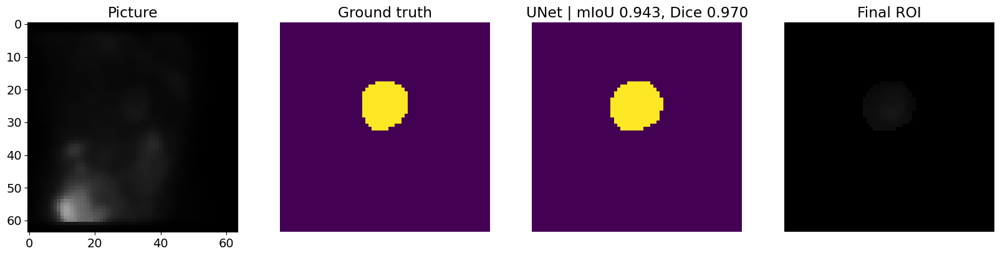

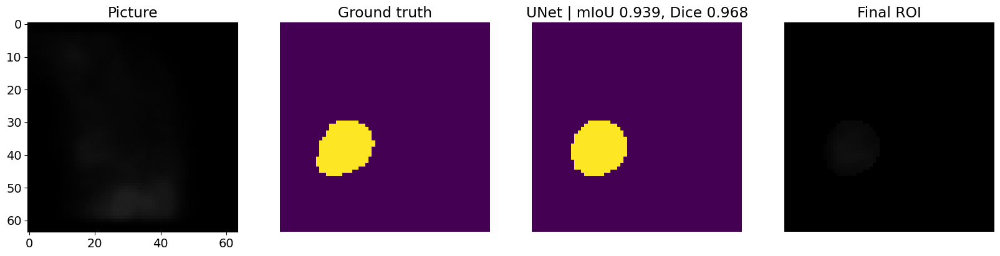

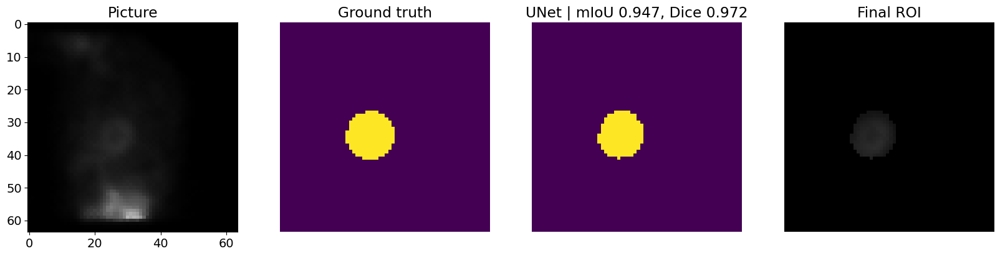

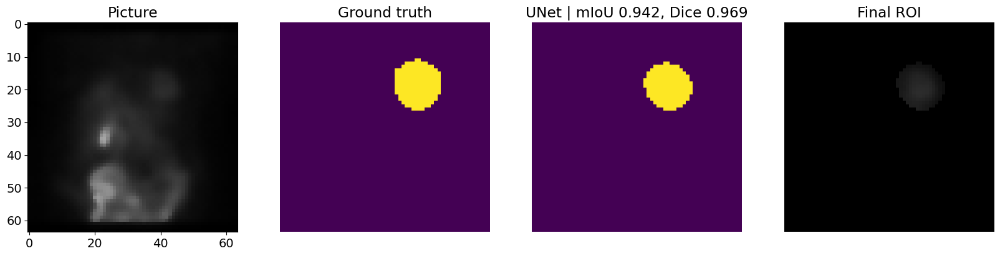

...

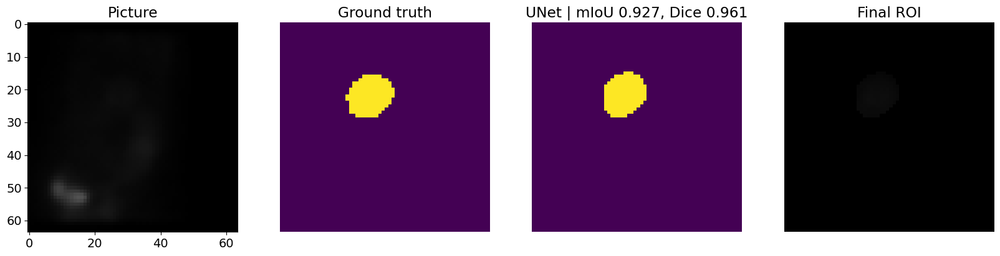

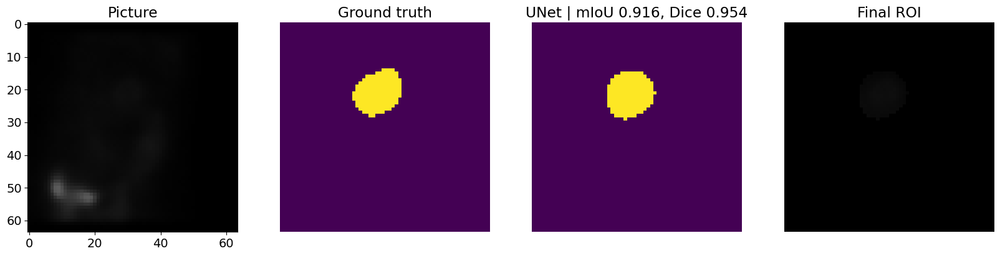

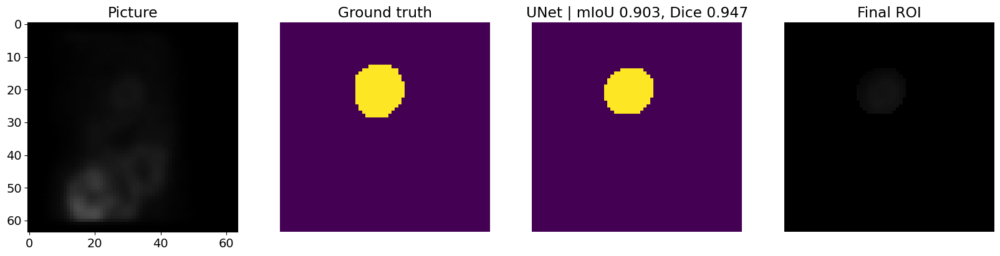

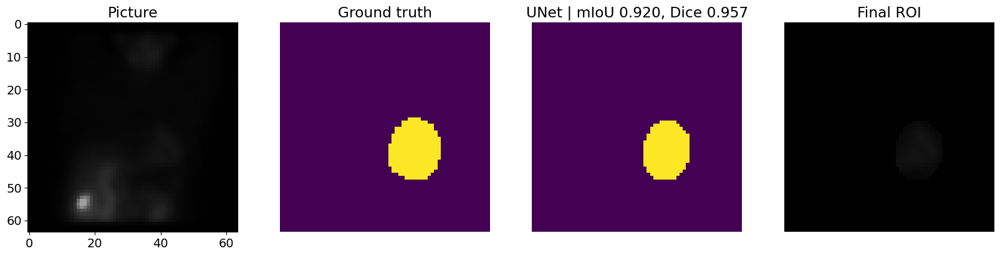

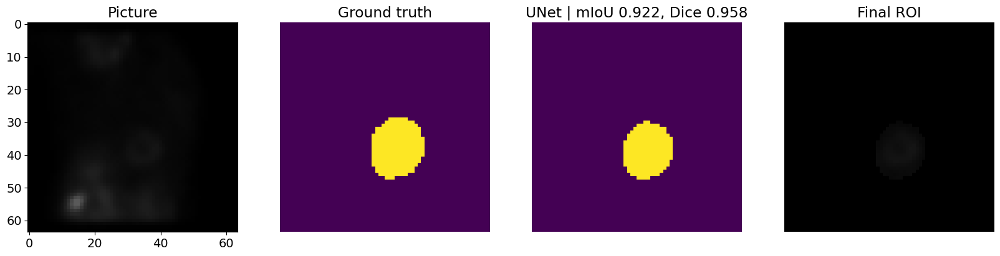

In [108]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model4, image, mask)
    pred_mask, score = predict_image_mask_miou(model4, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# ResNet

In [109]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

def double_conv(in_c, out_c):
    conv = nn.Sequential(
        nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
    )
    return conv

def crop_img(tensor, target_tensor):
    target_size = target_tensor.size()[2]
    tensor_size = tensor.size()[2]
    delta = tensor_size - target_size
    delta = delta // 2
    return tensor[:, :, delta:tensor_size - delta, delta:tensor_size - delta]

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class UNet5(nn.Module):
    def __init__(self, num_channels, num_classes, retain_dim=True):
        super(UNet5, self).__init__()

        resnet = models.resnet50(pretrained=True)
        self.encoder1 = nn.Sequential(*list(resnet.children())[:3])  # 64, 128, 128
        self.encoder2 = nn.Sequential(*list(resnet.children())[3:5])  # 256, 64, 64
        self.encoder3 = list(resnet.children())[5]  # 512, 32, 32
        self.encoder4 = list(resnet.children())[6]  # 1024, 16, 16
        self.encoder5 = list(resnet.children())[7]  # 2048, 8, 8

        self.up_trans_1 = nn.ConvTranspose2d(in_channels=2048, out_channels=1024, kernel_size=2, stride=2)
        self.up_conv_1 = double_conv(2048, 1024)
        self.attn1 = AttentionBlock(F_g=1024, F_l=1024, F_int=512)

        self.up_trans_2 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=2, stride=2)
        self.up_conv_2 = double_conv(1024, 512)
        self.attn2 = AttentionBlock(F_g=512, F_l=512, F_int=256)

        self.up_trans_3 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=2, stride=2)
        self.up_conv_3 = double_conv(512, 256)
        self.attn3 = AttentionBlock(F_g=256, F_l=256, F_int=128)

        self.up_trans_4 = nn.ConvTranspose2d(in_channels=256, out_channels=64, kernel_size=2, stride=2)
        self.up_conv_4 = double_conv(128, 64)
        self.attn4 = AttentionBlock(F_g=64, F_l=64, F_int=32)

        self.out = nn.Conv2d(
            in_channels=64,
            out_channels=num_classes,  # Number of objects to segment
            kernel_size=1,
        )
        self.retain_dim = retain_dim

    def forward(self, image, out_size=(64, 64)):
        # encoder part
        x1 = self.encoder1(image)   # 64, 128, 128
        x2 = self.encoder2(x1)      # 256, 64, 64
        x3 = self.encoder3(x2)      # 512, 32, 32
        x4 = self.encoder4(x3)      # 1024, 16, 16
        x5 = self.encoder5(x4)      # 2048, 8, 8

        # decoder part
        x = self.up_trans_1(x5)
        y = crop_img(x4, x)
        y = self.attn1(g=x, x=y)
        x = self.up_conv_1(torch.cat([x, y], 1))

        x = self.up_trans_2(x)
        y = crop_img(x3, x)
        y = self.attn2(g=x, x=y)
        x = self.up_conv_2(torch.cat([x, y], 1))

        x = self.up_trans_3(x)
        y = crop_img(x2, x)
        y = self.attn3(g=x, x=y)
        x = self.up_conv_3(torch.cat([x, y], 1))

        x = self.up_trans_4(x)
        y = crop_img(x1, x)
        y = self.attn4(g=x, x=y)
        x = self.up_conv_4(torch.cat([x, y], 1))

        x = self.out(x)
        if self.retain_dim:
            x = F.interpolate(x, out_size)
        x = F.softmax(x, dim=1)
        return x


# Example usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model5 = UNet5(num_classes=2, num_channels=3).to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 210MB/s]


In [110]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model5.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history5 = fit(epoch, model5, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.81it/s]
<ipython-input-46-0c94c4132b9a>:373: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = results._append({'Epoch': epoch,


Loss Decreasing.. inf >> 0.679 
Epoch:1/150.. Train Loss: 0.611.. Val Loss: 0.679.. Train mIoU:0.442.. Val mIoU: 0.477.. Train Dice:0.496.. Val Dice: 0.488.. Train Precision:0.504.. Val Precision: 0.977.. Train Recall:0.511.. Val Recall: 0.500.. Train TP:3433.980.. Train TP2:26.606.. Train TN:26.606.. Train TN2:3433.980.. Train FP:160.430.. Train FP2:474.984.. Train FN:474.984.. Train FN2:160.430.. Val TP: 3908.901.. Val TN: 0.000.. Val FP: 187.098.. Val FN: 0.000.. Train Accuracy:0.845.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


Loss Decreasing.. 0.679 >> 0.670 
Epoch:2/150.. Train Loss: 0.606.. Val Loss: 0.670.. Train mIoU:0.455.. Val mIoU: 0.477.. Train Dice:0.510.. Val Dice: 0.488.. Train Precision:0.514.. Val Precision: 0.977.. Train Recall:0.530.. Val Recall: 0.500.. Train TP:3491.895.. Train TP2:31.254.. Train TN:31.254.. Train TN2:3491.895.. Train FP:156.474.. Train FP2:416.377.. Train FN:416.377.. Train FN2:156.474.. Val TP: 3907.524.. Val TN: 0.000.. Val FP: 188.475.. Val FN: 0.000.. Train Accuracy:0.860.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


Loss Decreasing.. 0.670 >> 0.662 
Epoch:3/150.. Train Loss: 0.602.. Val Loss: 0.662.. Train mIoU:0.464.. Val mIoU: 0.477.. Train Dice:0.522.. Val Dice: 0.488.. Train Precision:0.523.. Val Precision: 0.928.. Train Recall:0.549.. Val Recall: 0.500.. Train TP:3518.007.. Train TP2:37.155.. Train TN:37.155.. Train TN2:3518.007.. Train FP:147.808.. Train FP2:393.030.. Train FN:393.030.. Train FN2:147.808.. Val TP: 3908.934.. Val TN: 0.000.. Val FP: 186.672.. Val FN: 0.393.. Train Accuracy:0.868.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Loss Decreasing.. 0.662 >> 0.656 
saving model...
Epoch:4/150.. Train Loss: 0.599.. Val Loss: 0.656.. Train mIoU:0.471.. Val mIoU: 0.477.. Train Dice:0.533.. Val Dice: 0.488.. Train Precision:0.533.. Val Precision: 0.813.. Train Recall:0.569.. Val Recall: 0.500.. Train TP:3509.085.. Train TP2:45.867.. Train TN:45.867.. Train TN2:3509.085.. Train FP:143.585.. Train FP2:397.464.. Train FN:397.464.. Train FN2:143.585.. Val TP: 3906.688.. Val TN: 0.000.. Val FP: 187.279.. Val FN: 2.033.. Train Accuracy:0.868.. Val Accuracy:0.954.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Loss Decreasing.. 0.656 >> 0.649 
Epoch:5/150.. Train Loss: 0.596.. Val Loss: 0.649.. Train mIoU:0.474.. Val mIoU: 0.477.. Train Dice:0.539.. Val Dice: 0.488.. Train Precision:0.539.. Val Precision: 0.699.. Train Recall:0.581.. Val Recall: 0.499.. Train TP:3506.438.. Train TP2:50.104.. Train TN:50.104.. Train TN2:3506.438.. Train FP:136.599.. Train FP2:402.860.. Train FN:402.860.. Train FN2:136.599.. Val TP: 3904.262.. Val TN: 0.000.. Val FP: 186.229.. Val FN: 5.508.. Train Accuracy:0.868.. Val Accuracy:0.953.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Loss Decreasing.. 0.649 >> 0.641 
Epoch:6/150.. Train Loss: 0.592.. Val Loss: 0.641.. Train mIoU:0.479.. Val mIoU: 0.476.. Train Dice:0.546.. Val Dice: 0.488.. Train Precision:0.546.. Val Precision: 0.633.. Train Recall:0.597.. Val Recall: 0.499.. Train TP:3503.094.. Train TP2:56.563.. Train TN:56.563.. Train TN2:3503.094.. Train FP:128.928.. Train FP2:407.414.. Train FN:407.414.. Train FN2:128.928.. Val TP: 3899.246.. Val TN: 0.000.. Val FP: 189.213.. Val FN: 7.541.. Train Accuracy:0.869.. Val Accuracy:0.952.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Loss Decreasing.. 0.641 >> 0.628 
Epoch:7/150.. Train Loss: 0.587.. Val Loss: 0.628.. Train mIoU:0.488.. Val mIoU: 0.477.. Train Dice:0.557.. Val Dice: 0.490.. Train Precision:0.559.. Val Precision: 0.655.. Train Recall:0.613.. Val Recall: 0.500.. Train TP:3526.462.. Train TP2:61.649.. Train TN:61.649.. Train TN2:3526.462.. Train FP:126.228.. Train FP2:381.661.. Train FN:381.661.. Train FN2:126.228.. Val TP: 3900.131.. Val TN: 0.443.. Val FP: 188.197.. Val FN: 7.230.. Train Accuracy:0.876.. Val Accuracy:0.952.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Loss Decreasing.. 0.628 >> 0.610 
Epoch:8/150.. Train Loss: 0.581.. Val Loss: 0.610.. Train mIoU:0.494.. Val mIoU: 0.485.. Train Dice:0.559.. Val Dice: 0.506.. Train Precision:0.567.. Val Precision: 0.631.. Train Recall:0.607.. Val Recall: 0.512.. Train TP:3582.372.. Train TP2:56.437.. Train TN:56.437.. Train TN2:3582.372.. Train FP:129.257.. Train FP2:327.934.. Train FN:327.934.. Train FN2:129.257.. Val TP: 3877.738.. Val TN: 6.295.. Val FP: 176.623.. Val FN: 35.344.. Train Accuracy:0.888.. Val Accuracy:0.948.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Loss Decreasing.. 0.610 >> 0.592 
saving model...
Epoch:9/150.. Train Loss: 0.575.. Val Loss: 0.592.. Train mIoU:0.498.. Val mIoU: 0.492.. Train Dice:0.556.. Val Dice: 0.529.. Train Precision:0.576.. Val Precision: 0.634.. Train Recall:0.589.. Val Recall: 0.544.. Train TP:3652.959.. Train TP2:46.227.. Train TN:46.227.. Train TN2:3652.959.. Train FP:140.172.. Train FP2:256.641.. Train FN:256.641.. Train FN2:140.172.. Val TP: 3796.393.. Val TN: 21.869.. Val FP: 164.590.. Val FN: 113.148.. Train Accuracy:0.903.. Val Accuracy:0.932.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Loss Decreasing.. 0.592 >> 0.575 
Epoch:10/150.. Train Loss: 0.568.. Val Loss: 0.575.. Train mIoU:0.500.. Val mIoU: 0.496.. Train Dice:0.554.. Val Dice: 0.543.. Train Precision:0.601.. Val Precision: 0.672.. Train Recall:0.582.. Val Recall: 0.571.. Train TP:3697.277.. Train TP2:40.632.. Train TN:40.632.. Train TN2:3697.277.. Train FP:144.747.. Train FP2:213.345.. Train FN:213.345.. Train FN2:144.747.. Val TP: 3721.557.. Val TN: 38.230.. Val FP: 149.590.. Val FN: 186.623.. Train Accuracy:0.913.. Val Accuracy:0.918.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


Loss Decreasing.. 0.575 >> 0.560 
Epoch:11/150.. Train Loss: 0.560.. Val Loss: 0.560.. Train mIoU:0.504.. Val mIoU: 0.502.. Train Dice:0.559.. Val Dice: 0.557.. Train Precision:0.631.. Val Precision: 0.670.. Train Recall:0.590.. Val Recall: 0.593.. Train TP:3698.020.. Train TP2:44.701.. Train TN:44.701.. Train TN2:3698.020.. Train FP:141.723.. Train FP2:211.555.. Train FN:211.555.. Train FN2:141.723.. Val TP: 3689.754.. Val TN: 47.852.. Val FP: 140.016.. Val FN: 218.377.. Train Accuracy:0.914.. Val Accuracy:0.913.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Decreasing.. 0.560 >> 0.544 
Epoch:12/150.. Train Loss: 0.552.. Val Loss: 0.544.. Train mIoU:0.503.. Val mIoU: 0.509.. Train Dice:0.554.. Val Dice: 0.563.. Train Precision:0.644.. Val Precision: 0.692.. Train Recall:0.577.. Val Recall: 0.597.. Train TP:3733.223.. Train TP2:37.850.. Train TN:37.850.. Train TN2:3733.223.. Train FP:149.332.. Train FP2:175.595.. Train FN:175.595.. Train FN2:149.332.. Val TP: 3720.147.. Val TN: 46.721.. Val FP: 142.279.. Val FN: 186.852.. Train Accuracy:0.921.. Val Accuracy:0.920.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


Loss Decreasing.. 0.544 >> 0.528 
Epoch:13/150.. Train Loss: 0.544.. Val Loss: 0.528.. Train mIoU:0.501.. Val mIoU: 0.505.. Train Dice:0.544.. Val Dice: 0.549.. Train Precision:0.667.. Val Precision: 0.700.. Train Recall:0.558.. Val Recall: 0.567.. Train TP:3779.109.. Train TP2:28.655.. Train TN:28.655.. Train TN2:3779.109.. Train FP:158.775.. Train FP2:129.461.. Train FN:129.461.. Train FN2:158.775.. Val TP: 3785.442.. Val TN: 31.885.. Val FP: 159.803.. Val FN: 118.869.. Train Accuracy:0.930.. Val Accuracy:0.932.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Loss Decreasing.. 0.528 >> 0.514 
saving model...
Epoch:14/150.. Train Loss: 0.535.. Val Loss: 0.514.. Train mIoU:0.497.. Val mIoU: 0.495.. Train Dice:0.533.. Val Dice: 0.527.. Train Precision:0.707.. Val Precision: 0.804.. Train Recall:0.543.. Val Recall: 0.543.. Train TP:3816.717.. Train TP2:20.701.. Train TN:20.701.. Train TN2:3816.717.. Train FP:165.082.. Train FP2:93.501.. Train FN:93.501.. Train FN2:165.082.. Val TP: 3839.360.. Val TN: 20.344.. Val FP: 165.033.. Val FN: 71.262.. Train Accuracy:0.937.. Val Accuracy:0.942.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Loss Decreasing.. 0.514 >> 0.503 
Epoch:15/150.. Train Loss: 0.527.. Val Loss: 0.503.. Train mIoU:0.496.. Val mIoU: 0.492.. Train Dice:0.531.. Val Dice: 0.519.. Train Precision:0.738.. Val Precision: 0.826.. Train Recall:0.545.. Val Recall: 0.531.. Train TP:3815.681.. Train TP2:21.298.. Train TN:21.298.. Train TN2:3815.681.. Train FP:164.262.. Train FP2:94.759.. Train FN:94.759.. Train FN2:164.262.. Val TP: 3856.213.. Val TN: 14.574.. Val FP: 172.180.. Val FN: 53.033.. Train Accuracy:0.937.. Val Accuracy:0.945.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Decreasing.. 0.503 >> 0.492 
Epoch:16/150.. Train Loss: 0.519.. Val Loss: 0.492.. Train mIoU:0.492.. Val mIoU: 0.491.. Train Dice:0.521.. Val Dice: 0.515.. Train Precision:0.794.. Val Precision: 0.863.. Train Recall:0.533.. Val Recall: 0.526.. Train TP:3838.976.. Train TP2:16.102.. Train TN:16.102.. Train TN2:3838.976.. Train FP:172.348.. Train FP2:68.574.. Train FN:68.574.. Train FN2:172.348.. Val TP: 3879.672.. Val TN: 11.459.. Val FP: 174.885.. Val FN: 29.984.. Train Accuracy:0.941.. Val Accuracy:0.950.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


Loss Decreasing.. 0.492 >> 0.483 
Epoch:17/150.. Train Loss: 0.510.. Val Loss: 0.483.. Train mIoU:0.490.. Val mIoU: 0.484.. Train Dice:0.518.. Val Dice: 0.503.. Train Precision:0.813.. Val Precision: 0.887.. Train Recall:0.529.. Val Recall: 0.514.. Train TP:3848.191.. Train TP2:13.717.. Train TN:13.717.. Train TN2:3848.191.. Train FP:171.587.. Train FP2:62.505.. Train FN:62.505.. Train FN2:171.587.. Val TP: 3882.639.. Val TN: 7.180.. Val FP: 179.328.. Val FN: 26.852.. Train Accuracy:0.943.. Val Accuracy:0.950.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Decreasing.. 0.483 >> 0.471 
Epoch:18/150.. Train Loss: 0.501.. Val Loss: 0.471.. Train mIoU:0.486.. Val mIoU: 0.482.. Train Dice:0.509.. Val Dice: 0.497.. Train Precision:0.849.. Val Precision: 0.944.. Train Recall:0.521.. Val Recall: 0.508.. Train TP:3864.052.. Train TP2:10.359.. Train TN:10.359.. Train TN2:3864.052.. Train FP:173.463.. Train FP2:48.127.. Train FN:48.127.. Train FN2:173.463.. Val TP: 3900.197.. Val TN: 3.984.. Val FP: 182.885.. Val FN: 8.934.. Train Accuracy:0.946.. Val Accuracy:0.953.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Loss Decreasing.. 0.471 >> 0.460 
saving model...
Epoch:19/150.. Train Loss: 0.493.. Val Loss: 0.460.. Train mIoU:0.481.. Val mIoU: 0.477.. Train Dice:0.500.. Val Dice: 0.488.. Train Precision:0.901.. Val Precision: 0.977.. Train Recall:0.513.. Val Recall: 0.500.. Train TP:3872.885.. Train TP2:6.832.. Train TN:6.832.. Train TN2:3872.885.. Train FP:178.684.. Train FP2:37.599.. Train FN:37.599.. Train FN2:178.684.. Val TP: 3904.573.. Val TN: 0.066.. Val FP: 191.361.. Val FN: 0.000.. Train Accuracy:0.947.. Val Accuracy:0.953.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Loss Decreasing.. 0.460 >> 0.448 
Epoch:20/150.. Train Loss: 0.484.. Val Loss: 0.448.. Train mIoU:0.479.. Val mIoU: 0.477.. Train Dice:0.494.. Val Dice: 0.489.. Train Precision:0.933.. Val Precision: 0.977.. Train Recall:0.510.. Val Recall: 0.500.. Train TP:3880.861.. Train TP2:5.239.. Train TN:5.239.. Train TN2:3880.861.. Train FP:181.794.. Train FP2:28.106.. Train FN:28.106.. Train FN2:181.794.. Val TP: 3908.246.. Val TN: 0.066.. Val FP: 187.689.. Val FN: 0.000.. Train Accuracy:0.949.. Val Accuracy:0.954.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Loss Decreasing.. 0.448 >> 0.438 
Epoch:21/150.. Train Loss: 0.477.. Val Loss: 0.438.. Train mIoU:0.479.. Val mIoU: 0.477.. Train Dice:0.494.. Val Dice: 0.488.. Train Precision:0.962.. Val Precision: 0.977.. Train Recall:0.508.. Val Recall: 0.500.. Train TP:3889.408.. Train TP2:3.939.. Train TN:3.939.. Train TN2:3889.408.. Train FP:180.451.. Train FP2:22.202.. Train FN:22.202.. Train FN2:180.451.. Val TP: 3907.360.. Val TN: 0.000.. Val FP: 188.639.. Val FN: 0.000.. Train Accuracy:0.951.. Val Accuracy:0.954.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Loss Not Decrease for 1 time
Epoch:22/150.. Train Loss: 0.470.. Val Loss: 0.441.. Train mIoU:0.487.. Val mIoU: 0.480.. Train Dice:0.508.. Val Dice: 0.493.. Train Precision:0.967.. Val Precision: 0.978.. Train Recall:0.514.. Val Recall: 0.502.. Train TP:3894.156.. Train TP2:6.581.. Train TN:6.581.. Train TN2:3894.156.. Train FP:180.114.. Train FP2:15.149.. Train FN:15.149.. Train FN2:180.114.. Val TP: 3912.131.. Val TN: 0.918.. Val FP: 182.951.. Val FN: 0.000.. Train Accuracy:0.952.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Loss Not Decrease for 2 time
Epoch:23/150.. Train Loss: 0.466.. Val Loss: 0.446.. Train mIoU:0.517.. Val mIoU: 0.484.. Train Dice:0.554.. Val Dice: 0.501.. Train Precision:0.956.. Val Precision: 0.978.. Train Recall:0.546.. Val Recall: 0.507.. Train TP:3886.398.. Train TP2:18.534.. Train TN:18.534.. Train TN2:3886.398.. Train FP:166.989.. Train FP2:24.080.. Train FN:24.080.. Train FN2:166.989.. Val TP: 3909.573.. Val TN: 2.820.. Val FP: 183.607.. Val FN: 0.000.. Train Accuracy:0.953.. Val Accuracy:0.955.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Loss Not Decrease for 3 time
Epoch:24/150.. Train Loss: 0.460.. Val Loss: 0.449.. Train mIoU:0.603.. Val mIoU: 0.514.. Train Dice:0.665.. Val Dice: 0.545.. Train Precision:0.946.. Val Precision: 0.942.. Train Recall:0.628.. Val Recall: 0.546.. Train TP:3889.406.. Train TP2:49.545.. Train TN:49.545.. Train TN2:3889.406.. Train FP:136.677.. Train FP2:20.373.. Train FN:20.373.. Train FN2:136.677.. Val TP: 3894.147.. Val TN: 18.492.. Val FP: 168.016.. Val FN: 15.344.. Train Accuracy:0.962.. Val Accuracy:0.955.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Loss Decreasing.. 0.449 >> 0.448 
Epoch:25/150.. Train Loss: 0.455.. Val Loss: 0.448.. Train mIoU:0.689.. Val mIoU: 0.537.. Train Dice:0.759.. Val Dice: 0.590.. Train Precision:0.940.. Val Precision: 0.874.. Train Recall:0.722.. Val Recall: 0.598.. Train TP:3883.549.. Train TP2:85.341.. Train TN:85.341.. Train TN2:3883.549.. Train FP:101.798.. Train FP2:25.313.. Train FN:25.313.. Train FN2:101.798.. Val TP: 3821.934.. Val TN: 43.213.. Val FP: 146.525.. Val FN: 84.328.. Train Accuracy:0.969.. Val Accuracy:0.944.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Loss Decreasing.. 0.448 >> 0.438 
Epoch:26/150.. Train Loss: 0.451.. Val Loss: 0.438.. Train mIoU:0.755.. Val mIoU: 0.628.. Train Dice:0.823.. Val Dice: 0.689.. Train Precision:0.931.. Val Precision: 0.980.. Train Recall:0.799.. Val Recall: 0.646.. Train TP:3877.434.. Train TP2:114.137.. Train TN:114.137.. Train TN2:3877.434.. Train FP:73.114.. Train FP2:31.316.. Train FN:31.316.. Train FN2:73.114.. Val TP: 3905.770.. Val TN: 56.475.. Val FP: 132.984.. Val FN: 0.770.. Train Accuracy:0.975.. Val Accuracy:0.967.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Loss Not Decrease for 4 time
Epoch:27/150.. Train Loss: 0.446.. Val Loss: 0.442.. Train mIoU:0.790.. Val mIoU: 0.768.. Train Dice:0.856.. Val Dice: 0.839.. Train Precision:0.909.. Val Precision: 0.969.. Train Recall:0.852.. Val Recall: 0.789.. Train TP:3864.859.. Train TP2:134.982.. Train TN:134.982.. Train TN2:3864.859.. Train FP:52.862.. Train FP2:43.297.. Train FN:43.297.. Train FN2:52.862.. Val TP: 3906.147.. Val TN: 106.607.. Val FP: 77.393.. Val FN: 5.852.. Train Accuracy:0.977.. Val Accuracy:0.980.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


Loss Decreasing.. 0.442 >> 0.439 
saving model...
Epoch:28/150.. Train Loss: 0.441.. Val Loss: 0.439.. Train mIoU:0.815.. Val mIoU: 0.783.. Train Dice:0.879.. Val Dice: 0.850.. Train Precision:0.901.. Val Precision: 0.976.. Train Recall:0.890.. Val Recall: 0.801.. Train TP:3860.560.. Train TP2:147.026.. Train TN:147.026.. Train TN2:3860.560.. Train FP:40.306.. Train FP2:48.108.. Train FN:48.108.. Train FN2:40.306.. Val TP: 3905.557.. Val TN: 112.033.. Val FP: 74.311.. Val FN: 4.098.. Train Accuracy:0.978.. Val Accuracy:0.981.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Loss Decreasing.. 0.439 >> 0.433 
Epoch:29/150.. Train Loss: 0.437.. Val Loss: 0.433.. Train mIoU:0.822.. Val mIoU: 0.827.. Train Dice:0.886.. Val Dice: 0.891.. Train Precision:0.897.. Val Precision: 0.965.. Train Recall:0.905.. Val Recall: 0.853.. Train TP:3859.124.. Train TP2:153.150.. Train TN:153.150.. Train TN2:3859.124.. Train FP:32.689.. Train FP2:51.037.. Train FN:51.037.. Train FN2:32.689.. Val TP: 3900.115.. Val TN: 132.590.. Val FP: 54.180.. Val FN: 9.115.. Train Accuracy:0.980.. Val Accuracy:0.985.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Loss Decreasing.. 0.433 >> 0.430 
Epoch:30/150.. Train Loss: 0.434.. Val Loss: 0.430.. Train mIoU:0.834.. Val mIoU: 0.864.. Train Dice:0.895.. Val Dice: 0.921.. Train Precision:0.901.. Val Precision: 0.922.. Train Recall:0.911.. Val Recall: 0.932.. Train TP:3860.776.. Train TP2:156.067.. Train TN:156.067.. Train TN2:3860.776.. Train FP:31.239.. Train FP2:47.918.. Train FN:47.918.. Train FN2:31.239.. Val TP: 3876.869.. Val TN: 163.508.. Val FP: 25.361.. Val FN: 30.262.. Train Accuracy:0.981.. Val Accuracy:0.986.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


Loss Not Decrease for 5 time
Epoch:31/150.. Train Loss: 0.432.. Val Loss: 0.494.. Train mIoU:0.828.. Val mIoU: 0.595.. Train Dice:0.891.. Val Dice: 0.676.. Train Precision:0.902.. Val Precision: 0.678.. Train Recall:0.910.. Val Recall: 0.776.. Train TP:3857.380.. Train TP2:154.547.. Train TN:154.547.. Train TN2:3857.380.. Train FP:31.709.. Train FP2:52.363.. Train FN:52.363.. Train FN2:31.709.. Val TP: 3507.377.. Val TN: 124.836.. Val FP: 62.197.. Val FN: 401.590.. Train Accuracy:0.979.. Val Accuracy:0.887.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


Loss Decreasing.. 0.494 >> 0.456 
Epoch:32/150.. Train Loss: 0.430.. Val Loss: 0.456.. Train mIoU:0.826.. Val mIoU: 0.560.. Train Dice:0.888.. Val Dice: 0.617.. Train Precision:0.889.. Val Precision: 0.609.. Train Recall:0.913.. Val Recall: 0.632.. Train TP:3854.364.. Train TP2:157.006.. Train TN:157.006.. Train TN2:3854.364.. Train FP:29.133.. Train FP2:55.497.. Train FN:55.497.. Train FN2:29.133.. Val TP: 3777.246.. Val TN: 53.082.. Val FP: 132.787.. Val FN: 132.885.. Train Accuracy:0.979.. Val Accuracy:0.935.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Loss Decreasing.. 0.456 >> 0.438 
Epoch:33/150.. Train Loss: 0.426.. Val Loss: 0.438.. Train mIoU:0.842.. Val mIoU: 0.556.. Train Dice:0.902.. Val Dice: 0.592.. Train Precision:0.898.. Val Precision: 0.971.. Train Recall:0.929.. Val Recall: 0.577.. Train TP:3859.764.. Train TP2:162.146.. Train TN:162.146.. Train TN2:3859.764.. Train FP:24.598.. Train FP2:49.493.. Train FN:49.493.. Train FN2:24.598.. Val TP: 3907.852.. Val TN: 29.492.. Val FP: 157.721.. Val FN: 0.934.. Train Accuracy:0.982.. Val Accuracy:0.961.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Loss Not Decrease for 6 time
Epoch:34/150.. Train Loss: 0.424.. Val Loss: 0.449.. Train mIoU:0.840.. Val mIoU: 0.783.. Train Dice:0.901.. Val Dice: 0.853.. Train Precision:0.889.. Val Precision: 0.882.. Train Recall:0.930.. Val Recall: 0.856.. Train TP:3861.193.. Train TP2:161.335.. Train TN:161.335.. Train TN2:3861.193.. Train FP:23.860.. Train FP2:49.611.. Train FN:49.611.. Train FN2:23.860.. Val TP: 3833.065.. Val TN: 137.656.. Val FP: 50.672.. Val FN: 74.607.. Train Accuracy:0.982.. Val Accuracy:0.969.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Loss Decreasing.. 0.449 >> 0.436 
saving model...
Epoch:35/150.. Train Loss: 0.422.. Val Loss: 0.436.. Train mIoU:0.845.. Val mIoU: 0.790.. Train Dice:0.903.. Val Dice: 0.853.. Train Precision:0.909.. Val Precision: 0.886.. Train Recall:0.921.. Val Recall: 0.872.. Train TP:3864.041.. Train TP2:160.683.. Train TN:160.683.. Train TN2:3864.041.. Train FP:27.888.. Train FP2:43.388.. Train FN:43.388.. Train FN2:27.888.. Val TP: 3822.311.. Val TN: 143.623.. Val FP: 43.984.. Val FN: 86.082.. Train Accuracy:0.983.. Val Accuracy:0.968.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Loss Decreasing.. 0.436 >> 0.423 
Epoch:36/150.. Train Loss: 0.419.. Val Loss: 0.423.. Train mIoU:0.850.. Val mIoU: 0.869.. Train Dice:0.908.. Val Dice: 0.922.. Train Precision:0.902.. Val Precision: 0.900.. Train Recall:0.930.. Val Recall: 0.958.. Train TP:3869.738.. Train TP2:160.406.. Train TN:160.406.. Train TN2:3869.738.. Train FP:24.528.. Train FP2:41.328.. Train FN:41.328.. Train FN2:24.528.. Val TP: 3860.590.. Val TN: 173.492.. Val FP: 13.967.. Val FN: 47.951.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Loss Decreasing.. 0.423 >> 0.414 
Epoch:37/150.. Train Loss: 0.416.. Val Loss: 0.414.. Train mIoU:0.861.. Val mIoU: 0.884.. Train Dice:0.916.. Val Dice: 0.930.. Train Precision:0.911.. Val Precision: 0.948.. Train Recall:0.936.. Val Recall: 0.928.. Train TP:3869.518.. Train TP2:164.289.. Train TN:164.289.. Train TN2:3869.518.. Train FP:22.052.. Train FP2:40.140.. Train FN:40.140.. Train FN2:22.052.. Val TP: 3889.852.. Val TN: 161.869.. Val FP: 26.607.. Val FN: 17.672.. Train Accuracy:0.985.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Loss Decreasing.. 0.414 >> 0.411 
Epoch:38/150.. Train Loss: 0.414.. Val Loss: 0.411.. Train mIoU:0.866.. Val mIoU: 0.888.. Train Dice:0.919.. Val Dice: 0.936.. Train Precision:0.918.. Val Precision: 0.933.. Train Recall:0.934.. Val Recall: 0.948.. Train TP:3872.549.. Train TP2:165.180.. Train TN:165.180.. Train TN2:3872.549.. Train FP:23.396.. Train FP2:34.875.. Train FN:34.875.. Train FN2:23.396.. Val TP: 3881.065.. Val TN: 169.934.. Val FP: 18.869.. Val FN: 26.131.. Train Accuracy:0.986.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Loss Not Decrease for 7 time
Epoch:39/150.. Train Loss: 0.413.. Val Loss: 0.413.. Train mIoU:0.864.. Val mIoU: 0.876.. Train Dice:0.918.. Val Dice: 0.929.. Train Precision:0.913.. Val Precision: 0.908.. Train Recall:0.935.. Val Recall: 0.961.. Train TP:3873.427.. Train TP2:162.785.. Train TN:162.785.. Train TN2:3873.427.. Train FP:23.773.. Train FP2:36.015.. Train FN:36.015.. Train FN2:23.773.. Val TP: 3865.901.. Val TN: 177.066.. Val FP: 13.836.. Val FN: 39.197.. Train Accuracy:0.985.. Val Accuracy:0.987.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Loss Decreasing.. 0.413 >> 0.409 
Epoch:40/150.. Train Loss: 0.410.. Val Loss: 0.409.. Train mIoU:0.866.. Val mIoU: 0.881.. Train Dice:0.919.. Val Dice: 0.931.. Train Precision:0.917.. Val Precision: 0.914.. Train Recall:0.934.. Val Recall: 0.957.. Train TP:3872.299.. Train TP2:165.792.. Train TN:165.792.. Train TN2:3872.299.. Train FP:23.674.. Train FP2:34.235.. Train FN:34.235.. Train FN2:23.674.. Val TP: 3878.344.. Val TN: 168.098.. Val FP: 14.311.. Val FN: 35.246.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


Loss Decreasing.. 0.409 >> 0.407 
saving model...
Epoch:41/150.. Train Loss: 0.408.. Val Loss: 0.407.. Train mIoU:0.872.. Val mIoU: 0.872.. Train Dice:0.925.. Val Dice: 0.922.. Train Precision:0.915.. Val Precision: 0.918.. Train Recall:0.945.. Val Recall: 0.938.. Train TP:3875.217.. Train TP2:165.886.. Train TN:165.886.. Train TN2:3875.217.. Train FP:19.747.. Train FP2:35.150.. Train FN:35.150.. Train FN2:19.747.. Val TP: 3861.819.. Val TN: 168.049.. Val FP: 22.377.. Val FN: 43.754.. Train Accuracy:0.987.. Val Accuracy:0.984.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


Loss Not Decrease for 8 time
Epoch:42/150.. Train Loss: 0.407.. Val Loss: 0.414.. Train mIoU:0.868.. Val mIoU: 0.819.. Train Dice:0.920.. Val Dice: 0.881.. Train Precision:0.916.. Val Precision: 0.856.. Train Recall:0.935.. Val Recall: 0.931.. Train TP:3876.879.. Train TP2:162.864.. Train TN:162.864.. Train TN2:3876.879.. Train FP:22.490.. Train FP2:33.767.. Train FN:33.767.. Train FN2:22.490.. Val TP: 3827.688.. Val TN: 161.492.. Val FP: 21.820.. Val FN: 85.000.. Train Accuracy:0.986.. Val Accuracy:0.974.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


Loss Decreasing.. 0.414 >> 0.403 
Epoch:43/150.. Train Loss: 0.405.. Val Loss: 0.403.. Train mIoU:0.872.. Val mIoU: 0.895.. Train Dice:0.925.. Val Dice: 0.941.. Train Precision:0.916.. Val Precision: 0.943.. Train Recall:0.943.. Val Recall: 0.944.. Train TP:3876.415.. Train TP2:165.706.. Train TN:165.706.. Train TN2:3876.415.. Train FP:20.391.. Train FP2:33.489.. Train FN:33.489.. Train FN2:20.391.. Val TP: 3887.541.. Val TN: 166.820.. Val FP: 21.902.. Val FN: 19.738.. Train Accuracy:0.987.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Loss Not Decrease for 9 time
Epoch:44/150.. Train Loss: 0.403.. Val Loss: 0.403.. Train mIoU:0.877.. Val mIoU: 0.890.. Train Dice:0.928.. Val Dice: 0.938.. Train Precision:0.921.. Val Precision: 0.927.. Train Recall:0.941.. Val Recall: 0.955.. Train TP:3878.863.. Train TP2:164.888.. Train TN:164.888.. Train TN2:3878.863.. Train FP:20.763.. Train FP2:31.487.. Train FN:31.487.. Train FN2:20.763.. Val TP: 3877.524.. Val TN: 173.820.. Val FP: 16.967.. Val FN: 27.689.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Loss Decreasing.. 0.403 >> 0.399 
Epoch:45/150.. Train Loss: 0.402.. Val Loss: 0.399.. Train mIoU:0.875.. Val mIoU: 0.898.. Train Dice:0.926.. Val Dice: 0.943.. Train Precision:0.919.. Val Precision: 0.948.. Train Recall:0.942.. Val Recall: 0.943.. Train TP:3877.409.. Train TP2:165.504.. Train TN:165.504.. Train TN2:3877.409.. Train FP:21.106.. Train FP2:31.982.. Train FN:31.982.. Train FN2:21.106.. Val TP: 3887.115.. Val TN: 168.508.. Val FP: 22.459.. Val FN: 17.918.. Train Accuracy:0.987.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Loss Not Decrease for 10 time
Epoch:46/150.. Train Loss: 0.400.. Val Loss: 0.399.. Train mIoU:0.878.. Val mIoU: 0.886.. Train Dice:0.928.. Val Dice: 0.934.. Train Precision:0.925.. Val Precision: 0.923.. Train Recall:0.942.. Val Recall: 0.956.. Train TP:3877.974.. Train TP2:166.696.. Train TN:166.696.. Train TN2:3877.974.. Train FP:22.089.. Train FP2:29.241.. Train FN:29.241.. Train FN2:22.089.. Val TP: 3878.147.. Val TN: 172.508.. Val FP: 15.230.. Val FN: 30.115.. Train Accuracy:0.987.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Decreasing.. 0.399 >> 0.396 
Epoch:47/150.. Train Loss: 0.399.. Val Loss: 0.396.. Train mIoU:0.880.. Val mIoU: 0.898.. Train Dice:0.930.. Val Dice: 0.943.. Train Precision:0.922.. Val Precision: 0.943.. Train Recall:0.947.. Val Recall: 0.949.. Train TP:3878.457.. Train TP2:167.500.. Train TN:167.500.. Train TN2:3878.457.. Train FP:19.572.. Train FP2:30.471.. Train FN:30.471.. Train FN2:19.572.. Val TP: 3888.082.. Val TN: 167.754.. Val FP: 20.115.. Val FN: 20.049.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Loss Decreasing.. 0.396 >> 0.396 
Epoch:48/150.. Train Loss: 0.398.. Val Loss: 0.396.. Train mIoU:0.879.. Val mIoU: 0.896.. Train Dice:0.928.. Val Dice: 0.942.. Train Precision:0.923.. Val Precision: 0.931.. Train Recall:0.941.. Val Recall: 0.958.. Train TP:3883.777.. Train TP2:162.344.. Train TN:162.344.. Train TN2:3883.777.. Train FP:20.651.. Train FP2:29.228.. Train FN:29.228.. Train FN2:20.651.. Val TP: 3882.147.. Val TN: 172.328.. Val FP: 15.557.. Val FN: 25.967.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Loss Decreasing.. 0.396 >> 0.394 
saving model...
Epoch:49/150.. Train Loss: 0.397.. Val Loss: 0.394.. Train mIoU:0.879.. Val mIoU: 0.896.. Train Dice:0.928.. Val Dice: 0.941.. Train Precision:0.925.. Val Precision: 0.945.. Train Recall:0.941.. Val Recall: 0.944.. Train TP:3879.243.. Train TP2:165.726.. Train TN:165.726.. Train TN2:3879.243.. Train FP:22.278.. Train FP2:28.752.. Train FN:28.752.. Train FN2:22.278.. Val TP: 3888.098.. Val TN: 167.344.. Val FP: 21.410.. Val FN: 19.148.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.07m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Loss Decreasing.. 0.394 >> 0.393 
Epoch:50/150.. Train Loss: 0.395.. Val Loss: 0.393.. Train mIoU:0.878.. Val mIoU: 0.895.. Train Dice:0.928.. Val Dice: 0.941.. Train Precision:0.924.. Val Precision: 0.931.. Train Recall:0.940.. Val Recall: 0.957.. Train TP:3883.335.. Train TP2:163.291.. Train TN:163.291.. Train TN2:3883.335.. Train FP:21.231.. Train FP2:28.143.. Train FN:28.143.. Train FN2:21.231.. Val TP: 3880.606.. Val TN: 172.623.. Val FP: 16.180.. Val FN: 26.590.. Train Accuracy:0.988.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Loss Decreasing.. 0.393 >> 0.392 
Epoch:51/150.. Train Loss: 0.394.. Val Loss: 0.392.. Train mIoU:0.876.. Val mIoU: 0.885.. Train Dice:0.926.. Val Dice: 0.935.. Train Precision:0.925.. Val Precision: 0.921.. Train Recall:0.936.. Val Recall: 0.957.. Train TP:3882.463.. Train TP2:163.837.. Train TN:163.837.. Train TN2:3882.463.. Train FP:23.335.. Train FP2:26.365.. Train FN:26.365.. Train FN2:23.335.. Val TP: 3876.639.. Val TN: 170.902.. Val FP: 17.787.. Val FN: 30.672.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Loss Decreasing.. 0.392 >> 0.391 
Epoch:52/150.. Train Loss: 0.393.. Val Loss: 0.391.. Train mIoU:0.875.. Val mIoU: 0.887.. Train Dice:0.925.. Val Dice: 0.936.. Train Precision:0.928.. Val Precision: 0.920.. Train Recall:0.936.. Val Recall: 0.961.. Train TP:3881.797.. Train TP2:163.457.. Train TN:163.457.. Train TN2:3881.797.. Train FP:24.038.. Train FP2:26.707.. Train FN:26.707.. Train FN2:24.038.. Val TP: 3874.836.. Val TN: 174.115.. Val FP: 15.000.. Val FN: 32.049.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Loss Decreasing.. 0.391 >> 0.388 
Epoch:53/150.. Train Loss: 0.391.. Val Loss: 0.388.. Train mIoU:0.880.. Val mIoU: 0.905.. Train Dice:0.929.. Val Dice: 0.948.. Train Precision:0.929.. Val Precision: 0.946.. Train Recall:0.941.. Val Recall: 0.952.. Train TP:3884.163.. Train TP2:164.433.. Train TN:164.433.. Train TN2:3884.163.. Train FP:21.111.. Train FP2:26.293.. Train FN:26.293.. Train FN2:21.111.. Val TP: 3891.065.. Val TN: 168.164.. Val FP: 17.459.. Val FN: 19.311.. Train Accuracy:0.988.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Loss Decreasing.. 0.388 >> 0.388 
saving model...
Epoch:54/150.. Train Loss: 0.390.. Val Loss: 0.388.. Train mIoU:0.884.. Val mIoU: 0.884.. Train Dice:0.933.. Val Dice: 0.928.. Train Precision:0.928.. Val Precision: 0.926.. Train Recall:0.945.. Val Recall: 0.934.. Train TP:3883.779.. Train TP2:165.144.. Train TN:165.144.. Train TN2:3883.779.. Train FP:20.401.. Train FP2:26.675.. Train FN:26.675.. Train FN2:20.401.. Val TP: 3881.065.. Val TN: 166.049.. Val FP: 25.033.. Val FN: 23.852.. Train Accuracy:0.989.. Val Accuracy:0.988.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Loss Not Decrease for 11 time
Epoch:55/150.. Train Loss: 0.389.. Val Loss: 0.388.. Train mIoU:0.882.. Val mIoU: 0.888.. Train Dice:0.930.. Val Dice: 0.933.. Train Precision:0.930.. Val Precision: 0.923.. Train Recall:0.938.. Val Recall: 0.948.. Train TP:3888.508.. Train TP2:161.501.. Train TN:161.501.. Train TN2:3888.508.. Train FP:22.138.. Train FP2:23.853.. Train FN:23.853.. Train FN2:22.138.. Val TP: 3877.639.. Val TN: 168.393.. Val FP: 18.689.. Val FN: 31.279.. Train Accuracy:0.989.. Val Accuracy:0.988.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Loss Not Decrease for 12 time
Epoch:56/150.. Train Loss: 0.387.. Val Loss: 0.389.. Train mIoU:0.887.. Val mIoU: 0.869.. Train Dice:0.934.. Val Dice: 0.919.. Train Precision:0.935.. Val Precision: 0.911.. Train Recall:0.940.. Val Recall: 0.933.. Train TP:3887.484.. Train TP2:164.128.. Train TN:164.128.. Train TN2:3887.484.. Train FP:21.748.. Train FP2:22.640.. Train FN:22.640.. Train FN2:21.748.. Val TP: 3876.246.. Val TN: 162.672.. Val FP: 23.492.. Val FN: 33.590.. Train Accuracy:0.989.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Loss Decreasing.. 0.389 >> 0.388 
Epoch:57/150.. Train Loss: 0.386.. Val Loss: 0.388.. Train mIoU:0.888.. Val mIoU: 0.884.. Train Dice:0.935.. Val Dice: 0.930.. Train Precision:0.931.. Val Precision: 0.928.. Train Recall:0.947.. Val Recall: 0.937.. Train TP:3884.802.. Train TP2:166.768.. Train TN:166.768.. Train TN2:3884.802.. Train FP:19.237.. Train FP2:25.193.. Train FN:25.193.. Train FN2:19.237.. Val TP: 3881.197.. Val TN: 162.475.. Val FP: 22.016.. Val FN: 30.311.. Train Accuracy:0.989.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


Loss Decreasing.. 0.388 >> 0.384 
Epoch:58/150.. Train Loss: 0.385.. Val Loss: 0.384.. Train mIoU:0.888.. Val mIoU: 0.892.. Train Dice:0.935.. Val Dice: 0.936.. Train Precision:0.932.. Val Precision: 0.948.. Train Recall:0.946.. Val Recall: 0.935.. Train TP:3887.458.. Train TP2:164.327.. Train TN:164.327.. Train TN2:3887.458.. Train FP:19.665.. Train FP2:24.551.. Train FN:24.551.. Train FN2:19.665.. Val TP: 3889.885.. Val TN: 163.410.. Val FP: 25.262.. Val FN: 17.443.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Loss Not Decrease for 13 time
Epoch:59/150.. Train Loss: 0.385.. Val Loss: 0.385.. Train mIoU:0.888.. Val mIoU: 0.890.. Train Dice:0.934.. Val Dice: 0.934.. Train Precision:0.934.. Val Precision: 0.934.. Train Recall:0.941.. Val Recall: 0.939.. Train TP:3886.364.. Train TP2:164.617.. Train TN:164.617.. Train TN2:3886.364.. Train FP:21.742.. Train FP2:23.277.. Train FN:23.277.. Train FN2:21.742.. Val TP: 3887.360.. Val TN: 164.918.. Val FP: 22.541.. Val FN: 21.180.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Loss Not Decrease for 14 time
Epoch:60/150.. Train Loss: 0.384.. Val Loss: 0.385.. Train mIoU:0.883.. Val mIoU: 0.875.. Train Dice:0.931.. Val Dice: 0.923.. Train Precision:0.940.. Val Precision: 0.913.. Train Recall:0.933.. Val Recall: 0.957.. Train TP:3884.965.. Train TP2:164.925.. Train TN:164.925.. Train TN2:3884.965.. Train FP:25.045.. Train FP2:21.066.. Train FN:21.066.. Train FN2:25.045.. Val TP: 3871.475.. Val TN: 174.164.. Val FP: 13.902.. Val FN: 36.459.. Train Accuracy:0.989.. Val Accuracy:0.988.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


Loss Decreasing.. 0.385 >> 0.382 
Epoch:61/150.. Train Loss: 0.383.. Val Loss: 0.382.. Train mIoU:0.883.. Val mIoU: 0.886.. Train Dice:0.931.. Val Dice: 0.932.. Train Precision:0.934.. Val Precision: 0.943.. Train Recall:0.941.. Val Recall: 0.925.. Train TP:3884.481.. Train TP2:165.648.. Train TN:165.648.. Train TN2:3884.481.. Train FP:21.370.. Train FP2:24.501.. Train FN:24.501.. Train FN2:21.370.. Val TP: 3887.590.. Val TN: 161.344.. Val FP: 28.607.. Val FN: 18.459.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Loss Decreasing.. 0.382 >> 0.379 
Epoch:62/150.. Train Loss: 0.382.. Val Loss: 0.379.. Train mIoU:0.892.. Val mIoU: 0.886.. Train Dice:0.938.. Val Dice: 0.931.. Train Precision:0.930.. Val Precision: 0.957.. Train Recall:0.951.. Val Recall: 0.920.. Train TP:3884.913.. Train TP2:167.499.. Train TN:167.499.. Train TN2:3884.913.. Train FP:17.807.. Train FP2:25.781.. Train FN:25.781.. Train FN2:17.807.. Val TP: 3897.246.. Val TN: 156.820.. Val FP: 29.180.. Val FN: 12.754.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Not Decrease for 15 time
Epoch:63/150.. Train Loss: 0.381.. Val Loss: 0.382.. Train mIoU:0.888.. Val mIoU: 0.868.. Train Dice:0.935.. Val Dice: 0.916.. Train Precision:0.940.. Val Precision: 0.914.. Train Recall:0.940.. Val Recall: 0.929.. Train TP:3888.974.. Train TP2:163.528.. Train TN:163.528.. Train TN2:3888.974.. Train FP:21.857.. Train FP2:21.640.. Train FN:21.640.. Train FN2:21.857.. Val TP: 3876.377.. Val TN: 164.426.. Val FP: 24.607.. Val FN: 30.590.. Train Accuracy:0.989.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Loss Decreasing.. 0.382 >> 0.380 
saving model...
Epoch:64/150.. Train Loss: 0.380.. Val Loss: 0.380.. Train mIoU:0.888.. Val mIoU: 0.842.. Train Dice:0.935.. Val Dice: 0.888.. Train Precision:0.938.. Val Precision: 0.939.. Train Recall:0.938.. Val Recall: 0.881.. Train TP:3889.890.. Train TP2:162.245.. Train TN:162.245.. Train TN2:3889.890.. Train FP:23.079.. Train FP2:20.785.. Train FN:20.785.. Train FN2:23.079.. Val TP: 3887.016.. Val TN: 149.262.. Val FP: 42.885.. Val FN: 16.836.. Train Accuracy:0.989.. Val Accuracy:0.985.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Loss Not Decrease for 16 time
Epoch:65/150.. Train Loss: 0.379.. Val Loss: 0.382.. Train mIoU:0.884.. Val mIoU: 0.825.. Train Dice:0.930.. Val Dice: 0.870.. Train Precision:0.936.. Val Precision: 0.930.. Train Recall:0.940.. Val Recall: 0.864.. Train TP:3884.068.. Train TP2:166.015.. Train TN:166.015.. Train TN2:3884.068.. Train FP:22.360.. Train FP2:23.557.. Train FN:23.557.. Train FN2:22.360.. Val TP: 3891.918.. Val TN: 138.541.. Val FP: 51.098.. Val FN: 14.443.. Train Accuracy:0.989.. Val Accuracy:0.984.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


Loss Decreasing.. 0.382 >> 0.381 
Epoch:66/150.. Train Loss: 0.378.. Val Loss: 0.381.. Train mIoU:0.892.. Val mIoU: 0.860.. Train Dice:0.937.. Val Dice: 0.911.. Train Precision:0.936.. Val Precision: 0.925.. Train Recall:0.947.. Val Recall: 0.910.. Train TP:3887.737.. Train TP2:165.585.. Train TN:165.585.. Train TN2:3887.737.. Train FP:19.863.. Train FP2:22.815.. Train FN:22.815.. Train FN2:19.863.. Val TP: 3882.393.. Val TN: 156.082.. Val FP: 33.803.. Val FN: 23.721.. Train Accuracy:0.990.. Val Accuracy:0.986.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Loss Decreasing.. 0.381 >> 0.378 
Epoch:67/150.. Train Loss: 0.378.. Val Loss: 0.378.. Train mIoU:0.892.. Val mIoU: 0.860.. Train Dice:0.936.. Val Dice: 0.901.. Train Precision:0.942.. Val Precision: 0.947.. Train Recall:0.938.. Val Recall: 0.908.. Train TP:3888.128.. Train TP2:165.114.. Train TN:165.114.. Train TN2:3888.128.. Train FP:23.097.. Train FP2:19.661.. Train FN:19.661.. Train FN2:23.097.. Val TP: 3892.803.. Val TN: 151.213.. Val FP: 34.803.. Val FN: 17.180.. Train Accuracy:0.990.. Val Accuracy:0.987.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Decreasing.. 0.378 >> 0.377 
Epoch:68/150.. Train Loss: 0.377.. Val Loss: 0.377.. Train mIoU:0.889.. Val mIoU: 0.879.. Train Dice:0.936.. Val Dice: 0.922.. Train Precision:0.937.. Val Precision: 0.964.. Train Recall:0.944.. Val Recall: 0.910.. Train TP:3886.103.. Train TP2:165.984.. Train TN:165.984.. Train TN2:3886.103.. Train FP:20.801.. Train FP2:23.111.. Train FN:23.111.. Train FN2:20.801.. Val TP: 3898.852.. Val TN: 152.229.. Val FP: 34.262.. Val FN: 10.656.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Loss Not Decrease for 17 time
Epoch:69/150.. Train Loss: 0.376.. Val Loss: 0.377.. Train mIoU:0.889.. Val mIoU: 0.871.. Train Dice:0.934.. Val Dice: 0.916.. Train Precision:0.935.. Val Precision: 0.906.. Train Recall:0.941.. Val Recall: 0.931.. Train TP:3887.922.. Train TP2:164.657.. Train TN:164.657.. Train TN2:3887.922.. Train FP:21.577.. Train FP2:21.843.. Train FN:21.843.. Train FN2:21.577.. Val TP: 3885.885.. Val TN: 160.820.. Val FP: 23.689.. Val FN: 25.607.. Train Accuracy:0.989.. Val Accuracy:0.988.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Loss Decreasing.. 0.377 >> 0.374 
Epoch:70/150.. Train Loss: 0.375.. Val Loss: 0.374.. Train mIoU:0.894.. Val mIoU: 0.895.. Train Dice:0.940.. Val Dice: 0.941.. Train Precision:0.939.. Val Precision: 0.954.. Train Recall:0.948.. Val Recall: 0.932.. Train TP:3887.125.. Train TP2:167.563.. Train TN:167.563.. Train TN2:3887.125.. Train FP:19.641.. Train FP2:21.672.. Train FN:21.672.. Train FN2:19.641.. Val TP: 3890.705.. Val TN: 163.623.. Val FP: 27.066.. Val FN: 14.607.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


Loss Decreasing.. 0.374 >> 0.374 
saving model...
Epoch:71/150.. Train Loss: 0.374.. Val Loss: 0.374.. Train mIoU:0.896.. Val mIoU: 0.896.. Train Dice:0.940.. Val Dice: 0.939.. Train Precision:0.944.. Val Precision: 0.941.. Train Recall:0.945.. Val Recall: 0.941.. Train TP:3887.931.. Train TP2:167.175.. Train TN:167.175.. Train TN2:3887.931.. Train FP:20.577.. Train FP2:20.317.. Train FN:20.317.. Train FN2:20.577.. Val TP: 3887.705.. Val TN: 166.738.. Val FP: 21.279.. Val FN: 20.279.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Decreasing.. 0.374 >> 0.373 
Epoch:72/150.. Train Loss: 0.374.. Val Loss: 0.373.. Train mIoU:0.894.. Val mIoU: 0.889.. Train Dice:0.940.. Val Dice: 0.928.. Train Precision:0.938.. Val Precision: 0.932.. Train Recall:0.946.. Val Recall: 0.927.. Train TP:3889.851.. Train TP2:164.778.. Train TN:164.778.. Train TN2:3889.851.. Train FP:19.846.. Train FP2:21.525.. Train FN:21.525.. Train FN2:19.846.. Val TP: 3886.016.. Val TN: 162.902.. Val FP: 25.328.. Val FN: 21.754.. Train Accuracy:0.990.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Loss Decreasing.. 0.373 >> 0.372 
Epoch:73/150.. Train Loss: 0.373.. Val Loss: 0.372.. Train mIoU:0.897.. Val mIoU: 0.897.. Train Dice:0.942.. Val Dice: 0.942.. Train Precision:0.940.. Val Precision: 0.940.. Train Recall:0.949.. Val Recall: 0.950.. Train TP:3888.086.. Train TP2:166.947.. Train TN:166.947.. Train TN2:3888.086.. Train FP:19.156.. Train FP2:21.810.. Train FN:21.810.. Train FN2:19.156.. Val TP: 3888.869.. Val TN: 167.033.. Val FP: 18.541.. Val FN: 21.557.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Loss Not Decrease for 18 time
Epoch:74/150.. Train Loss: 0.372.. Val Loss: 0.372.. Train mIoU:0.899.. Val mIoU: 0.904.. Train Dice:0.943.. Val Dice: 0.944.. Train Precision:0.945.. Val Precision: 0.936.. Train Recall:0.946.. Val Recall: 0.954.. Train TP:3891.629.. Train TP2:165.282.. Train TN:165.282.. Train TN2:3891.629.. Train FP:19.891.. Train FP2:19.199.. Train FN:19.199.. Train FN2:19.891.. Val TP: 3890.983.. Val TN: 168.557.. Val FP: 15.836.. Val FN: 20.623.. Train Accuracy:0.990.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Loss Decreasing.. 0.372 >> 0.371 
Epoch:75/150.. Train Loss: 0.372.. Val Loss: 0.371.. Train mIoU:0.895.. Val mIoU: 0.906.. Train Dice:0.940.. Val Dice: 0.948.. Train Precision:0.942.. Val Precision: 0.948.. Train Recall:0.946.. Val Recall: 0.953.. Train TP:3887.870.. Train TP2:166.977.. Train TN:166.977.. Train TN2:3887.870.. Train FP:20.127.. Train FP2:21.026.. Train FN:21.026.. Train FN2:20.127.. Val TP: 3890.328.. Val TN: 169.311.. Val FP: 17.803.. Val FN: 18.557.. Train Accuracy:0.990.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


Loss Decreasing.. 0.371 >> 0.371 
Epoch:76/150.. Train Loss: 0.371.. Val Loss: 0.371.. Train mIoU:0.898.. Val mIoU: 0.891.. Train Dice:0.942.. Val Dice: 0.937.. Train Precision:0.939.. Val Precision: 0.947.. Train Recall:0.950.. Val Recall: 0.935.. Train TP:3887.296.. Train TP2:168.513.. Train TN:168.513.. Train TN2:3887.296.. Train FP:18.178.. Train FP2:22.013.. Train FN:22.013.. Train FN2:18.178.. Val TP: 3892.082.. Val TN: 162.344.. Val FP: 23.656.. Val FN: 17.918.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Loss Decreasing.. 0.371 >> 0.370 
saving model...
Epoch:77/150.. Train Loss: 0.370.. Val Loss: 0.370.. Train mIoU:0.898.. Val mIoU: 0.894.. Train Dice:0.942.. Val Dice: 0.934.. Train Precision:0.947.. Val Precision: 0.942.. Train Recall:0.944.. Val Recall: 0.946.. Train TP:3889.871.. Train TP2:166.482.. Train TN:166.482.. Train TN2:3889.871.. Train FP:21.149.. Train FP2:18.497.. Train FN:18.497.. Train FN2:21.149.. Val TP: 3890.705.. Val TN: 165.984.. Val FP: 18.475.. Val FN: 20.836.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Loss Not Decrease for 19 time
Epoch:78/150.. Train Loss: 0.370.. Val Loss: 0.371.. Train mIoU:0.896.. Val mIoU: 0.879.. Train Dice:0.940.. Val Dice: 0.924.. Train Precision:0.939.. Val Precision: 0.937.. Train Recall:0.948.. Val Recall: 0.922.. Train TP:3886.930.. Train TP2:168.271.. Train TN:168.271.. Train TN2:3886.930.. Train FP:18.499.. Train FP2:22.299.. Train FN:22.299.. Train FN2:18.499.. Val TP: 3895.279.. Val TN: 155.852.. Val FP: 26.426.. Val FN: 18.443.. Train Accuracy:0.990.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Loss Decreasing.. 0.371 >> 0.368 
Epoch:79/150.. Train Loss: 0.369.. Val Loss: 0.368.. Train mIoU:0.902.. Val mIoU: 0.904.. Train Dice:0.945.. Val Dice: 0.947.. Train Precision:0.945.. Val Precision: 0.949.. Train Recall:0.949.. Val Recall: 0.948.. Train TP:3891.027.. Train TP2:166.686.. Train TN:166.686.. Train TN2:3891.027.. Train FP:18.849.. Train FP2:19.438.. Train FN:19.438.. Train FN2:18.849.. Val TP: 3890.672.. Val TN: 168.623.. Val FP: 19.230.. Val FN: 17.475.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Loss Not Decrease for 20 time
Epoch:80/150.. Train Loss: 0.369.. Val Loss: 0.370.. Train mIoU:0.901.. Val mIoU: 0.875.. Train Dice:0.944.. Val Dice: 0.922.. Train Precision:0.946.. Val Precision: 0.934.. Train Recall:0.948.. Val Recall: 0.920.. Train TP:3888.081.. Train TP2:169.133.. Train TN:169.133.. Train TN2:3888.081.. Train FP:19.477.. Train FP2:19.309.. Train FN:19.309.. Train FN2:19.477.. Val TP: 3888.951.. Val TN: 158.820.. Val FP: 28.295.. Val FN: 19.934.. Train Accuracy:0.991.. Val Accuracy:0.988.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


Loss Decreasing.. 0.370 >> 0.370 
Epoch:81/150.. Train Loss: 0.368.. Val Loss: 0.370.. Train mIoU:0.901.. Val mIoU: 0.880.. Train Dice:0.945.. Val Dice: 0.926.. Train Precision:0.943.. Val Precision: 0.932.. Train Recall:0.950.. Val Recall: 0.927.. Train TP:3890.302.. Train TP2:167.462.. Train TN:167.462.. Train TN2:3890.302.. Train FP:18.014.. Train FP2:20.222.. Train FN:20.222.. Train FN2:18.014.. Val TP: 3883.803.. Val TN: 162.672.. Val FP: 27.738.. Val FN: 21.787.. Train Accuracy:0.991.. Val Accuracy:0.988.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Loss Decreasing.. 0.370 >> 0.368 
Epoch:82/150.. Train Loss: 0.368.. Val Loss: 0.368.. Train mIoU:0.898.. Val mIoU: 0.880.. Train Dice:0.942.. Val Dice: 0.922.. Train Precision:0.942.. Val Precision: 0.952.. Train Recall:0.948.. Val Recall: 0.922.. Train TP:3890.113.. Train TP2:166.289.. Train TN:166.289.. Train TN2:3890.113.. Train FP:19.441.. Train FP2:20.157.. Train FN:20.157.. Train FN2:19.441.. Val TP: 3889.934.. Val TN: 160.656.. Val FP: 28.885.. Val FN: 16.525.. Train Accuracy:0.990.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Loss Decreasing.. 0.368 >> 0.366 
Epoch:83/150.. Train Loss: 0.367.. Val Loss: 0.366.. Train mIoU:0.902.. Val mIoU: 0.905.. Train Dice:0.945.. Val Dice: 0.948.. Train Precision:0.945.. Val Precision: 0.957.. Train Recall:0.950.. Val Recall: 0.941.. Train TP:3890.049.. Train TP2:167.943.. Train TN:167.943.. Train TN2:3890.049.. Train FP:18.605.. Train FP2:19.404.. Train FN:19.404.. Train FN2:18.605.. Val TP: 3894.738.. Val TN: 165.361.. Val FP: 21.787.. Val FN: 14.115.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Loss Not Decrease for 21 time
Epoch:84/150.. Train Loss: 0.367.. Val Loss: 0.366.. Train mIoU:0.897.. Val mIoU: 0.900.. Train Dice:0.941.. Val Dice: 0.943.. Train Precision:0.943.. Val Precision: 0.953.. Train Recall:0.945.. Val Recall: 0.939.. Train TP:3888.938.. Train TP2:166.291.. Train TN:166.291.. Train TN2:3888.938.. Train FP:20.280.. Train FP2:20.491.. Train FN:20.491.. Train FN2:20.280.. Val TP: 3886.541.. Val TN: 170.410.. Val FP: 22.836.. Val FN: 16.213.. Train Accuracy:0.990.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Loss Decreasing.. 0.366 >> 0.365 
saving model...
Epoch:85/150.. Train Loss: 0.366.. Val Loss: 0.365.. Train mIoU:0.901.. Val mIoU: 0.901.. Train Dice:0.944.. Val Dice: 0.944.. Train Precision:0.945.. Val Precision: 0.940.. Train Recall:0.948.. Val Recall: 0.952.. Train TP:3889.627.. Train TP2:167.463.. Train TN:167.463.. Train TN2:3889.627.. Train FP:19.462.. Train FP2:19.447.. Train FN:19.447.. Train FN2:19.462.. Val TP: 3885.377.. Val TN: 171.279.. Val FP: 17.902.. Val FN: 21.443.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Decreasing.. 0.365 >> 0.365 
Epoch:86/150.. Train Loss: 0.366.. Val Loss: 0.365.. Train mIoU:0.901.. Val mIoU: 0.909.. Train Dice:0.943.. Val Dice: 0.950.. Train Precision:0.947.. Val Precision: 0.950.. Train Recall:0.947.. Val Recall: 0.953.. Train TP:3889.388.. Train TP2:168.219.. Train TN:168.219.. Train TN2:3889.388.. Train FP:19.344.. Train FP2:19.048.. Train FN:19.048.. Train FN2:19.344.. Val TP: 3888.098.. Val TN: 172.262.. Val FP: 17.475.. Val FN: 18.164.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


Loss Decreasing.. 0.365 >> 0.364 
Epoch:87/150.. Train Loss: 0.365.. Val Loss: 0.364.. Train mIoU:0.902.. Val mIoU: 0.901.. Train Dice:0.945.. Val Dice: 0.945.. Train Precision:0.943.. Val Precision: 0.958.. Train Recall:0.951.. Val Recall: 0.935.. Train TP:3888.978.. Train TP2:168.831.. Train TN:168.831.. Train TN2:3888.978.. Train FP:17.844.. Train FP2:20.348.. Train FN:20.348.. Train FN2:17.844.. Val TP: 3896.557.. Val TN: 162.016.. Val FP: 24.623.. Val FN: 12.803.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Loss Decreasing.. 0.364 >> 0.364 
Epoch:88/150.. Train Loss: 0.365.. Val Loss: 0.364.. Train mIoU:0.901.. Val mIoU: 0.903.. Train Dice:0.945.. Val Dice: 0.946.. Train Precision:0.945.. Val Precision: 0.947.. Train Recall:0.948.. Val Recall: 0.947.. Train TP:3892.481.. Train TP2:165.776.. Train TN:165.776.. Train TN2:3892.481.. Train FP:18.818.. Train FP2:18.924.. Train FN:18.924.. Train FN2:18.818.. Val TP: 3894.721.. Val TN: 164.279.. Val FP: 19.311.. Val FN: 17.689.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Loss Decreasing.. 0.364 >> 0.363 
Epoch:89/150.. Train Loss: 0.364.. Val Loss: 0.363.. Train mIoU:0.904.. Val mIoU: 0.906.. Train Dice:0.946.. Val Dice: 0.947.. Train Precision:0.946.. Val Precision: 0.951.. Train Recall:0.951.. Val Recall: 0.947.. Train TP:3889.816.. Train TP2:168.855.. Train TN:168.855.. Train TN2:3889.816.. Train FP:18.249.. Train FP2:19.080.. Train FN:19.080.. Train FN2:18.249.. Val TP: 3889.147.. Val TN: 170.410.. Val FP: 19.836.. Val FN: 16.607.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Loss Not Decrease for 22 time
Epoch:90/150.. Train Loss: 0.364.. Val Loss: 0.364.. Train mIoU:0.904.. Val mIoU: 0.892.. Train Dice:0.945.. Val Dice: 0.935.. Train Precision:0.946.. Val Precision: 0.947.. Train Recall:0.950.. Val Recall: 0.936.. Train TP:3890.407.. Train TP2:168.317.. Train TN:168.317.. Train TN2:3890.407.. Train FP:17.980.. Train FP2:19.296.. Train FN:19.296.. Train FN2:17.980.. Val TP: 3892.819.. Val TN: 162.623.. Val FP: 22.852.. Val FN: 17.705.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Loss Not Decrease for 23 time
Epoch:91/150.. Train Loss: 0.364.. Val Loss: 0.364.. Train mIoU:0.902.. Val mIoU: 0.895.. Train Dice:0.944.. Val Dice: 0.940.. Train Precision:0.950.. Val Precision: 0.937.. Train Recall:0.945.. Val Recall: 0.948.. Train TP:3889.515.. Train TP2:168.626.. Train TN:168.626.. Train TN2:3889.515.. Train FP:20.045.. Train FP2:17.814.. Train FN:17.814.. Train FN2:20.045.. Val TP: 3884.557.. Val TN: 169.623.. Val FP: 18.590.. Val FN: 23.230.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Decreasing.. 0.364 >> 0.362 
saving model...
Epoch:92/150.. Train Loss: 0.363.. Val Loss: 0.362.. Train mIoU:0.903.. Val mIoU: 0.904.. Train Dice:0.946.. Val Dice: 0.946.. Train Precision:0.941.. Val Precision: 0.966.. Train Recall:0.954.. Val Recall: 0.932.. Train TP:3889.662.. Train TP2:168.349.. Train TN:168.349.. Train TN2:3889.662.. Train FP:16.636.. Train FP2:21.353.. Train FN:21.353.. Train FN2:16.636.. Val TP: 3895.672.. Val TN: 163.803.. Val FP: 25.967.. Val FN: 10.557.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


Loss Decreasing.. 0.362 >> 0.362 
Epoch:93/150.. Train Loss: 0.363.. Val Loss: 0.362.. Train mIoU:0.904.. Val mIoU: 0.908.. Train Dice:0.947.. Val Dice: 0.949.. Train Precision:0.948.. Val Precision: 0.939.. Train Recall:0.949.. Val Recall: 0.964.. Train TP:3891.618.. Train TP2:167.249.. Train TN:167.249.. Train TN2:3891.618.. Train FP:19.132.. Train FP2:18.000.. Train FN:18.000.. Train FN2:19.132.. Val TP: 3886.885.. Val TN: 173.475.. Val FP: 12.656.. Val FN: 22.984.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Loss Decreasing.. 0.362 >> 0.361 
Epoch:94/150.. Train Loss: 0.363.. Val Loss: 0.361.. Train mIoU:0.902.. Val mIoU: 0.912.. Train Dice:0.945.. Val Dice: 0.952.. Train Precision:0.943.. Val Precision: 0.961.. Train Recall:0.950.. Val Recall: 0.945.. Train TP:3889.469.. Train TP2:168.280.. Train TN:168.280.. Train TN2:3889.469.. Train FP:18.043.. Train FP2:20.208.. Train FN:20.208.. Train FN2:18.043.. Val TP: 3893.164.. Val TN: 169.098.. Val FP: 21.000.. Val FN: 12.738.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Loss Not Decrease for 24 time
Epoch:95/150.. Train Loss: 0.362.. Val Loss: 0.362.. Train mIoU:0.904.. Val mIoU: 0.907.. Train Dice:0.946.. Val Dice: 0.948.. Train Precision:0.947.. Val Precision: 0.951.. Train Recall:0.949.. Val Recall: 0.950.. Train TP:3890.731.. Train TP2:168.065.. Train TN:168.065.. Train TN2:3890.731.. Train FP:18.668.. Train FP2:18.535.. Train FN:18.535.. Train FN2:18.668.. Val TP: 3891.787.. Val TN: 168.803.. Val FP: 18.508.. Val FN: 16.902.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


Loss Not Decrease for 25 time
Epoch:96/150.. Train Loss: 0.362.. Val Loss: 0.362.. Train mIoU:0.903.. Val mIoU: 0.908.. Train Dice:0.945.. Val Dice: 0.949.. Train Precision:0.945.. Val Precision: 0.956.. Train Recall:0.952.. Val Recall: 0.946.. Train TP:3890.331.. Train TP2:168.314.. Train TN:168.314.. Train TN2:3890.331.. Train FP:17.714.. Train FP2:19.641.. Train FN:19.641.. Train FN2:17.714.. Val TP: 3890.573.. Val TN: 169.180.. Val FP: 20.902.. Val FN: 15.344.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Loss Decreasing.. 0.362 >> 0.362 
Epoch:97/150.. Train Loss: 0.361.. Val Loss: 0.362.. Train mIoU:0.908.. Val mIoU: 0.904.. Train Dice:0.949.. Val Dice: 0.946.. Train Precision:0.950.. Val Precision: 0.941.. Train Recall:0.951.. Val Recall: 0.958.. Train TP:3890.330.. Train TP2:169.856.. Train TN:169.856.. Train TN2:3890.330.. Train FP:18.315.. Train FP2:17.499.. Train FN:17.499.. Train FN2:18.315.. Val TP: 3884.360.. Val TN: 173.426.. Val FP: 16.295.. Val FN: 21.918.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


Loss Decreasing.. 0.362 >> 0.360 
Epoch:98/150.. Train Loss: 0.361.. Val Loss: 0.360.. Train mIoU:0.904.. Val mIoU: 0.900.. Train Dice:0.947.. Val Dice: 0.943.. Train Precision:0.942.. Val Precision: 0.966.. Train Recall:0.954.. Val Recall: 0.928.. Train TP:3888.280.. Train TP2:170.226.. Train TN:170.226.. Train TN2:3888.280.. Train FP:16.699.. Train FP2:20.795.. Train FN:20.795.. Train FN2:16.699.. Val TP: 3895.328.. Val TN: 162.656.. Val FP: 27.295.. Val FN: 10.721.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Loss Decreasing.. 0.360 >> 0.360 
saving model...
Epoch:99/150.. Train Loss: 0.361.. Val Loss: 0.360.. Train mIoU:0.906.. Val mIoU: 0.906.. Train Dice:0.948.. Val Dice: 0.946.. Train Precision:0.950.. Val Precision: 0.956.. Train Recall:0.949.. Val Recall: 0.945.. Train TP:3893.229.. Train TP2:166.896.. Train TN:166.896.. Train TN2:3893.229.. Train FP:18.583.. Train FP2:17.292.. Train FN:17.292.. Train FN2:18.583.. Val TP: 3895.246.. Val TN: 165.492.. Val FP: 20.295.. Val FN: 14.967.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Loss Decreasing.. 0.360 >> 0.360 
Epoch:100/150.. Train Loss: 0.361.. Val Loss: 0.360.. Train mIoU:0.908.. Val mIoU: 0.905.. Train Dice:0.949.. Val Dice: 0.946.. Train Precision:0.948.. Val Precision: 0.953.. Train Recall:0.954.. Val Recall: 0.947.. Train TP:3890.470.. Train TP2:170.193.. Train TN:170.193.. Train TN2:3890.470.. Train FP:16.881.. Train FP2:18.456.. Train FN:18.456.. Train FN2:16.881.. Val TP: 3892.000.. Val TN: 167.721.. Val FP: 19.869.. Val FN: 16.410.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


Loss Not Decrease for 26 time
Epoch:101/150.. Train Loss: 0.361.. Val Loss: 0.360.. Train mIoU:0.906.. Val mIoU: 0.906.. Train Dice:0.948.. Val Dice: 0.948.. Train Precision:0.946.. Val Precision: 0.955.. Train Recall:0.953.. Val Recall: 0.945.. Train TP:3890.340.. Train TP2:169.085.. Train TN:169.085.. Train TN2:3890.340.. Train FP:17.507.. Train FP2:19.068.. Train FN:19.068.. Train FN2:17.507.. Val TP: 3890.197.. Val TN: 169.541.. Val FP: 20.689.. Val FN: 15.574.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


Loss Decreasing.. 0.360 >> 0.360 
Epoch:102/150.. Train Loss: 0.360.. Val Loss: 0.360.. Train mIoU:0.905.. Val mIoU: 0.906.. Train Dice:0.947.. Val Dice: 0.948.. Train Precision:0.950.. Val Precision: 0.956.. Train Recall:0.948.. Val Recall: 0.944.. Train TP:3891.776.. Train TP2:167.513.. Train TN:167.513.. Train TN2:3891.776.. Train FP:19.439.. Train FP2:17.272.. Train FN:17.272.. Train FN2:19.439.. Val TP: 3889.508.. Val TN: 169.262.. Val FP: 22.557.. Val FN: 14.672.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


Loss Decreasing.. 0.360 >> 0.359 
Epoch:103/150.. Train Loss: 0.360.. Val Loss: 0.359.. Train mIoU:0.910.. Val mIoU: 0.907.. Train Dice:0.950.. Val Dice: 0.948.. Train Precision:0.948.. Val Precision: 0.943.. Train Recall:0.956.. Val Recall: 0.957.. Train TP:3889.889.. Train TP2:171.180.. Train TN:171.180.. Train TN2:3889.889.. Train FP:16.349.. Train FP2:18.582.. Train FN:18.582.. Train FN2:16.349.. Val TP: 3890.754.. Val TN: 169.525.. Val FP: 15.475.. Val FN: 20.246.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Loss Decreasing.. 0.359 >> 0.359 
Epoch:104/150.. Train Loss: 0.360.. Val Loss: 0.359.. Train mIoU:0.907.. Val mIoU: 0.909.. Train Dice:0.948.. Val Dice: 0.950.. Train Precision:0.947.. Val Precision: 0.951.. Train Recall:0.953.. Val Recall: 0.951.. Train TP:3891.527.. Train TP2:169.151.. Train TN:169.151.. Train TN2:3891.527.. Train FP:16.641.. Train FP2:18.681.. Train FN:18.681.. Train FN2:16.641.. Val TP: 3890.836.. Val TN: 169.705.. Val FP: 18.410.. Val FN: 17.049.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Loss Not Decrease for 27 time
Epoch:105/150.. Train Loss: 0.360.. Val Loss: 0.360.. Train mIoU:0.908.. Val mIoU: 0.899.. Train Dice:0.949.. Val Dice: 0.942.. Train Precision:0.950.. Val Precision: 0.944.. Train Recall:0.950.. Val Recall: 0.948.. Train TP:3890.107.. Train TP2:169.937.. Train TN:169.937.. Train TN2:3890.107.. Train FP:18.436.. Train FP2:17.519.. Train FN:17.519.. Train FN2:18.436.. Val TP: 3890.787.. Val TN: 165.869.. Val FP: 19.443.. Val FN: 19.902.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


Loss Decreasing.. 0.360 >> 0.359 
saving model...
Epoch:106/150.. Train Loss: 0.359.. Val Loss: 0.359.. Train mIoU:0.906.. Val mIoU: 0.906.. Train Dice:0.948.. Val Dice: 0.947.. Train Precision:0.947.. Val Precision: 0.947.. Train Recall:0.953.. Val Recall: 0.951.. Train TP:3887.194.. Train TP2:172.036.. Train TN:172.036.. Train TN2:3887.194.. Train FP:17.372.. Train FP2:19.398.. Train FN:19.398.. Train FN2:17.372.. Val TP: 3889.016.. Val TN: 169.689.. Val FP: 17.803.. Val FN: 19.492.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Loss Decreasing.. 0.359 >> 0.358 
Epoch:107/150.. Train Loss: 0.359.. Val Loss: 0.358.. Train mIoU:0.907.. Val mIoU: 0.903.. Train Dice:0.948.. Val Dice: 0.946.. Train Precision:0.948.. Val Precision: 0.950.. Train Recall:0.952.. Val Recall: 0.947.. Train TP:3890.707.. Train TP2:168.960.. Train TN:168.960.. Train TN2:3890.707.. Train FP:17.943.. Train FP2:18.390.. Train FN:18.390.. Train FN2:17.943.. Val TP: 3893.147.. Val TN: 166.000.. Val FP: 19.902.. Val FN: 16.951.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Not Decrease for 28 time
Epoch:108/150.. Train Loss: 0.359.. Val Loss: 0.359.. Train mIoU:0.912.. Val mIoU: 0.898.. Train Dice:0.952.. Val Dice: 0.942.. Train Precision:0.951.. Val Precision: 0.951.. Train Recall:0.954.. Val Recall: 0.940.. Train TP:3892.083.. Train TP2:169.979.. Train TN:169.979.. Train TN2:3892.083.. Train FP:16.602.. Train FP2:17.336.. Train FN:17.336.. Train FN2:16.602.. Val TP: 3893.410.. Val TN: 164.541.. Val FP: 21.607.. Val FN: 16.443.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Loss Decreasing.. 0.359 >> 0.358 
Epoch:109/150.. Train Loss: 0.359.. Val Loss: 0.358.. Train mIoU:0.907.. Val mIoU: 0.910.. Train Dice:0.948.. Val Dice: 0.951.. Train Precision:0.946.. Val Precision: 0.959.. Train Recall:0.954.. Val Recall: 0.945.. Train TP:3890.260.. Train TP2:169.683.. Train TN:169.683.. Train TN2:3890.260.. Train FP:16.690.. Train FP2:19.367.. Train FN:19.367.. Train FN2:16.690.. Val TP: 3895.573.. Val TN: 166.492.. Val FP: 20.164.. Val FN: 13.770.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Loss Not Decrease for 29 time
Epoch:110/150.. Train Loss: 0.359.. Val Loss: 0.358.. Train mIoU:0.907.. Val mIoU: 0.906.. Train Dice:0.949.. Val Dice: 0.946.. Train Precision:0.949.. Val Precision: 0.960.. Train Recall:0.951.. Val Recall: 0.940.. Train TP:3892.055.. Train TP2:168.280.. Train TN:168.280.. Train TN2:3892.055.. Train FP:17.845.. Train FP2:17.820.. Train FN:17.820.. Train FN2:17.845.. Val TP: 3899.688.. Val TN: 161.344.. Val FP: 21.820.. Val FN: 13.148.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Not Decrease for 30 time
Epoch:111/150.. Train Loss: 0.358.. Val Loss: 0.358.. Train mIoU:0.909.. Val mIoU: 0.893.. Train Dice:0.950.. Val Dice: 0.937.. Train Precision:0.951.. Val Precision: 0.948.. Train Recall:0.952.. Val Recall: 0.937.. Train TP:3892.532.. Train TP2:168.809.. Train TN:168.809.. Train TN2:3892.532.. Train FP:17.444.. Train FP2:17.215.. Train FN:17.215.. Train FN2:17.444.. Val TP: 3891.754.. Val TN: 163.361.. Val FP: 23.262.. Val FN: 17.623.. Train Accuracy:0.992.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


Loss Decreasing.. 0.358 >> 0.358 
Epoch:112/150.. Train Loss: 0.358.. Val Loss: 0.358.. Train mIoU:0.909.. Val mIoU: 0.906.. Train Dice:0.950.. Val Dice: 0.947.. Train Precision:0.945.. Val Precision: 0.952.. Train Recall:0.957.. Val Recall: 0.947.. Train TP:3890.731.. Train TP2:169.799.. Train TN:169.799.. Train TN2:3890.731.. Train FP:15.726.. Train FP2:19.744.. Train FN:19.744.. Train FN2:15.726.. Val TP: 3892.246.. Val TN: 167.672.. Val FP: 19.557.. Val FN: 16.525.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Loss Not Decrease for 31 time
Epoch:113/150.. Train Loss: 0.358.. Val Loss: 0.358.. Train mIoU:0.906.. Val mIoU: 0.892.. Train Dice:0.947.. Val Dice: 0.935.. Train Precision:0.951.. Val Precision: 0.950.. Train Recall:0.949.. Val Recall: 0.929.. Train TP:3892.068.. Train TP2:167.840.. Train TN:167.840.. Train TN2:3892.068.. Train FP:18.890.. Train FP2:17.201.. Train FN:17.201.. Train FN2:18.890.. Val TP: 3891.115.. Val TN: 164.328.. Val FP: 25.869.. Val FN: 14.689.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Loss Decreasing.. 0.358 >> 0.357 
Epoch:114/150.. Train Loss: 0.358.. Val Loss: 0.357.. Train mIoU:0.910.. Val mIoU: 0.913.. Train Dice:0.950.. Val Dice: 0.952.. Train Precision:0.950.. Val Precision: 0.953.. Train Recall:0.953.. Val Recall: 0.954.. Train TP:3891.854.. Train TP2:169.199.. Train TN:169.199.. Train TN2:3891.854.. Train FP:17.477.. Train FP2:17.470.. Train FN:17.470.. Train FN2:17.477.. Val TP: 3893.377.. Val TN: 169.525.. Val FP: 16.590.. Val FN: 16.508.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Loss Not Decrease for 32 time
Epoch:115/150.. Train Loss: 0.358.. Val Loss: 0.358.. Train mIoU:0.909.. Val mIoU: 0.898.. Train Dice:0.950.. Val Dice: 0.942.. Train Precision:0.950.. Val Precision: 0.950.. Train Recall:0.953.. Val Recall: 0.940.. Train TP:3890.556.. Train TP2:170.451.. Train TN:170.451.. Train TN2:3890.556.. Train FP:17.277.. Train FP2:17.716.. Train FN:17.716.. Train FN2:17.277.. Val TP: 3891.279.. Val TN: 165.148.. Val FP: 22.098.. Val FN: 17.475.. Train Accuracy:0.991.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Loss Decreasing.. 0.358 >> 0.357 
saving model...
Epoch:116/150.. Train Loss: 0.358.. Val Loss: 0.357.. Train mIoU:0.908.. Val mIoU: 0.905.. Train Dice:0.949.. Val Dice: 0.946.. Train Precision:0.949.. Val Precision: 0.956.. Train Recall:0.952.. Val Recall: 0.944.. Train TP:3890.517.. Train TP2:169.739.. Train TN:169.739.. Train TN2:3890.517.. Train FP:17.507.. Train FP2:18.237.. Train FN:18.237.. Train FN2:17.507.. Val TP: 3891.787.. Val TN: 167.934.. Val FP: 21.393.. Val FN: 14.885.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Loss Not Decrease for 33 time
Epoch:117/150.. Train Loss: 0.357.. Val Loss: 0.358.. Train mIoU:0.912.. Val mIoU: 0.877.. Train Dice:0.952.. Val Dice: 0.921.. Train Precision:0.949.. Val Precision: 0.957.. Train Recall:0.957.. Val Recall: 0.914.. Train TP:3891.227.. Train TP2:170.704.. Train TN:170.704.. Train TN2:3891.227.. Train FP:15.705.. Train FP2:18.365.. Train FN:18.365.. Train FN2:15.705.. Val TP: 3892.885.. Val TN: 158.000.. Val FP: 31.049.. Val FN: 14.066.. Train Accuracy:0.992.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Loss Decreasing.. 0.358 >> 0.357 
Epoch:118/150.. Train Loss: 0.357.. Val Loss: 0.357.. Train mIoU:0.909.. Val mIoU: 0.906.. Train Dice:0.950.. Val Dice: 0.946.. Train Precision:0.949.. Val Precision: 0.951.. Train Recall:0.953.. Val Recall: 0.949.. Train TP:3892.082.. Train TP2:168.916.. Train TN:168.916.. Train TN2:3892.082.. Train FP:17.159.. Train FP2:17.844.. Train FN:17.844.. Train FN2:17.159.. Val TP: 3892.803.. Val TN: 167.770.. Val FP: 18.607.. Val FN: 16.820.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Loss Not Decrease for 34 time
Epoch:119/150.. Train Loss: 0.357.. Val Loss: 0.358.. Train mIoU:0.914.. Val mIoU: 0.888.. Train Dice:0.952.. Val Dice: 0.929.. Train Precision:0.953.. Val Precision: 0.954.. Train Recall:0.955.. Val Recall: 0.929.. Train TP:3892.510.. Train TP2:170.451.. Train TN:170.451.. Train TN2:3892.510.. Train FP:16.307.. Train FP2:16.731.. Train FN:16.731.. Train FN2:16.307.. Val TP: 3890.623.. Val TN: 164.049.. Val FP: 25.508.. Val FN: 15.820.. Train Accuracy:0.992.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Loss Decreasing.. 0.358 >> 0.358 
Epoch:120/150.. Train Loss: 0.357.. Val Loss: 0.358.. Train mIoU:0.910.. Val mIoU: 0.892.. Train Dice:0.950.. Val Dice: 0.934.. Train Precision:0.951.. Val Precision: 0.954.. Train Recall:0.952.. Val Recall: 0.933.. Train TP:3891.317.. Train TP2:169.914.. Train TN:169.914.. Train TN2:3891.317.. Train FP:17.591.. Train FP2:17.177.. Train FN:17.177.. Train FN2:17.591.. Val TP: 3891.442.. Val TN: 164.541.. Val FP: 23.836.. Val FN: 16.180.. Train Accuracy:0.992.. Val Accuracy:0.990.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Loss Decreasing.. 0.358 >> 0.357 
Epoch:121/150.. Train Loss: 0.357.. Val Loss: 0.357.. Train mIoU:0.911.. Val mIoU: 0.907.. Train Dice:0.951.. Val Dice: 0.948.. Train Precision:0.950.. Val Precision: 0.949.. Train Recall:0.955.. Val Recall: 0.953.. Train TP:3890.309.. Train TP2:171.256.. Train TN:171.256.. Train TN2:3890.309.. Train FP:16.721.. Train FP2:17.713.. Train FN:17.713.. Train FN2:16.721.. Val TP: 3888.426.. Val TN: 171.492.. Val FP: 17.738.. Val FN: 18.344.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Loss Decreasing.. 0.357 >> 0.356 
Epoch:122/150.. Train Loss: 0.357.. Val Loss: 0.356.. Train mIoU:0.909.. Val mIoU: 0.912.. Train Dice:0.949.. Val Dice: 0.952.. Train Precision:0.949.. Val Precision: 0.957.. Train Recall:0.954.. Val Recall: 0.949.. Train TP:3891.941.. Train TP2:169.423.. Train TN:169.423.. Train TN2:3891.941.. Train FP:16.349.. Train FP2:18.286.. Train FN:18.286.. Train FN2:16.349.. Val TP: 3893.344.. Val TN: 169.131.. Val FP: 18.656.. Val FN: 14.869.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Loss Not Decrease for 35 time
Epoch:123/150.. Train Loss: 0.357.. Val Loss: 0.357.. Train mIoU:0.909.. Val mIoU: 0.895.. Train Dice:0.950.. Val Dice: 0.939.. Train Precision:0.948.. Val Precision: 0.954.. Train Recall:0.954.. Val Recall: 0.934.. Train TP:3893.458.. Train TP2:167.745.. Train TN:167.745.. Train TN2:3893.458.. Train FP:16.817.. Train FP2:17.981.. Train FN:17.981.. Train FN2:16.817.. Val TP: 3894.098.. Val TN: 162.738.. Val FP: 24.262.. Val FN: 14.902.. Train Accuracy:0.992.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


Loss Decreasing.. 0.357 >> 0.357 
saving model...
Epoch:124/150.. Train Loss: 0.357.. Val Loss: 0.357.. Train mIoU:0.909.. Val mIoU: 0.904.. Train Dice:0.949.. Val Dice: 0.944.. Train Precision:0.953.. Val Precision: 0.957.. Train Recall:0.949.. Val Recall: 0.942.. Train TP:3892.838.. Train TP2:168.133.. Train TN:168.133.. Train TN2:3892.838.. Train FP:18.850.. Train FP2:16.179.. Train FN:16.179.. Train FN2:18.850.. Val TP: 3893.360.. Val TN: 166.705.. Val FP: 21.131.. Val FN: 14.803.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.07m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 5/5 [00:02<00:00,  2.55it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Loss Decreasing.. 0.357 >> 0.357 
Epoch:125/150.. Train Loss: 0.357.. Val Loss: 0.357.. Train mIoU:0.909.. Val mIoU: 0.906.. Train Dice:0.950.. Val Dice: 0.947.. Train Precision:0.948.. Val Precision: 0.949.. Train Recall:0.954.. Val Recall: 0.951.. Train TP:3892.708.. Train TP2:168.369.. Train TN:168.369.. Train TN2:3892.708.. Train FP:16.763.. Train FP2:18.160.. Train FN:18.160.. Train FN2:16.763.. Val TP: 3889.147.. Val TN: 170.262.. Val FP: 18.590.. Val FN: 18.000.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Loss Not Decrease for 36 time
Epoch:126/150.. Train Loss: 0.356.. Val Loss: 0.357.. Train mIoU:0.911.. Val mIoU: 0.896.. Train Dice:0.951.. Val Dice: 0.937.. Train Precision:0.949.. Val Precision: 0.949.. Train Recall:0.955.. Val Recall: 0.941.. Train TP:3891.580.. Train TP2:170.213.. Train TN:170.213.. Train TN2:3891.580.. Train FP:16.144.. Train FP2:18.064.. Train FN:18.064.. Train FN2:16.144.. Val TP: 3888.803.. Val TN: 167.148.. Val FP: 21.689.. Val FN: 18.361.. Train Accuracy:0.992.. Val Accuracy:0.990.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Loss Decreasing.. 0.357 >> 0.356 
Epoch:127/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.906.. Train Dice:0.951.. Val Dice: 0.947.. Train Precision:0.951.. Val Precision: 0.954.. Train Recall:0.953.. Val Recall: 0.946.. Train TP:3890.780.. Train TP2:170.577.. Train TN:170.577.. Train TN2:3890.780.. Train FP:17.224.. Train FP2:17.419.. Train FN:17.419.. Train FN2:17.224.. Val TP: 3889.738.. Val TN: 169.705.. Val FP: 20.557.. Val FN: 16.000.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:128/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.912.. Val mIoU: 0.905.. Train Dice:0.951.. Val Dice: 0.947.. Train Precision:0.952.. Val Precision: 0.952.. Train Recall:0.953.. Val Recall: 0.947.. Train TP:3894.673.. Train TP2:168.109.. Train TN:168.109.. Train TN2:3894.673.. Train FP:16.514.. Train FP2:16.705.. Train FN:16.705.. Train FN2:16.514.. Val TP: 3894.164.. Val TN: 165.951.. Val FP: 18.951.. Val FN: 16.934.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:129/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.909.. Val mIoU: 0.909.. Train Dice:0.949.. Val Dice: 0.950.. Train Precision:0.948.. Val Precision: 0.955.. Train Recall:0.955.. Val Recall: 0.949.. Train TP:3892.549.. Train TP2:169.056.. Train TN:169.056.. Train TN2:3892.549.. Train FP:15.781.. Train FP2:18.615.. Train FN:18.615.. Train FN2:15.781.. Val TP: 3889.344.. Val TN: 171.377.. Val FP: 19.508.. Val FN: 15.770.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Loss Decreasing.. 0.356 >> 0.356 
saving model...
Epoch:130/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.910.. Val mIoU: 0.913.. Train Dice:0.950.. Val Dice: 0.953.. Train Precision:0.950.. Val Precision: 0.956.. Train Recall:0.953.. Val Recall: 0.952.. Train TP:3891.603.. Train TP2:169.460.. Train TN:169.460.. Train TN2:3891.603.. Train FP:17.157.. Train FP2:17.780.. Train FN:17.780.. Train FN2:17.157.. Val TP: 3892.688.. Val TN: 170.033.. Val FP: 18.131.. Val FN: 15.148.. Train Accuracy:0.991.. Val Accuracy:0.992.. Time: 0.07m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


Loss Not Decrease for 37 time
Epoch:131/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.909.. Val mIoU: 0.909.. Train Dice:0.949.. Val Dice: 0.950.. Train Precision:0.951.. Val Precision: 0.959.. Train Recall:0.951.. Val Recall: 0.945.. Train TP:3890.767.. Train TP2:169.855.. Train TN:169.855.. Train TN2:3890.767.. Train FP:18.237.. Train FP2:17.141.. Train FN:17.141.. Train FN2:18.237.. Val TP: 3890.131.. Val TN: 170.459.. Val FP: 21.344.. Val FN: 14.066.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:132/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.913.. Val mIoU: 0.913.. Train Dice:0.952.. Val Dice: 0.952.. Train Precision:0.951.. Val Precision: 0.955.. Train Recall:0.955.. Val Recall: 0.953.. Train TP:3892.679.. Train TP2:169.782.. Train TN:169.782.. Train TN2:3892.679.. Train FP:16.163.. Train FP2:17.377.. Train FN:17.377.. Train FN2:16.163.. Val TP: 3893.524.. Val TN: 169.426.. Val FP: 17.492.. Val FN: 15.557.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Loss Not Decrease for 38 time
Epoch:133/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.909.. Val mIoU: 0.907.. Train Dice:0.949.. Val Dice: 0.947.. Train Precision:0.952.. Val Precision: 0.957.. Train Recall:0.951.. Val Recall: 0.945.. Train TP:3892.124.. Train TP2:168.851.. Train TN:168.851.. Train TN2:3892.124.. Train FP:18.067.. Train FP2:16.958.. Train FN:16.958.. Train FN2:18.067.. Val TP: 3893.885.. Val TN: 166.656.. Val FP: 20.803.. Val FN: 14.656.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:134/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.909.. Train Dice:0.951.. Val Dice: 0.949.. Train Precision:0.951.. Val Precision: 0.955.. Train Recall:0.954.. Val Recall: 0.948.. Train TP:3892.258.. Train TP2:169.839.. Train TN:169.839.. Train TN2:3892.258.. Train FP:16.622.. Train FP2:17.282.. Train FN:17.282.. Train FN2:16.622.. Val TP: 3892.213.. Val TN: 168.639.. Val FP: 19.525.. Val FN: 15.623.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Loss Not Decrease for 39 time
Epoch:135/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.906.. Train Dice:0.951.. Val Dice: 0.947.. Train Precision:0.949.. Val Precision: 0.953.. Train Recall:0.955.. Val Recall: 0.947.. Train TP:3893.455.. Train TP2:168.288.. Train TN:168.288.. Train TN2:3893.455.. Train FP:16.430.. Train FP2:17.827.. Train FN:17.827.. Train FN2:16.430.. Val TP: 3891.147.. Val TN: 168.164.. Val FP: 20.262.. Val FN: 16.426.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:136/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.908.. Val mIoU: 0.907.. Train Dice:0.948.. Val Dice: 0.948.. Train Precision:0.948.. Val Precision: 0.954.. Train Recall:0.951.. Val Recall: 0.948.. Train TP:3894.098.. Train TP2:167.078.. Train TN:167.078.. Train TN2:3894.098.. Train FP:17.422.. Train FP2:17.402.. Train FN:17.402.. Train FN2:17.422.. Val TP: 3890.787.. Val TN: 169.393.. Val FP: 19.508.. Val FN: 16.311.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:137/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.913.. Train Dice:0.951.. Val Dice: 0.952.. Train Precision:0.950.. Val Precision: 0.950.. Train Recall:0.954.. Val Recall: 0.957.. Train TP:3892.613.. Train TP2:168.978.. Train TN:168.978.. Train TN2:3892.613.. Train FP:17.004.. Train FP2:17.406.. Train FN:17.406.. Train FN2:17.004.. Val TP: 3892.819.. Val TN: 170.295.. Val FP: 15.508.. Val FN: 17.377.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Not Decrease for 40 time
Epoch:138/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.904.. Train Dice:0.951.. Val Dice: 0.946.. Train Precision:0.950.. Val Precision: 0.949.. Train Recall:0.954.. Val Recall: 0.949.. Train TP:3891.020.. Train TP2:170.632.. Train TN:170.632.. Train TN2:3891.020.. Train FP:16.952.. Train FP2:17.396.. Train FN:17.396.. Train FN2:16.952.. Val TP: 3890.852.. Val TN: 168.000.. Val FP: 18.984.. Val FN: 18.164.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


Loss Decreasing.. 0.356 >> 0.355 
saving model...
Epoch:139/150.. Train Loss: 0.356.. Val Loss: 0.355.. Train mIoU:0.910.. Val mIoU: 0.914.. Train Dice:0.950.. Val Dice: 0.953.. Train Precision:0.950.. Val Precision: 0.953.. Train Recall:0.954.. Val Recall: 0.956.. Train TP:3892.689.. Train TP2:168.683.. Train TN:168.683.. Train TN2:3892.689.. Train FP:16.939.. Train FP2:17.689.. Train FN:17.689.. Train FN2:16.939.. Val TP: 3893.098.. Val TN: 170.344.. Val FP: 15.885.. Val FN: 16.672.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.07m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Loss Not Decrease for 41 time
Epoch:140/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.910.. Val mIoU: 0.905.. Train Dice:0.950.. Val Dice: 0.948.. Train Precision:0.950.. Val Precision: 0.950.. Train Recall:0.953.. Val Recall: 0.948.. Train TP:3892.920.. Train TP2:168.500.. Train TN:168.500.. Train TN2:3892.920.. Train FP:16.886.. Train FP2:17.694.. Train FN:17.694.. Train FN2:16.886.. Val TP: 3890.164.. Val TN: 168.492.. Val FP: 19.672.. Val FN: 17.672.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.06m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:141/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.912.. Val mIoU: 0.916.. Train Dice:0.951.. Val Dice: 0.954.. Train Precision:0.952.. Val Precision: 0.954.. Train Recall:0.954.. Val Recall: 0.957.. Train TP:3890.917.. Train TP2:170.690.. Train TN:170.690.. Train TN2:3890.917.. Train FP:17.362.. Train FP2:17.030.. Train FN:17.030.. Train FN2:17.362.. Val TP: 3889.672.. Val TN: 173.344.. Val FP: 16.557.. Val FN: 16.426.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Not Decrease for 42 time
Epoch:142/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.913.. Val mIoU: 0.908.. Train Dice:0.952.. Val Dice: 0.949.. Train Precision:0.950.. Val Precision: 0.950.. Train Recall:0.956.. Val Recall: 0.952.. Train TP:3893.205.. Train TP2:169.362.. Train TN:169.362.. Train TN2:3893.205.. Train FP:16.023.. Train FP2:17.411.. Train FN:17.411.. Train FN2:16.023.. Val TP: 3892.295.. Val TN: 168.721.. Val FP: 17.344.. Val FN: 17.639.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Loss Not Decrease for 43 time
Epoch:143/150.. Train Loss: 0.356.. Val Loss: 0.357.. Train mIoU:0.912.. Val mIoU: 0.880.. Train Dice:0.952.. Val Dice: 0.928.. Train Precision:0.950.. Val Precision: 0.955.. Train Recall:0.955.. Val Recall: 0.918.. Train TP:3893.532.. Train TP2:168.775.. Train TN:168.775.. Train TN2:3893.532.. Train FP:16.161.. Train FP2:17.531.. Train FN:17.531.. Train FN2:16.161.. Val TP: 3891.147.. Val TN: 159.246.. Val FP: 31.082.. Val FN: 14.525.. Train Accuracy:0.992.. Val Accuracy:0.989.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Loss Decreasing.. 0.357 >> 0.356 
Epoch:144/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.911.. Val mIoU: 0.902.. Train Dice:0.951.. Val Dice: 0.945.. Train Precision:0.950.. Val Precision: 0.951.. Train Recall:0.955.. Val Recall: 0.945.. Train TP:3892.321.. Train TP2:169.440.. Train TN:169.440.. Train TN2:3892.321.. Train FP:16.466.. Train FP2:17.772.. Train FN:17.772.. Train FN2:16.466.. Val TP: 3892.426.. Val TN: 166.705.. Val FP: 19.836.. Val FN: 17.033.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Loss Not Decrease for 44 time
Epoch:145/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.909.. Val mIoU: 0.906.. Train Dice:0.950.. Val Dice: 0.948.. Train Precision:0.949.. Val Precision: 0.951.. Train Recall:0.953.. Val Recall: 0.948.. Train TP:3892.442.. Train TP2:168.628.. Train TN:168.628.. Train TN2:3892.442.. Train FP:16.979.. Train FP2:17.952.. Train FN:17.952.. Train FN2:16.979.. Val TP: 3891.213.. Val TN: 168.148.. Val FP: 19.934.. Val FN: 16.705.. Train Accuracy:0.991.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Loss Not Decrease for 45 time
Epoch:146/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.912.. Val mIoU: 0.903.. Train Dice:0.951.. Val Dice: 0.943.. Train Precision:0.951.. Val Precision: 0.955.. Train Recall:0.955.. Val Recall: 0.942.. Train TP:3892.417.. Train TP2:169.683.. Train TN:169.683.. Train TN2:3892.417.. Train FP:16.562.. Train FP2:17.339.. Train FN:17.339.. Train FN2:16.562.. Val TP: 3893.082.. Val TN: 166.410.. Val FP: 20.689.. Val FN: 15.820.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Loss Not Decrease for 46 time
Epoch:147/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.912.. Val mIoU: 0.900.. Train Dice:0.951.. Val Dice: 0.942.. Train Precision:0.953.. Val Precision: 0.953.. Train Recall:0.953.. Val Recall: 0.941.. Train TP:3891.004.. Train TP2:170.743.. Train TN:170.743.. Train TN2:3891.004.. Train FP:17.627.. Train FP2:16.627.. Train FN:16.627.. Train FN2:17.627.. Val TP: 3891.721.. Val TN: 166.262.. Val FP: 21.918.. Val FN: 16.098.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:148/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.913.. Val mIoU: 0.908.. Train Dice:0.952.. Val Dice: 0.948.. Train Precision:0.950.. Val Precision: 0.952.. Train Recall:0.956.. Val Recall: 0.949.. Train TP:3894.635.. Train TP2:168.207.. Train TN:168.207.. Train TN2:3894.635.. Train FP:15.700.. Train FP2:17.458.. Train FN:17.458.. Train FN2:15.700.. Val TP: 3893.754.. Val TN: 166.967.. Val FP: 18.705.. Val FN: 16.574.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.04m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


Loss Not Decrease for 47 time
Epoch:149/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.915.. Val mIoU: 0.907.. Train Dice:0.953.. Val Dice: 0.948.. Train Precision:0.953.. Val Precision: 0.958.. Train Recall:0.956.. Val Recall: 0.943.. Train TP:3892.999.. Train TP2:170.288.. Train TN:170.288.. Train TN2:3892.999.. Train FP:16.072.. Train FP2:16.641.. Train FN:16.641.. Train FN2:16.072.. Val TP: 3888.246.. Val TN: 170.918.. Val FP: 22.770.. Val FN: 14.066.. Train Accuracy:0.992.. Val Accuracy:0.991.. Time: 0.05m


  0%|          | 0/5 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Loss Decreasing.. 0.356 >> 0.356 
Epoch:150/150.. Train Loss: 0.356.. Val Loss: 0.356.. Train mIoU:0.912.. Val mIoU: 0.910.. Train Dice:0.952.. Val Dice: 0.950.. Train Precision:0.950.. Val Precision: 0.954.. Train Recall:0.956.. Val Recall: 0.950.. Train TP:3892.366.. Train TP2:169.895.. Train TN:169.895.. Train TN2:3892.366.. Train FP:16.166.. Train FP2:17.573.. Train FN:17.573.. Train FN2:16.166.. Val TP: 3892.770.. Val TN: 168.787.. Val FP: 18.574.. Val FN: 15.869.. Train Accuracy:0.992.. Val Accuracy:0.992.. Time: 0.05m
Total time: 7.26 m


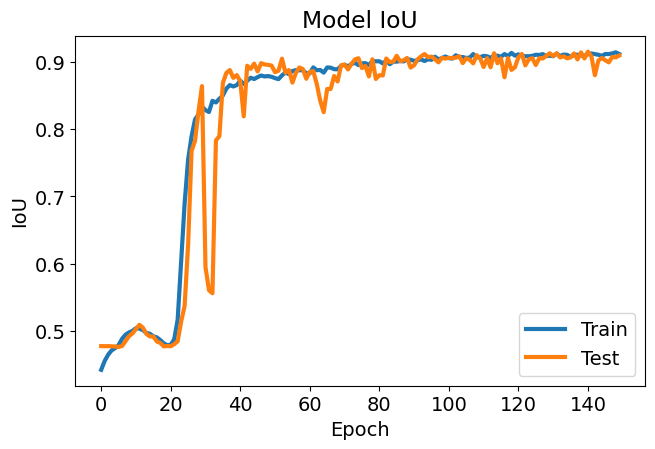

In [111]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history5['train_miou']]
val_miou = [x.cpu().numpy() for x in history5['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


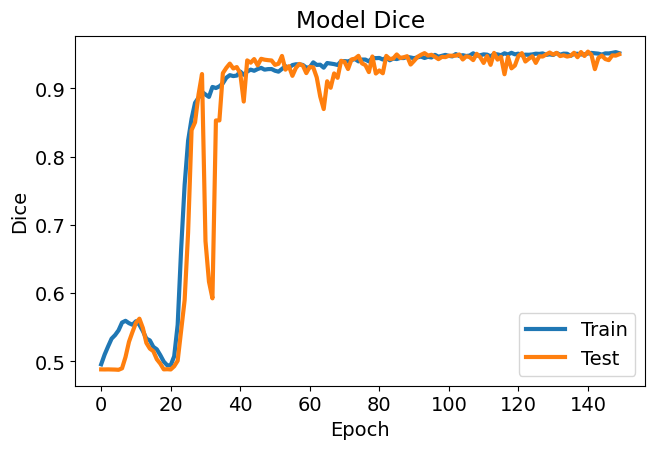

In [112]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history5['train_dice']]
val_miou = [x.cpu().numpy() for x in history5['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


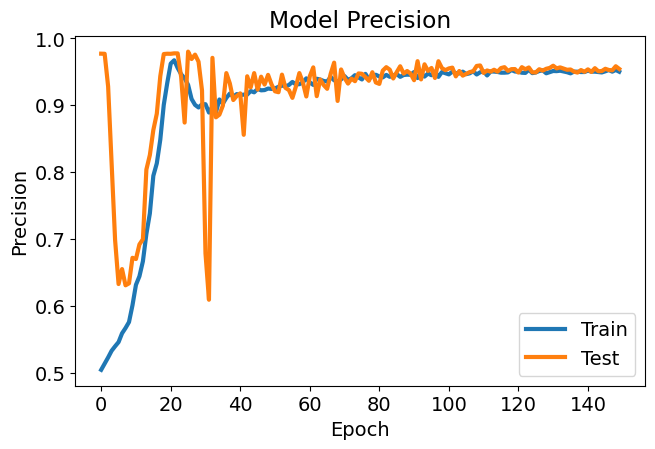

In [113]:
trainX = [x.cpu().numpy() for x in history5['train_Precision']]
valX = [x.cpu().numpy() for x in history5['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

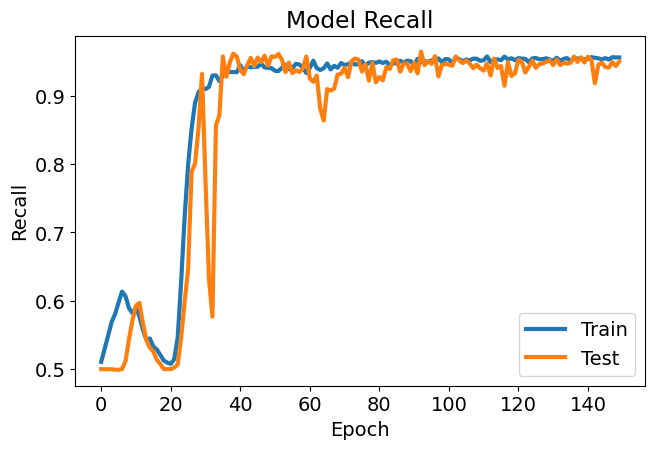

In [114]:
trainX = [x.cpu().numpy() for x in history5['train_recall']]
valX = [x.cpu().numpy() for x in history5['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

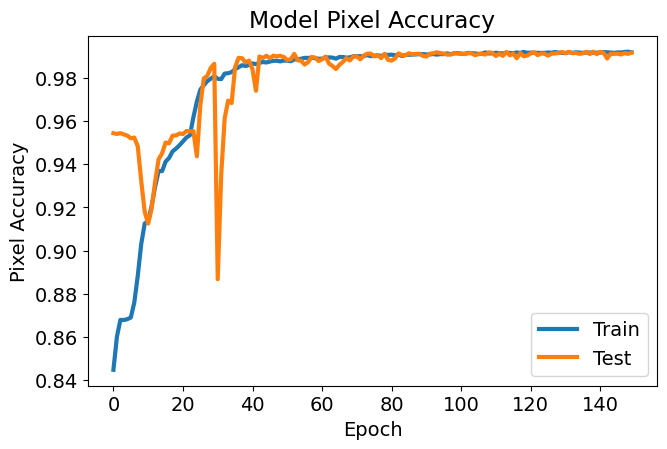

In [115]:
trainX = [x.cpu().numpy() for x in history5['train_acc']]
valX = [x.cpu().numpy() for x in history5['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

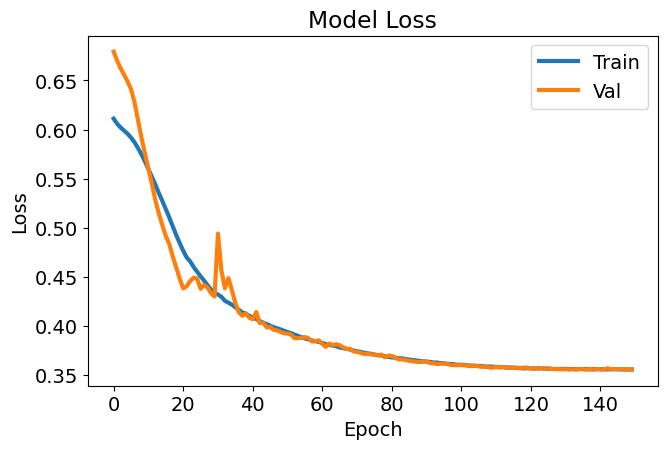

In [116]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history5['train_loss'])
plt.plot(history5['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [117]:
mob_miou = miou_score(model5, test_set)
dice_miou = dice_score_model(model5, test_set)
mob_acc = pixel_acc(model5, test_set)

100%|██████████| 61/61 [00:00<00:00, 61.71it/s]


In [118]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.9129912367877259
0.9517865358855437
0.9919033363217213


100%|██████████| 61/61 [00:00<00:00, 68.78it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


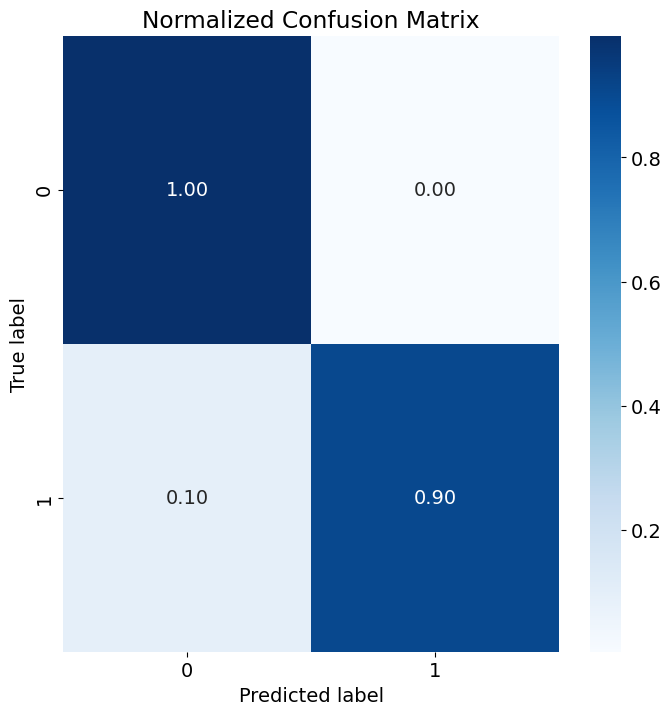

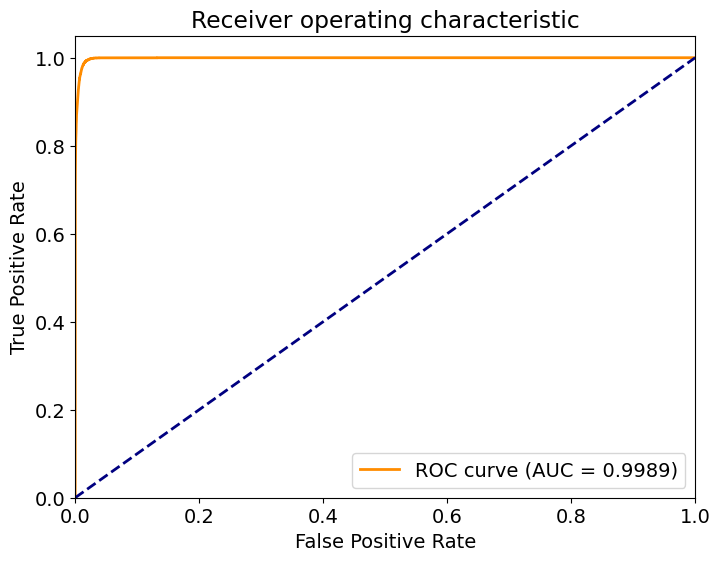

In [119]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model5, test_set)

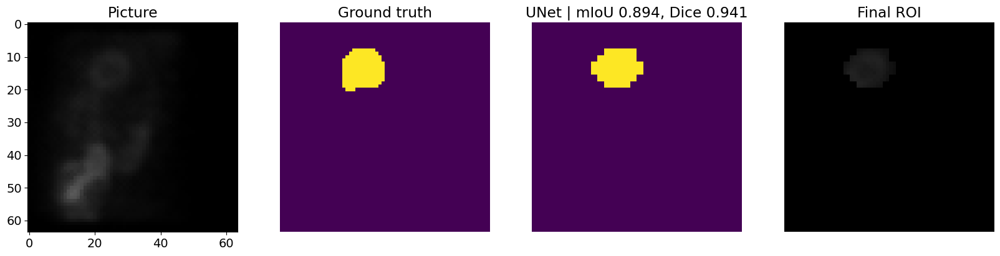

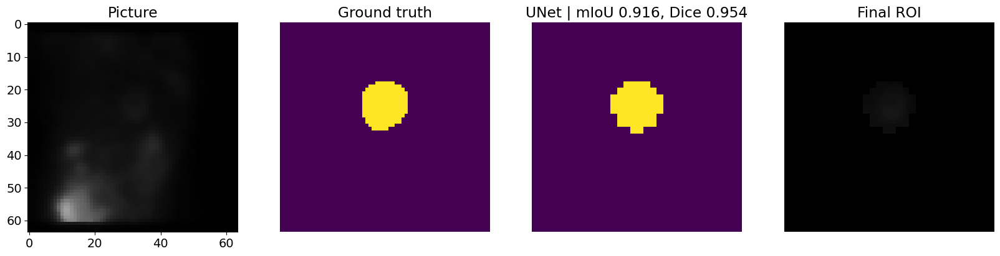

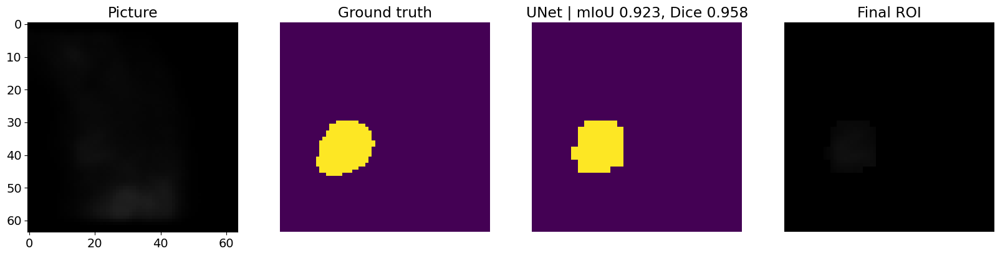

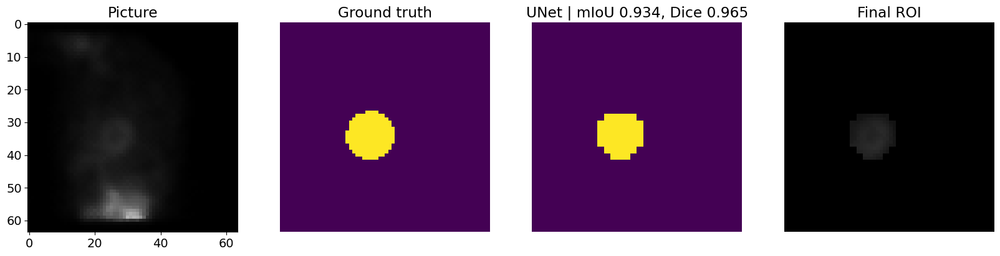

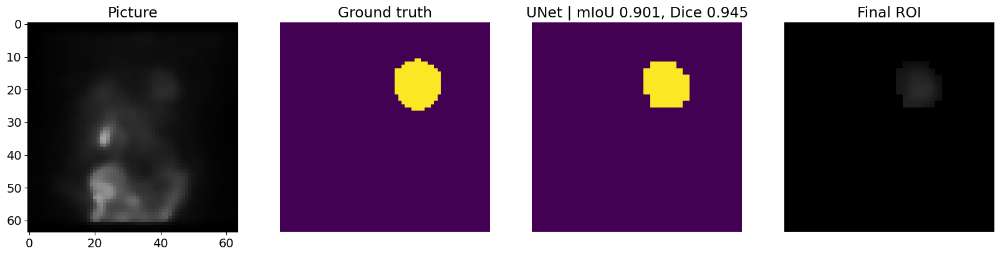

...

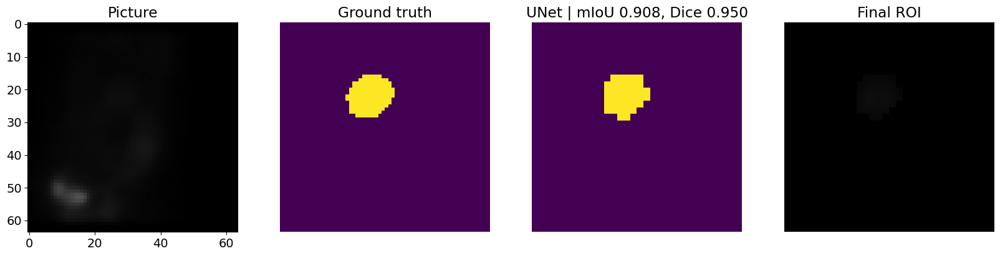

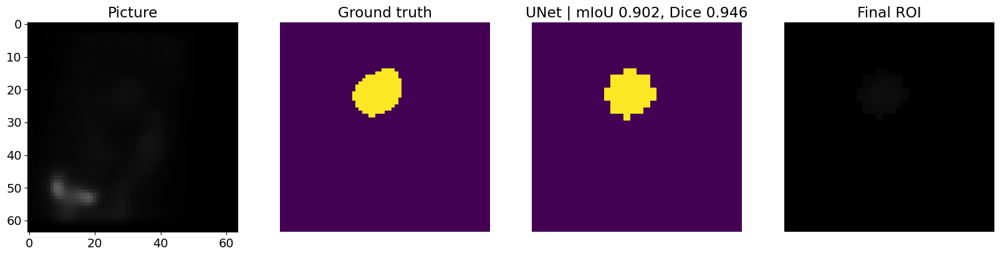

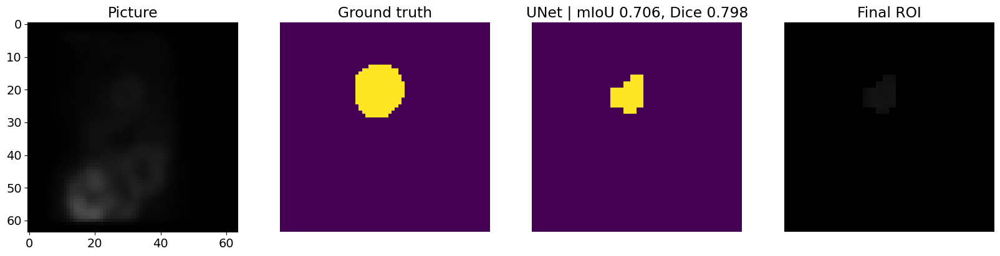

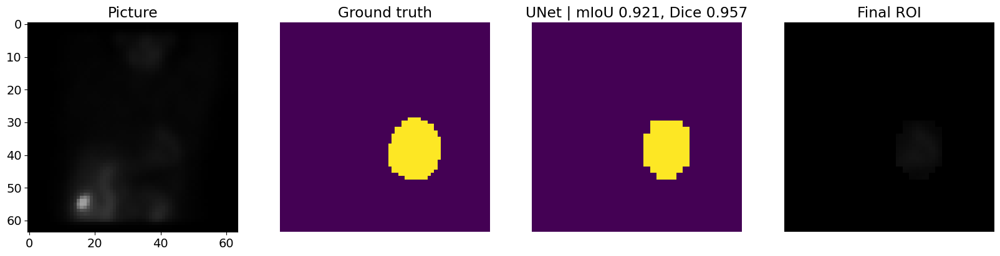

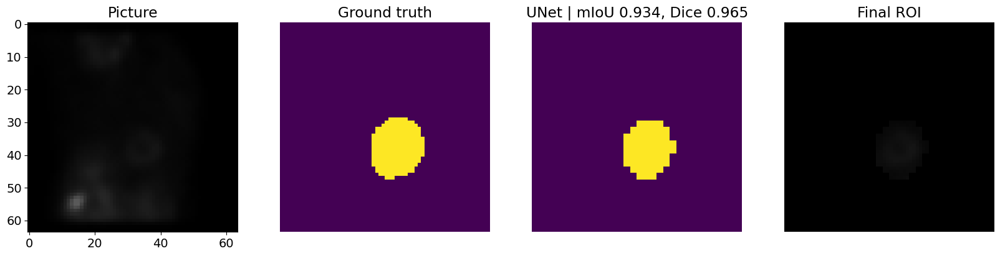

In [120]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model5, image, mask)
    pred_mask, score = predict_image_mask_miou(model5, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# Ensemble

In [121]:
import torchvision.transforms as T

def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()

    # Define transformations
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])

    # Apply transformations
    image = t(image).to(device)
    mask = mask.to(device)

    with torch.no_grad():
        image = image.unsqueeze(0)  # Add batch dimension
        mask = mask.unsqueeze(0)    # Add batch dimension

        output = model(image)
        score = mIoU(output, mask)  # Assuming mIoU is defined elsewhere
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)  # Remove batch dimension and move to CPU

    return masked, score
import torch
import torch.nn as nn
import torch.nn.functional as F

class EnsembleModel(nn.Module):
    def __init__(self, model1, model2, model3, model4,model5):
        super(EnsembleModel, self).__init__()
        self.model1 = model1
        self.model2 = model2
        self.model3 = model3
        self.model4 = model4
        self.model5 = model5

    def forward(self, x):
        with torch.no_grad():
            output1 = self.model1(x)
            output2 = self.model2(x)
            output3 = self.model3(x)
            output4 = self.model4(x)
            output5 = self.model5(x)

        # Averaging the predictions
        avg_output = (output1 + output2 + 2*output3 + 3*output4++ output5) / 8.0
        return avg_output


In [122]:
model.eval()
model2.eval()
model3.eval()
model4.eval()
model5.eval()

UNet5(
  (encoder1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (encoder2): Sequential(
    (0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequentia

In [123]:
# Create the ensemble model
ensemble_model = EnsembleModel(model, model2, model3, model4, model5).to(device)

In [ ]:
# This code is only if the models are saved and stored in drive:
# Example usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Load model weights
model1_path = '/content/drive/MyDrive/Unet-VGGAhmad.pt'
model2_path = '/content/drive/MyDrive/Unet-Mobilenet_v2_Ahmad.pt'
model3_path = '/content/drive/MyDrive/Unet-VGGATT_Ahmad.pt'
model4_path = '/content/drive/MyDrive/Unet-InceptionAhmad.pt'
model5_path = '/content/drive/MyDrive/Unet-ResNetAttentionAhmad.pt'

# Assuming the models were saved as entire objects
model1 = torch.load(model1_path, map_location=device)
model2 = torch.load(model2_path, map_location=device)
model3 = torch.load(model3_path, map_location=device)
model4 = torch.load(model4_path, map_location=device)
model5 = torch.load(model5_path, map_location=device)

# Set models to evaluation mode
model1.eval()
model2.eval()
model3.eval()
model4.eval()
model5.eval()
# Create the ensemble model
ensemble_model = EnsembleModel(model1, model2, model3, model4, model5).to(device)

In [ ]:
ensemble_model

EnsembleModel(
  (model1): UNet(
    (max_pool_2x2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (down_conv_1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (down_conv_2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  

In [124]:
# Run the test
mob_miou = miou_score(ensemble_model, test_set)
dice_miou = dice_score_model(ensemble_model, test_set)
mob_acc = pixel_acc(ensemble_model, test_set)

100%|██████████| 61/61 [00:03<00:00, 15.70it/s]


In [125]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.939805727522385
0.9679383481367004
0.9944848232581968


100%|██████████| 61/61 [00:02<00:00, 20.77it/s]


y_true shape: (249856,)
y_pred shape: (249856,)
y_score shape: (249856,)


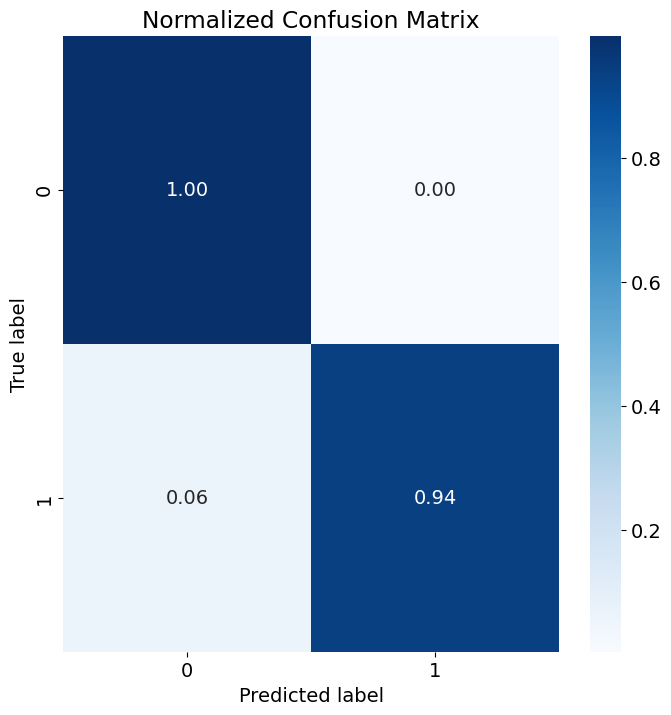

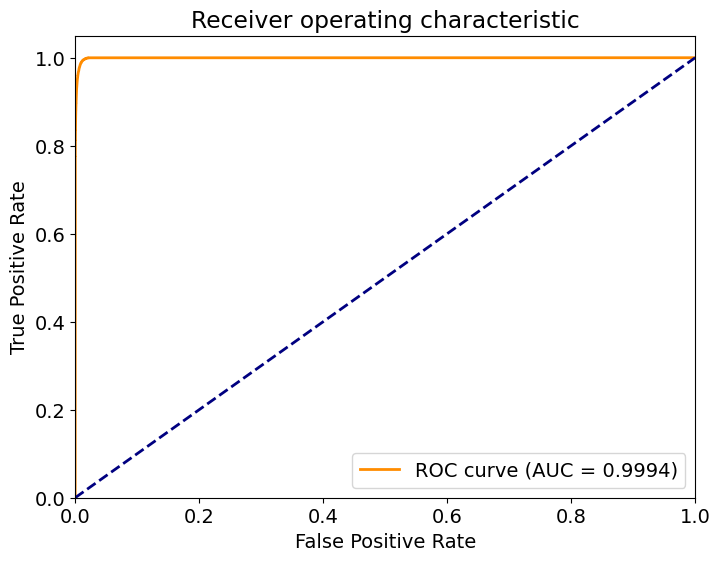

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(ensemble_model, test_set)

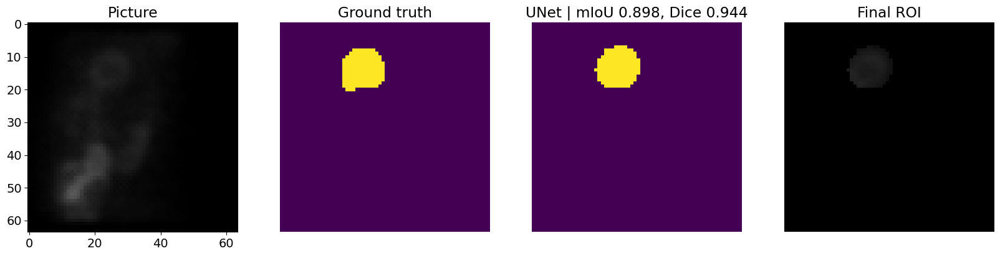

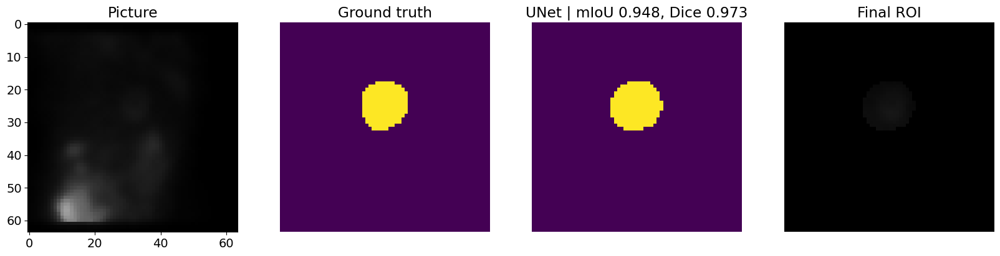

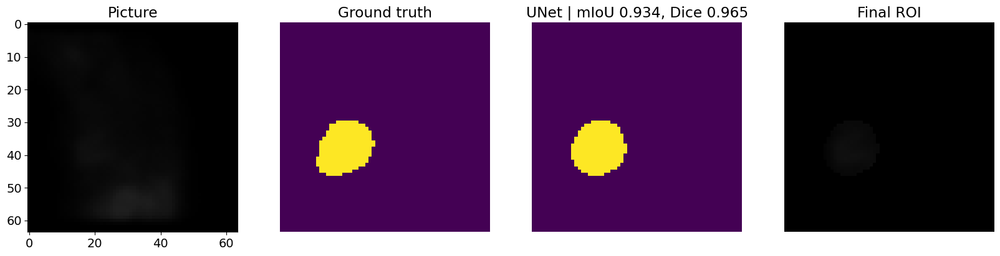

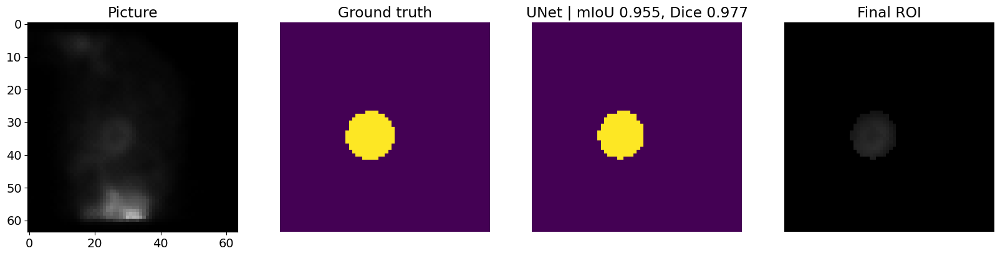

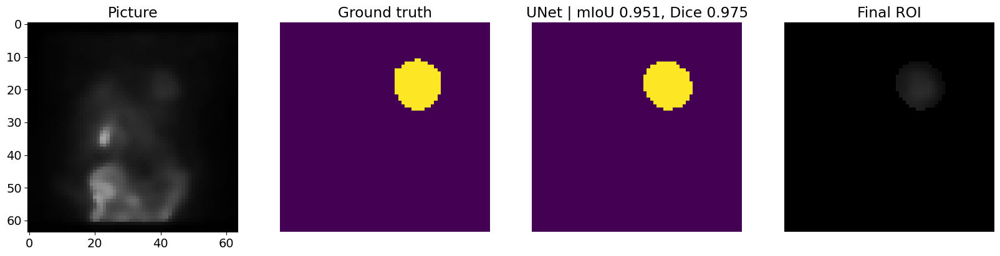

...

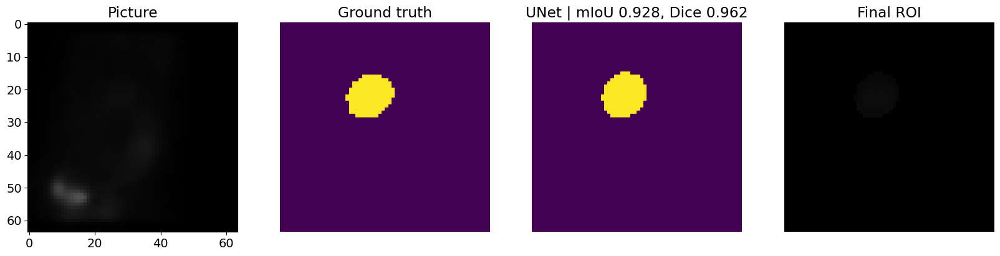

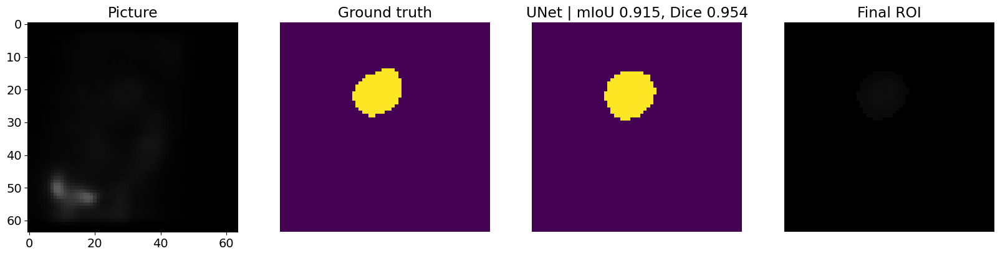

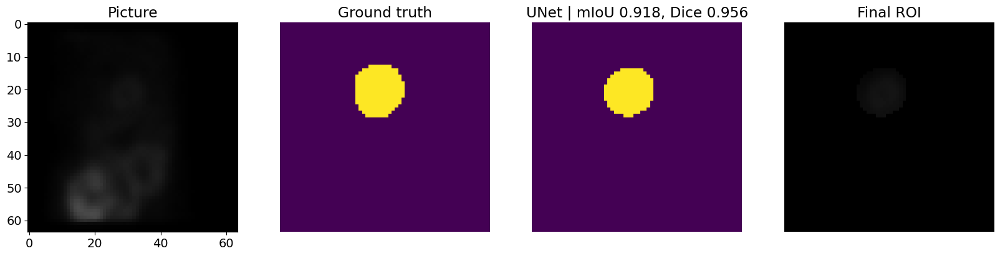

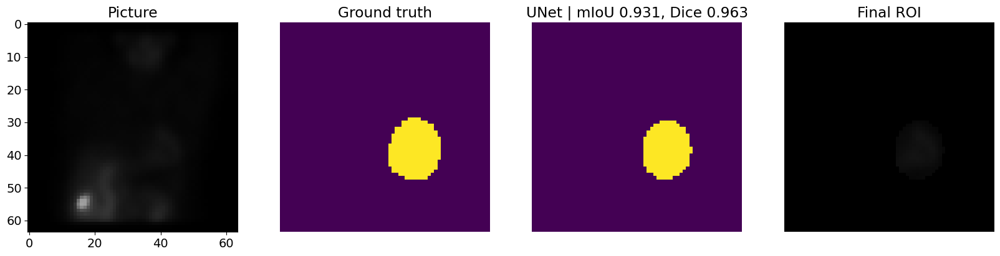

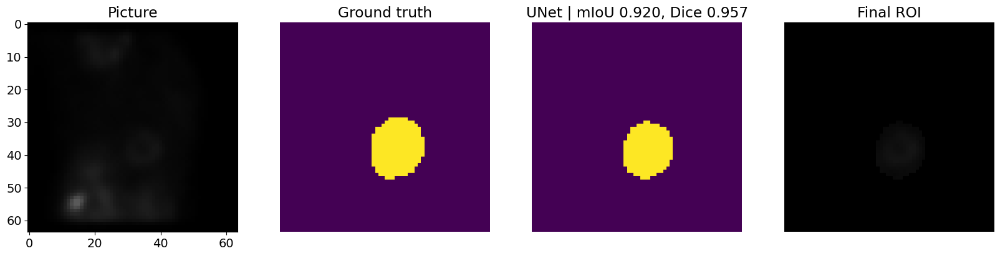

In [127]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(ensemble_model, image, mask)
    pred_mask, score = predict_image_mask_miou(ensemble_model, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)


# IncpetionV3

In [ ]:
# Example usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model41 = UNet4(num_classes=2).to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
max_lr = 1e-4
epoch = 150
weight_decay = 1e-6

#criterion = nn.CrossEntropyLoss()
criterion = TverskyLoss(activation='softmax')
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model41.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history4 = fit(epoch, model41, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/4 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Loss Decreasing.. inf >> 0.642 
Epoch:1/150.. Train Loss: 0.641.. Val Loss: 0.642.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.498.. Val Dice: 0.488.. Train Precision:0.501.. Val Precision: 0.476.. Train Recall:0.501.. Val Recall: 0.500.. Train Accuracy:0.934.. Val Accuracy:0.951.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Loss Decreasing.. 0.642 >> 0.641 
Epoch:2/150.. Train Loss: 0.641.. Val Loss: 0.641.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.494.. Val Dice: 0.488.. Train Precision:0.498.. Val Precision: 0.476.. Train Recall:0.499.. Val Recall: 0.500.. Train Accuracy:0.940.. Val Accuracy:0.952.. Time: 0.17m


100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.641 >> 0.641 
Epoch:3/150.. Train Loss: 0.641.. Val Loss: 0.641.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.491.. Val Dice: 0.488.. Train Precision:0.494.. Val Precision: 0.476.. Train Recall:0.499.. Val Recall: 0.500.. Train Accuracy:0.944.. Val Accuracy:0.952.. Time: 0.17m


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Loss Decreasing.. 0.641 >> 0.641 
saving model...
Epoch:4/150.. Train Loss: 0.640.. Val Loss: 0.641.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.489.. Val Dice: 0.488.. Train Precision:0.492.. Val Precision: 0.476.. Train Recall:0.499.. Val Recall: 0.500.. Train Accuracy:0.947.. Val Accuracy:0.952.. Time: 0.18m


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Loss Decreasing.. 0.641 >> 0.641 
Epoch:5/150.. Train Loss: 0.640.. Val Loss: 0.641.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.487.. Val Precision: 0.476.. Train Recall:0.499.. Val Recall: 0.500.. Train Accuracy:0.949.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Loss Decreasing.. 0.641 >> 0.640 
Epoch:6/150.. Train Loss: 0.639.. Val Loss: 0.640.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.483.. Val Precision: 0.476.. Train Recall:0.499.. Val Recall: 0.500.. Train Accuracy:0.950.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Loss Decreasing.. 0.640 >> 0.640 
Epoch:7/150.. Train Loss: 0.639.. Val Loss: 0.640.. Train mIoU:0.475.. Val mIoU: 0.476.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.480.. Val Precision: 0.476.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.951.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Loss Decreasing.. 0.640 >> 0.640 
Epoch:8/150.. Train Loss: 0.639.. Val Loss: 0.640.. Train mIoU:0.476.. Val mIoU: 0.476.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.476.. Val Precision: 0.476.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.951.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Loss Decreasing.. 0.640 >> 0.639 
saving model...
Epoch:9/150.. Train Loss: 0.639.. Val Loss: 0.639.. Train mIoU:0.476.. Val mIoU: 0.476.. Train Dice:0.487.. Val Dice: 0.488.. Train Precision:0.479.. Val Precision: 0.976.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.951.. Val Accuracy:0.952.. Time: 0.18m


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Loss Decreasing.. 0.639 >> 0.639 
Epoch:10/150.. Train Loss: 0.638.. Val Loss: 0.639.. Train mIoU:0.476.. Val mIoU: 0.476.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.476.. Val Precision: 0.976.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.951.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Loss Decreasing.. 0.639 >> 0.638 
Epoch:11/150.. Train Loss: 0.638.. Val Loss: 0.638.. Train mIoU:0.476.. Val mIoU: 0.476.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.476.. Val Precision: 0.976.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.951.. Val Accuracy:0.952.. Time: 0.16m


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Loss Decreasing.. 0.638 >> 0.638 
Epoch:12/150.. Train Loss: 0.638.. Val Loss: 0.638.. Train mIoU:0.476.. Val mIoU: 0.476.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.476.. Val Precision: 0.976.. Train Recall:0.500.. Val Recall: 0.500.. Train Accuracy:0.952.. Val Accuracy:0.952.. Time: 0.16m


 75%|███████▌  | 3/4 [00:08<00:02,  2.64s/it]

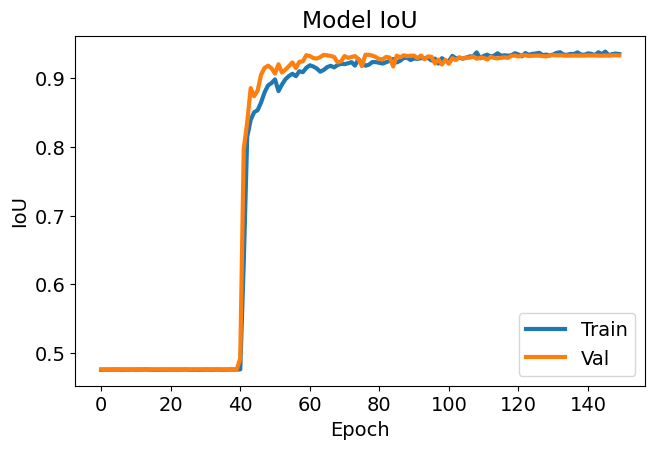

In [ ]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_miou'])
plt.plot(history4['val_miou'])
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')
plt.show()

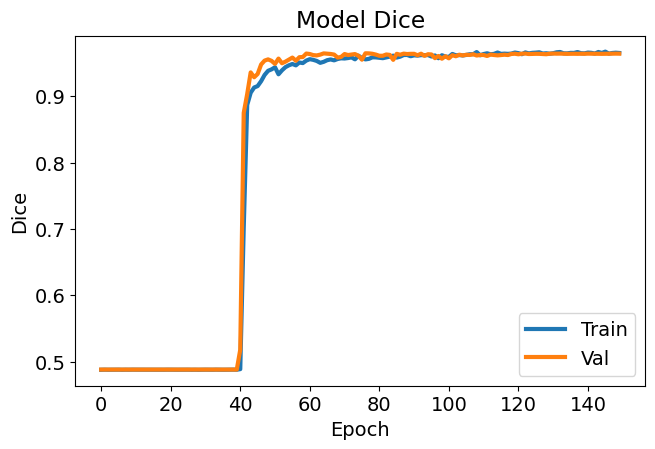

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_dice'])
plt.plot(history4['val_dice'])
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')

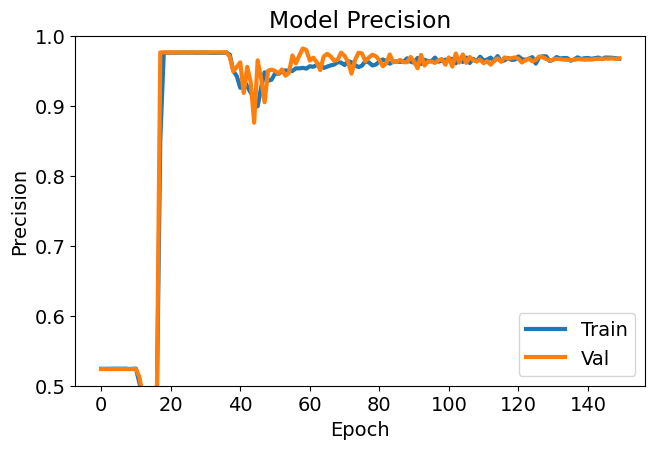

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(25, 10))

# Plotting the precision values
plt.subplot(2, 3, 1)
plt.plot(history4['train_Precision'])
plt.plot(history4['val_Precision'])
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')

# Set y-axis limits
plt.ylim(0.5, 1)

# Show the plot
plt.show()


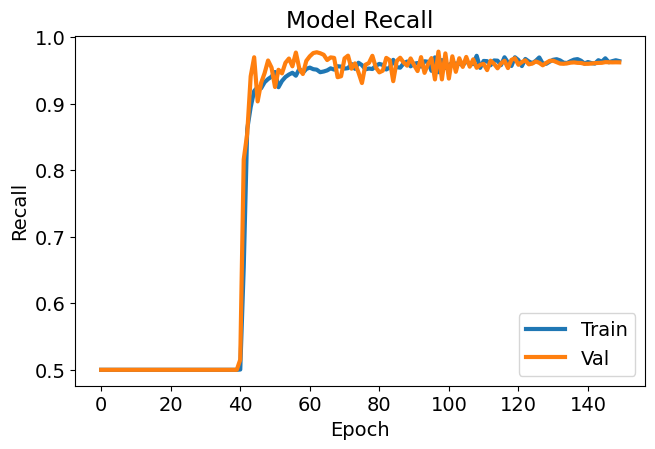

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_recall'])
plt.plot(history4['val_recall'])
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')

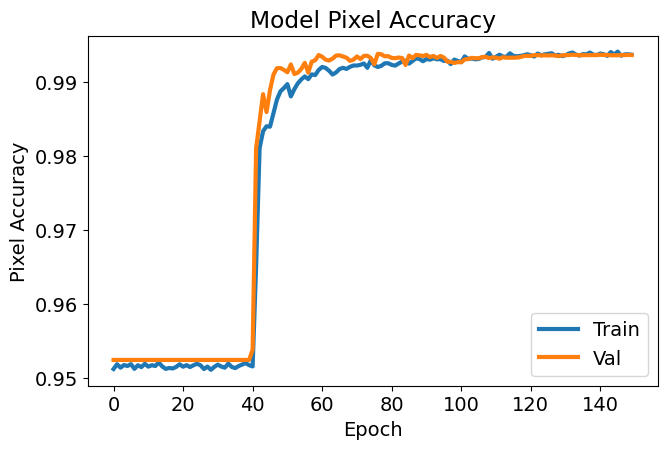

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_acc'])
plt.plot(history4['val_acc'])
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')

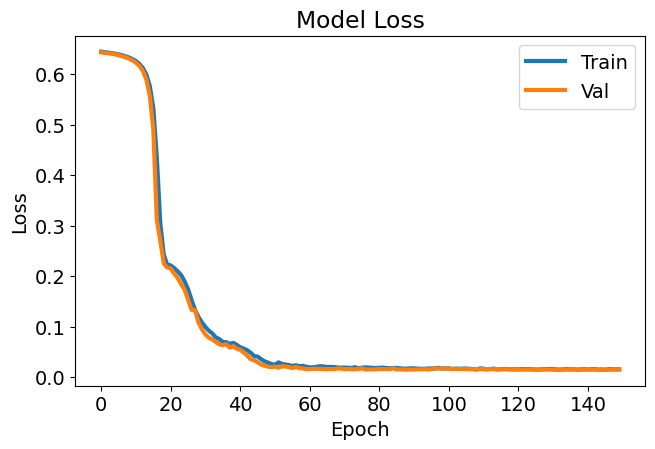

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history4['train_loss'])
plt.plot(history4['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')

In [ ]:
mob_miou = miou_score(model4, test_set)
dice_miou = dice_score_model(model4, test_set)
mob_acc = pixel_acc(model4, test_set)

100%|██████████| 49/49 [00:01<00:00, 27.15it/s]


In [ ]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.9327542237994736
0.9636191600650941
0.9935875717474489


100%|██████████| 49/49 [00:01<00:00, 39.30it/s]


y_true shape: (200704,)
y_pred shape: (200704,)
y_score shape: (200704,)


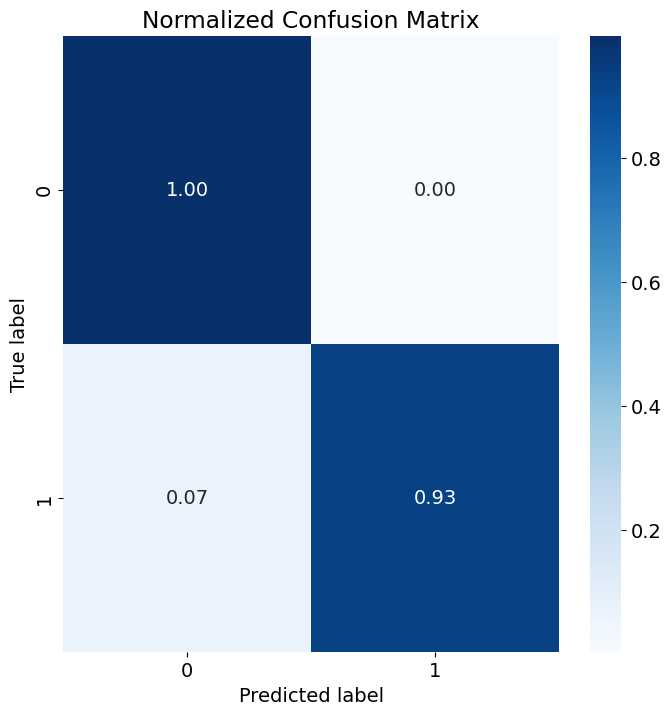

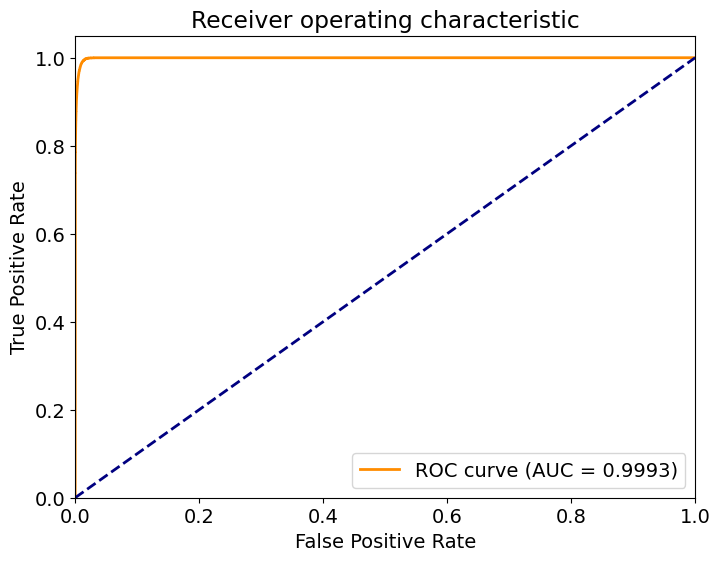

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import transforms as T
from itertools import cycle

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt=".2f" if normalize else "d", cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# ROC Curve for binary classification
def plot_binary_roc_curve(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = {0:0.4f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Evaluate the model and plot confusion matrix and ROC curve
def evaluate_model_binary_roc(model, test_set):
    y_true = []
    y_pred = []
    y_score = []

    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]

        # Convert image to tensor
        t = T.Compose([T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        img = t(img)

        img = img.to(device)
        mask = mask.to(device)

        model.eval()
        with torch.no_grad():
            img = img.unsqueeze(0)
            output = model(img)
            prob = F.softmax(output, dim=1).cpu().numpy()
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze()

        y_true.extend((mask.cpu().numpy().flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_pred.extend((pred.flatten() == 1).astype(int))  # Transform to binary (1 vs. others)
        y_score.extend(prob[:, 1].flatten())  # Use probability of class 1

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_score = np.array(y_score).flatten()

    # Ensure y_score is flattened correctly
    if y_score.ndim == 2:
        y_score = y_score.flatten()

    # Debugging shapes
    print(f'y_true shape: {y_true.shape}')
    print(f'y_pred shape: {y_pred.shape}')
    print(f'y_score shape: {y_score.shape}')

    # Plot Confusion Matrix
    plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=True, title='Normalized Confusion Matrix')

    # Plot ROC Curve
    plot_binary_roc_curve(y_true, y_score)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test, X_test_mask, transform=t_test)
evaluate_model_binary_roc(model4, test_set)

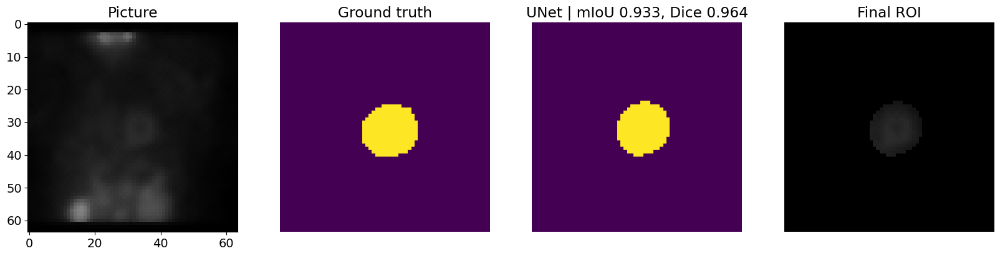

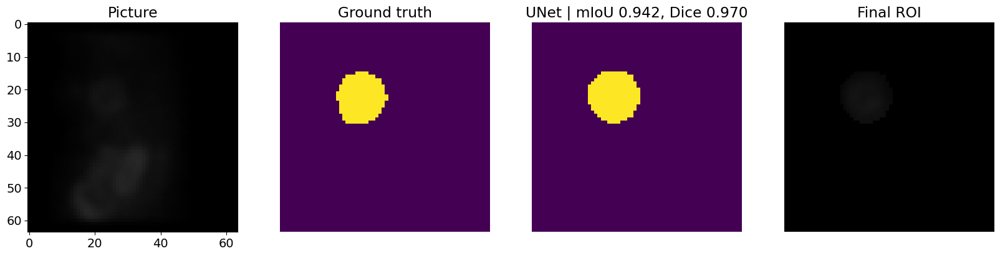

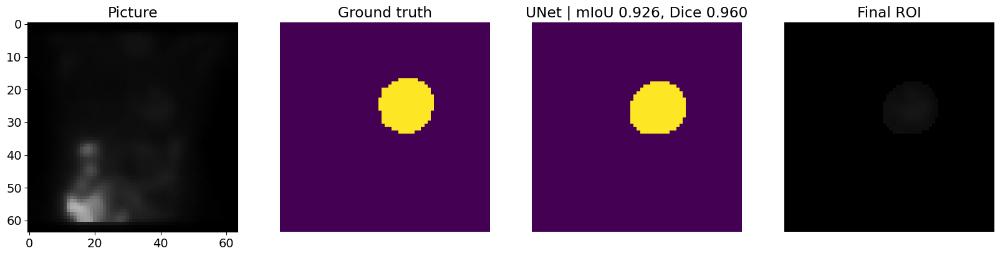

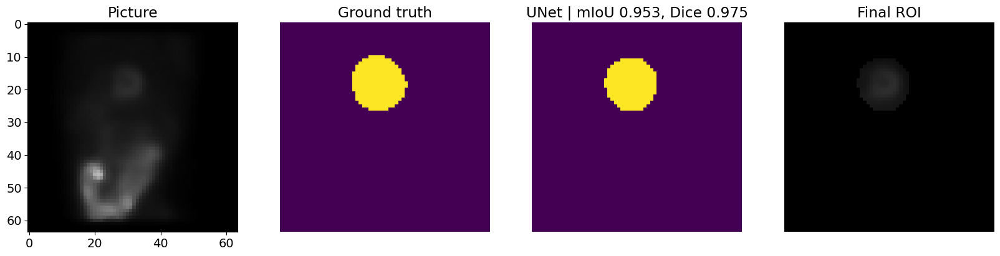

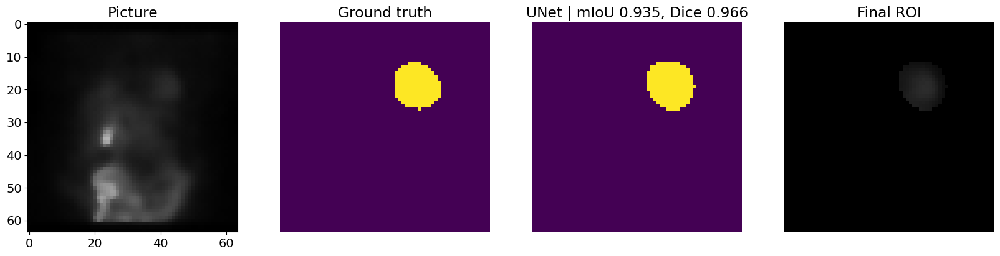

...

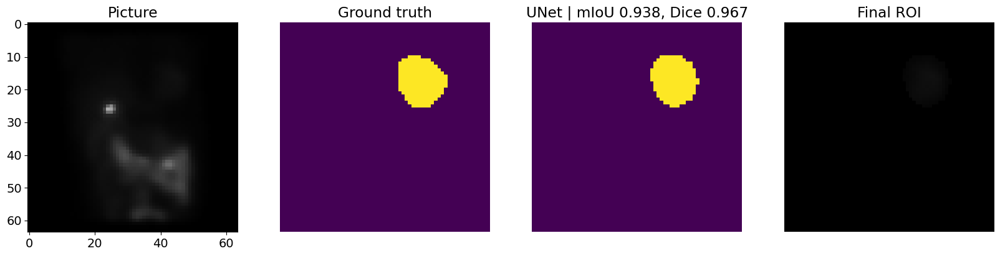

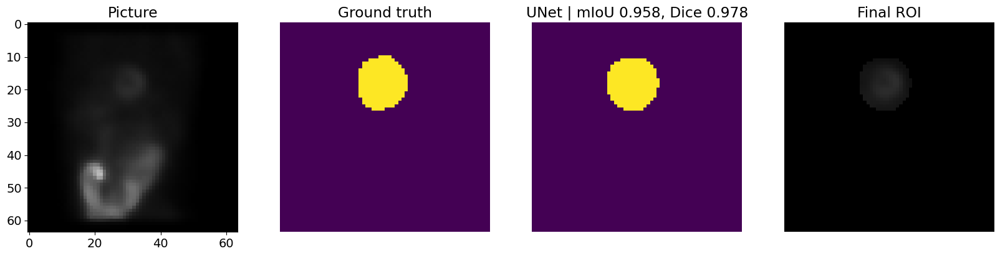

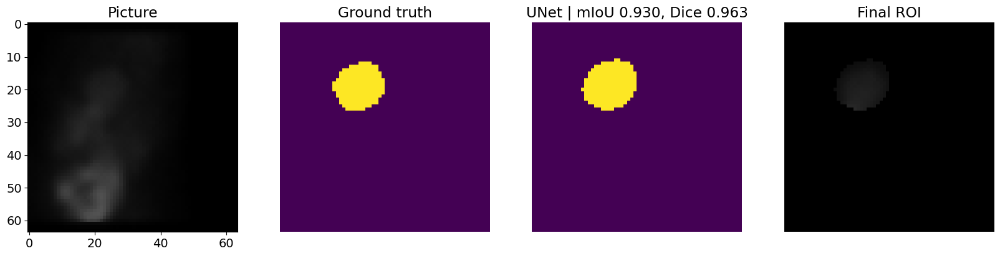

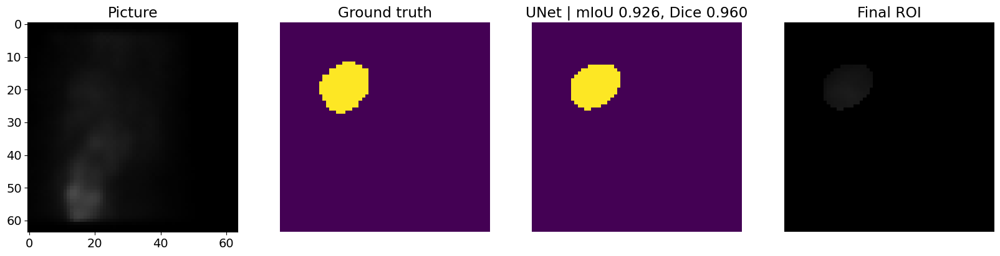

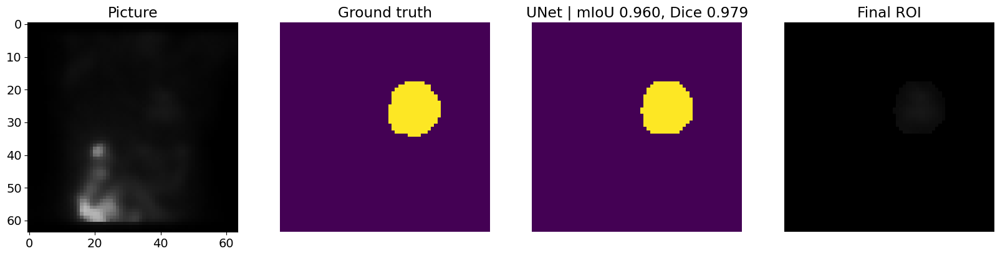

In [ ]:
# Loop through images 0 to 10
for i in range(20):
    image, mask = test_set[i]
    pred_mask, Dscore = predict_image_mask_dice(model4, image, mask)
    pred_mask, score = predict_image_mask_miou(model4, image, mask)

    # Convert the predicted mask to numpy array if it is a tensor
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu().numpy()

    # Filter out small regions and keep only the largest component
    filtered_pred_mask = filter_largest_component(pred_mask)

    # Plot results
    plot_results(image, mask, filtered_pred_mask, score, Dscore)
